# AlphaPept Systems Check

This notebook will run several tests and compare the performance to MaxQuant. Depending on the machine, this can take several hours.
Each run is called via the `test_ci.py` script, which downloads files to a temporary folder which can be specified in this file.

This notebook requires the `matplotlib_venn` (`!pip install matplotlib_venn`) package.

## Reference Data

Download MaxQuant reference files. Referance MaxQuant data from `PXD006109` and `PXD010012` were taken from the paper, the others were analyzed with `MaxQuant_1.6.14`, default settings w/o second peptides and provided with the given contaminants file.

In [1]:
import os
import sys
sys.path.append(os.path.join(".."))
import test_ci
from test_ci import config_test_paths

try:
    import wget
except ImportError:
    !pip install wget
    import wget
    
FILE_DICT = {}
#FILE_DICT['PXD006109_ref.txt'] = 'https://datashare.biochem.mpg.de/s/1E2G1IwgcgdsCHC/download' #OLD MQ FILES
#FILE_DICT['PXD006109_ref_evd.txt'] = 'https://datashare.biochem.mpg.de/s/Fn2uxeYNL60JSd3/download'

#FILE_DICT['PXD006109_ref.txt'] = 'https://datashare.biochem.mpg.de/s/vMNferEoSoROJbb/download' #AP Files
#FILE_DICT['PXD006109_ref_evd.txt'] = 'https://datashare.biochem.mpg.de/s/KLBotZbodMByigh/download'

FILE_DICT['PXD006109_ref.txt'] = 'https://datashare.biochem.mpg.de/s/fLhxQ8mVb29x9xH/download'
FILE_DICT['PXD006109_ref_evd.txt'] = 'https://datashare.biochem.mpg.de/s/BkMMHPregCQgKLg/download'
FILE_DICT['PXD010012_ref.txt'] = 'https://datashare.biochem.mpg.de/s/ps226k7Fme1K0jf/download'
FILE_DICT['PXD010012_ref_evd.txt'] = 'https://datashare.biochem.mpg.de/s/pyhKMrytjdDU2sX/download'
FILE_DICT['bruker_HeLa_evd.txt'] = 'https://datashare.biochem.mpg.de/s/fRcoGuwlcbH2SBJ/download'
FILE_DICT['thermo_HeLa_evd.txt'] = 'https://datashare.biochem.mpg.de/s/p4Omj9K5hHmSoDl/download'

FILE_DICT['PXD015087_ref.txt'] = 'https://datashare.biochem.mpg.de/s/GIdgji3408UvS07/download'
FILE_DICT['PXD015087_ref_evd.txt'] = 'https://datashare.biochem.mpg.de/s/eMuNLE2yjNbmiSi/download'
FILE_DICT['PXD015087_ref_evd_singlerun.txt'] = 'https://datashare.biochem.mpg.de/s/0QxM7eR7VDg1rFK/download'

tmp_folder = os.path.join(os.getcwd(),'temp/')

BASE_DIR = os.path.join(tmp_folder , 'test_files') # Storarge location for test files
TEST_DIR = os.path.join(tmp_folder,'test_temp')
ARCHIVE_DIR = os.path.join(tmp_folder,  os.path.sep, 'test_archive', os.path.sep)

MONGODB_USER = 'github_actions'
MONGODB_URL = 'ci.yue0n.mongodb.net/'

if not os.path.isdir(tmp_folder):
    os.mkdir(tmp_folder)

test_ci.config_test_paths(BASE_DIR, TEST_DIR, ARCHIVE_DIR, MONGODB_USER, MONGODB_URL)


for file in FILE_DICT:
    target = os.path.join(tmp_folder, file)
    if not os.path.isfile(target):
        wget.download(FILE_DICT[file], target)
        
software_1 = 'AlphaPept'
software_2 = 'MaxQuant'

## Single Files

Compare to the single HeLa test files

In [2]:
%run -i ../test_ci.py $tmp_folder thermo_irt

2023-07-12 18:02:07> Logging to C:\Users\admin\alphapept\logs\log_20230712180207.txt.
2023-07-12 18:02:07> Code location f:\projects\alphapept\alphapept
2023-07-12 18:02:07> Python location C:\ProgramData\Miniconda3\envs\alphapept\python.exe
2023-07-12 18:02:07> Platform information:
2023-07-12 18:02:07> system     - Windows
2023-07-12 18:02:07> release    - 10
2023-07-12 18:02:07> version    - 10.0.19044
2023-07-12 18:02:07> machine    - AMD64
2023-07-12 18:02:07> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 18:02:07> cpu count  - 24
2023-07-12 18:02:07> ram memory - 112.4/127.7 Gb (available/total)
2023-07-12 18:02:07> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 18:02:08> Python information:
2023-07-12 18:02:08> SQLAlchemy                    - 1.4.39
2023-07-12 18:02:08> alphapept                     - 0.5.0
2023-07-12 18:02:08> alpharaw                      - 0.1.0
2023-07-12 18:02:08> alphatims                     - 1.0.7

  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:02:08> FASTA contains 247 entries.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:37<00:00, 37.92s/it]

2023-07-12 18:02:46> Digested 247 proteins and generated 49,350 spectra
2023-07-12 18:02:47> Database saved to F:\projects\alphapept\sandbox\temp\test_temp\database.hdf. Filesize of database is 0.02 GB


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:38<00:00, 38.78s/it]

2023-07-12 18:02:47> ==== import_raw_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:02:47> Processing 1 files for step raw_conversion
2023-07-12 18:02:47> File F:\projects\alphapept\sandbox\temp/test_temp\thermo_IRT has extension .raw - converting from Thermo.
2023-07-12 18:02:51> File conversion complete. Extracted 2,603 precursors.
2023-07-12 18:02:51> File conversion of file F:\projects\alphapept\sandbox\temp/test_temp\thermo_IRT.raw complete.


  0%|                                                                                                                                                                | 0/1 [00:04<?, ?it/s]

2023-07-12 18:02:51> ==== feature_finding ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:02:53> Processing 1 files for step find_features
2023-07-12 18:02:53> No *.hdf file with features found for F:\projects\alphapept\sandbox\temp/test_temp\thermo_IRT.ms_data.hdf. Adding to feature finding list.
2023-07-12 18:02:53> Feature finding on F:\projects\alphapept\sandbox\temp/test_temp\thermo_IRT.raw
2023-07-12 18:02:53> Hill extraction with centroid_tol 8 and max_gap 2
2023-07-12 18:02:57> Number of hills 45,516, len = 20.18
2023-07-12 18:02:57> Repeating hill extraction with centroid_tol 5.10
2023-07-12 18:02:58> Number of hills 52,919, len = 21.29
2023-07-12 18:03:01> After duplicate removal of hills 43,950
2023-07-12 18:03:08> After split hill_ptrs 61,693
2023-07-12 18:03:09> After filter hill_ptrs 60,175
2023-07-12 18:03:21> Extracting hill stats complete
2023-07-12 18:03:23> Found 7,045 pre isotope patterns.
2023-07-12 18:03:42> Extracted 6,428 isotope patterns.
2023-07-12 18:03:51> Report complete.
2023-07-12 18:03:51> Matching features to query data.
2023-0

  0%|                                                                                                                                                                | 0/1 [00:57<?, ?it/s]

2023-07-12 18:03:51> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:03:51> Starting first search.
2023-07-12 18:03:51> Processing 1 files for step search_db
2023-07-12 18:03:51> Calibrating fragments
2023-07-12 18:03:52> Performing search on 2,969 query and 49,350 db entries with frag_tol = 50.00 and prec_tol = 20.00.
2023-07-12 18:03:54> Found 34 psms.
2023-07-12 18:03:54> Extracting columns for scoring.
2023-07-12 18:04:00> Extracted columns from 34 spectra.
2023-07-12 18:04:00> Saving first_search results to F:\projects\alphapept\sandbox\temp/test_temp\thermo_IRT.ms_data.hdf
2023-07-12 18:04:01> Search of file F:\projects\alphapept\sandbox\temp/test_temp\thermo_IRT.raw complete.
2023-07-12 18:04:01> First search complete.


  0%|                                                                                                                                                                | 0/1 [00:09<?, ?it/s]

2023-07-12 18:04:01> ==== recalibrate_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:04:01> Processing 1 files for step calibrate_hdf
2023-07-12 18:04:01> Recalibrating file F:\projects\alphapept\sandbox\temp/test_temp\thermo_IRT.raw.
2023-07-12 18:04:01> Scoring using generic score
2023-07-12 18:04:01> Last q_value 0.000 of dataset is smaller than fdr_level 0.010
2023-07-12 18:04:01> 15 target (0 decoy) of 15 PSMs. FDR 0.000000 for a cutoff of 10.81 (set FDR was 0.01).
2023-07-12 18:04:01> Precursor mass calibration for file F:\projects\alphapept\sandbox\temp/test_temp\thermo_IRT.raw.
2023-07-12 18:04:01> Not enough data points present. Skipping recalibration.
2023-07-12 18:04:01> Precursor calibration of file F:\projects\alphapept\sandbox\temp/test_temp\thermo_IRT.ms_data.hdf complete.
2023-07-12 18:04:01> Starting fragment calibration.
2023-07-12 18:04:01> Calibrating fragments with neighbors
2023-07-12 18:04:01> Scoring using generic score
2023-07-12 18:04:01> Last q_value 0.000 of dataset is smaller than fdr_level 0.010
2023-07-12 18:04:01> 15 target

  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:04:01> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:04:01> Starting second search with DB.
2023-07-12 18:04:01> Processing 1 files for step search_db
2023-07-12 18:04:01> Found calibrated prec_tol with value 9.17
2023-07-12 18:04:01> 'Dataset estimated_max_fragment_ppm does not exist for group / of <HDF_File F:\\projects\\alphapept\\sandbox\\temp\\test_temp\\thermo_IRT.ms_data.hdf>.'
2023-07-12 18:04:01> Performing search on 2,969 query and 49,350 db entries with frag_tol = 50.00 and prec_tol = 9.17.
2023-07-12 18:04:01> Found 33 psms.
2023-07-12 18:04:01> Extracting columns for scoring.
2023-07-12 18:04:02> Extracted columns from 33 spectra.
2023-07-12 18:04:02> Saving second_search results to F:\projects\alphapept\sandbox\temp/test_temp\thermo_IRT.ms_data.hdf
2023-07-12 18:04:02> Search of file F:\projects\alphapept\sandbox\temp/test_temp\thermo_IRT.raw complete.
2023-07-12 18:04:02> Second search complete.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:04:02> ==== score ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:04:02> Processing 1 files for step score_hdf
2023-07-12 18:04:02> Calling score_hdf
2023-07-12 18:04:02> Found second search psms for scoring.
2023-07-12 18:04:02> Last q_value 0.000 of dataset is smaller than fdr_level 0.100
2023-07-12 18:04:02> 15 target (0 decoy) of 15 PSMs. FDR 0.000000 for a cutoff of 10.81 (set FDR was 0.1).
2023-07-12 18:04:02> The total number of available decoys is lower than the initial set of high scoring targets.
2023-07-12 18:04:02> ML failed. Defaulting to morpheus score
2023-07-12 18:04:02> There are fewer high scoring targets or decoys than required by 'min_train'.
2023-07-12 18:04:02> Converting morpheus score to probabilities
2023-07-12 18:04:02> Last q_value 0.000 of dataset is smaller than fdr_level 0.010
2023-07-12 18:04:02> 32 target (0 decoy) of 32 PSMs. FDR 0.000000 for a cutoff of 0.80 (set FDR was 0.01).
2023-07-12 18:04:02> Saving identifications to ms_data file.
2023-07-12 18:04:03> Saving identifications to ms_data file comple

  0%|                                                                                                                                                                | 0/1 [00:01<?, ?it/s]

2023-07-12 18:04:03> ==== isobaric_labeling ====
2023-07-12 18:04:03> ==== protein_grouping ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:04:03> Fasta dict with length 247, Pept dict with length 49,352
2023-07-12 18:04:03> Extracting protein groups.



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:04:03> A total of 11 unique and 0 shared peptides.
2023-07-12 18:04:03> A total of 0 ambigious proteins
2023-07-12 18:04:03> A total of 0 unique and 0 shared peptides.


2023-07-12 18:04:03> A total of 0 ambigious proteins
2023-07-12 18:04:03> Global FDR on protein_group
2023-07-12 18:04:03> Last q_value 0.000 of dataset is smaller than fdr_level 0.010
2023-07-12 18:04:03> 3 target (0 decoy) of 3 PSMs. FDR 0.000000 for a cutoff of 0.88 (set FDR was 0.01).
2023-07-12 18:04:03> Global FDR cutoff at 0.883.
2023-07-12 18:04:04> FDR on proteins complete. For 0.01 FDR found 18 targets and 0 decoys. A total of 3 proteins found.
2023-07-12 18:04:04> Saving complete.
2023-07-12 18:04:04> Protein groups complete.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:04:04> ==== quantification ====
2023-07-12 18:04:04> Reading protein_fdr for quantification.
2023-07-12 18:04:04> Saving protein_groups after delayed normalization to combined_protein_fdr_dn
2023-07-12 18:04:04> Complete.
2023-07-12 18:04:04> Starting profile extraction.



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:04:04> LFQ complete.
2023-07-12 18:04:04> Extracting protein_summary
2023-07-12 18:04:04> Saved protein_summary of length 3 saved to F:\projects\alphapept\sandbox\temp\test_temp\results_protein_summary.csv
2023-07-12 18:04:04> Updating protein_fdr.
2023-07-12 18:04:04> Exporting as csv.
2023-07-12 18:04:04> Saved df of length 18 saved to F:\projects\alphapept\sandbox\temp\test_temp\results


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 14.47it/s]

2023-07-12 18:04:04> ==== export ====


2023-07-12 18:04:04> Settings saved to F:\projects\alphapept\sandbox\temp\test_temp\results.yaml
2023-07-12 18:04:04> Analysis complete.


### Thermo HeLa

2023-07-12 18:04:04> Creating dir F:\projects\alphapept\sandbox\temp/test_temp.
2023-07-12 18:04:06> No settings provided. Creating from default settings.
2023-07-12 18:04:06> Platform information:
2023-07-12 18:04:06> system     - Windows
2023-07-12 18:04:06> release    - 10
2023-07-12 18:04:06> version    - 10.0.19044
2023-07-12 18:04:06> machine    - AMD64
2023-07-12 18:04:06> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 18:04:06> cpu count  - 24
2023-07-12 18:04:06> ram memory - 116.8/127.7 Gb (available/total)
2023-07-12 18:04:06> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 18:04:06> Python information:
2023-07-12 18:04:06> SQLAlchemy                    - 1.4.39
2023-07-12 18:04:06> alphapept                     - 0.5.0
2023-07-12 18:04:06> alpharaw                      - 0.1.0
2023-07-12 18:04:06> alphatims                     - 1.0.7
2023-07-12 18:04:06> biopython                     - 1.79
2023-07-12 18:04:06> bumpver

2023-07-12 18:04:07> 
2023-07-12 18:04:07> Checking if files exist.
2023-07-12 18:04:07> FASTA Files have a total size of 21.952 Mb
2023-07-12 18:04:07> Workflow has 11 steps
2023-07-12 18:04:07> ==== create_database ====
2023-07-12 18:04:07> Database path F:\projects\alphapept\sandbox\temp\test_temp\database.hdf is not a file.
2023-07-12 18:04:07> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\human.fasta with size 12.97 Mb.
2023-07-12 18:04:07> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\arabidopsis.fasta with size 8.84 Mb.
2023-07-12 18:04:07> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\contaminants.fasta with size 0.15 Mb.
2023-07-12 18:04:07> Creating a new database from FASTA.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:04:08> FASTA contains 36,789 entries.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [02:19<00:00, 34.76s/it]

2023-07-12 18:06:43> Digested 36,789 proteins and generated 8,739,362 spectra
2023-07-12 18:08:00> Database saved to F:\projects\alphapept\sandbox\temp\test_temp\database.hdf. Filesize of database is 3.37 GB


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [03:53<00:00, 233.63s/it]

2023-07-12 18:08:13> ==== import_raw_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:08:13> Processing 1 files for step raw_conversion
2023-07-12 18:08:13> File F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa has extension .raw - converting from Thermo.
2023-07-12 18:10:14> File conversion complete. Extracted 120,226 precursors.
2023-07-12 18:10:15> File conversion of file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw complete.


  0%|                                                                                                                                                                | 0/1 [02:01<?, ?it/s]

2023-07-12 18:10:15> ==== feature_finding ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:10:15> Processing 1 files for step find_features
2023-07-12 18:10:16> No *.hdf file with features found for F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.ms_data.hdf. Adding to feature finding list.
2023-07-12 18:10:16> Feature finding on F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw
2023-07-12 18:10:16> Hill extraction with centroid_tol 8 and max_gap 2
2023-07-12 18:10:20> Number of hills 1,105,353, len = 17.35
2023-07-12 18:10:20> Repeating hill extraction with centroid_tol 5.87
2023-07-12 18:10:24> Number of hills 1,227,331, len = 19.44
2023-07-12 18:10:25> After duplicate removal of hills 1,025,845
2023-07-12 18:10:33> After split hill_ptrs 1,207,373
2023-07-12 18:10:34> After filter hill_ptrs 1,188,406
2023-07-12 18:12:26> Extracting hill stats complete
2023-07-12 18:12:35> Found 184,383 pre isotope patterns.
2023-07-12 18:13:19> Extracted 198,500 isotope patterns.
2023-07-12 18:13:22> Report complete.
2023-07-12 18:13:22> Matching features 

  0%|                                                                                                                                                                | 0/1 [03:08<?, ?it/s]

2023-07-12 18:13:24> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:13:24> Starting first search.
2023-07-12 18:13:24> Processing 1 files for step search_db
2023-07-12 18:13:25> Calibrating fragments


C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


2023-07-12 18:13:37> Performing search on 246,847 query and 8,739,362 db entries with frag_tol = 50.00 and prec_tol = 20.00.
2023-07-12 18:13:48> Found 1,360,555 psms.
2023-07-12 18:13:48> Extracting columns for scoring.
2023-07-12 18:16:34> Extracted columns from 1,360,555 spectra.
2023-07-12 18:16:34> Saving first_search results to F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.ms_data.hdf
2023-07-12 18:16:41> Search of file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw complete.
2023-07-12 18:17:05> First search complete.


  0%|                                                                                                                                                                | 0/1 [03:40<?, ?it/s]

2023-07-12 18:17:05> ==== recalibrate_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:17:05> Processing 1 files for step calibrate_hdf
2023-07-12 18:17:05> Recalibrating file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw.
2023-07-12 18:17:08> Scoring using generic score
2023-07-12 18:17:09> 41,630 target (416 decoy) of 137,363 PSMs. FDR 0.009993 for a cutoff of 12.32 (set FDR was 0.01).
2023-07-12 18:17:09> Precursor mass calibration for file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw.
2023-07-12 18:17:12> Precursor calibration std 0.23, 0.00
2023-07-12 18:17:12> Saving precursor calibration
2023-07-12 18:17:17> Precursor calibration of file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.ms_data.hdf complete.
2023-07-12 18:17:17> Starting fragment calibration.
2023-07-12 18:17:17> Calibrating fragments with neighbors
2023-07-12 18:17:21> Scoring using generic score
2023-07-12 18:17:22> 41,630 target (416 decoy) of 137,363 PSMs. FDR 0.009993 for a cutoff of 12.32 (set FDR was 0.01).
2023-07-12 18:17:25> Minimum hit

  0%|                                                                                                                                                                | 0/1 [01:54<?, ?it/s]

2023-07-12 18:19:00> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:19:00> Starting second search with DB.
2023-07-12 18:19:00> Processing 1 files for step search_db
2023-07-12 18:19:00> Found calibrated prec_tol with value 1.17
2023-07-12 18:19:00> Found calibrated frag_tol with value 32.30
2023-07-12 18:19:02> Performing search on 246,847 query and 8,739,362 db entries with frag_tol = 32.30 and prec_tol = 1.17.
2023-07-12 18:19:04> Found 304,772 psms.
2023-07-12 18:19:05> Extracting columns for scoring.
2023-07-12 18:19:46> Extracted columns from 304,772 spectra.
2023-07-12 18:19:46> Saving second_search results to F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.ms_data.hdf
2023-07-12 18:19:48> Search of file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw complete.
2023-07-12 18:20:12> Second search complete.


  0%|                                                                                                                                                                | 0/1 [01:12<?, ?it/s]

2023-07-12 18:20:12> ==== score ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:20:12> Processing 1 files for step score_hdf
2023-07-12 18:20:12> Calling score_hdf
2023-07-12 18:20:13> Found second search psms for scoring.
2023-07-12 18:20:18> 58,644 target (5,864 decoy) of 81,403 PSMs. FDR 0.099993 for a cutoff of 6.36 (set FDR was 0.1).
2023-07-12 18:20:18> Training & cross-validation on 12,563 targets and 12,562 decoys
2023-07-12 18:20:39> The best parameters selected by 5-fold cross-validation were {'clf__max_depth': 25, 'clf__max_leaf_nodes': 150}
2023-07-12 18:20:39> The train accuracy was 0.933
2023-07-12 18:20:39> Testing on 50,250 targets and 50,251 decoys
2023-07-12 18:20:40> The test accuracy was 0.911
2023-07-12 18:20:40> ML Top features
2023-07-12 18:20:40> 1	generic_score                  0.2106
2023-07-12 18:20:40> 2	hits_y                         0.2100
2023-07-12 18:20:40> 3	x_tandem                       0.1197
2023-07-12 18:20:40> 4	hits                           0.0979
2023-07-12 18:20:40> 5	n_fragments_matched            0.0633
2

C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2023-07-12 18:20:43> 83,478 target (834 decoy) of 122,254 PSMs. FDR 0.009991 for a cutoff of 0.64 (set FDR was 0.01).
2023-07-12 18:20:43> Saving identifications to ms_data file.
2023-07-12 18:20:44> Saving identifications to ms_data file complete.
2023-07-12 18:20:47> Saving identifications to csv file complete.
2023-07-12 18:20:47> Filter df with custom score
2023-07-12 18:20:48> Global FDR on precursor
2023-07-12 18:20:48> 51,034 target (510 decoy) of 81,362 PSMs. FDR 0.009993 for a cutoff of 0.74 (set FDR was 0.01).
2023-07-12 18:20:48> Global FDR cutoff at 0.735.
2023-07-12 18:20:48> FDR on peptides complete. For 0.01 FDR found 52,124 targets and 510 decoys.
2023-07-12 18:20:48> Extracting fragment_ions
2023-07-12 18:21:01> Extracting fragment_ions complete.
2023-07-12 18:21:01> Exporting peptide_fdr on F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw.
2023-07-12 18:21:01> Scoring of files F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw complete.


  0%|                                                                                                                                                                | 0/1 [00:49<?, ?it/s]

2023-07-12 18:21:01> ==== isobaric_labeling ====
2023-07-12 18:21:01> ==== protein_grouping ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:21:01> Fasta dict with length 36,789, Pept dict with length 8,739,368
2023-07-12 18:21:01> Extracting protein groups.



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]


2023-07-12 18:21:02> A total of 41,640 unique and 2,819 shared peptides.
2023-07-12 18:21:03> A total of 864 ambigious proteins
2023-07-12 18:21:03> A total of 480 unique and 29 shared peptides.
2023-07-12 18:21:03> A total of 28 ambigious proteins
2023-07-12 18:21:04> Global FDR on protein_group
2023-07-12 18:21:04> 5,822 target (58 decoy) of 7,008 PSMs. FDR 0.009962 for a cutoff of 0.96 (set FDR was 0.01).
2023-07-12 18:21:04> Global FDR cutoff at 0.958.
2023-07-12 18:21:04> FDR on proteins complete. For 0.01 FDR found 51,366 targets and 58 decoys. A total of 5,880 proteins found.
2023-07-12 18:21:04> Saving complete.
2023-07-12 18:21:04> Protein groups complete.


  0%|                                                                                                                                                                | 0/1 [00:02<?, ?it/s]

2023-07-12 18:21:04> ==== quantification ====
2023-07-12 18:21:04> Reading protein_fdr for quantification.


2023-07-12 18:21:04> Saving protein_groups after delayed normalization to combined_protein_fdr_dn
2023-07-12 18:21:04> Complete.
2023-07-12 18:21:04> Starting profile extraction.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:21:04> LFQ complete.
2023-07-12 18:21:04> Extracting protein_summary
2023-07-12 18:21:05> Saved protein_summary of length 5,880 saved to F:\projects\alphapept\sandbox\temp\test_temp\results_protein_summary.csv
2023-07-12 18:21:05> Updating protein_fdr.
2023-07-12 18:21:05> Exporting as csv.
2023-07-12 18:21:07> Saved df of length 51,424 saved to F:\projects\alphapept\sandbox\temp\test_temp\results


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.36s/it]

2023-07-12 18:21:07> ==== export ====


2023-07-12 18:21:11> Settings saved to F:\projects\alphapept\sandbox\temp\test_temp\results.yaml
2023-07-12 18:21:11> Analysis complete.


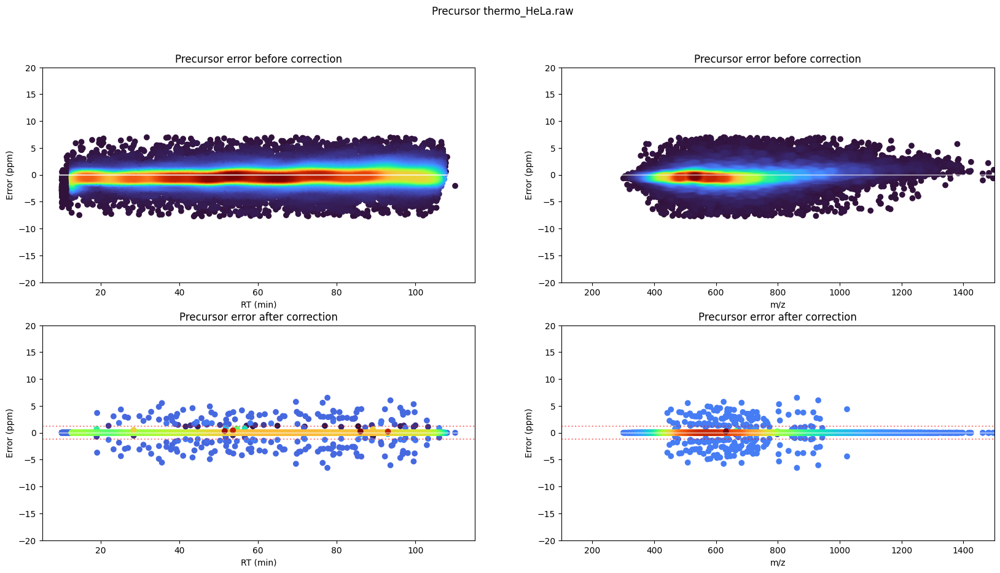

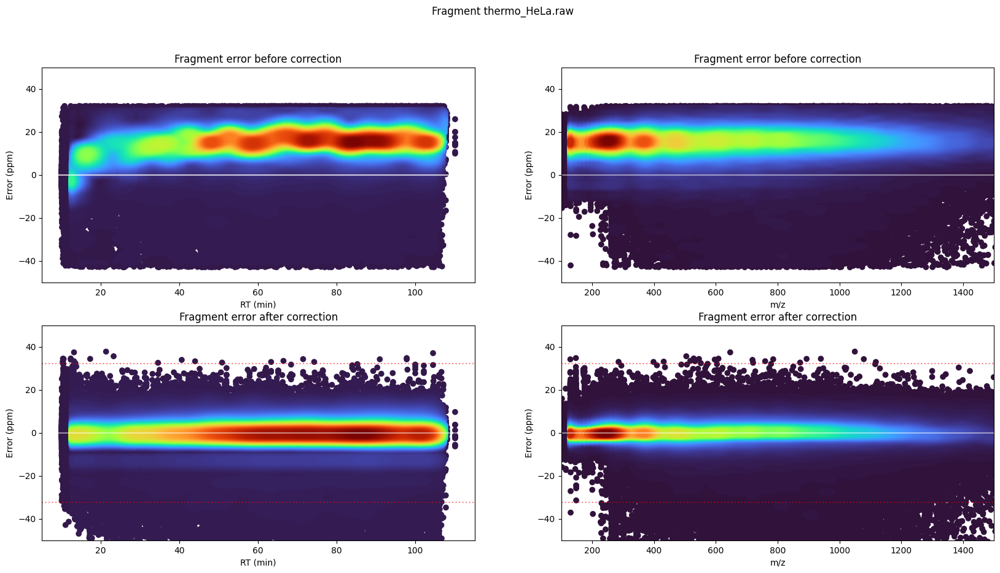

In [3]:
%run -i ../test_ci.py $tmp_folder thermo_hela

In [4]:
try:
    import matplotlib_venn
except ModuleNotFoundError:
    !pip install matplotlib_venn
    import matplotlib_venn

In [5]:
try:
    import seaborn
except ImportError:
    !pip install seaborn

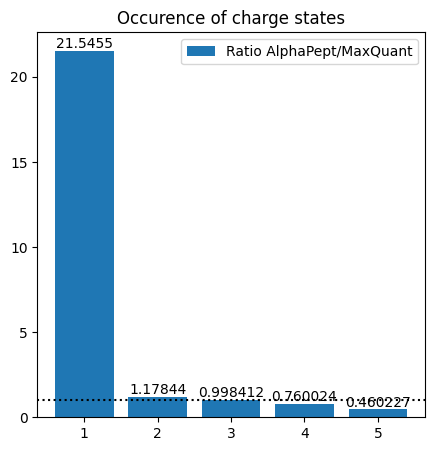

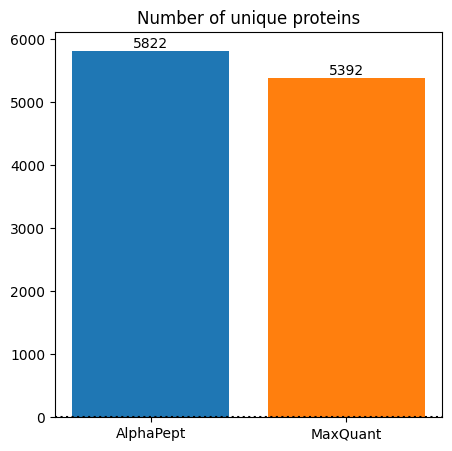

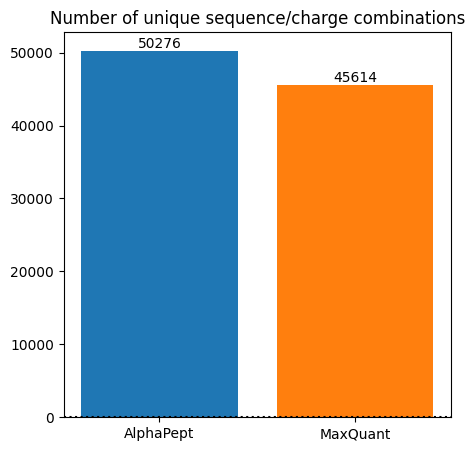

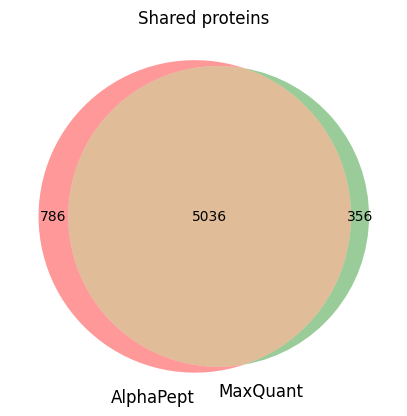

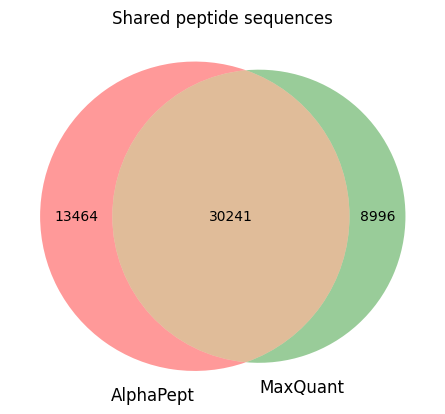

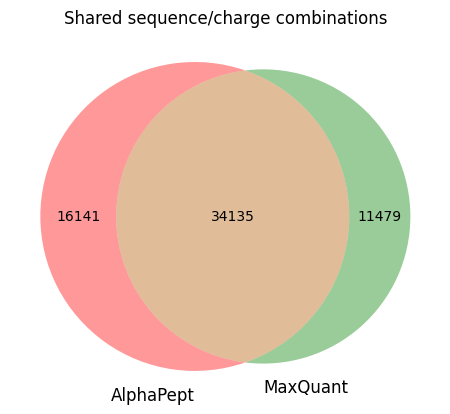

C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  ax = density_scatter(d1.loc[shared]['fragments_int_sum'].values, d2.loc[shared]['ms1_int_sum'].values, ax = ax, bins=30)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  ax = density_scatter(d1.loc[shared]['fragments_int_sum'].values, d2.loc[shared]['ms1_int_sum'].values, ax = ax, bins=30)
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWa

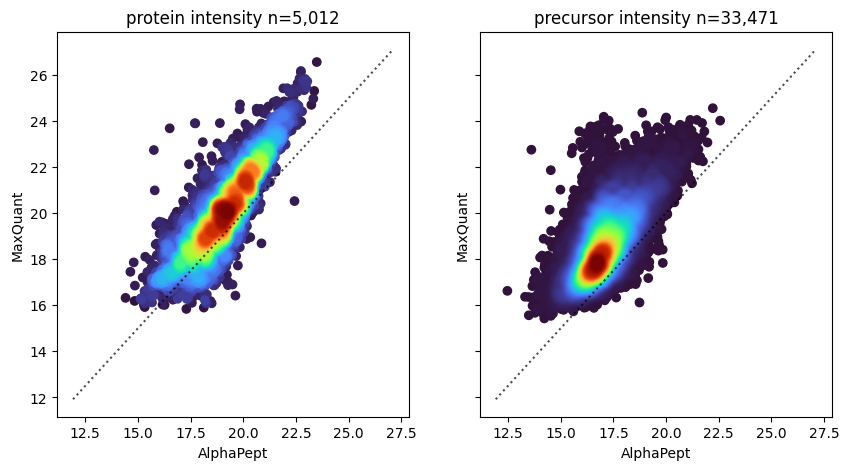

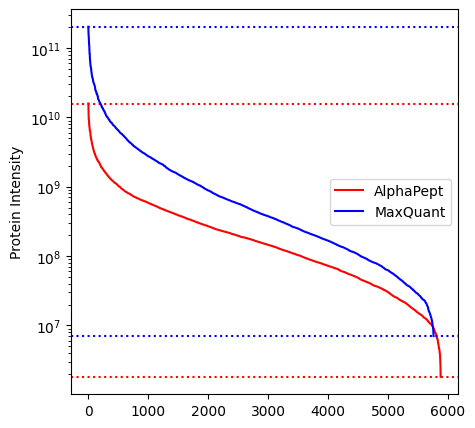

In [6]:
from test_helper import prepare_files, compare_field, compare_populations, compare_intensities, protein_rank
import os


df1, df2 = prepare_files(os.path.join(TEST_DIR,'results.hdf'), os.path.join(tmp_folder,'thermo_HeLa_evd.txt'))
for field in ['charge','protein','precursor']:
    compare_field(df1, df2, software_1, software_2, field)
    
for field in ['protein','sequence','precursor']:
    compare_populations(df1, df2, software_1, software_2, field)
    
compare_intensities(df1, df2,software_1, software_2)

protein_rank(df1, df2,software_1, software_2)

### Calling custom steps of the pipeline

Work with already processed results and call individual steps

--- ML ---
2023-07-12 18:21:55> 58,756 target (5,875 decoy) of 76,204 PSMs. FDR 0.099990 for a cutoff of 7.06 (set FDR was 0.1).
2023-07-12 18:21:55> Training & cross-validation on 12,504 targets and 12,504 decoys
2023-07-12 18:22:14> The best parameters selected by 5-fold cross-validation were {'clf__max_depth': 25, 'clf__max_leaf_nodes': 150}
2023-07-12 18:22:14> The train accuracy was 0.927
2023-07-12 18:22:14> Testing on 50,016 targets and 50,016 decoys
2023-07-12 18:22:15> The test accuracy was 0.909
2023-07-12 18:22:15> ML Top features
2023-07-12 18:22:15> 1	generic_score                  0.2172
2023-07-12 18:22:15> 2	hits_y                         0.1916
2023-07-12 18:22:15> 3	x_tandem                       0.1191
2023-07-12 18:22:15> 4	hits                           0.1114
2023-07-12 18:22:15> 5	fragments_matched_n_ratio      0.0586
2023-07-12 18:22:15> 6	n_fragments_matched            0.0576
2023-07-12 18:22:15> 7	fragments_matched_int_ratio    0.0490
2023-07-12 18:22:15> 8	fr

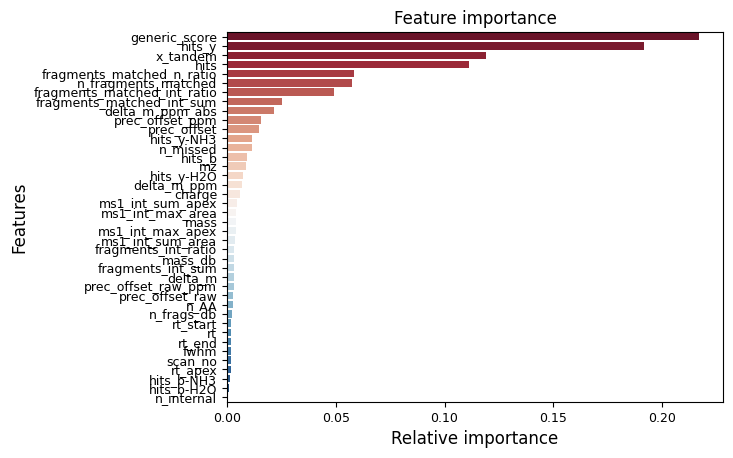

2023-07-12 18:22:15> Filter df with x_tandem score


C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2023-07-12 18:22:17> Global FDR on precursor
2023-07-12 18:22:17> 52,521 target (525 decoy) of 75,906 PSMs. FDR 0.009996 for a cutoff of 0.57 (set FDR was 0.01).


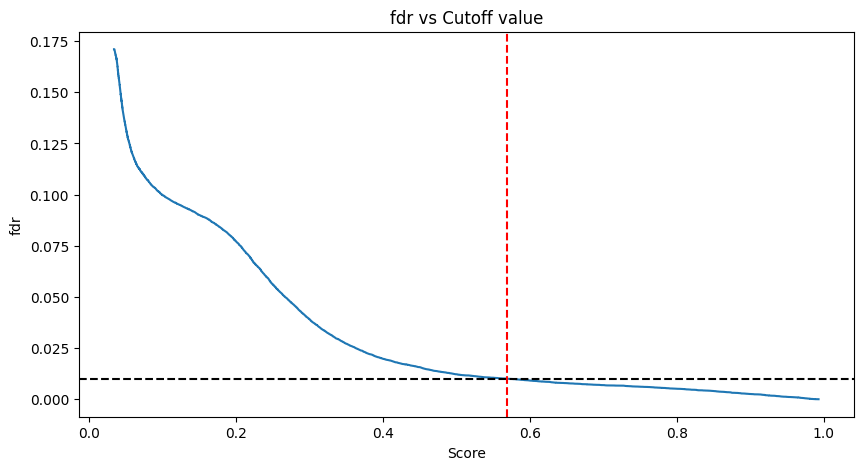

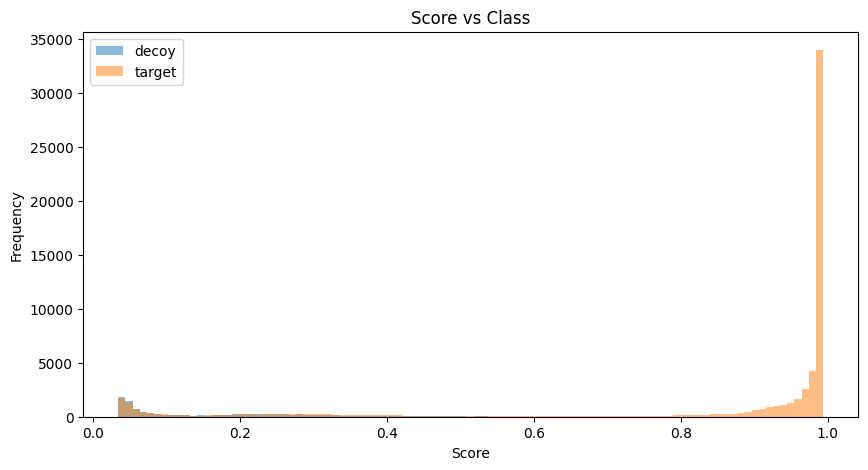

2023-07-12 18:22:18> Global FDR cutoff at 0.569.
--- x! ---
2023-07-12 18:22:18> Filter df with x_tandem score
2023-07-12 18:22:19> Global FDR on precursor
2023-07-12 18:22:19> 46,502 target (465 decoy) of 76,009 PSMs. FDR 0.010000 for a cutoff of 24.10 (set FDR was 0.01).


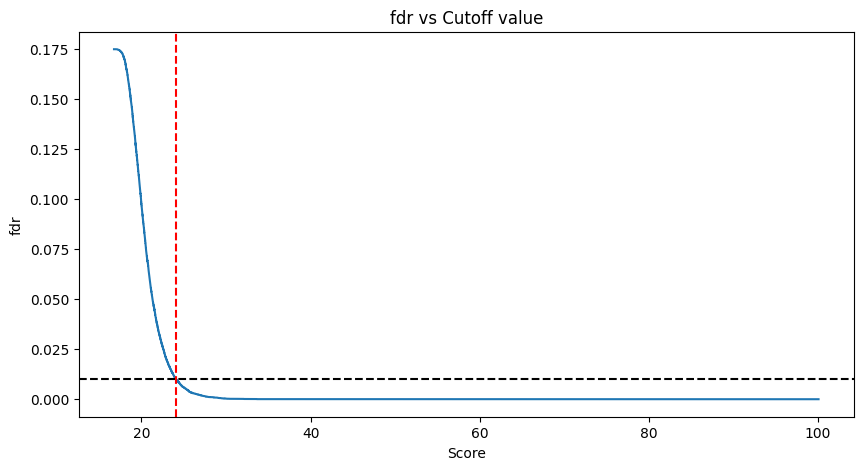

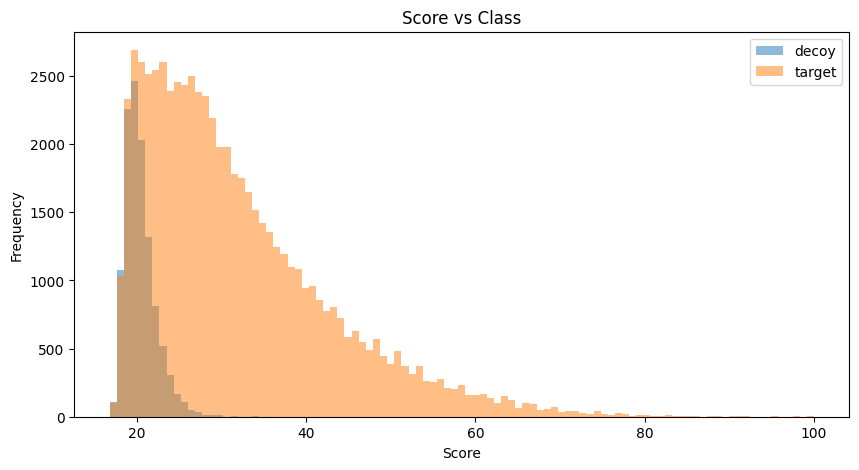

2023-07-12 18:22:20> Global FDR cutoff at 24.101.


In [7]:
import alphapept.io
from alphapept.score import get_ML_features, filter_with_ML, filter_with_x_tandem, cut_global_fdr, train_RF

ms_file = alphapept.io.MS_Data_File('F:/temp_test_run/thermo_HeLa.ms_data.hdf')

ss = ms_file.read(dataset_name='second_search')
ss = get_ML_features(ss)

ml_df = ss.copy()
x_df = ss.copy()

print('--- ML ---')
cv, features = train_RF(ml_df, plot=True)
ml_df = filter_with_ML(ml_df, cv, features = features)
ml_df = cut_global_fdr(ml_df, analyte_level='precursor',  plot=True)

print('--- x! ---')
x_df = filter_with_x_tandem(x_df)
x_df = cut_global_fdr(x_df, analyte_level='precursor',  plot=True)

## Fractions

### Running a single fraction
In this section, we want to explicitly check, if fractionated samples are correctly handled in terms of FDR and Quantification. For this, we initially check how much we find in a single fractionated sample, as compared to Maxquant.


2023-07-12 18:22:21> Creating dir F:\projects\alphapept\sandbox\temp/test_temp.
2023-07-12 18:22:22> No settings provided. Creating from default settings.
2023-07-12 18:22:22> Platform information:
2023-07-12 18:22:22> system     - Windows
2023-07-12 18:22:22> release    - 10
2023-07-12 18:22:22> version    - 10.0.19044
2023-07-12 18:22:22> machine    - AMD64
2023-07-12 18:22:22> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 18:22:22> cpu count  - 24
2023-07-12 18:22:22> ram memory - 115.2/127.7 Gb (available/total)
2023-07-12 18:22:22> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 18:22:22> Python information:
2023-07-12 18:22:22> SQLAlchemy                    - 1.4.39
2023-07-12 18:22:22> alphapept                     - 0.5.0
2023-07-12 18:22:22> alpharaw                      - 0.1.0
2023-07-12 18:22:22> alphatims                     - 1.0.7
2023-07-12 18:22:22> biopython                     - 1.79
2023-07-12 18:22:22> bumpver

2023-07-12 18:22:22> 
2023-07-12 18:22:22> Checking if files exist.
2023-07-12 18:22:22> FASTA Files have a total size of 13.116 Mb
2023-07-12 18:22:22> Workflow has 11 steps
2023-07-12 18:22:22> ==== create_database ====
2023-07-12 18:22:22> Database path F:\projects\alphapept\sandbox\temp\test_temp\database.hdf is not a file.
2023-07-12 18:22:22> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\human.fasta with size 12.97 Mb.
2023-07-12 18:22:22> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\contaminants.fasta with size 0.15 Mb.
2023-07-12 18:22:22> Creating a new database from FASTA.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:22:23> FASTA contains 20,611 entries.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:46<00:00, 23.03s/it]

2023-07-12 18:24:18> Digested 20,611 proteins and generated 5,139,336 spectra
2023-07-12 18:25:03> Database saved to F:\projects\alphapept\sandbox\temp\test_temp\database.hdf. Filesize of database is 1.97 GB


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [02:40<00:00, 160.85s/it]

2023-07-12 18:25:10> ==== import_raw_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:25:10> Processing 1 files for step raw_conversion
2023-07-12 18:25:10> File F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1 has extension .raw - converting from Thermo.
2023-07-12 18:25:54> File conversion complete. Extracted 70,210 precursors.
2023-07-12 18:25:55> File conversion of file F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw complete.


  0%|                                                                                                                                                                | 0/1 [00:45<?, ?it/s]

2023-07-12 18:25:55> ==== feature_finding ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:25:55> Processing 1 files for step find_features
2023-07-12 18:25:55> No *.hdf file with features found for F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.ms_data.hdf. Adding to feature finding list.
2023-07-12 18:25:55> Feature finding on F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw
2023-07-12 18:25:55> Hill extraction with centroid_tol 8 and max_gap 2
2023-07-12 18:25:58> Number of hills 947,041, len = 14.39
2023-07-12 18:25:58> Repeating hill extraction with centroid_tol 6.61
2023-07-12 18:26:01> Number of hills 1,025,262, len = 14.14
2023-07-12 18:26:02> After duplicate removal of hills 848,010
2023-07-12 18:26:06> After split hill_ptrs 938,711
2023-07-12 18:26:06> After filter hill_ptrs 931,542
2023-07-12 18:27:36> Extracting hill stats complete
2023-07-12 18:27:44> Found 147,553 pre isotope patterns.
2023-07-12 18:28:23> Extracted 159,415 isotope patterns.
2023-07-12 18:28:25> Report complete.
2023-07-12 18:2

  0%|                                                                                                                                                                | 0/1 [02:31<?, ?it/s]

2023-07-12 18:28:26> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:28:26> Starting first search.
2023-07-12 18:28:26> Processing 1 files for step search_db
2023-07-12 18:28:26> Calibrating fragments
2023-07-12 18:28:32> Performing search on 139,086 query and 5,139,336 db entries with frag_tol = 50.00 and prec_tol = 20.00.
2023-07-12 18:28:33> Found 55,897 psms.
2023-07-12 18:28:33> Extracting columns for scoring.
2023-07-12 18:28:44> Extracted columns from 55,897 spectra.
2023-07-12 18:28:45> Saving first_search results to F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.ms_data.hdf
2023-07-12 18:28:45> Search of file F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw complete.
2023-07-12 18:29:00> First search complete.


  0%|                                                                                                                                                                | 0/1 [00:34<?, ?it/s]

2023-07-12 18:29:00> ==== recalibrate_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:29:00> Processing 1 files for step calibrate_hdf
2023-07-12 18:29:00> Recalibrating file F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw.
2023-07-12 18:29:01> Scoring using generic score
2023-07-12 18:29:01> 21,707 target (217 decoy) of 27,843 PSMs. FDR 0.009997 for a cutoff of 8.59 (set FDR was 0.01).
2023-07-12 18:29:01> Precursor mass calibration for file F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw.
2023-07-12 18:29:03> Precursor calibration std 0.20, 0.00
2023-07-12 18:29:03> Saving precursor calibration
2023-07-12 18:29:05> Precursor calibration of file F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.ms_data.hdf complete.
2023-07-12 18:29:05> Starting fragment calibration.
2023-07-12 18:29:05> Calibrating fragments with neighbors
2023-07-12 18:29:05> Scoring using generic score
2023-07-12 18:29:06> 21,707 target (217 decoy) of 27,843 PSMs. FDR 0.009997 for a cutoff of 8.59 (set FDR

  0%|                                                                                                                                                                | 0/1 [00:39<?, ?it/s]

2023-07-12 18:29:40> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:29:40> Starting second search with DB.
2023-07-12 18:29:40> Processing 1 files for step search_db
2023-07-12 18:29:40> Found calibrated prec_tol with value 1.00
2023-07-12 18:29:40> Found calibrated frag_tol with value 28.70
2023-07-12 18:29:41> Performing search on 139,086 query and 5,139,336 db entries with frag_tol = 28.70 and prec_tol = 1.00.
2023-07-12 18:29:41> Found 33,060 psms.
2023-07-12 18:29:41> Extracting columns for scoring.
2023-07-12 18:29:47> Extracted columns from 33,060 spectra.
2023-07-12 18:29:47> Saving second_search results to F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.ms_data.hdf
2023-07-12 18:29:48> Search of file F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw complete.
2023-07-12 18:30:02> Second search complete.


  0%|                                                                                                                                                                | 0/1 [00:21<?, ?it/s]

2023-07-12 18:30:02> ==== score ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:30:02> Processing 1 files for step score_hdf
2023-07-12 18:30:02> Calling score_hdf
2023-07-12 18:30:02> Found second search psms for scoring.
2023-07-12 18:30:03> Last q_value 0.007 of dataset is smaller than fdr_level 0.100
2023-07-12 18:30:03> 22,924 target (162 decoy) of 23,086 PSMs. FDR 0.007067 for a cutoff of 1.88 (set FDR was 0.1).
2023-07-12 18:30:03> The total number of available decoys is lower than the initial set of high scoring targets.
2023-07-12 18:30:03> Training & cross-validation on 331 targets and 330 decoys
2023-07-12 18:30:09> The best parameters selected by 5-fold cross-validation were {'clf__max_depth': 25, 'clf__max_leaf_nodes': 150}
2023-07-12 18:30:09> The train accuracy was 1.000
2023-07-12 18:30:09> Testing on 1,322 targets and 1,323 decoys
2023-07-12 18:30:09> The test accuracy was 0.929
2023-07-12 18:30:09> ML Top features
2023-07-12 18:30:09> 1	hits_y                         0.2157
2023-07-12 18:30:09> 2	generic_score                  0.166

C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2023-07-12 18:30:09> Last q_value 0.006 of dataset is smaller than fdr_level 0.010
2023-07-12 18:30:09> 29,792 target (189 decoy) of 29,981 PSMs. FDR 0.006344 for a cutoff of 0.00 (set FDR was 0.01).
2023-07-12 18:30:09> Saving identifications to ms_data file.
2023-07-12 18:30:10> Saving identifications to ms_data file complete.
2023-07-12 18:30:11> Saving identifications to csv file complete.
2023-07-12 18:30:11> Filter df with custom score
2023-07-12 18:30:11> Global FDR on precursor
2023-07-12 18:30:11> Last q_value 0.008 of dataset is smaller than fdr_level 0.010
2023-07-12 18:30:11> 22,916 target (174 decoy) of 23,090 PSMs. FDR 0.007593 for a cutoff of 0.00 (set FDR was 0.01).
2023-07-12 18:30:11> Global FDR cutoff at 0.000.
2023-07-12 18:30:11> FDR on peptides complete. For 0.01 FDR found 23,942 targets and 175 decoys.
2023-07-12 18:30:11> Extracting fragment_ions
2023-07-12 18:30:16> Extracting fragment_ions complete.
2023-07-12 18:30:16> Exporting peptide_fdr on F:\projects\alp

  0%|                                                                                                                                                                | 0/1 [00:14<?, ?it/s]

2023-07-12 18:30:17> ==== isobaric_labeling ====
2023-07-12 18:30:17> ==== protein_grouping ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:30:17> Fasta dict with length 20,611, Pept dict with length 5,139,342
2023-07-12 18:30:17> Extracting protein groups.



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]


2023-07-12 18:30:17> A total of 19,384 unique and 1,571 shared peptides.
2023-07-12 18:30:18> A total of 445 ambigious proteins
2023-07-12 18:30:18> A total of 163 unique and 11 shared peptides.
2023-07-12 18:30:18> A total of 11 ambigious proteins
2023-07-12 18:30:18> Global FDR on protein_group
2023-07-12 18:30:18> 3,278 target (32 decoy) of 3,554 PSMs. FDR 0.009762 for a cutoff of 0.44 (set FDR was 0.01).
2023-07-12 18:30:18> Global FDR cutoff at 0.440.
2023-07-12 18:30:18> FDR on proteins complete. For 0.01 FDR found 23,838 targets and 33 decoys. A total of 3,310 proteins found.
2023-07-12 18:30:18> Saving complete.
2023-07-12 18:30:18> Protein groups complete.


  0%|                                                                                                                                                                | 0/1 [00:01<?, ?it/s]

2023-07-12 18:30:18> ==== quantification ====
2023-07-12 18:30:18> Reading protein_fdr for quantification.
2023-07-12 18:30:18> Saving protein_groups after delayed normalization to combined_protein_fdr_dn
2023-07-12 18:30:18> Complete.


2023-07-12 18:30:18> Starting profile extraction.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:30:18> LFQ complete.
2023-07-12 18:30:18> Extracting protein_summary
2023-07-12 18:30:19> Saved protein_summary of length 3,310 saved to F:\projects\alphapept\sandbox\temp\test_temp\results_protein_summary.csv
2023-07-12 18:30:19> Updating protein_fdr.
2023-07-12 18:30:19> Exporting as csv.
2023-07-12 18:30:20> Saved df of length 23,871 saved to F:\projects\alphapept\sandbox\temp\test_temp\results


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.13s/it]

2023-07-12 18:30:20> ==== export ====


2023-07-12 18:30:20> Settings saved to F:\projects\alphapept\sandbox\temp\test_temp\results.yaml
2023-07-12 18:30:20> Analysis complete.


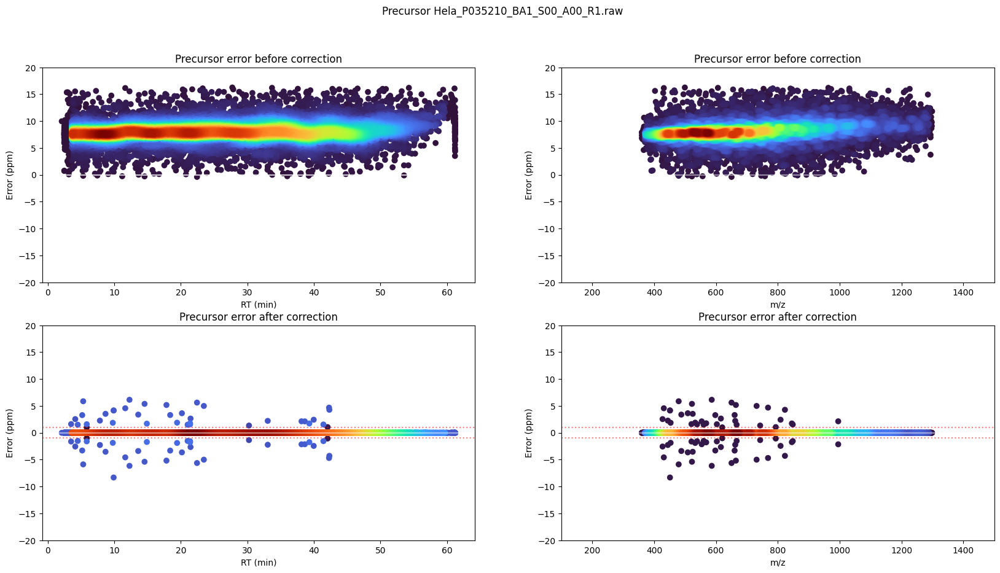

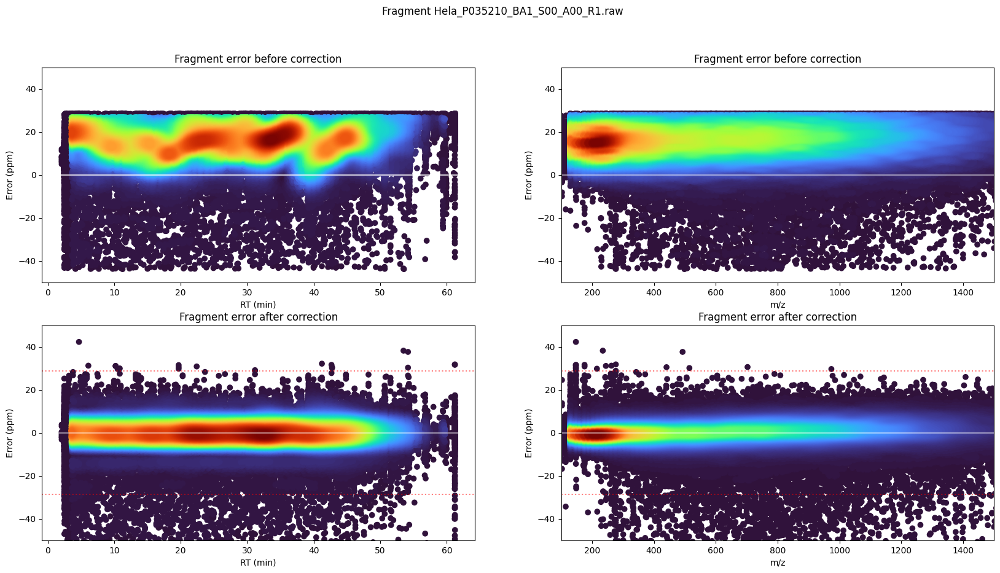

In [8]:
%run -i ../test_ci.py $tmp_folder thermo_singlefrac

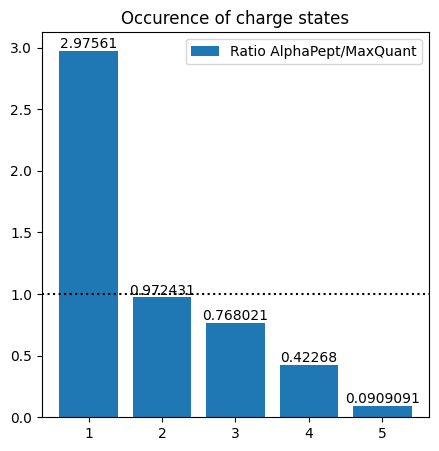

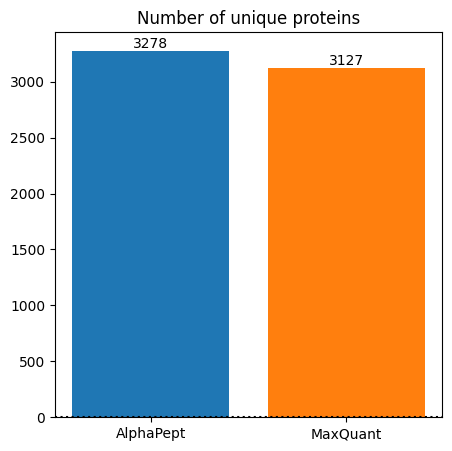

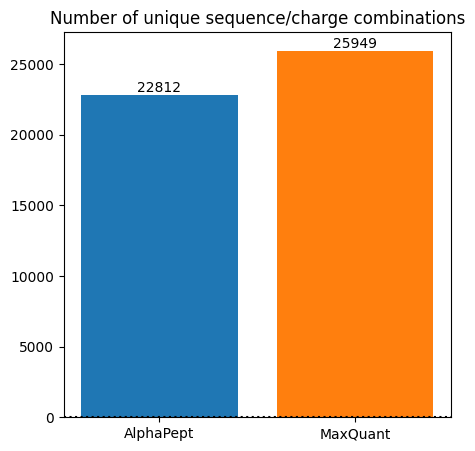

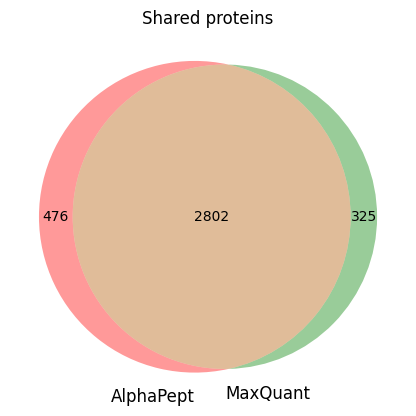

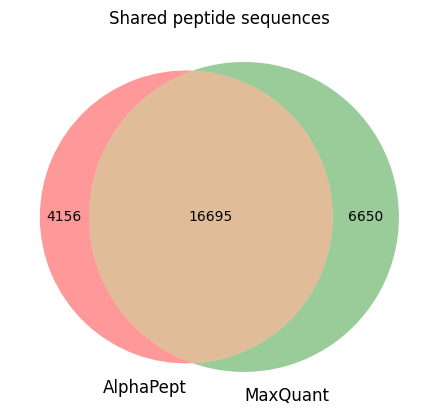

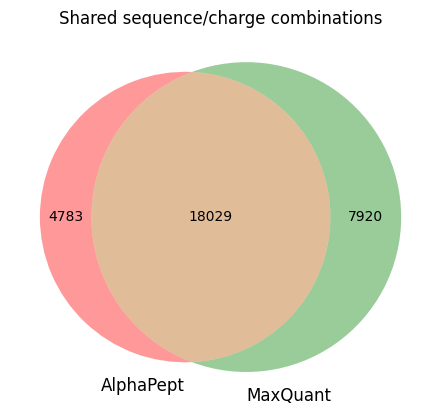

C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  ax = density_scatter(d1.loc[shared]['fragments_int_sum'].values, d2.loc[shared]['ms1_int_sum'].values, ax = ax, bins=30)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  ax = density_scatter(d1.loc[shared]['fragments_int_sum'].values, d2.loc[shared]['ms1_int_sum'].values, ax = ax, bins=30)
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWa

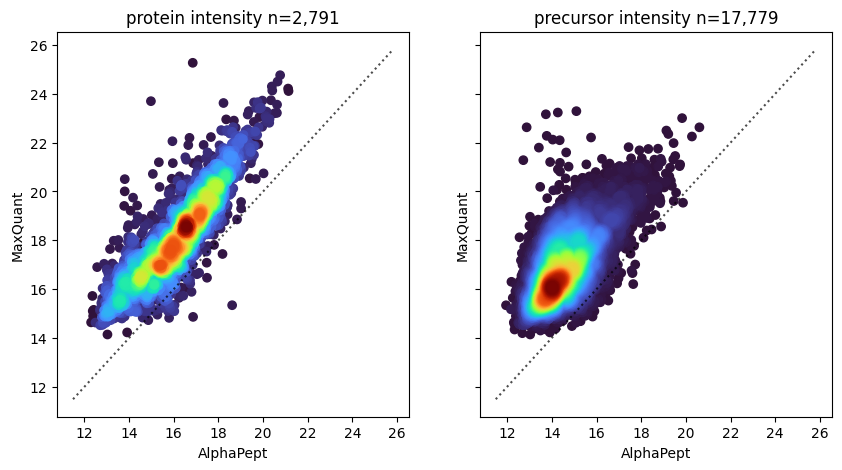

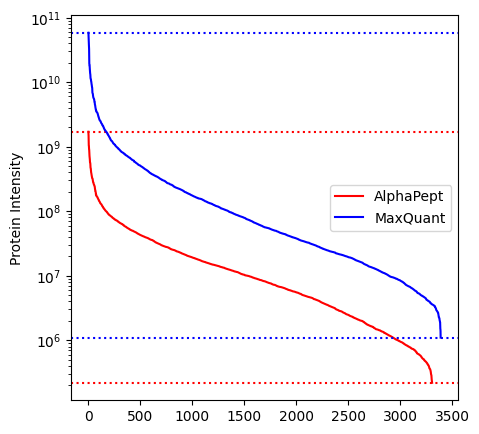

In [9]:
#compare with evidence 
from test_helper import prepare_files, compare_field, compare_populations, compare_intensities, protein_rank
import os
import alphapept.io
import pandas as pd

#ap_full_df = alphapept.io.MS_Data_File(os.path.join(TEST_DIR,'Hela_P035210_BA1_S00_A00_R1.ms_data.hdf')).read(dataset_name='peptide_fdr')

df1, df2 = prepare_files(os.path.join(TEST_DIR,'results.hdf'), os.path.join(tmp_folder,'PXD015087_ref_evd_singlerun.txt'))

for field in ['charge','protein','precursor']:
    compare_field(df1, df2, software_1, software_2, field)
    
for field in ['protein','sequence','precursor']:
    compare_populations(df1, df2, software_1, software_2, field)
    
compare_intensities(df1, df2,software_1, software_2)

protein_rank(df1, df2,software_1, software_2)

### Running Multiple fractions
Above, we have seen that a single fraction is quite similar to Maxquant, with slightly fewer hits for AP. We now want to check, if this also translates to multiple fractions


In [10]:
%run -i ../test_ci.py $tmp_folder PXD015087

2023-07-12 18:30:37> Creating dir F:\projects\alphapept\sandbox\temp/test_temp.
2023-07-12 18:30:40> No settings provided. Creating from default settings.
2023-07-12 18:30:40> Platform information:
2023-07-12 18:30:40> system     - Windows
2023-07-12 18:30:40> release    - 10
2023-07-12 18:30:40> version    - 10.0.19044
2023-07-12 18:30:40> machine    - AMD64
2023-07-12 18:30:40> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 18:30:40> cpu count  - 24
2023-07-12 18:30:40> ram memory - 111.1/127.7 Gb (available/total)
2023-07-12 18:30:40> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 18:30:40> Python information:
2023-07-12 18:30:40> SQLAlchemy                    - 1.4.39
2023-07-12 18:30:40> alphapept                     - 0.5.0
2023-07-12 18:30:40> alpharaw                      - 0.1.0
2023-07-12 18:30:40> alphatims                     - 1.0.7
2023-07-12 18:30:40> biopython                     - 1.79
2023-07-12 18:30:40> bumpver

2023-07-12 18:30:40> Workflow has 11 steps
2023-07-12 18:30:40> ==== create_database ====
2023-07-12 18:30:40> Database path F:\projects\alphapept\sandbox\temp\test_temp\database.hdf is not a file.
2023-07-12 18:30:40> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\human.fasta with size 12.97 Mb.
2023-07-12 18:30:40> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\contaminants.fasta with size 0.15 Mb.
2023-07-12 18:30:40> Creating a new database from FASTA.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:30:41> FASTA contains 20,611 entries.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:46<00:00, 25.38s/it]

2023-07-12 18:32:36> Digested 20,611 proteins and generated 5,139,336 spectra
2023-07-12 18:33:22> Database saved to F:\projects\alphapept\sandbox\temp\test_temp\database.hdf. Filesize of database is 1.97 GB


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [02:41<00:00, 161.29s/it]

2023-07-12 18:33:29> ==== import_raw_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:33:29> Processing 4 files for step raw_conversion
2023-07-12 18:33:29> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 18:34:29> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step raw_conversion succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [01:00<03:00, 240.47s/it]

2023-07-12 18:34:30> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step raw_conversion succeeded. 50.00 %


 50%|██████████████████████████████████████████████████████████████████████████▌                                                                          | 0.5/1 [01:01<00:51, 102.25s/it]

2023-07-12 18:34:30> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step raw_conversion succeeded. 75.00 %
2023-07-12 18:34:30> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step raw_conversion succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:01<00:00, 61.68s/it]

2023-07-12 18:34:30> ==== feature_finding ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:34:30> Processing 4 files for step find_features
2023-07-12 18:34:30> Setting Process limit to 14
2023-07-12 18:34:30> AlphaPool was set to 14 processes. Setting max to 14.
2023-07-12 18:38:48> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step find_features succeeded. 25.00 %


 25%|████████████████████████████████████▊                                                                                                              | 0.25/1 [04:17<12:53, 1031.97s/it]

2023-07-12 18:38:49> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step find_features succeeded. 50.00 %


 50%|██████████████████████████████████████████████████████████████████████████▌                                                                          | 0.5/1 [04:18<03:33, 426.46s/it]

2023-07-12 18:38:54> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step find_features succeeded. 75.00 %


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 0.75/1 [04:23<01:00, 240.13s/it]

2023-07-12 18:39:00> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step find_features succeeded. 100.00 %


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [04:29<00:00, 269.26s/it]

2023-07-12 18:39:00> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:39:00> Starting first search.
2023-07-12 18:39:00> Processing 4 files for step search_db
2023-07-12 18:39:00> Searching. Setting Process limit to 4.
2023-07-12 18:39:00> AlphaPool was set to 4 processes. Setting max to 4.
2023-07-12 18:39:41> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step search_db succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:41<02:04, 165.38s/it]

2023-07-12 18:39:41> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step search_db succeeded. 50.00 %
2023-07-12 18:39:41> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step search_db succeeded. 75.00 %


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 0.75/1 [00:41<00:10, 43.04s/it]

2023-07-12 18:39:41> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step search_db succeeded. 100.00 %
2023-07-12 18:39:54> First search complete.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:54<00:00, 54.68s/it]

2023-07-12 18:39:54> ==== recalibrate_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:39:54> Processing 4 files for step calibrate_hdf
2023-07-12 18:39:54> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 18:40:50> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step calibrate_hdf succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:55<02:45, 220.52s/it]

2023-07-12 18:40:50> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step calibrate_hdf succeeded. 50.00 %
2023-07-12 18:40:52> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step calibrate_hdf succeeded. 75.00 %


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 0.75/1 [00:58<00:15, 61.47s/it]

2023-07-12 18:40:52> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step calibrate_hdf succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:58<00:00, 58.13s/it]

2023-07-12 18:40:53> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:40:53> Starting second search with DB.
2023-07-12 18:40:53> Processing 4 files for step search_db
2023-07-12 18:40:53> Searching. Setting Process limit to 4.
2023-07-12 18:40:53> AlphaPool was set to 4 processes. Setting max to 4.
2023-07-12 18:41:19> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step search_db succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:26<01:19, 106.06s/it]

2023-07-12 18:41:19> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step search_db succeeded. 50.00 %
2023-07-12 18:41:19> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step search_db succeeded. 75.00 %
2023-07-12 18:41:19> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step search_db succeeded. 100.00 %
2023-07-12 18:41:33> Second search complete.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:40<00:00, 40.35s/it]


2023-07-12 18:41:33> ==== score ====


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:41:33> Processing 4 files for step score_hdf
2023-07-12 18:41:33> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 18:42:02> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step score_hdf succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:28<01:26, 115.14s/it]

2023-07-12 18:42:02> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step score_hdf succeeded. 50.00 %
2023-07-12 18:42:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step score_hdf succeeded. 75.00 %


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 0.75/1 [00:29<00:07, 30.57s/it]

2023-07-12 18:42:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step score_hdf succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:29<00:00, 29.35s/it]

2023-07-12 18:42:03> ==== isobaric_labeling ====
2023-07-12 18:42:03> ==== protein_grouping ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:42:03> Fasta dict with length 20,611, Pept dict with length 5,139,342
2023-07-12 18:42:03> Extracting protein groups.



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]


2023-07-12 18:42:03> A total of 27,713 unique and 2,163 shared peptides.
2023-07-12 18:42:04> A total of 533 ambigious proteins
2023-07-12 18:42:04> A total of 478 unique and 24 shared peptides.
2023-07-12 18:42:04> A total of 23 ambigious proteins
2023-07-12 18:42:05> Global FDR on protein_group
2023-07-12 18:42:05> 3,643 target (36 decoy) of 4,502 PSMs. FDR 0.009882 for a cutoff of 0.66 (set FDR was 0.01).
2023-07-12 18:42:05> Global FDR cutoff at 0.660.
2023-07-12 18:42:05> FDR on proteins complete. For 0.01 FDR found 93,196 targets and 70 decoys. A total of 3,679 proteins found.
2023-07-12 18:42:06> Saving complete.
2023-07-12 18:42:06> Protein groups complete.


  0%|                                                                                                                                                                | 0/1 [00:02<?, ?it/s]

2023-07-12 18:42:06> ==== quantification ====
2023-07-12 18:42:06> Reading protein_fdr for quantification.


2023-07-12 18:42:06> Saving protein_groups after delayed normalization to combined_protein_fdr_dn
2023-07-12 18:42:06> Complete.
2023-07-12 18:42:06> Starting profile extraction.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:42:06> LFQ complete.
2023-07-12 18:42:06> Extracting protein_summary
2023-07-12 18:42:06> Saved protein_summary of length 3,679 saved to F:\projects\alphapept\sandbox\temp\test_temp\results_protein_summary.csv
2023-07-12 18:42:06> Updating protein_fdr.
2023-07-12 18:42:06> Exporting as csv.
2023-07-12 18:42:10> Saved df of length 93,266 saved to F:\projects\alphapept\sandbox\temp\test_temp\results


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.91s/it]

2023-07-12 18:42:10> ==== export ====


2023-07-12 18:42:13> Settings saved to F:\projects\alphapept\sandbox\temp\test_temp\results.yaml
2023-07-12 18:42:13> Analysis complete.


F:\projects\alphapept\sandbox\test_helper.py:51: DtypeWarning: Columns (51) have mixed types. Specify dtype option on import or set low_memory=False.
  df2 = pd.read_csv(path2, sep='\t')


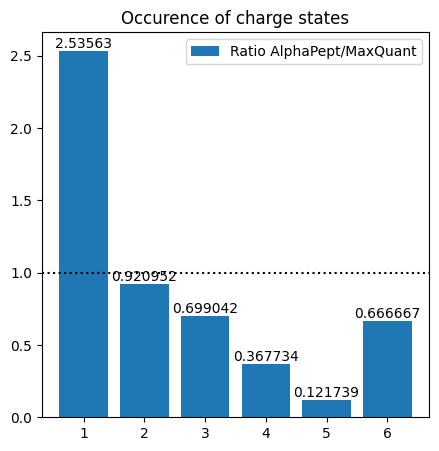

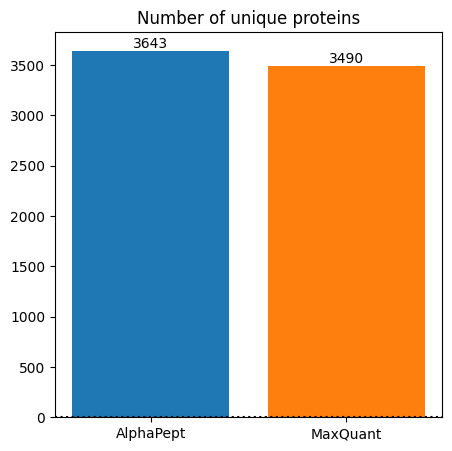

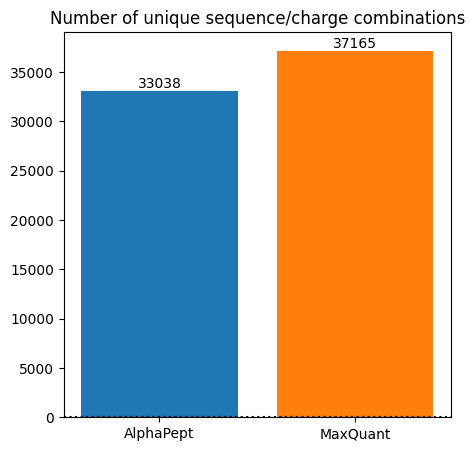

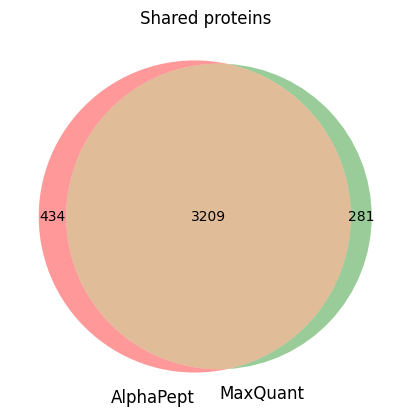

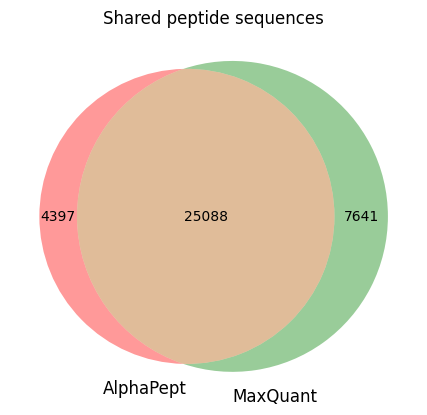

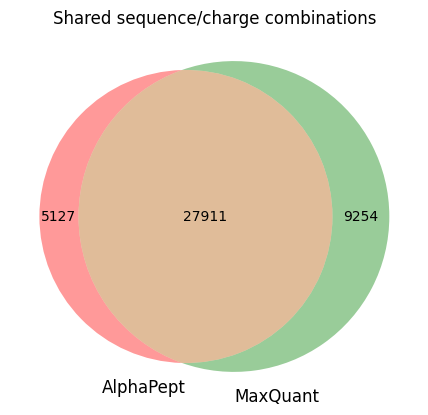

C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  ax = density_scatter(d1.loc[shared]['fragments_int_sum'].values, d2.loc[shared]['ms1_int_sum'].values, ax = ax, bins=30)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  ax = density_scatter(d1.loc[shared]['fragments_int_sum'].values, d2.loc[shared]['ms1_int_sum'].values, ax = ax, bins=30)
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWa

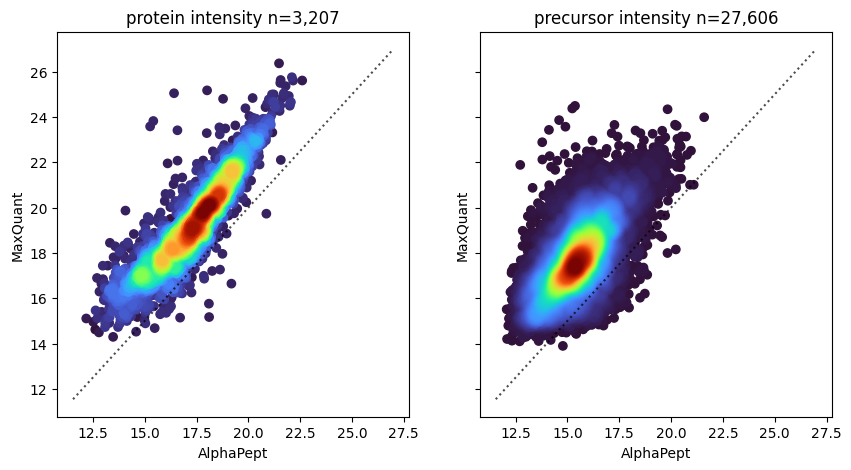

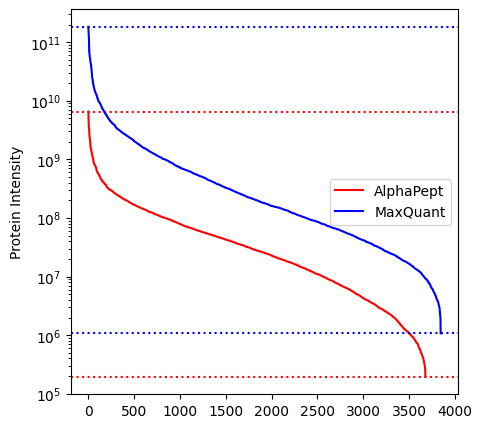

In [11]:

#compare with evidence 
from test_helper import prepare_files, compare_field, compare_populations, compare_intensities, protein_rank
import os
import alphapept.io
import pandas as pd

#ap_full_df = alphapept.io.MS_Data_File(os.path.join(TEST_DIR,'Hela_P035210_BA1_S00_A00_R1.ms_data.hdf')).read(dataset_name='peptide_fdr')

df1, df2 = prepare_files(os.path.join(TEST_DIR,'results.hdf'), os.path.join(tmp_folder,'PXD015087_ref_evd.txt'))

for field in ['charge','protein','precursor']:
    compare_field(df1, df2, software_1, software_2, field)
    
for field in ['protein','sequence','precursor']:
    compare_populations(df1, df2, software_1, software_2, field)
    
compare_intensities(df1, df2,software_1, software_2)

protein_rank(df1, df2,software_1, software_2)

### Running Multiple fractions
Above, we have seen that a single fraction is quite similar to Maxquant, with slightly fewer hits for AP. We now want to check, if this also translates to multiple fractions

In [12]:
%run -i ../test_ci.py $tmp_folder PXD015087

2023-07-12 18:42:18> Creating dir F:\projects\alphapept\sandbox\temp/test_temp.
2023-07-12 18:42:19> No settings provided. Creating from default settings.
2023-07-12 18:42:20> Platform information:
2023-07-12 18:42:20> system     - Windows
2023-07-12 18:42:20> release    - 10
2023-07-12 18:42:20> version    - 10.0.19044
2023-07-12 18:42:20> machine    - AMD64
2023-07-12 18:42:20> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 18:42:20> cpu count  - 24
2023-07-12 18:42:20> ram memory - 114.2/127.7 Gb (available/total)
2023-07-12 18:42:20> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 18:42:20> Python information:
2023-07-12 18:42:20> SQLAlchemy                    - 1.4.39
2023-07-12 18:42:20> alphapept                     - 0.5.0
2023-07-12 18:42:20> alpharaw                      - 0.1.0
2023-07-12 18:42:20> alphatims                     - 1.0.7
2023-07-12 18:42:20> biopython                     - 1.79
2023-07-12 18:42:20> bumpver

2023-07-12 18:42:20> Workflow has 11 steps
2023-07-12 18:42:20> ==== create_database ====
2023-07-12 18:42:20> Database path F:\projects\alphapept\sandbox\temp\test_temp\database.hdf is not a file.
2023-07-12 18:42:20> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\human.fasta with size 12.97 Mb.
2023-07-12 18:42:20> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\contaminants.fasta with size 0.15 Mb.
2023-07-12 18:42:20> Creating a new database from FASTA.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:42:20> FASTA contains 20,611 entries.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:47<00:00, 27.37s/it]

2023-07-12 18:44:16> Digested 20,611 proteins and generated 5,139,336 spectra
2023-07-12 18:45:02> Database saved to F:\projects\alphapept\sandbox\temp\test_temp\database.hdf. Filesize of database is 1.97 GB


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [02:42<00:00, 162.06s/it]

2023-07-12 18:45:09> ==== import_raw_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:45:09> Processing 4 files for step raw_conversion
2023-07-12 18:45:09> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 18:46:09> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step raw_conversion succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [01:00<03:01, 242.52s/it]

2023-07-12 18:46:09> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step raw_conversion succeeded. 50.00 %
2023-07-12 18:46:09> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step raw_conversion succeeded. 75.00 %
2023-07-12 18:46:10> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step raw_conversion succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:01<00:00, 61.05s/it]

2023-07-12 18:46:10> ==== feature_finding ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:46:10> Processing 4 files for step find_features
2023-07-12 18:46:10> Setting Process limit to 14
2023-07-12 18:46:10> AlphaPool was set to 14 processes. Setting max to 14.
2023-07-12 18:50:29> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step find_features succeeded. 25.00 %


 25%|████████████████████████████████████▊                                                                                                              | 0.25/1 [04:19<12:57, 1036.12s/it]

2023-07-12 18:50:29> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step find_features succeeded. 50.00 %
2023-07-12 18:50:34> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step find_features succeeded. 75.00 %


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 0.75/1 [04:24<01:09, 276.13s/it]

2023-07-12 18:50:34> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step find_features succeeded. 100.00 %


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [04:24<00:00, 264.20s/it]

2023-07-12 18:50:34> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:50:34> Starting first search.
2023-07-12 18:50:34> Processing 4 files for step search_db
2023-07-12 18:50:34> Searching. Setting Process limit to 4.
2023-07-12 18:50:34> AlphaPool was set to 4 processes. Setting max to 4.
2023-07-12 18:51:16> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step search_db succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:41<02:05, 167.09s/it]

2023-07-12 18:51:16> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step search_db succeeded. 50.00 %


 50%|███████████████████████████████████████████████████████████████████████████                                                                           | 0.5/1 [00:42<00:34, 69.85s/it]

2023-07-12 18:51:16> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step search_db succeeded. 75.00 %
2023-07-12 18:51:16> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step search_db succeeded. 100.00 %
2023-07-12 18:51:29> First search complete.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:55<00:00, 55.17s/it]

2023-07-12 18:51:29> ==== recalibrate_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:51:29> Processing 4 files for step calibrate_hdf
2023-07-12 18:51:29> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 18:52:25> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step calibrate_hdf succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:55<02:46, 221.72s/it]

2023-07-12 18:52:25> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step calibrate_hdf succeeded. 50.00 %
2023-07-12 18:52:27> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step calibrate_hdf succeeded. 75.00 %


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 0.75/1 [00:57<00:15, 60.87s/it]

2023-07-12 18:52:27> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step calibrate_hdf succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:57<00:00, 57.81s/it]

2023-07-12 18:52:27> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:52:27> Starting second search with DB.
2023-07-12 18:52:27> Processing 4 files for step search_db
2023-07-12 18:52:27> Searching. Setting Process limit to 4.
2023-07-12 18:52:27> AlphaPool was set to 4 processes. Setting max to 4.
2023-07-12 18:52:54> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step search_db succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:26<01:19, 105.97s/it]

2023-07-12 18:52:54> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step search_db succeeded. 50.00 %
2023-07-12 18:52:54> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step search_db succeeded. 75.00 %
2023-07-12 18:52:54> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step search_db succeeded. 100.00 %
2023-07-12 18:53:07> Second search complete.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:40<00:00, 40.38s/it]


2023-07-12 18:53:08> ==== score ====


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:53:08> Processing 4 files for step score_hdf
2023-07-12 18:53:08> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 18:53:37> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step score_hdf succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:28<01:26, 115.38s/it]

2023-07-12 18:53:37> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step score_hdf succeeded. 50.00 %
2023-07-12 18:53:37> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step score_hdf succeeded. 75.00 %
2023-07-12 18:53:37> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step score_hdf succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:28<00:00, 28.94s/it]

2023-07-12 18:53:37> ==== isobaric_labeling ====
2023-07-12 18:53:37> ==== protein_grouping ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:53:37> Fasta dict with length 20,611, Pept dict with length 5,139,342
2023-07-12 18:53:37> Extracting protein groups.



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]


2023-07-12 18:53:38> A total of 27,713 unique and 2,163 shared peptides.
2023-07-12 18:53:39> A total of 533 ambigious proteins
2023-07-12 18:53:39> A total of 478 unique and 24 shared peptides.
2023-07-12 18:53:39> A total of 23 ambigious proteins
2023-07-12 18:53:39> Global FDR on protein_group
2023-07-12 18:53:39> 3,643 target (36 decoy) of 4,502 PSMs. FDR 0.009882 for a cutoff of 0.66 (set FDR was 0.01).
2023-07-12 18:53:39> Global FDR cutoff at 0.660.
2023-07-12 18:53:40> FDR on proteins complete. For 0.01 FDR found 93,196 targets and 70 decoys. A total of 3,679 proteins found.
2023-07-12 18:53:40> Saving complete.
2023-07-12 18:53:40> Protein groups complete.


  0%|                                                                                                                                                                | 0/1 [00:02<?, ?it/s]

2023-07-12 18:53:40> ==== quantification ====
2023-07-12 18:53:40> Reading protein_fdr for quantification.


2023-07-12 18:53:40> Saving protein_groups after delayed normalization to combined_protein_fdr_dn
2023-07-12 18:53:40> Complete.
2023-07-12 18:53:40> Starting profile extraction.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:53:40> LFQ complete.
2023-07-12 18:53:40> Extracting protein_summary
2023-07-12 18:53:40> Saved protein_summary of length 3,679 saved to F:\projects\alphapept\sandbox\temp\test_temp\results_protein_summary.csv
2023-07-12 18:53:41> Updating protein_fdr.
2023-07-12 18:53:41> Exporting as csv.
2023-07-12 18:53:44> Saved df of length 93,266 saved to F:\projects\alphapept\sandbox\temp\test_temp\results


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.98s/it]

2023-07-12 18:53:44> ==== export ====


2023-07-12 18:53:47> Settings saved to F:\projects\alphapept\sandbox\temp\test_temp\results.yaml
2023-07-12 18:53:47> Analysis complete.


F:\projects\alphapept\sandbox\test_helper.py:51: DtypeWarning: Columns (51) have mixed types. Specify dtype option on import or set low_memory=False.
  df2 = pd.read_csv(path2, sep='\t')


,charge,db_idx,decoy,decoys_cum,delta_m,delta_m_ppm,delta_m_ppm_abs,fdr,feature_idx,fragment_ion_idx,...,decoy_protein,n_possible_proteins,index_protein_group,score_protein_group,target_protein_group,target_cum_protein_group,decoys_cum_protein_group,fdr_protein_group,q_value_protein_group,missed_cleavages
index,,,,,,,,,,,,,,,,,,,,,
5,1.0,1211,False,106,0.000863,3.272900,3.272900,0.004651,112952,43,...,False,1,1374,1.000000,True,506,0,0.000000,0.000000,0
6,1.0,1211,False,138,0.000606,2.297642,2.297642,0.005965,57404,148,...,False,1,1374,1.000000,True,506,0,0.000000,0.000000,0
405,2.0,34169,False,21,-0.001129,-3.876033,3.876033,0.000999,32364,4005,...,False,1,1374,1.000000,True,506,0,0.000000,0.000000,1
406,2.0,34169,False,5,-0.000747,-2.562819,2.562819,0.000284,25019,3617,...,False,1,1374,1.000000,True,506,0,0.000000,0.000000,1
407,2.0,34169,False,17,-0.001507,-5.126586,5.126586,0.000814,32290,3996,...,False,1,1374,1.000000,True,506,0,0.000000,0.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94344,3.0,4040527,False,4,-0.001341,-2.876446,2.876446,0.000255,67535,463357,...,False,1,2774,0.894663,True,3407,7,0.002055,0.002049,1
94374,3.0,4206895,False,0,-0.002913,-5.559834,5.559834,0.000000,51207,471518,...,False,1,1226,0.990312,True,2606,0,0.000000,0.000000,1
94387,3.0,4324319,False,6,-0.008096,-10.339536,10.339536,0.000332,11362,474602,...,False,1,3899,0.815501,True,3523,18,0.005109,0.005089,1


,Sequence,Length,Modifications,Modified sequence,Oxidation (M) Probabilities,Oxidation (M) Score Diffs,Acetyl (Protein N-term),Oxidation (M),Missed cleavages,Proteins,...,AIF MS/MS IDs,Oxidation (M) site IDs,charge,sequence,precursor,protein,decoy,score,ms1_int_sum,missed_cleavages
0,AAAAAAAAAPAAAATAPTTAATTAATAAQ,29,Unmodified,_AAAAAAAAAPAAAATAPTTAATTAATAAQ_,NaN,NaN,0,0,0,sp|P37108|SRP14_HUMAN,...,NaN,NaN,2,AAAAAAAAAPAAAATAPTTAATTAATAAQ,AAAAAAAAAPAAAATAPTTAATTAATAAQ_2,sp|P37108|SRP14_HUMAN,False,38.028,5.269000e+07,0
1,AAAAAAAAAPAAAATAPTTAATTAATAAQ,29,Unmodified,_AAAAAAAAAPAAAATAPTTAATTAATAAQ_,NaN,NaN,0,0,0,sp|P37108|SRP14_HUMAN,...,NaN,NaN,2,AAAAAAAAAPAAAATAPTTAATTAATAAQ,AAAAAAAAAPAAAATAPTTAATTAATAAQ_2,sp|P37108|SRP14_HUMAN,False,56.147,4.214600e+07,0
2,AAAAAAAAAPAAAATAPTTAATTAATAAQ,29,Unmodified,_AAAAAAAAAPAAAATAPTTAATTAATAAQ_,NaN,NaN,0,0,0,sp|P37108|SRP14_HUMAN,...,NaN,NaN,2,AAAAAAAAAPAAAATAPTTAATTAATAAQ,AAAAAAAAAPAAAATAPTTAATTAATAAQ_2,sp|P37108|SRP14_HUMAN,False,84.468,5.334500e+07,0
3,AAAAAAAAAPAAAATAPTTAATTAATAAQ,29,Unmodified,_AAAAAAAAAPAAAATAPTTAATTAATAAQ_,NaN,NaN,0,0,0,sp|P37108|SRP14_HUMAN,...,NaN,NaN,2,AAAAAAAAAPAAAATAPTTAATTAATAAQ,AAAAAAAAAPAAAATAPTTAATTAATAAQ_2,sp|P37108|SRP14_HUMAN,False,75.764,5.292900e+07,0
4,AAAAAAALQAK,11,Unmodified,_AAAAAAALQAK_,NaN,NaN,0,0,0,sp|P36578|RL4_HUMAN,...,NaN,NaN,2,AAAAAAALQAK,AAAAAAALQAK_2,sp|P36578|RL4_HUMAN,False,107.660,2.562700e+07,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109111,YYVTIIDAPGHR,12,Unmodified,_YYVTIIDAPGHR_,NaN,NaN,0,0,0,sp|P68104|EF1A1_HUMAN;sp|Q5VTE0|EF1A3_HUMAN,...,NaN,NaN,3,YYVTIIDAPGHR,YYVTIIDAPGHR_3,sp|P68104|EF1A1_HUMAN,False,54.700,6.412800e+08,0
109112,YYVTIIDAPGHR,12,Unmodified,_YYVTIIDAPGHR_,NaN,NaN,0,0,0,sp|P68104|EF1A1_HUMAN;sp|Q5VTE0|EF1A3_HUMAN,...,NaN,NaN,2,YYVTIIDAPGHR,YYVTIIDAPGHR_2,sp|P68104|EF1A1_HUMAN,False,72.643,1.532400e+09,0
109113,YYVTIIDAPGHR,12,Unmodified,_YYVTIIDAPGHR_,NaN,NaN,0,0,0,sp|P68104|EF1A1_HUMAN;sp|Q5VTE0|EF1A3_HUMAN,...,NaN,NaN,3,YYVTIIDAPGHR,YYVTIIDAPGHR_3,sp|P68104|EF1A1_HUMAN,False,60.490,6.669300e+08,0
109114,YYVTIIDAPGHR,12,Unmodified,_YYVTIIDAPGHR_,NaN,NaN,0,0,0,sp|P68104|EF1A1_HUMAN;sp|Q5VTE0|EF1A3_HUMAN,...,NaN,NaN,2,YYVTIIDAPGHR,YYVTIIDAPGHR_2,sp|P68104|EF1A1_HUMAN,False,94.692,1.411200e+09,0


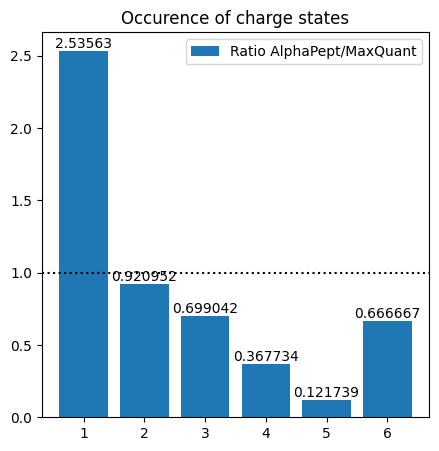

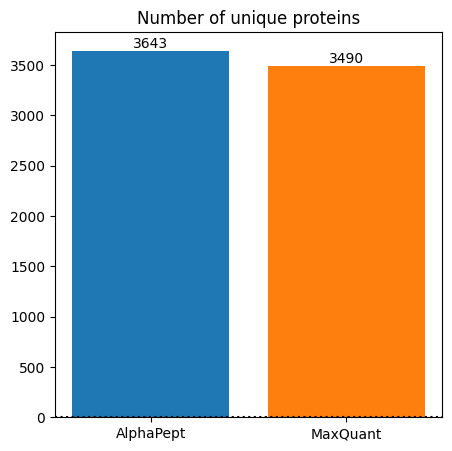

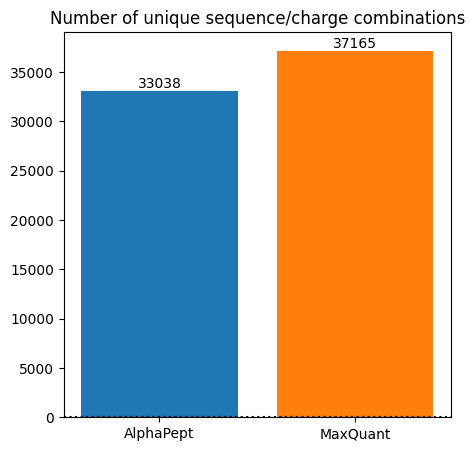

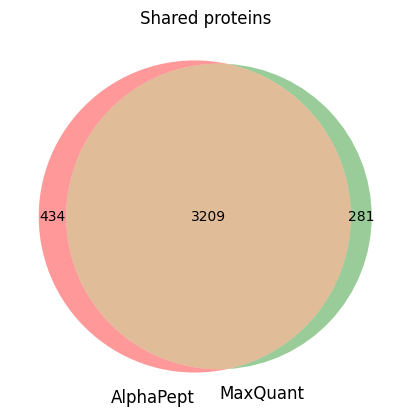

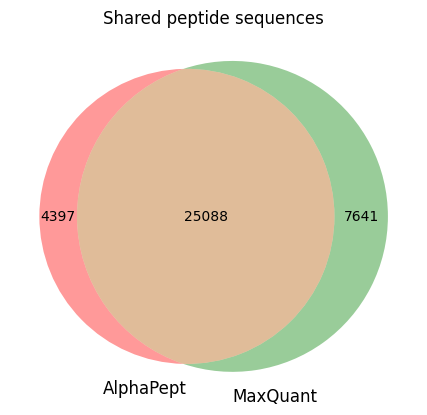

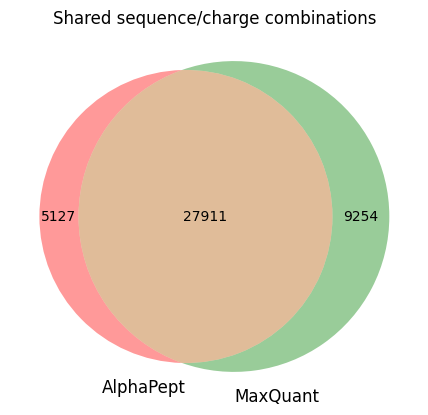

C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  ax = density_scatter(d1.loc[shared]['fragments_int_sum'].values, d2.loc[shared]['ms1_int_sum'].values, ax = ax, bins=30)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  ax = density_scatter(d1.loc[shared]['fragments_int_sum'].values, d2.loc[shared]['ms1_int_sum'].values, ax = ax, bins=30)
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWa

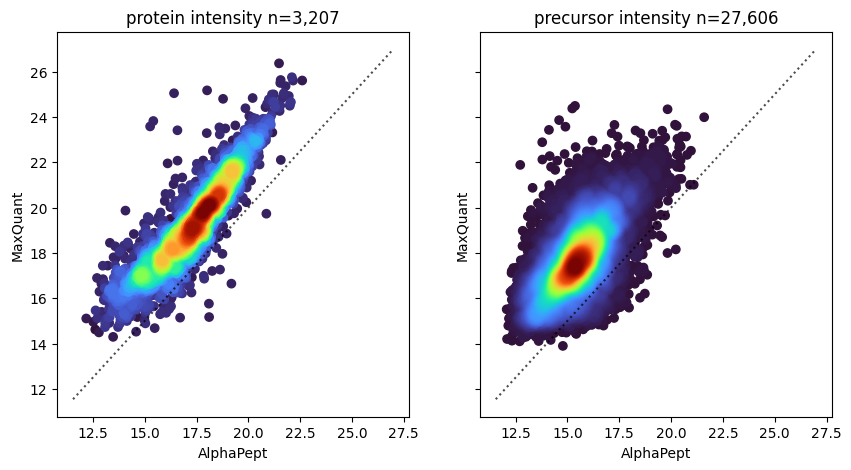

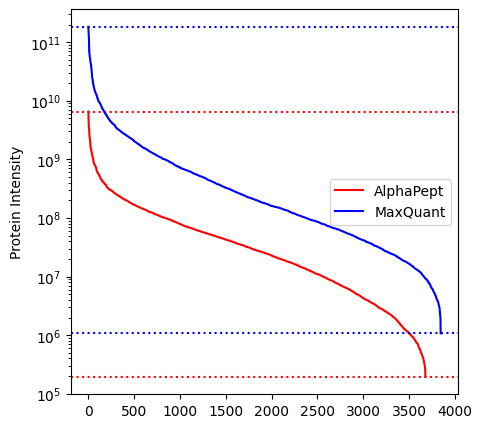

In [13]:
#compare with evidence 
from test_helper import prepare_files, compare_field, compare_populations, compare_intensities, protein_rank
import os
import alphapept.io
import pandas as pd

#ap_full_df = alphapept.io.MS_Data_File(os.path.join(TEST_DIR,'Hela_P035210_BA1_S00_A00_R1.ms_data.hdf')).read(dataset_name='peptide_fdr')

df1, df2 = prepare_files(os.path.join(TEST_DIR,'results.hdf'), os.path.join(tmp_folder,'PXD015087_ref_evd.txt'))

display(df1)
display(df2)
for field in ['charge','protein','precursor']:
    compare_field(df1, df2, software_1, software_2, field)
    
for field in ['protein','sequence','precursor']:
    compare_populations(df1, df2, software_1, software_2, field)
    
compare_intensities(df1, df2,software_1, software_2)

protein_rank(df1, df2,software_1, software_2)

# Quantification Test

This notebook will run `PXD006109` and `PXD010012` and compare the quantificaiton performance.

## PXD006109

In [14]:
%run -i ../test_ci.py $tmp_folder PXD006109 
#test_ci.main(runtype="PXD006109", new_files=False)

2023-07-12 18:53:53> Creating dir F:\projects\alphapept\sandbox\temp/test_temp.
2023-07-12 18:54:00> No settings provided. Creating from default settings.
2023-07-12 18:54:00> Platform information:
2023-07-12 18:54:00> system     - Windows
2023-07-12 18:54:00> release    - 10
2023-07-12 18:54:00> version    - 10.0.19044
2023-07-12 18:54:00> machine    - AMD64
2023-07-12 18:54:00> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 18:54:00> cpu count  - 24
2023-07-12 18:54:00> ram memory - 110.8/127.7 Gb (available/total)
2023-07-12 18:54:00> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 18:54:01> Python information:
2023-07-12 18:54:01> SQLAlchemy                    - 1.4.39
2023-07-12 18:54:01> alphapept                     - 0.5.0
2023-07-12 18:54:01> alpharaw                      - 0.1.0
2023-07-12 18:54:01> alphatims                     - 1.0.7
2023-07-12 18:54:01> biopython                     - 1.79
2023-07-12 18:54:01> bumpver

2023-07-12 18:54:01> 
2023-07-12 18:54:01> Checking if files exist.
2023-07-12 18:54:01> FASTA Files have a total size of 22.754 Mb
2023-07-12 18:54:01> Workflow has 11 steps
2023-07-12 18:54:01> ==== create_database ====
2023-07-12 18:54:01> Database path F:\projects\alphapept\sandbox\temp\test_temp\database.hdf is not a file.
2023-07-12 18:54:01> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\human.fasta with size 12.97 Mb.
2023-07-12 18:54:01> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\e_coli.fasta with size 9.64 Mb.
2023-07-12 18:54:01> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\contaminants.fasta with size 0.15 Mb.
2023-07-12 18:54:01> Creating a new database from FASTA.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:54:02> FASTA contains 43,752 entries.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [02:08<00:00, 34.25s/it]

2023-07-12 18:56:24> Digested 43,752 proteins and generated 5,917,832 spectra
2023-07-12 18:57:17> Database saved to F:\projects\alphapept\sandbox\temp\test_temp\database.hdf. Filesize of database is 2.30 GB


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [03:16<00:00, 196.36s/it]

2023-07-12 18:57:26> ==== import_raw_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:57:26> Processing 6 files for step raw_conversion
2023-07-12 18:57:26> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 18:58:53> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_1.raw for step raw_conversion succeeded. 16.67 %


 17%|██████████████████████▏                                                                                                              | 0.16666666666666666/1 [01:26<07:12, 519.19s/it]

2023-07-12 18:58:53> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_2.raw for step raw_conversion succeeded. 33.33 %
2023-07-12 18:58:53> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_3.raw for step raw_conversion succeeded. 50.00 %
2023-07-12 18:58:54> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_1.raw for step raw_conversion succeeded. 66.67 %


 67%|█████████████████████████████████████████████████████████████████████████████████████████▎                                            | 0.6666666666666666/1 [01:27<00:33, 100.09s/it]

2023-07-12 18:58:54> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_2.raw for step raw_conversion succeeded. 83.33 %
2023-07-12 18:58:54> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_3.raw for step raw_conversion succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:27<00:00, 87.94s/it]

2023-07-12 18:58:54> ==== feature_finding ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 18:58:54> Processing 6 files for step find_features
2023-07-12 18:58:54> Setting Process limit to 14
2023-07-12 18:58:54> AlphaPool was set to 14 processes. Setting max to 14.
2023-07-12 19:03:59> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_1.raw for step find_features succeeded. 16.67 %


 17%|██████████████████████                                                                                                              | 0.16666666666666666/1 [05:04<25:23, 1827.62s/it]

2023-07-12 19:03:59> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_2.raw for step find_features succeeded. 33.33 %
2023-07-12 19:03:59> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_3.raw for step find_features succeeded. 50.00 %
2023-07-12 19:04:04> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_1.raw for step find_features succeeded. 66.67 %


 67%|█████████████████████████████████████████████████████████████████████████████████████████▎                                            | 0.6666666666666666/1 [05:09<01:57, 353.61s/it]

2023-07-12 19:04:04> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_2.raw for step find_features succeeded. 83.33 %
2023-07-12 19:04:08> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_3.raw for step find_features succeeded. 100.00 %


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [05:14<00:00, 314.22s/it]

2023-07-12 19:04:09> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:04:09> Starting first search.
2023-07-12 19:04:09> Processing 6 files for step search_db
2023-07-12 19:04:09> Searching. Setting Process limit to 6.
2023-07-12 19:04:09> AlphaPool was set to 6 processes. Setting max to 6.
2023-07-12 19:05:36> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_1.raw for step search_db succeeded. 16.67 %


 17%|██████████████████████▏                                                                                                              | 0.16666666666666666/1 [01:27<07:16, 524.00s/it]

2023-07-12 19:05:36> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_2.raw for step search_db succeeded. 33.33 %
2023-07-12 19:05:36> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_3.raw for step search_db succeeded. 50.00 %
2023-07-12 19:05:40> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_1.raw for step search_db succeeded. 66.67 %


 67%|█████████████████████████████████████████████████████████████████████████████████████████▎                                            | 0.6666666666666666/1 [01:31<00:35, 106.40s/it]

2023-07-12 19:05:40> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_2.raw for step search_db succeeded. 83.33 %
2023-07-12 19:05:40> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_3.raw for step search_db succeeded. 100.00 %
2023-07-12 19:05:57> First search complete.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:48<00:00, 108.77s/it]

2023-07-12 19:05:57> ==== recalibrate_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:05:57> Processing 6 files for step calibrate_hdf
2023-07-12 19:05:57> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 19:07:48> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_1.raw for step calibrate_hdf succeeded. 16.67 %


 17%|██████████████████████▏                                                                                                              | 0.16666666666666666/1 [01:50<09:14, 664.99s/it]

2023-07-12 19:07:48> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_2.raw for step calibrate_hdf succeeded. 33.33 %
2023-07-12 19:07:48> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_3.raw for step calibrate_hdf succeeded. 50.00 %
2023-07-12 19:07:48> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_1.raw for step calibrate_hdf succeeded. 66.67 %
2023-07-12 19:07:48> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_2.raw for step calibrate_hdf succeeded. 83.33 %
2023-07-12 19:07:48> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_3.raw for step calibrate_hdf succeeded. 100.00 %


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:50<00:00, 110.93s/it]

2023-07-12 19:07:48> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:07:48> Starting second search with DB.
2023-07-12 19:07:48> Processing 6 files for step search_db
2023-07-12 19:07:48> Searching. Setting Process limit to 6.
2023-07-12 19:07:48> AlphaPool was set to 6 processes. Setting max to 6.
2023-07-12 19:08:21> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_1.raw for step search_db succeeded. 16.67 %


 17%|██████████████████████▏                                                                                                              | 0.16666666666666666/1 [00:32<02:41, 193.91s/it]

2023-07-12 19:08:21> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_2.raw for step search_db succeeded. 33.33 %
2023-07-12 19:08:21> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_3.raw for step search_db succeeded. 50.00 %
2023-07-12 19:08:21> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_1.raw for step search_db succeeded. 66.67 %


 67%|██████████████████████████████████████████████████████████████████████████████████████████                                             | 0.6666666666666666/1 [00:32<00:12, 37.08s/it]

2023-07-12 19:08:21> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_2.raw for step search_db succeeded. 83.33 %
2023-07-12 19:08:21> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_3.raw for step search_db succeeded. 100.00 %
2023-07-12 19:08:38> Second search complete.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:50<00:00, 50.02s/it]


2023-07-12 19:08:39> ==== score ====


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:08:39> Processing 6 files for step score_hdf
2023-07-12 19:08:39> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 19:09:31> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_1.raw for step score_hdf succeeded. 16.67 %


 17%|██████████████████████▏                                                                                                              | 0.16666666666666666/1 [00:52<04:22, 314.57s/it]

2023-07-12 19:09:31> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_2.raw for step score_hdf succeeded. 33.33 %
2023-07-12 19:09:31> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa12_3.raw for step score_hdf succeeded. 50.00 %
2023-07-12 19:09:36> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_1.raw for step score_hdf succeeded. 66.67 %


 67%|██████████████████████████████████████████████████████████████████████████████████████████                                             | 0.6666666666666666/1 [00:57<00:22, 66.93s/it]

2023-07-12 19:09:36> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_2.raw for step score_hdf succeeded. 83.33 %
2023-07-12 19:09:36> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD006109_HeLa2_3.raw for step score_hdf succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:57<00:00, 57.09s/it]

2023-07-12 19:09:36> ==== isobaric_labeling ====
2023-07-12 19:09:36> ==== protein_grouping ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:09:36> Fasta dict with length 43,752, Pept dict with length 5,917,838
2023-07-12 19:09:36> Extracting protein groups.



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]


2023-07-12 19:09:38> A total of 54,527 unique and 10,821 shared peptides.
2023-07-12 19:09:42> A total of 1881 ambigious proteins
2023-07-12 19:09:43> A total of 1,689 unique and 204 shared peptides.
2023-07-12 19:09:43> A total of 192 ambigious proteins
2023-07-12 19:09:44> Global FDR on protein_group
2023-07-12 19:09:44> 6,878 target (68 decoy) of 10,263 PSMs. FDR 0.009887 for a cutoff of 0.90 (set FDR was 0.01).
2023-07-12 19:09:44> Global FDR cutoff at 0.898.
2023-07-12 19:09:46> FDR on proteins complete. For 0.01 FDR found 240,914 targets and 211 decoys. A total of 6,946 proteins found.
2023-07-12 19:09:46> Saving complete.
2023-07-12 19:09:46> Protein groups complete.


  0%|                                                                                                                                                                | 0/1 [00:10<?, ?it/s]

2023-07-12 19:09:46> ==== quantification ====
2023-07-12 19:09:46> Reading protein_fdr for quantification.


2023-07-12 19:09:47> Delayed Normalization.
2023-07-12 19:09:47> Setting minimum occurence to 5.0
2023-07-12 19:09:47> Delayed normalization with SLSQP on (1, 6, 21017)
2023-07-12 19:09:48> Saving protein_groups after delayed normalization to combined_protein_fdr_dn
2023-07-12 19:09:49> Complete.
2023-07-12 19:09:49> Starting profile extraction.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:09:49> Preparing protein table for parallel processing.


 20%|██████████████████████████▏                                                                                                           | 0.19550820616181974/1 [00:04<00:17, 21.82s/it]

2023-07-12 19:09:54> Starting protein extraction for 6946 proteins.
2023-07-12 19:09:54> AlphaPool was set to 24 processes. Setting max to 24.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 0.9997696515980421/1 [02:53<00:00, 208.48s/it]

2023-07-12 19:12:49> LFQ complete.
2023-07-12 19:12:49> Extracting protein_summary
2023-07-12 19:12:50> Saved protein_summary of length 6,946 saved to F:\projects\alphapept\sandbox\temp\test_temp\results_protein_summary.csv
2023-07-12 19:12:50> Updating protein_fdr.
2023-07-12 19:12:50> Exporting as csv.
2023-07-12 19:13:00> Saved df of length 241,125 saved to F:\projects\alphapept\sandbox\temp\test_temp\results


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [03:11<00:00, 191.20s/it]

2023-07-12 19:13:00> ==== export ====


2023-07-12 19:13:08> Settings saved to F:\projects\alphapept\sandbox\temp\test_temp\results.yaml
2023-07-12 19:13:08> Analysis complete.


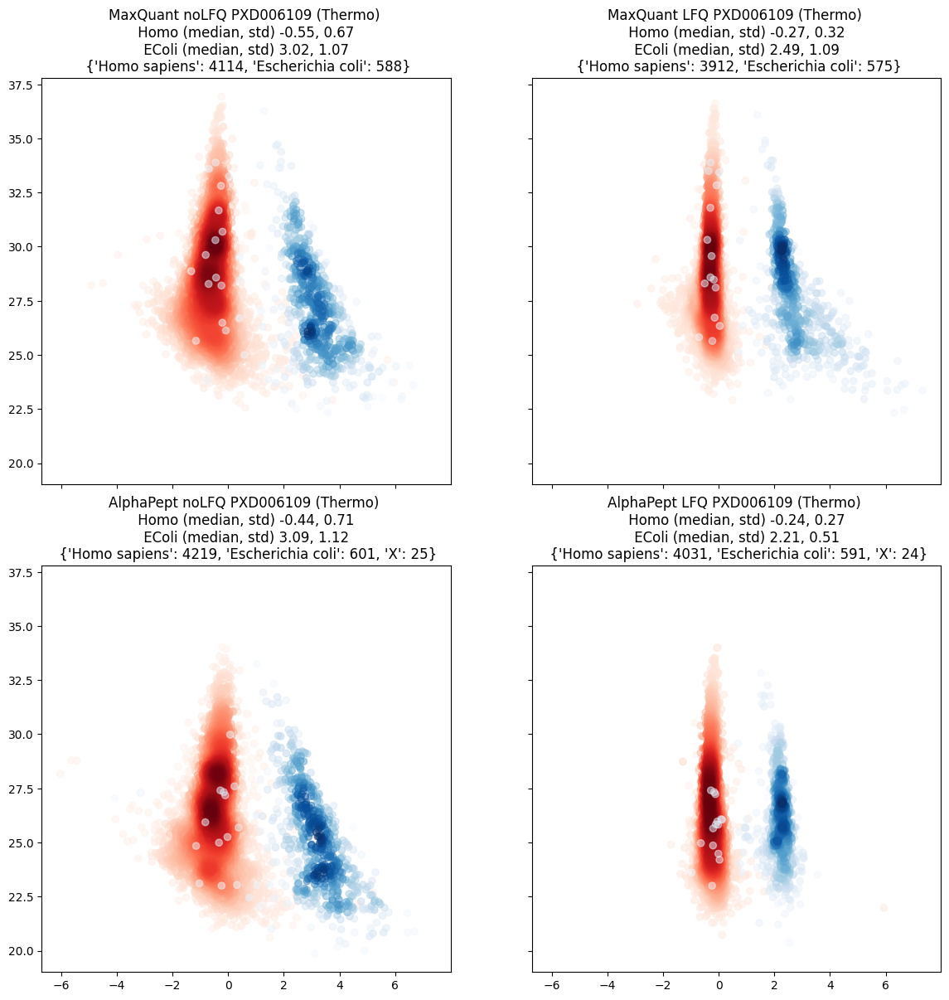

In [15]:
from test_helper import get_plot_df, add_species_column
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os

fig, axes = plt.subplots(2, 2, figsize=(14,14), sharex=True,sharey=True)

ref = pd.read_csv(os.path.join(tmp_folder,'PXD006109_ref.txt'), sep='\t') 
no_rev_cont = [(x[0]!="+") & (x[1] !="+") for x in ref[["Reverse","Potential contaminant"]].values]
ref = ref[no_rev_cont]
add_species_column(ref)
ref['Species'] = ref['Species'].replace(np.nan, "X")

for j, _ in enumerate(['noLFQ','LFQ']):
    if _ == 'LFQ':
        x = 'LFQ i'
    else:
        x = 'I'
        
    base_columns = [f"{x}ntensity Shotgun_02-01_{i}" for i in range(1,4)]
    ratio_columns = [f"{x}ntensity Shotgun_12-01_{i}" for i in range(1,4)]

    id_ = 'MaxQuant ' +_+' PXD006109 (Thermo)'
    get_plot_df(ref, base_columns, ratio_columns, axes[0,j], id_)


path = os.path.join(TEST_DIR, 'results.hdf') #TEST_DIR as set in test_ci.py
ref = pd.read_hdf(path, 'protein_table')
ref.columns = [os.path.split(_)[1].replace('.ms_data.hdf','') for _ in ref.columns]


species = []
for _ in ref.index:
    if 'HUMAN' in _:
        species.append('Homo sapiens')
    elif 'ECO' in _:
        species.append('Escherichia coli')
    else:
        species.append('X')
        
ref['Species'] = species

for j, _ in enumerate(['noLFQ','LFQ']):
    if _ == 'LFQ':
        x = '_LFQ'
    else:
        x = ''
        
    base_columns = [f"PXD006109_HeLa2_{i}{x}" for i in range(1,4)]
    ratio_columns = [f"PXD006109_HeLa12_{i}{x}" for i in range(1,4)]

    id_ = 'AlphaPept ' +_+' PXD006109 (Thermo)'
    get_plot_df(ref, base_columns, ratio_columns, axes[1,j], id_)

plt.show()

## CV plot

C:\Users\admin\AppData\Local\Temp\ipykernel_17256\1044225642.py:22: RuntimeWarning: invalid value encountered in true_divide
  cv = np.nanstd(ref[base_columns], axis=1) / np.nanmean(ref[base_columns], axis=1)
C:\Users\admin\AppData\Local\Temp\ipykernel_17256\1044225642.py:26: RuntimeWarning: invalid value encountered in true_divide
  cv = np.nanstd(ref[ratio_columns], axis=1) / np.nanmean(ref[ratio_columns], axis=1)
C:\Users\admin\AppData\Local\Temp\ipykernel_17256\1044225642.py:22: RuntimeWarning: invalid value encountered in true_divide
  cv = np.nanstd(ref[base_columns], axis=1) / np.nanmean(ref[base_columns], axis=1)
C:\Users\admin\AppData\Local\Temp\ipykernel_17256\1044225642.py:26: RuntimeWarning: invalid value encountered in true_divide
  cv = np.nanstd(ref[ratio_columns], axis=1) / np.nanmean(ref[ratio_columns], axis=1)
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\numpy\lib\nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, 

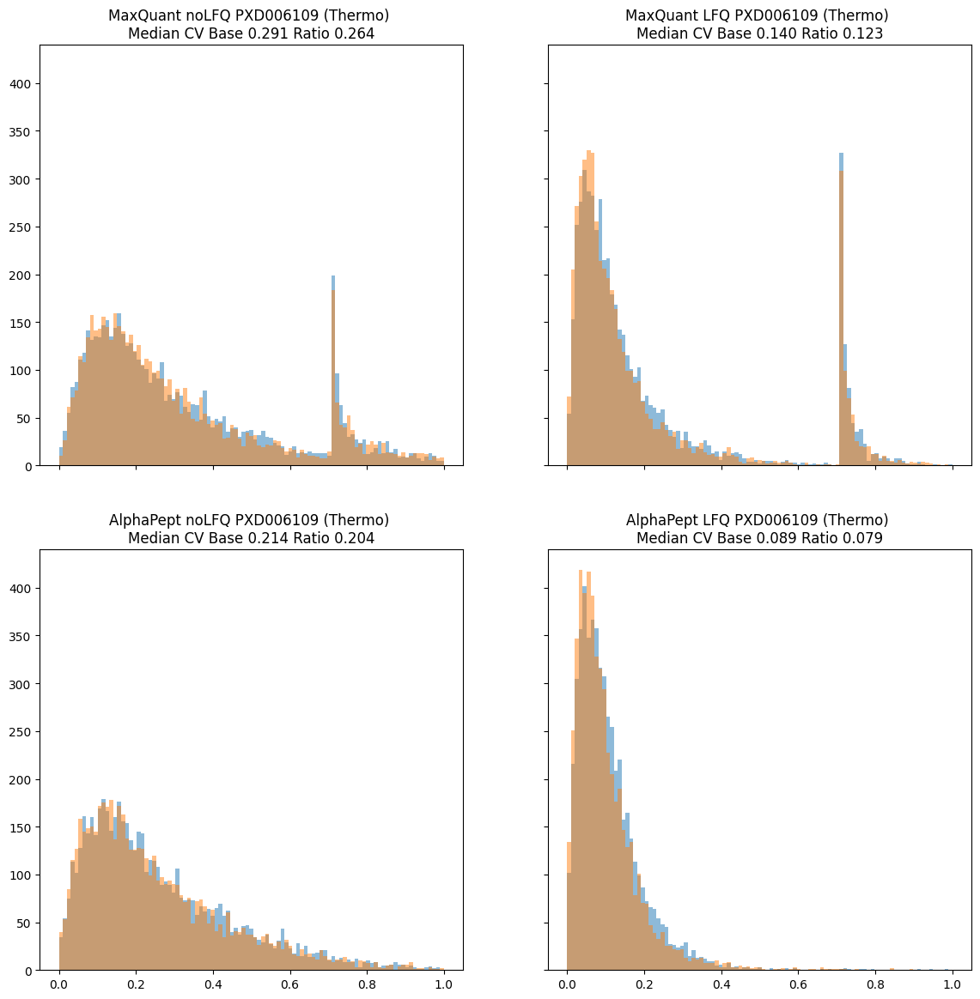

In [16]:
bins = np.linspace(0,1,100)

fig, axes = plt.subplots(2, 2, figsize=(14,14), sharex=True, sharey=True)

ref = pd.read_csv(os.path.join(tmp_folder,'PXD006109_ref.txt'), sep='\t') 
no_rev_cont = [(x[0]!="+") & (x[1] !="+") for x in ref[["Reverse","Potential contaminant"]].values]
ref = ref[no_rev_cont]
add_species_column(ref)
ref['Species'] = ref['Species'].replace(np.nan, "X")

for j, _ in enumerate(['noLFQ','LFQ']):
    if _ == 'LFQ':
        x = 'LFQ i'
    else:
        x = 'I'
        
    base_columns = [f"{x}ntensity Shotgun_02-01_{i}" for i in range(1,4)]
    ratio_columns = [f"{x}ntensity Shotgun_12-01_{i}" for i in range(1,4)]

    id_ = 'MaxQuant ' +_+' PXD006109 (Thermo)'
        
    cv = np.nanstd(ref[base_columns], axis=1) / np.nanmean(ref[base_columns], axis=1)
    cv_base = cv[cv>0]
    axes[0,j].hist(cv_base, bins = bins, label = id_, alpha = 0.5)
    
    cv = np.nanstd(ref[ratio_columns], axis=1) / np.nanmean(ref[ratio_columns], axis=1)
    cv_ratio = cv[cv>0]
    axes[0,j].hist(cv_ratio, bins = bins, label = id_, alpha = 0.5)

    axes[0,j].set_title(f'{id_} \nMedian CV Base {np.nanmedian(cv_base):.3f} Ratio {np.nanmedian(cv_ratio):.3f}')

path = os.path.join(TEST_DIR,'results.hdf') #TEST_DIR as set in test_ci.py
ref = pd.read_hdf(path, 'protein_table')
ref.columns = [os.path.split(_)[1].replace('.ms_data.hdf','') for _ in ref.columns]

species = []
for _ in ref.index:
    if 'HUMAN' in _:
        species.append('Homo sapiens')
    elif 'ECO' in _:
        species.append('Escherichia coli')
    else:
        species.append('X')
        
ref['Species'] = species

for j, _ in enumerate(['noLFQ','LFQ']):
    if _ == 'LFQ':
        x = '_LFQ'
    else:
        x = ''
        
    base_columns = [f"PXD006109_HeLa2_{i}{x}" for i in range(1,4)]
    ratio_columns = [f"PXD006109_HeLa12_{i}{x}" for i in range(1,4)]

    id_ = 'AlphaPept ' +_+' PXD006109 (Thermo)'

    cv = np.nanstd(ref[base_columns], axis=1) / np.nanmean(ref[base_columns], axis=1)
    cv_base = cv[cv>0]
    axes[1,j].hist(cv_base, bins = bins, label = id_, alpha = 0.5)
    
    cv = np.nanstd(ref[ratio_columns], axis=1) / np.nanmean(ref[ratio_columns], axis=1)
    cv_ratio = cv[cv>0]
    axes[1,j].hist(cv_ratio, bins = bins, label = id_, alpha = 0.5)

    axes[1,j].set_title(f'{id_} \nMedian CV Base {np.nanmedian(cv_base):.3f} Ratio {np.nanmedian(cv_ratio):.3f}')

    #axes[1,j].hist(cv, bins = bins, label = id_, alpha = 0.5)
    axes[1,j].set_title(f'{id_} \nMedian CV Base {np.nanmedian(cv_base):.3f} Ratio {np.nanmedian(cv_ratio):.3f}')

plt.show()

## Algorithm Test

Test performance of LFQ algorithm on MaxQuant evidence file.

In [17]:
try: 
    import ipywidgets
except ModuleNotFoundError:
    !pip install ipywidgets

In [18]:
from alphapept.quantification import delayed_normalization, protein_profile_parallel

In [19]:
def protein_profile_parallel_mq(evidence_path : str, protein_groups_path: str, minimum_ratios: int = 1, minimum_occurence:bool=None, delayed:bool = True, callback=None) -> pd.DataFrame:
    """Derives protein LFQ intensities from Maxquant quantified features.

    Args:
        evidence_path (str): path to the Maxquant standard output table evidence.txt.
        protein_groups_path (str): path to the Maxquant standard output table proteinGroups.txt.
        minimum_ratios (int): minimum ratios (LFQ parameter)
        minimum_occurence (int): minimum occurence (LFQ parameter)
        delayed (bool): toggle for delayed normalization (on/off)
        callback ([type], optional): [description]. Defaults to None.

    Raises:
        FileNotFoundError: if Maxquant files cannot be found.

    Returns:
        pd.DataFrame: table containing the LFQ intensities of each protein in each sample.
    """
    logging.info('Loading files')
    
    for file in [evidence_path, protein_groups_path]:
        if not os.path.isfile(file):
            raise FileNotFoundError(f'File {file} not found.')
            
    evd = pd.read_csv(evidence_path, sep='\t') 
    ref = pd.read_csv(protein_groups_path, sep='\t')
            
    experiments = evd['Experiment'].unique().tolist()
    logging.info(f'A total of {len(experiments):,} files.')
    
    
    if 'Fraction' not in evd.keys():
        logging.info('File does not contain Fractions. Setting Fractions to 1')
        evd['Fraction'] = 1

    protein_df = []
    
    max_ = len(ref)
    for i in range(max_):
        investigate = ref.iloc[i]
        evd_ids = [int(_) for _ in investigate['Evidence IDs'].split(';')]
        subset = evd.loc[evd_ids].copy()

        subset['protein_group'] =  investigate['Protein IDs']
        subset['sample_group'] = subset['Experiment']
        subset['fraction'] = subset['Fraction']
        subset['precursor']  = ['_'.join(_) for _ in zip(subset['Sequence'].values, subset['Charge'].values.astype('str'))]

        protein_df.append(subset)
        
        if callback:
            callback((i+1)/len(ref))
                     
    logging.info(f'A total of {max_:,} proteins.')

    df = pd.concat(protein_df)
    
    field = 'Intensity'
    
    if delayed:
        df, normed = delayed_normalization(df, field ='Intensity', minimum_occurence = minimum_occurence)
        field = 'Intensity_dn'
        
    protein_table = protein_profile_parallel(df, minimum_ratios=minimum_ratios, field=field, callback=callback)
                     
    return protein_table

2023-07-12 19:13:11> Loading files
2023-07-12 19:13:13> A total of 6 files.
2023-07-12 19:13:13> File does not contain Fractions. Setting Fractions to 1
2023-07-12 19:13:22> A total of 6,854 proteins.
2023-07-12 19:13:27> Setting minimum occurence to 6.0
2023-07-12 19:13:27> Delayed normalization with SLSQP on (1, 6, 14625)
2023-07-12 19:13:28> Preparing protein table for parallel processing.
2023-07-12 19:13:31> Starting protein extraction for 6854 proteins.
2023-07-12 19:13:31> AlphaPool was set to 24 processes. Setting max to 24.


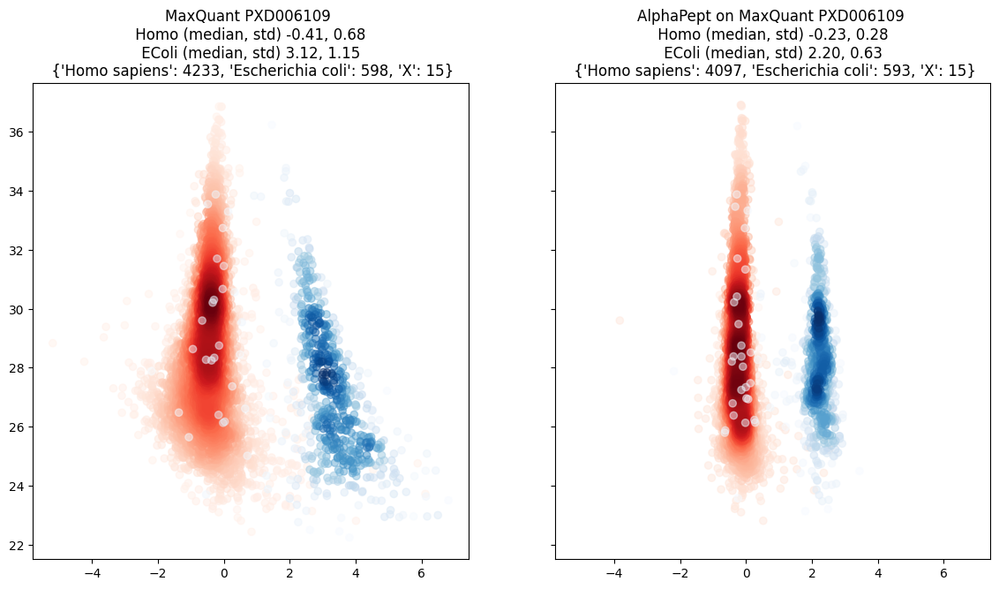

In [20]:
#from alphapept.quantification import protein_profile_parallel_mq
import test_helper
import pandas as pd

evidence_path = os.path.join(tmp_folder,'PXD006109_ref_evd.txt')
protein_group_path = os.path.join(tmp_folder,'PXD006109_ref.txt')

pt = protein_profile_parallel_mq(evidence_path, protein_group_path)

ref = pd.read_csv(protein_group_path, sep='\t')
test_helper.add_species_column(ref)
species_dict = pd.Series(ref['Species'].values, index=ref['Protein IDs']).to_dict()
pt['Species'] = [species_dict[_] for _ in pt.index]


pre_lfq = [_ for _ in pt.columns if not _.endswith('_LFQ')]
lfq = [_ for _ in pt.columns if _.endswith('_LFQ')]

test_id = 'PXD006109'

fig, axes = plt.subplots(1, 2, figsize=(14,7), sharex=True,sharey=True)

ids = [f'{software_2} {test_id}', f'{software_1} on {software_2} {test_id}']

for i, ds in enumerate([pre_lfq, lfq]):

    base_columns = [_ for _ in ds if 'Shotgun_02-01' in _]
    ratio_columns = [_ for _ in ds if 'Shotgun_12-01' in _]
    test_helper.get_plot_df(pt, base_columns, ratio_columns, axes[i], ids[i])

## Normalization Checks

### Check only the delayed normalization part

2023-07-12 19:15:57> Setting minimum occurence to 4.0
2023-07-12 19:15:57> Delayed normalization with SLSQP on (3, 3, 1744)
2023-07-12 19:15:58> Setting minimum occurence to 4.0
2023-07-12 19:15:58> Delayed normalization with SLSQP on (3, 3, 1747)


C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


2023-07-12 19:15:58> Setting minimum occurence to 4.0
2023-07-12 19:15:58> Delayed normalization with SLSQP on (3, 3, 1712)
2023-07-12 19:15:59> Setting minimum occurence to 4.0
2023-07-12 19:15:59> Delayed normalization with SLSQP on (3, 3, 1745)
2023-07-12 19:15:59> Setting minimum occurence to 4.0
2023-07-12 19:15:59> Delayed normalization with SLSQP on (3, 3, 1707)
2023-07-12 19:16:00> Setting minimum occurence to 4.0
2023-07-12 19:16:00> Delayed normalization with SLSQP on (3, 3, 1714)
2023-07-12 19:16:00> Setting minimum occurence to 4.0
2023-07-12 19:16:01> Delayed normalization with SLSQP on (3, 3, 1716)


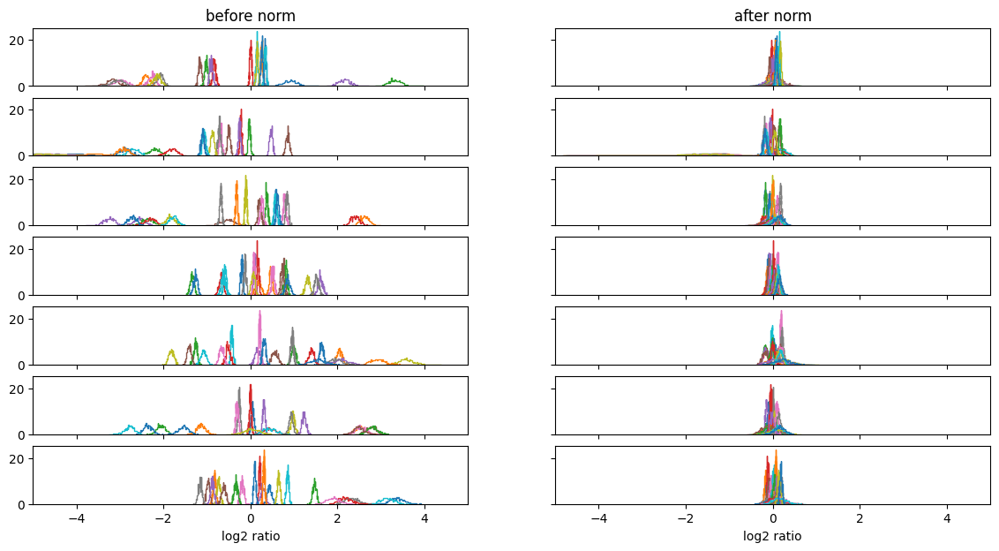

In [21]:
import itertools
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import test_helper
from alphapept.quantification import delayed_normalization


def visualize_normalization(simulated_df, axis, value = "Intensity",show_per_colpair = True):
    
    shortnames = df["sample_group"].unique()
    df["namefrac"] = [f"{n}_{f}" for n,f in zip(simulated_df["sample_group"], simulated_df["fraction"])]
    simulated_reformat = pd.pivot_table(simulated_df, values=value, columns="namefrac" ,index=["protein_group", "precursor" ])
    
    for namepair in itertools.combinations(shortnames, 2):
        cols1 = [x for x in simulated_reformat.columns if namepair[0] in x]
        cols2 = [x for x in simulated_reformat.columns if namepair[1] in x]
        for colpair in itertools.product(cols1, cols2):
            fcs = np.log2(simulated_reformat[colpair[0]]) - np.log2(simulated_reformat[colpair[1]])
            axis.hist(fcs, histtype = 'step', bins = 50, label = f"{colpair}", density = True)
            axis.set_xlim(-5, 5)

samplenames = ["A1", "A2","B1"]
fractions = [3, 2, 3]

ntests = 7
fig, axes = plt.subplots(nrows = 7, ncols = 2, figsize=(14,7), sharex=True,sharey=True)
count_axis = 0
axes[0][0].set_title("before norm")
axes[-1][0].set_xlabel('log2 ratio')
axes[0][1].set_title("after norm")
axes[-1][1].set_xlabel('log2 ratio')
for _ in range(ntests):
    df = test_helper.simulate_biased_peptides(5000, samplenames, fractions)
    df_del, normed = delayed_normalization(df, field ='Intensity')
    visualize_normalization(df, axes[count_axis][0],value = "Intensity", show_per_colpair = False)
    visualize_normalization(df_del, axes[count_axis][1],value = "Intensity_dn", show_per_colpair = False)
    count_axis+=1

### Check delayed normalization + protein intensity estimation

2023-07-12 19:16:03> Setting minimum occurence to 3.0
2023-07-12 19:16:03> Delayed normalization with SLSQP on (1, 3, 20000)
2023-07-12 19:16:03> Preparing protein table for parallel processing.
2023-07-12 19:16:04> Starting protein extraction for 3321 proteins.
2023-07-12 19:16:04> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 19:16:33> Preparing protein table for parallel processing.


C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\numpy\lib\histograms.py:1123: RuntimeWarning: invalid value encountered in true_divide
  hist /= s
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\numpy\lib\histograms.py:1123: RuntimeWarning: invalid value encountered in true_divide
  hist /= s
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\numpy\lib\histograms.py:1123: RuntimeWarning: invalid value encountered in true_divide
  hist /= s
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\numpy\lib\histograms.py:1123: RuntimeWarning: invalid value encountered in true_divide
  hist /= s


2023-07-12 19:16:34> Starting protein extraction for 3321 proteins.
2023-07-12 19:16:34> AlphaPool was set to 24 processes. Setting max to 24.


C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\numpy\lib\histograms.py:1123: RuntimeWarning: invalid value encountered in true_divide
  hist /= s
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\numpy\lib\histograms.py:1123: RuntimeWarning: invalid value encountered in true_divide
  hist /= s
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\numpy\lib\histograms.py:1123: RuntimeWarning: invalid value encountered in true_divide
  hist /= s
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\numpy\lib\histograms.py:1123: RuntimeWarning: invalid value encountered in true_divide
  hist /= s


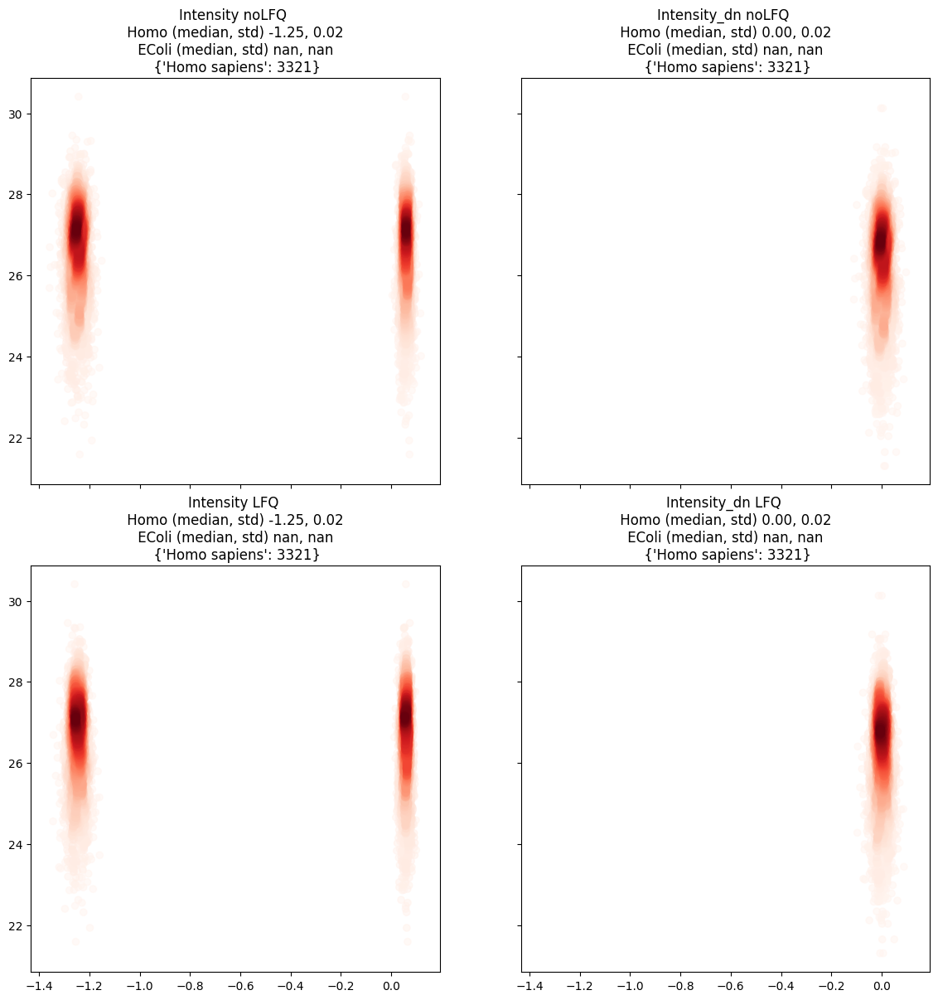

In [22]:
from alphapept.quantification import delayed_normalization, protein_profile_parallel
import test_helper
import pandas as pd
import matplotlib.pyplot as plt
import itertools

samplenames = ["A1", "A2", "B1"]
fractions = [1, 1, 1]
test_id = 'PXD006109'

df = test_helper.simulate_biased_peptides(20000, samplenames, fractions)
df, normed = delayed_normalization(df, field ='Intensity')

fields = ['Intensity', 'Intensity_dn']
tests = ['noLFQ', 'LFQ']

fig, axes = plt.subplots(2, 2, figsize=(14,14), sharex=True, sharey=True)

for j, field in  enumerate(fields):
    
    pt = protein_profile_parallel(df, minimum_ratios=1, field=field)
    pt['Species'] = ["Homo sapiens" for x in range(len(pt.index))]
    
    pre_lfq = [_ for _ in pt.columns if not _.endswith('_LFQ')]
    lfq = [_ for _ in pt.columns if _.endswith('_LFQ')]
    
    for i, cols in enumerate([pre_lfq, lfq]):
        
        ax = axes[i, j]
        samplepairs = itertools.product([x for x in cols if "A" in x ], [x for x in cols if "B" in x ])
        
        for pair in samplepairs:
            
            base_columns = [pair[0]]
            ratio_columns = [pair[1]]
            test_helper.get_plot_df(pt, base_columns, ratio_columns, ax, f"{fields[j]} {tests[i]}", valid_filter = False)

plt.show()

### Bruker HeLa

2023-07-12 19:17:15> Creating dir F:\projects\alphapept\sandbox\temp/test_temp.
2023-07-12 19:17:20> No settings provided. Creating from default settings.
2023-07-12 19:17:20> Platform information:
2023-07-12 19:17:20> system     - Windows
2023-07-12 19:17:20> release    - 10
2023-07-12 19:17:20> version    - 10.0.19044
2023-07-12 19:17:20> machine    - AMD64
2023-07-12 19:17:20> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 19:17:20> cpu count  - 24
2023-07-12 19:17:20> ram memory - 113.4/127.7 Gb (available/total)
2023-07-12 19:17:20> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 19:17:20> Python information:
2023-07-12 19:17:20> SQLAlchemy                    - 1.4.39
2023-07-12 19:17:20> alphapept                     - 0.5.0
2023-07-12 19:17:20> alpharaw                      - 0.1.0
2023-07-12 19:17:20> alphatims                     - 1.0.7
2023-07-12 19:17:20> biopython                     - 1.79
2023-07-12 19:17:20> bumpver

2023-07-12 19:17:21> 
2023-07-12 19:17:21> Checking if files exist.
2023-07-12 19:17:21> FASTA Files have a total size of 21.952 Mb
2023-07-12 19:17:21> Workflow has 11 steps
2023-07-12 19:17:21> ==== create_database ====
2023-07-12 19:17:21> Database path F:\projects\alphapept\sandbox\temp\test_temp\database.hdf is not a file.
2023-07-12 19:17:21> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\human.fasta with size 12.97 Mb.
2023-07-12 19:17:21> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\arabidopsis.fasta with size 8.84 Mb.
2023-07-12 19:17:21> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\contaminants.fasta with size 0.15 Mb.
2023-07-12 19:17:21> Creating a new database from FASTA.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:17:22> FASTA contains 36,789 entries.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [02:21<00:00, 40.96s/it]

2023-07-12 19:19:59> Digested 36,789 proteins and generated 8,739,362 spectra
2023-07-12 19:21:18> Database saved to F:\projects\alphapept\sandbox\temp\test_temp\database.hdf. Filesize of database is 3.37 GB


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [03:57<00:00, 237.70s/it]

2023-07-12 19:21:33> ==== import_raw_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:21:33> Processing 1 files for step raw_conversion
2023-07-12 19:21:33> File F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa has extension .d - converting from Bruker.
2023-07-12 19:21:33> WARNING: Temp mmap arrays are written to C:\Users\admin\AppData\Local\Temp\temp_mmap__d6nqa6s. Cleanup of this folder is OS dependant, and might need to be triggered manually! Current space: 190,986,600,448
2023-07-12 19:21:35> Importing data from F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d
2023-07-12 19:21:35> Using .d import for F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d
2023-07-12 19:21:35> Reading frame metadata for F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d
2023-07-12 19:21:38> Reading 68,114 frames with 2,074,019,899 detector events for F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d



  8%|████████████                                                                                                                                   | 5724/68114 [00:05<00:50, 1224.49it/s]


 17%|███████████████████████▉                                                                                                                      | 11495/68114 [00:09<00:43, 1302.13it/s]


 25%|███████████████████████████████████▊                                                                                                          | 17167/68114 [00:14<00:43, 1172.33it/s]


 34%|████████████████████████████████████████████████                                                                                              | 23062/68114 [00:18<00:34, 1310.26it/s]


 42%|████████████████████████████████████████████████████████████▎                                                                                 | 28903/68114 [00:23<00:26, 1484.20it/s]


 51%|████████████████████████████████████████████████████████████████████████▏                                                                     | 34627/68114 [00:28<00:29, 1121.09it/s]


 59%|███████████████████████████████████████████████████████████████████████████████████▋                                                          | 40123/68114 [00:32<00:21, 1289.68it/s]


 67%|███████████████████████████████████████████████████████████████████████████████████████████████                                               | 45614/68114 [00:37<00:19, 1126.85it/s]


 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 51243/68114 [00:41<00:13, 1261.02it/s]


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 56877/68114 [00:46<00:07, 1477.31it/s]


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 62592/68114 [00:51<00:03, 1392.73it/s]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 68114/68114 [00:55<00:00, 1233.79it/s]


2023-07-12 19:22:33> Indexing F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d...
2023-07-12 19:22:33> Opening handle for F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d
2023-07-12 19:22:33> Fetching mobility values from F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d
2023-07-12 19:22:33> Closing handle for F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d
2023-07-12 19:22:33> WARNING: Acquisition software is Bruker otofControl, mz min/max values are assumed to be 5 m/z wider than defined in analysis.tdf!
2023-07-12 19:22:33> Opening handle for F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d
2023-07-12 19:22:33> Fetching mz values from F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d
2023-07-12 19:22:34> Closing handle for F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d
2023-07-12 19:22:34> Indexing quadrupole dimension
2023-07-12 19:22:40> Successfully imported data from F:\projects\alphapept\sandbox\temp/test_te


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 299728/299728 [00:01<00:00, 187602.91it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 299728/299728 [00:01<00:00, 157450.03it/s]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 299728/299728 [00:03<00:00, 99019.83it/s]

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 299728/299728 [00:01<00:00, 247086.15it/s]


2023-07-12 19:22:49> File conversion complete. Extracted 299,728 precursors.
2023-07-12 19:22:50> File conversion of file F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d complete.
2023-07-12 19:22:50> ==== feature_finding ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:22:50> Processing 1 files for step find_features
2023-07-12 19:22:50> No *.hdf file with features found for F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.ms_data.hdf. Adding to feature finding list.
2023-07-12 19:22:51> Feature finding on F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d
2023-07-12 19:22:51> Using Windows FF
2023-07-12 19:22:55> Bruker featurer finder complete. Extracted 261,932 features.
2023-07-12 19:22:55> Matching features to query data.
2023-07-12 19:22:59> Saving feature table.
2023-07-12 19:22:59> Feature table saved to F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.ms_data.hdf
2023-07-12 19:22:59> Saving features.
2023-07-12 19:22:59> Feature finding of file F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d complete.


  0%|                                                                                                                                                                | 0/1 [00:09<?, ?it/s]

2023-07-12 19:22:59> ==== search_data ====




  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:22:59> Starting first search.
2023-07-12 19:22:59> Processing 1 files for step search_db
2023-07-12 19:23:00> Calibrating fragments


C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


2023-07-12 19:23:20> Performing search on 665,083 query and 8,739,362 db entries with frag_tol = 50.00 and prec_tol = 20.00.
2023-07-12 19:23:52> Found 1,839,841 psms.
2023-07-12 19:23:53> Extracting columns for scoring.


  0%|                                                                                                                                                                | 0/1 [02:51<?, ?it/s]


2023-07-12 19:27:35> Extracted columns from 1,839,841 spectra.
2023-07-12 19:27:36> Saving first_search results to F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.ms_data.hdf
2023-07-12 19:27:43> Search of file F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d complete.
2023-07-12 19:28:09> First search complete.


  0%|                                                                                                                                                                | 0/1 [05:09<?, ?it/s]

2023-07-12 19:28:09> ==== recalibrate_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:28:09> Processing 1 files for step calibrate_hdf
2023-07-12 19:28:09> Recalibrating file F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d.
2023-07-12 19:28:12> Scoring using generic score
2023-07-12 19:28:14> 53,462 target (534 decoy) of 256,481 PSMs. FDR 0.009988 for a cutoff of 10.74 (set FDR was 0.01).
2023-07-12 19:28:14> Precursor mass calibration for file F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d.
2023-07-12 19:28:23> Precursor calibration std 1.82, 0.25
2023-07-12 19:28:23> Saving precursor calibration
2023-07-12 19:28:29> Precursor calibration of file F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.ms_data.hdf complete.
2023-07-12 19:28:29> Starting fragment calibration.
2023-07-12 19:28:29> Calibrating fragments with neighbors
2023-07-12 19:28:33> Scoring using generic score
2023-07-12 19:28:36> 53,462 target (534 decoy) of 256,481 PSMs. FDR 0.009988 for a cutoff of 10.74 (set FDR was 0.01).
2023-07-12 19:28:39> Minimum hits fo

  0%|                                                                                                                                                                | 0/1 [03:16<?, ?it/s]

2023-07-12 19:31:25> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:31:25> Starting second search with DB.
2023-07-12 19:31:25> Processing 1 files for step search_db
2023-07-12 19:31:25> Found calibrated prec_tol with value 9.11
2023-07-12 19:31:25> Found calibrated frag_tol with value 45.41
2023-07-12 19:31:29> Performing search on 665,083 query and 8,739,362 db entries with frag_tol = 45.41 and prec_tol = 9.11.
2023-07-12 19:31:47> Found 1,161,595 psms.
2023-07-12 19:31:47> Extracting columns for scoring.
2023-07-12 19:33:58> Extracted columns from 1,161,595 spectra.
2023-07-12 19:33:58> Saving second_search results to F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.ms_data.hdf
2023-07-12 19:34:03> Search of file F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d complete.
2023-07-12 19:34:28> Second search complete.


  0%|                                                                                                                                                                | 0/1 [03:02<?, ?it/s]

2023-07-12 19:34:28> ==== score ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:34:28> Processing 1 files for step score_hdf
2023-07-12 19:34:28> Calling score_hdf
2023-07-12 19:34:30> Found second search psms for scoring.
2023-07-12 19:34:49> 85,252 target (8,525 decoy) of 216,749 PSMs. FDR 0.099998 for a cutoff of 7.51 (set FDR was 0.1).
2023-07-12 19:34:49> Training & cross-validation on 18,842 targets and 18,842 decoys
2023-07-12 19:35:19> The best parameters selected by 5-fold cross-validation were {'clf__max_depth': 25, 'clf__max_leaf_nodes': 150}
2023-07-12 19:35:19> The train accuracy was 0.943
2023-07-12 19:35:19> Testing on 75,369 targets and 75,369 decoys
2023-07-12 19:35:20> The test accuracy was 0.934
2023-07-12 19:35:20> ML Top features
2023-07-12 19:35:20> 1	generic_score                  0.2882
2023-07-12 19:35:20> 2	hits_y                         0.1753
2023-07-12 19:35:20> 3	hits                           0.1674
2023-07-12 19:35:20> 4	x_tandem                       0.0964
2023-07-12 19:35:20> 5	fragments_matched_n_ratio      0.0477


C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2023-07-12 19:35:29> 154,228 target (1,542 decoy) of 327,846 PSMs. FDR 0.009998 for a cutoff of 0.83 (set FDR was 0.01).
2023-07-12 19:35:29> Saving identifications to ms_data file.
2023-07-12 19:35:30> Saving identifications to ms_data file complete.
2023-07-12 19:35:40> Saving identifications to csv file complete.
2023-07-12 19:35:40> Filter df with custom score
2023-07-12 19:35:41> Global FDR on precursor
2023-07-12 19:35:42> 68,838 target (688 decoy) of 200,454 PSMs. FDR 0.009994 for a cutoff of 0.88 (set FDR was 0.01).
2023-07-12 19:35:42> Global FDR cutoff at 0.879.
2023-07-12 19:35:43> FDR on peptides complete. For 0.01 FDR found 73,834 targets and 690 decoys.
2023-07-12 19:35:43> Extracting fragment_ions
2023-07-12 19:36:00> Extracting fragment_ions complete.
2023-07-12 19:36:01> Exporting peptide_fdr on F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d.
2023-07-12 19:36:01> Scoring of files F:\projects\alphapept\sandbox\temp/test_temp\bruker_HeLa.d complete.


  0%|                                                                                                                                                                | 0/1 [01:33<?, ?it/s]

2023-07-12 19:36:02> ==== isobaric_labeling ====
2023-07-12 19:36:02> ==== protein_grouping ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:36:02> Fasta dict with length 36,789, Pept dict with length 8,739,368
2023-07-12 19:36:02> Extracting protein groups.



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]


2023-07-12 19:36:02> A total of 57,107 unique and 3,233 shared peptides.
2023-07-12 19:36:04> A total of 871 ambigious proteins
2023-07-12 19:36:04> A total of 659 unique and 28 shared peptides.
2023-07-12 19:36:04> A total of 28 ambigious proteins
2023-07-12 19:36:04> Global FDR on protein_group
2023-07-12 19:36:04> 6,475 target (64 decoy) of 8,013 PSMs. FDR 0.009884 for a cutoff of 0.98 (set FDR was 0.01).
2023-07-12 19:36:04> Global FDR cutoff at 0.976.
2023-07-12 19:36:05> FDR on proteins complete. For 0.01 FDR found 72,885 targets and 67 decoys. A total of 6,539 proteins found.
2023-07-12 19:36:05> Saving complete.
2023-07-12 19:36:05> Protein groups complete.


  0%|                                                                                                                                                                | 0/1 [00:03<?, ?it/s]

2023-07-12 19:36:05> ==== quantification ====
2023-07-12 19:36:05> Reading protein_fdr for quantification.


2023-07-12 19:36:05> Saving protein_groups after delayed normalization to combined_protein_fdr_dn
2023-07-12 19:36:05> Complete.
2023-07-12 19:36:05> Starting profile extraction.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.97it/s]

2023-07-12 19:36:05> LFQ complete.
2023-07-12 19:36:05> Extracting protein_summary
2023-07-12 19:36:05> Saved protein_summary of length 6,539 saved to F:\projects\alphapept\sandbox\temp\test_temp\results_protein_summary.csv
2023-07-12 19:36:05> Updating protein_fdr.
2023-07-12 19:36:06> Exporting as csv.
2023-07-12 19:36:08> Saved df of length 72,952 saved to F:\projects\alphapept\sandbox\temp\test_temp\results


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.21s/it]

2023-07-12 19:36:08> ==== export ====


2023-07-12 19:36:16> Settings saved to F:\projects\alphapept\sandbox\temp\test_temp\results.yaml
2023-07-12 19:36:16> Analysis complete.


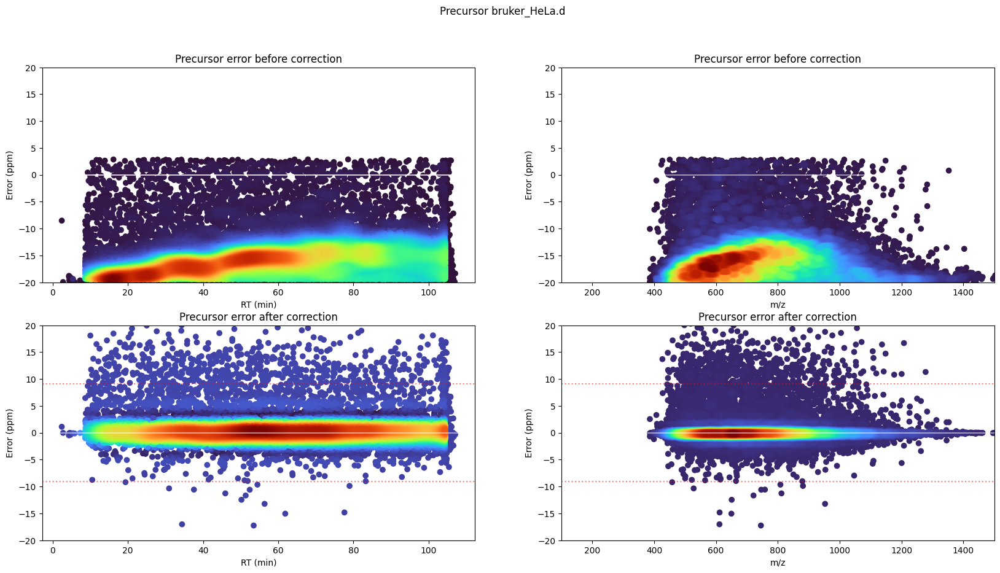

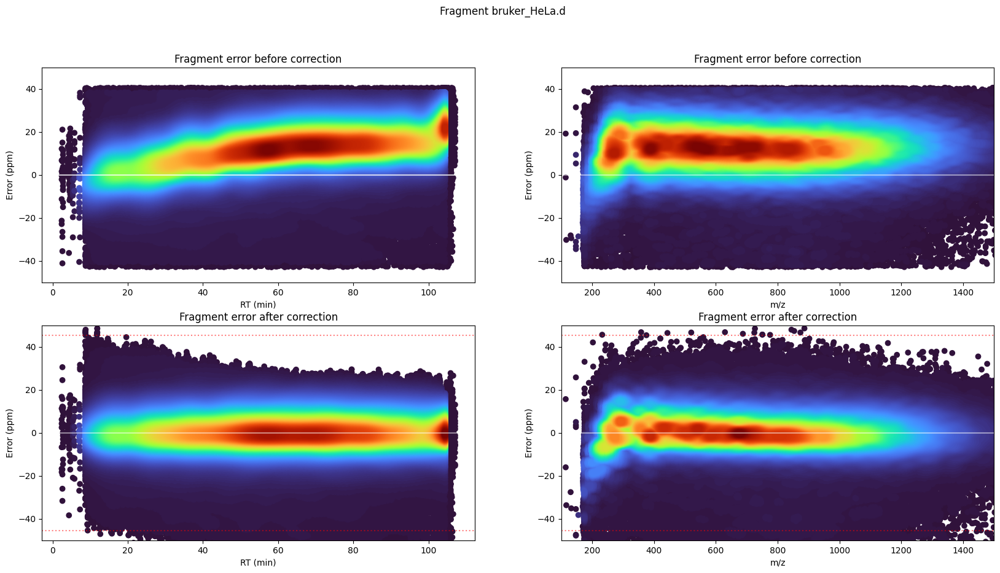

In [23]:
%run -i ../test_ci.py $tmp_folder bruker_hela

F:\projects\alphapept\sandbox\test_helper.py:51: DtypeWarning: Columns (12,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df2 = pd.read_csv(path2, sep='\t')


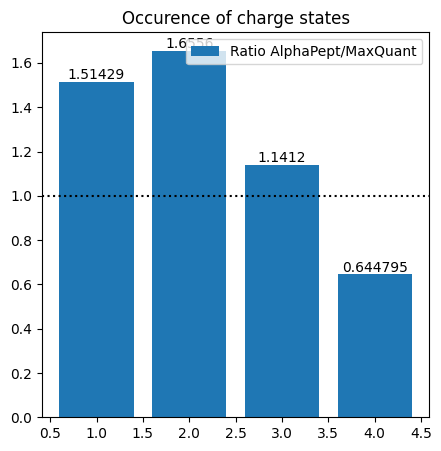

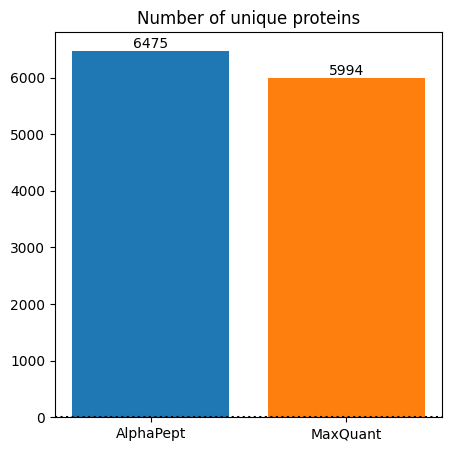

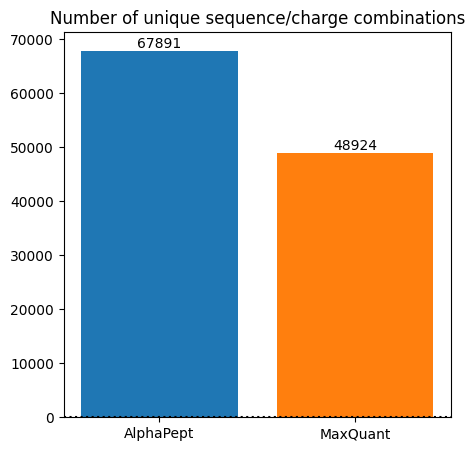

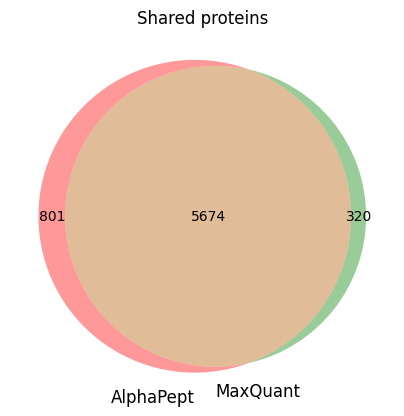

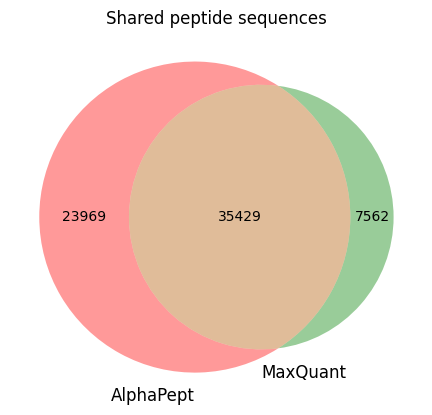

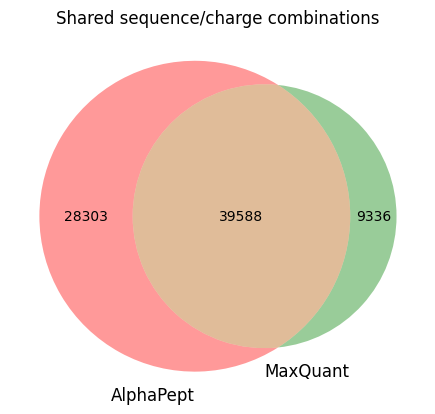

F:\projects\alphapept\sandbox\test_helper.py:180: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  ax = density_scatter(d1.loc[shared]['fragments_int_sum'].values, d2.loc[shared]['ms1_int_sum'].values, ax = ax, bins=30)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  ax = density_scatter(d1.loc[shared]['fragments_int_sum'].values, d2.loc[shared]['ms1_int_sum'].values, ax = ax, bins=30)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  ax = density_scatter(d1.loc[shared]['fragments_int_sum'].values, d2.loc[shared]['ms1_int_sum'].values, ax = ax, bins=30)
F:\projects\alphapept\sandbox\test_helper.py:180: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version.

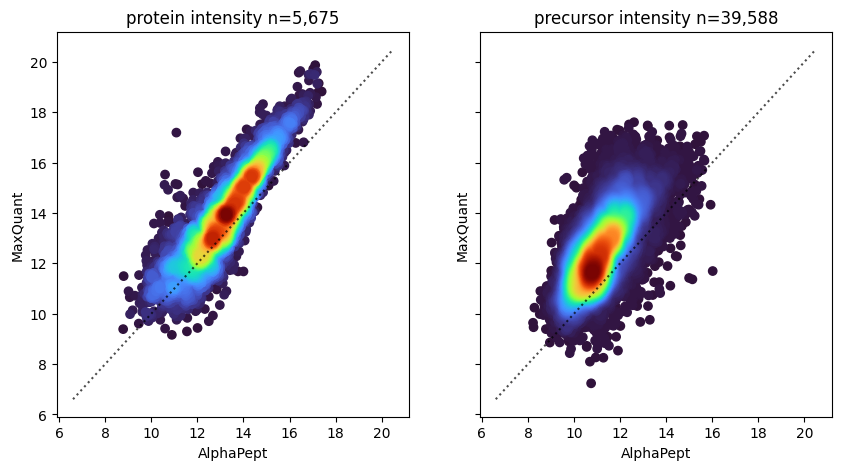

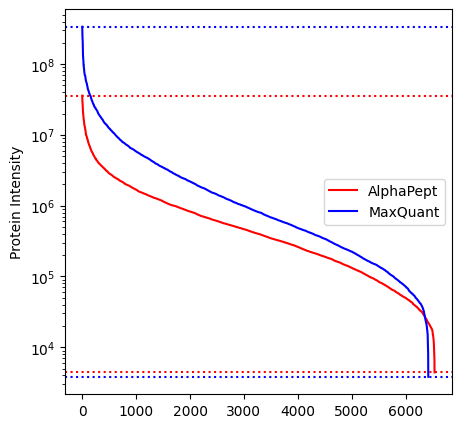

In [24]:
from test_helper import prepare_files, compare_field, compare_populations, compare_intensities, protein_rank

df1, df2 = prepare_files(os.path.join(TEST_DIR, "results.hdf"), os.path.join(tmp_folder,'bruker_HeLa_evd.txt'))
for field in ['charge','protein','precursor']:
    compare_field(df1, df2, software_1, software_2, field)
    
for field in ['protein','sequence','precursor']:
    compare_populations(df1, df2, software_1, software_2, field)
    
compare_intensities(df1, df2,software_1, software_2)

protein_rank(df1, df2,software_1, software_2)

## PXD010012

In [25]:
%run -i ../test_ci.py $tmp_folder PXD010012

2023-07-12 19:37:07> Creating dir F:\projects\alphapept\sandbox\temp/test_temp.
2023-07-12 19:39:48> No settings provided. Creating from default settings.
2023-07-12 19:39:48> Platform information:
2023-07-12 19:39:48> system     - Windows
2023-07-12 19:39:48> release    - 10
2023-07-12 19:39:48> version    - 10.0.19044
2023-07-12 19:39:48> machine    - AMD64
2023-07-12 19:39:48> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 19:39:48> cpu count  - 24
2023-07-12 19:39:48> ram memory - 105.2/127.7 Gb (available/total)
2023-07-12 19:39:48> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 19:39:48> Python information:
2023-07-12 19:39:48> SQLAlchemy                    - 1.4.39
2023-07-12 19:39:48> alphapept                     - 0.5.0
2023-07-12 19:39:48> alpharaw                      - 0.1.0
2023-07-12 19:39:48> alphatims                     - 1.0.7
2023-07-12 19:39:48> biopython                     - 1.79
2023-07-12 19:39:48> bumpver

2023-07-12 19:39:49> 
2023-07-12 19:39:49> Checking if files exist.
2023-07-12 19:39:49> FASTA Files have a total size of 22.754 Mb
2023-07-12 19:39:49> Workflow has 11 steps
2023-07-12 19:39:49> ==== create_database ====
2023-07-12 19:39:49> Database path F:\projects\alphapept\sandbox\temp\test_temp\database.hdf is not a file.
2023-07-12 19:39:49> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\human.fasta with size 12.97 Mb.
2023-07-12 19:39:49> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\e_coli.fasta with size 9.64 Mb.
2023-07-12 19:39:49> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\contaminants.fasta with size 0.15 Mb.
2023-07-12 19:39:49> Creating a new database from FASTA.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:39:50> FASTA contains 43,752 entries.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [02:09<00:00, 48.67s/it]

2023-07-12 19:42:13> Digested 43,752 proteins and generated 5,917,832 spectra
2023-07-12 19:43:07> Database saved to F:\projects\alphapept\sandbox\temp\test_temp\database.hdf. Filesize of database is 2.30 GB


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [03:18<00:00, 198.43s/it]

2023-07-12 19:43:16> ==== import_raw_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:43:16> Processing 10 files for step raw_conversion
2023-07-12 19:43:16> Importing Raw data with Bruker. Setting Process limit to 10.
2023-07-12 19:43:16> AlphaPool was set to 10 processes. Setting max to 10.
2023-07-12 19:47:02> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_1_C1_01_Base.d for step raw_conversion succeeded. 10.00 %


 10%|██████████████▊                                                                                                                                     | 0.1/1 [03:45<33:53, 2259.33s/it]

2023-07-12 19:47:02> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_2_C1_01_Base.d for step raw_conversion succeeded. 20.00 %
2023-07-12 19:47:02> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_3_C1_01_Base.d for step raw_conversion succeeded. 30.00 %
2023-07-12 19:47:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_4_C1_01_Base.d for step raw_conversion succeeded. 40.00 %


 40%|███████████████████████████████████████████████████████████▌                                                                                         | 0.4/1 [03:46<04:16, 428.04s/it]

2023-07-12 19:47:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_5_C1_01_Base.d for step raw_conversion succeeded. 50.00 %
2023-07-12 19:47:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_1_C2_01_Ratio.d for step raw_conversion succeeded. 60.00 %
2023-07-12 19:47:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_2_C2_01_Ratio.d for step raw_conversion succeeded. 70.00 %
2023-07-12 19:47:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_3_C2_01_Ratio.d for step raw_conversion succeeded. 80.00 %
2023-07-12 19:47:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_4_C2_01_Ratio.d for step raw_conversion succeeded. 90.00 %
2023-07-12 19:47:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_5_C2_01_Ratio.d for step raw_conversion succeeded. 100.00 %


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [03:46<00:00, 226.43s/it]

2023-07-12 19:47:03> ==== feature_finding ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:47:03> Processing 10 files for step find_features
2023-07-12 19:47:03> Using Bruker Feature Finder. Setting Process limit to 4.
2023-07-12 19:47:03> AlphaPool was set to 4 processes. Setting max to 4.
2023-07-12 19:47:24> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_1_C1_01_Base.d for step find_features succeeded. 10.00 %


 10%|██████████████▉                                                                                                                                      | 0.1/1 [00:21<03:10, 211.17s/it]

2023-07-12 19:47:24> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_2_C1_01_Base.d for step find_features succeeded. 20.00 %


 20%|██████████████████████████████                                                                                                                        | 0.2/1 [00:21<01:10, 87.92s/it]

2023-07-12 19:47:24> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_3_C1_01_Base.d for step find_features succeeded. 30.00 %


 30%|█████████████████████████████████████████████                                                                                                         | 0.3/1 [00:21<00:33, 48.48s/it]

2023-07-12 19:47:24> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_4_C1_01_Base.d for step find_features succeeded. 40.00 %
2023-07-12 19:47:35> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_5_C1_01_Base.d for step find_features succeeded. 50.00 %


 50%|███████████████████████████████████████████████████████████████████████████                                                                           | 0.5/1 [00:32<00:26, 52.05s/it]

2023-07-12 19:47:35> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_1_C2_01_Ratio.d for step find_features succeeded. 60.00 %


 60%|██████████████████████████████████████████████████████████████████████████████████████████                                                            | 0.6/1 [00:32<00:15, 37.73s/it]

2023-07-12 19:47:36> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_2_C2_01_Ratio.d for step find_features succeeded. 70.00 %


 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 0.7/1 [00:32<00:08, 27.12s/it]

2023-07-12 19:47:36> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_3_C2_01_Ratio.d for step find_features succeeded. 80.00 %


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 0.8/1 [00:32<00:03, 19.63s/it]

2023-07-12 19:47:46> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_4_C2_01_Ratio.d for step find_features succeeded. 90.00 %


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████               | 0.9/1 [00:42<00:04, 43.59s/it]

2023-07-12 19:47:46> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_5_C2_01_Ratio.d for step find_features succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:43<00:00, 43.22s/it]

2023-07-12 19:47:46> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:47:46> Starting first search.
2023-07-12 19:47:46> Processing 10 files for step search_db
2023-07-12 19:47:46> Searching. Setting Process limit to 10.
2023-07-12 19:47:46> AlphaPool was set to 10 processes. Setting max to 10.
2023-07-12 19:54:47> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_1_C1_01_Base.d for step search_db succeeded. 10.00 %


 10%|██████████████▌                                                                                                                                   | 0.1/1 [07:01<1:03:11, 4212.28s/it]

2023-07-12 19:54:47> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_2_C1_01_Base.d for step search_db succeeded. 20.00 %
2023-07-12 19:54:47> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_3_C1_01_Base.d for step search_db succeeded. 30.00 %
2023-07-12 19:54:47> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_4_C1_01_Base.d for step search_db succeeded. 40.00 %
2023-07-12 19:54:51> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_5_C1_01_Base.d for step search_db succeeded. 50.00 %


 50%|██████████████████████████████████████████████████████████████████████████▌                                                                          | 0.5/1 [07:04<05:17, 634.97s/it]

2023-07-12 19:54:51> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_1_C2_01_Ratio.d for step search_db succeeded. 60.00 %
2023-07-12 19:54:51> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_2_C2_01_Ratio.d for step search_db succeeded. 70.00 %
2023-07-12 19:54:51> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_3_C2_01_Ratio.d for step search_db succeeded. 80.00 %
2023-07-12 19:54:51> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_4_C2_01_Ratio.d for step search_db succeeded. 90.00 %
2023-07-12 19:54:51> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_5_C2_01_Ratio.d for step search_db succeeded. 100.00 %
2023-07-12 19:55:36> First search complete.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [07:49<00:00, 469.88s/it]

2023-07-12 19:55:36> ==== recalibrate_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:55:36> Processing 10 files for step calibrate_hdf
2023-07-12 19:55:36> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 19:57:52> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_1_C1_01_Base.d for step calibrate_hdf succeeded. 10.00 %


 10%|██████████████▊                                                                                                                                     | 0.1/1 [02:15<20:21, 1357.52s/it]

2023-07-12 19:57:53> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_2_C1_01_Base.d for step calibrate_hdf succeeded. 20.00 %


 20%|█████████████████████████████▊                                                                                                                       | 0.2/1 [02:16<07:31, 564.78s/it]

2023-07-12 19:57:53> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_3_C1_01_Base.d for step calibrate_hdf succeeded. 30.00 %
2023-07-12 19:57:53> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_4_C1_01_Base.d for step calibrate_hdf succeeded. 40.00 %
2023-07-12 19:57:53> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_5_C1_01_Base.d for step calibrate_hdf succeeded. 50.00 %
2023-07-12 19:58:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_1_C2_01_Ratio.d for step calibrate_hdf succeeded. 60.00 %


 60%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 0.6/1 [02:26<00:59, 148.72s/it]

2023-07-12 19:58:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_2_C2_01_Ratio.d for step calibrate_hdf succeeded. 70.00 %
2023-07-12 19:58:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_3_C2_01_Ratio.d for step calibrate_hdf succeeded. 80.00 %
2023-07-12 19:58:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_4_C2_01_Ratio.d for step calibrate_hdf succeeded. 90.00 %
2023-07-12 19:58:03> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_5_C2_01_Ratio.d for step calibrate_hdf succeeded. 100.00 %


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [02:26<00:00, 146.84s/it]

2023-07-12 19:58:03> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 19:58:03> Starting second search with DB.
2023-07-12 19:58:03> Processing 10 files for step search_db
2023-07-12 19:58:03> Searching. Setting Process limit to 10.
2023-07-12 19:58:03> AlphaPool was set to 10 processes. Setting max to 10.
2023-07-12 20:07:06> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_1_C1_01_Base.d for step search_db succeeded. 10.00 %


 10%|██████████████▌                                                                                                                                   | 0.1/1 [09:02<1:21:25, 5428.57s/it]

2023-07-12 20:07:12> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_2_C1_01_Base.d for step search_db succeeded. 20.00 %


 20%|█████████████████████████████▌                                                                                                                      | 0.2/1 [09:09<30:19, 2273.99s/it]

2023-07-12 20:07:18> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_3_C1_01_Base.d for step search_db succeeded. 30.00 %


 30%|████████████████████████████████████████████▍                                                                                                       | 0.3/1 [09:15<14:43, 1262.32s/it]

2023-07-12 20:07:18> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_4_C1_01_Base.d for step search_db succeeded. 40.00 %
2023-07-12 20:07:18> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_5_C1_01_Base.d for step search_db succeeded. 50.00 %
2023-07-12 20:07:18> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_1_C2_01_Ratio.d for step search_db succeeded. 60.00 %
2023-07-12 20:07:18> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_2_C2_01_Ratio.d for step search_db succeeded. 70.00 %
2023-07-12 20:07:23> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_3_C2_01_Ratio.d for step search_db succeeded. 80.00 %


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 0.8/1 [09:19<01:00, 302.99s/it]

2023-07-12 20:07:23> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_4_C2_01_Ratio.d for step search_db failed. Exception Unable to allocate 1.66 GiB for an array with shape (2867203,) and data type [('query_idx', '<i4'), ('db_idx', '<i4'), ('hits', '<f8'), ('mass_db', '<f4'), ('prec_offset', '<f4'), ('prec_offset_ppm', '<f4'), ('prec_offset_raw', '<f4'), ('prec_offset_raw_ppm', '<f4'), ('delta_m', '<f4'), ('delta_m_ppm', '<f4'), ('fragments_matched_int_ratio', '<f4'), ('fragments_int_ratio', '<f4'), ('fragments_int_sum', '<i8'), ('fragments_matched_int_sum', '<i8'), ('n_fragments_matched', '<i8'), ('fragment_ion_idx', '<i8'), ('n_frags_db', '<i8'), ('hits_b', '<i8'), ('hits_y', '<i8'), ('hits_b-H2O', '<i8'), ('hits_y-H2O', '<i8'), ('hits_b-NH3', '<i8'), ('hits_y-NH3', '<i8'), ('rt', '<f8'), ('sequence', '<U44'), ('mass', '<f8'), ('mz', '<f8'), ('charge', '<i8'), ('precursor', '<U56'), ('feature_idx', '<i8'), ('raw_idx', '<i8'), ('ms1_int_sum_apex', '<f8'), ('rt

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [15:19<00:00, 758.35s/it]

2023-07-12 20:13:47> Second search complete.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [15:43<00:00, 943.79s/it]


2023-07-12 20:13:48> ==== score ====


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 20:13:48> Processing 10 files for step score_hdf
2023-07-12 20:13:48> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 20:18:47> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_1_C1_01_Base.d for step score_hdf succeeded. 10.00 %


 10%|██████████████▊                                                                                                                                     | 0.1/1 [04:59<44:52, 2992.15s/it]

2023-07-12 20:18:53> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_2_C1_01_Base.d for step score_hdf succeeded. 20.00 %


 20%|█████████████████████████████▌                                                                                                                      | 0.2/1 [05:05<16:57, 1271.26s/it]

2023-07-12 20:18:53> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_3_C1_01_Base.d for step score_hdf succeeded. 30.00 %
2023-07-12 20:18:53> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_4_C1_01_Base.d for step score_hdf succeeded. 40.00 %
2023-07-12 20:18:55> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_5_C1_01_Base.d for step score_hdf succeeded. 50.00 %


 50%|██████████████████████████████████████████████████████████████████████████▌                                                                          | 0.5/1 [05:07<03:02, 365.60s/it]

2023-07-12 20:19:09> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_1_C2_01_Ratio.d for step score_hdf succeeded. 60.00 %


 60%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                           | 0.6/1 [05:21<02:03, 308.37s/it]

2023-07-12 20:19:12> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_2_C2_01_Ratio.d for step score_hdf succeeded. 70.00 %


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                            | 0.7/1 [05:24<01:09, 233.30s/it]

2023-07-12 20:19:14> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_3_C2_01_Ratio.d for step score_hdf succeeded. 80.00 %


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                             | 0.8/1 [05:26<00:34, 173.64s/it]

2023-07-12 20:19:14> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_4_C2_01_Ratio.d for step score_hdf succeeded. 90.00 %
2023-07-12 20:19:14> Processing of F:\projects\alphapept\sandbox\temp/test_temp\PXD010012_CT_5_C2_01_Ratio.d for step score_hdf succeeded. 100.00 %


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [05:26<00:00, 326.29s/it]

2023-07-12 20:19:14> ==== isobaric_labeling ====
2023-07-12 20:19:14> ==== protein_grouping ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 20:19:14> Fasta dict with length 43,752, Pept dict with length 5,917,838
2023-07-12 20:19:14> Extracting protein groups.



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]


2023-07-12 20:19:17> A total of 48,802 unique and 6,447 shared peptides.
2023-07-12 20:19:20> A total of 1683 ambigious proteins
2023-07-12 20:19:21> A total of 2,722 unique and 271 shared peptides.
2023-07-12 20:19:21> A total of 256 ambigious proteins
2023-07-12 20:19:22> Global FDR on protein_group
2023-07-12 20:19:23> 6,256 target (62 decoy) of 11,760 PSMs. FDR 0.009910 for a cutoff of 1.00 (set FDR was 0.01).
2023-07-12 20:19:23> Global FDR cutoff at 0.995.
2023-07-12 20:19:25> FDR on proteins complete. For 0.01 FDR found 377,680 targets and 142 decoys. A total of 6,318 proteins found.
2023-07-12 20:19:26> Saving complete.
2023-07-12 20:19:26> Protein groups complete.


  0%|                                                                                                                                                                | 0/1 [00:11<?, ?it/s]

2023-07-12 20:19:26> ==== quantification ====
2023-07-12 20:19:26> Reading protein_fdr for quantification.


2023-07-12 20:19:27> Delayed Normalization.
2023-07-12 20:19:27> Setting minimum occurence to 10.0
2023-07-12 20:19:27> Delayed normalization with SLSQP on (1, 10, 16778)
2023-07-12 20:19:32> Saving protein_groups after delayed normalization to combined_protein_fdr_dn
2023-07-12 20:19:33> Complete.
2023-07-12 20:19:33> Starting profile extraction.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 20:19:34> Preparing protein table for parallel processing.


 20%|██████████████████████████▍                                                                                                           | 0.19765748654637544/1 [00:05<00:21, 26.35s/it]

2023-07-12 20:19:39> Starting protein extraction for 6318 proteins.
2023-07-12 20:19:39> AlphaPool was set to 24 processes. Setting max to 24.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 0.9994935106046217/1 [02:33<00:00, 161.08s/it]

2023-07-12 20:22:12> LFQ complete.
2023-07-12 20:22:13> Extracting protein_summary
2023-07-12 20:22:13> Saved protein_summary of length 6,318 saved to F:\projects\alphapept\sandbox\temp\test_temp\results_protein_summary.csv
2023-07-12 20:22:13> Updating protein_fdr.
2023-07-12 20:22:14> Exporting as csv.
2023-07-12 20:22:29> Saved df of length 377,822 saved to F:\projects\alphapept\sandbox\temp\test_temp\results


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [02:55<00:00, 175.88s/it]

2023-07-12 20:22:29> ==== export ====


2023-07-12 20:24:37> Settings saved to F:\projects\alphapept\sandbox\temp\test_temp\results.yaml
2023-07-12 20:24:37> Analysis complete.


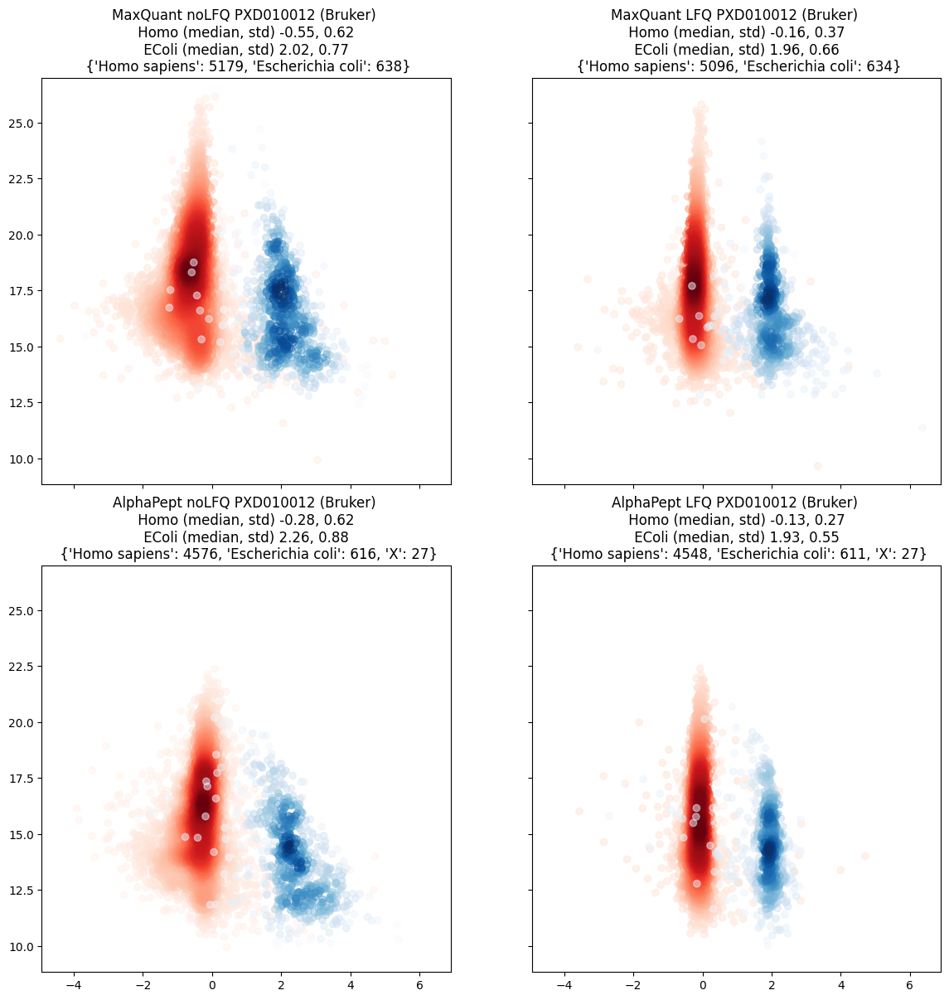

In [26]:
from test_helper import get_plot_df
import matplotlib.pyplot as plt
import seaborn as sns
import os

fig, axes = plt.subplots(2, 2, figsize=(14,14), sharex=True,sharey=True)

ref = pd.read_csv(os.path.join(tmp_folder,'PXD010012_ref.txt'), sep='\t') 

for j, _ in enumerate(['noLFQ','LFQ']):
    if _ == 'LFQ':
        x = 'LFQ i'
    else:
        x = 'I'
        
    base_columns = [f"{x}ntensity Base_{i}" for i in range(1,6)]
    ratio_columns = [f"{x}ntensity Ratio_{i}" for i in range(1,6)]

    id_ = 'MaxQuant ' +_+' PXD010012 (Bruker)'
    get_plot_df(ref, base_columns, ratio_columns, axes[0,j], id_)


path = os.path.join(TEST_DIR, "results.hdf") #TEST_DIR as set in test_ci.py
ref = pd.read_hdf(path, 'protein_table')
ref.columns = [os.path.split(_)[1].replace('.ms_data.hdf','') for _ in ref.columns]

species = []
for _ in ref.index:
    if 'HUMAN' in _:
        species.append('Homo sapiens')
    elif 'ECO' in _:
        species.append('Escherichia coli')
    else:
        species.append('X')
        
ref['Species'] = species

for j, _ in enumerate(['noLFQ','LFQ']):
    if _ == 'LFQ':
        x = '_LFQ'
    else:
        x = ''
        
    base_columns = [f"PXD010012_CT_{i}_C1_01_Base{x}" for i in range(1,4)]
    ratio_columns = [f"PXD010012_CT_{i}_C2_01_Ratio{x}" for i in range(1,4)]

    id_ = 'AlphaPept ' +_+' PXD010012 (Bruker)'
    get_plot_df(ref, base_columns, ratio_columns, axes[1,j], id_)

plt.show()

2023-07-12 20:24:39> Loading files


f:\projects\alphapept\alphapept\quantification.py:625: DtypeWarning: Columns (54) have mixed types. Specify dtype option on import or set low_memory=False.
  evd = pd.read_csv(evidence_path, sep='\t')


2023-07-12 20:24:42> A total of 10 files.
2023-07-12 20:24:42> File does not contain Fractions. Setting Fractions to 1
2023-07-12 20:24:53> A total of 7,413 proteins.
2023-07-12 20:24:58> Setting minimum occurence to 10.0
2023-07-12 20:24:59> Delayed normalization with SLSQP on (1, 10, 13735)
2023-07-12 20:25:02> Preparing protein table for parallel processing.
2023-07-12 20:25:08> Starting protein extraction for 7413 proteins.
2023-07-12 20:25:08> AlphaPool was set to 24 processes. Setting max to 24.


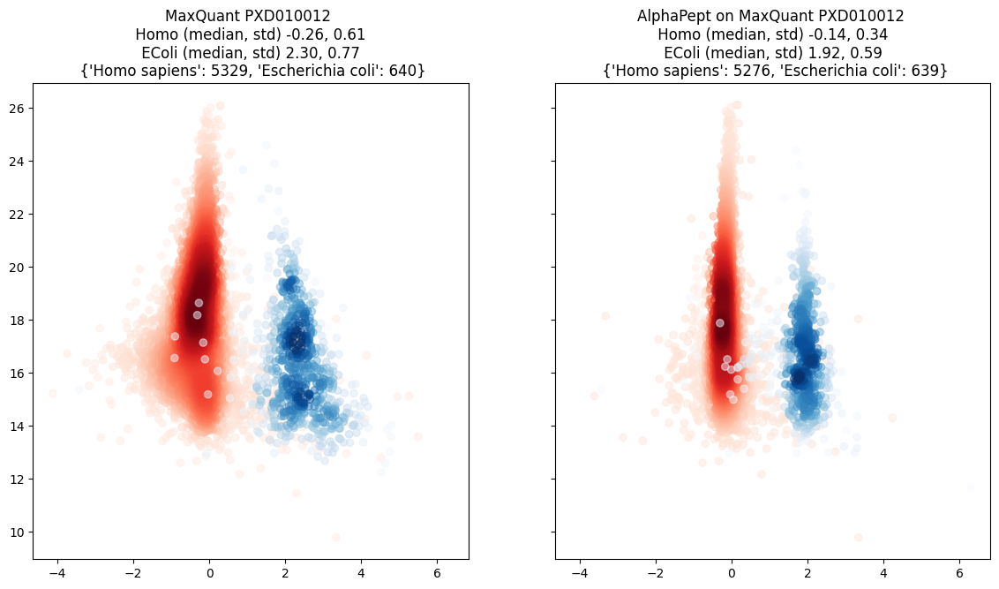

In [27]:
from alphapept.quantification import protein_profile_parallel_mq
from test_helper import get_plot_df

evidence_path = os.path.join(tmp_folder,'PXD010012_ref_evd.txt')
protein_group_path = os.path.join(tmp_folder,'PXD010012_ref.txt')

pt = protein_profile_parallel_mq(evidence_path, protein_group_path)

ref = pd.read_csv(protein_group_path, sep='\t')
species_dict = pd.Series(ref['Species'].values, index=ref['Protein IDs']).to_dict()
pt['Species'] = [species_dict[_] for _ in pt.index]


pre_lfq = [_ for _ in pt.columns if not _.endswith('_LFQ')]
lfq = [_ for _ in pt.columns if _.endswith('_LFQ')]

test_id = 'PXD010012'

fig, axes = plt.subplots(1, 2, figsize=(14,7), sharex=True,sharey=True)

ids = [f'{software_2} {test_id}', f'{software_1} on {software_2} {test_id}']

for i, ds in enumerate([pre_lfq, lfq]):

    base_columns = [_ for _ in ds if 'Base' in _]
    ratio_columns = [_ for _ in ds if 'Ratio' in _]
    get_plot_df(pt, base_columns, ratio_columns, axes[i], ids[i])

### Large Fasta

2023-07-12 20:27:27> Creating dir F:\projects\alphapept\sandbox\temp/test_temp.
2023-07-12 20:27:35> No settings provided. Creating from default settings.
2023-07-12 20:27:35> Platform information:
2023-07-12 20:27:35> system     - Windows
2023-07-12 20:27:35> release    - 10
2023-07-12 20:27:35> version    - 10.0.19044
2023-07-12 20:27:35> machine    - AMD64
2023-07-12 20:27:35> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 20:27:35> cpu count  - 24
2023-07-12 20:27:35> ram memory - 119.1/127.7 Gb (available/total)
2023-07-12 20:27:35> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 20:27:36> Python information:
2023-07-12 20:27:36> SQLAlchemy                    - 1.4.39
2023-07-12 20:27:36> alphapept                     - 0.5.0
2023-07-12 20:27:36> alpharaw                      - 0.1.0
2023-07-12 20:27:36> alphatims                     - 1.0.7
2023-07-12 20:27:36> biopython                     - 1.79
2023-07-12 20:27:36> bumpver

2023-07-12 20:27:36> 
2023-07-12 20:27:36> Checking if files exist.
2023-07-12 20:27:36> FASTA Files have a total size of 266.663 Mb
2023-07-12 20:27:36> Workflow has 11 steps
2023-07-12 20:27:36> ==== create_database ====
2023-07-12 20:27:36> Database path F:\projects\alphapept\sandbox\temp\test_temp\database.hdf is not a file.
2023-07-12 20:27:36> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\all_uniprot_reviewed.fasta with size 266.52 Mb.
2023-07-12 20:27:36> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\contaminants.fasta with size 0.15 Mb.
2023-07-12 20:27:36> Total FASTA size 266.66 is larger than the set maximum size of 100.00 Mb
2023-07-12 20:27:36> ==== import_raw_data ====


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 20:27:36> Processing 1 files for step raw_conversion
2023-07-12 20:27:36> File F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa has extension .raw - converting from Thermo.
2023-07-12 20:29:38> File conversion complete. Extracted 120,226 precursors.
2023-07-12 20:29:40> File conversion of file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw complete.


  0%|                                                                                                                                                                | 0/1 [02:04<?, ?it/s]

2023-07-12 20:29:40> ==== feature_finding ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 20:29:40> Processing 1 files for step find_features
2023-07-12 20:29:40> No *.hdf file with features found for F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.ms_data.hdf. Adding to feature finding list.
2023-07-12 20:29:41> Feature finding on F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw
2023-07-12 20:29:41> Hill extraction with centroid_tol 8 and max_gap 2
2023-07-12 20:29:45> Number of hills 1,105,353, len = 17.35
2023-07-12 20:29:45> Repeating hill extraction with centroid_tol 5.87
2023-07-12 20:29:49> Number of hills 1,227,331, len = 19.44
2023-07-12 20:29:50> After duplicate removal of hills 1,025,845
2023-07-12 20:29:58> After split hill_ptrs 1,207,373
2023-07-12 20:29:59> After filter hill_ptrs 1,188,406
2023-07-12 20:31:45> Extracting hill stats complete
2023-07-12 20:31:55> Found 184,383 pre isotope patterns.
2023-07-12 20:32:34> Extracted 198,500 isotope patterns.
2023-07-12 20:32:36> Report complete.
2023-07-12 20:32:36> Matching features 

  0%|                                                                                                                                                                | 0/1 [02:58<?, ?it/s]

2023-07-12 20:32:38> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 20:32:38> Starting first search.
2023-07-12 20:32:51> Number of FASTA entries: 564,523 - FASTA settings {'mods_fixed': ['cC'], 'mods_fixed_terminal': [], 'mods_variable': ['oxM'], 'mods_variable_terminal': [], 'mods_fixed_terminal_prot': [], 'mods_variable_terminal_prot': ['a<^'], 'n_missed_cleavages': 2, 'pep_length_min': 7, 'pep_length_max': 27, 'isoforms_max': 1024, 'n_modifications_max': 3, 'pseudo_reverse': True, 'AL_swap': False, 'KR_swap': False, 'protease': 'trypsin', 'spectra_block': 100000, 'fasta_block': 1000, 'save_db': True, 'fasta_size_max': 100}
2023-07-12 20:32:51> Setting Process limit to 24
2023-07-12 20:32:51> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 20:34:41> Block 1 of 565 complete - 0.18 % - created peptides 126,736 - total peptides 126,736 


  0%|▏                                                                                                                             | 0.0017699115044247787/1 [02:02<19:10:54, 69177.39s/it]

2023-07-12 20:34:43> Block 2 of 565 complete - 0.35 % - created peptides 130,356 - total peptides 257,092 


  0%|▍                                                                                                                              | 0.0035398230088495575/1 [02:06<8:16:58, 29924.39s/it]

2023-07-12 20:34:45> Block 3 of 565 complete - 0.53 % - created peptides 132,026 - total peptides 389,118 


  1%|▋                                                                                                                               | 0.005309734513274336/1 [02:10<4:46:40, 17292.73s/it]

2023-07-12 20:34:49> Block 4 of 565 complete - 0.71 % - created peptides 136,012 - total peptides 525,130 


  1%|▉                                                                                                                               | 0.007079646017699115/1 [02:17<3:19:23, 12048.80s/it]

2023-07-12 20:34:56> Block 5 of 565 complete - 0.88 % - created peptides 139,940 - total peptides 665,070 


  1%|█▏                                                                                                                               | 0.008849557522123894/1 [02:25<2:31:34, 9175.72s/it]

2023-07-12 20:35:04> Block 6 of 565 complete - 1.06 % - created peptides 137,338 - total peptides 802,408 


  1%|█▎                                                                                                                               | 0.010619469026548672/1 [02:30<1:57:24, 7120.35s/it]

2023-07-12 20:35:09> Block 7 of 565 complete - 1.24 % - created peptides 130,510 - total peptides 932,918 


  1%|█▌                                                                                                                               | 0.012389380530973451/1 [02:35<1:33:42, 5692.88s/it]

2023-07-12 20:35:14> Block 8 of 565 complete - 1.42 % - created peptides 152,768 - total peptides 1,085,686 


  1%|█▊                                                                                                                                | 0.01415929203539823/1 [02:41<1:22:01, 4992.42s/it]

2023-07-12 20:35:20> Block 9 of 565 complete - 1.59 % - created peptides 147,206 - total peptides 1,232,892 


  2%|██                                                                                                                                | 0.01592920353982301/1 [02:47<1:11:57, 4387.04s/it]

2023-07-12 20:35:26> Block 10 of 565 complete - 1.77 % - created peptides 145,720 - total peptides 1,378,612 


  2%|██▎                                                                                                                              | 0.017699115044247787/1 [02:53<1:09:00, 4214.84s/it]

2023-07-12 20:35:32> Block 11 of 565 complete - 1.95 % - created peptides 143,916 - total peptides 1,522,528 


  2%|██▌                                                                                                                              | 0.019469026548672566/1 [02:59<1:03:47, 3903.27s/it]

2023-07-12 20:35:38> Block 12 of 565 complete - 2.12 % - created peptides 154,206 - total peptides 1,676,734 


  2%|██▋                                                                                                                              | 0.021238938053097345/1 [03:05<1:01:41, 3782.07s/it]

2023-07-12 20:35:44> Block 13 of 565 complete - 2.30 % - created peptides 162,758 - total peptides 1,839,492 


  2%|██▉                                                                                                                              | 0.023008849557522124/1 [03:16<1:11:41, 4402.93s/it]

2023-07-12 20:35:54> Block 14 of 565 complete - 2.48 % - created peptides 164,286 - total peptides 2,003,778 


  2%|███▏                                                                                                                             | 0.024778761061946902/1 [03:25<1:17:28, 4767.09s/it]

2023-07-12 20:36:04> Block 15 of 565 complete - 2.65 % - created peptides 168,930 - total peptides 2,172,708 


  3%|███▍                                                                                                                              | 0.02654867256637168/1 [03:35<1:19:40, 4910.39s/it]

2023-07-12 20:36:14> Block 16 of 565 complete - 2.83 % - created peptides 167,550 - total peptides 2,340,258 


  3%|███▋                                                                                                                              | 0.02831858407079646/1 [03:44<1:22:19, 5083.47s/it]

2023-07-12 20:36:23> Block 17 of 565 complete - 3.01 % - created peptides 169,646 - total peptides 2,509,904 


  3%|███▉                                                                                                                              | 0.03008849557522124/1 [03:58<1:33:27, 5781.83s/it]

2023-07-12 20:36:36> Block 18 of 565 complete - 3.19 % - created peptides 174,786 - total peptides 2,684,690 


  3%|████▏                                                                                                                             | 0.03185840707964602/1 [04:07<1:30:49, 5628.97s/it]

2023-07-12 20:36:46> Block 19 of 565 complete - 3.36 % - created peptides 169,892 - total peptides 2,854,582 


  3%|████▎                                                                                                                            | 0.033628318584070796/1 [04:14<1:22:48, 5141.29s/it]

2023-07-12 20:36:53> Block 20 of 565 complete - 3.54 % - created peptides 170,866 - total peptides 3,025,448 


  4%|████▌                                                                                                                            | 0.035398230088495575/1 [04:21<1:17:55, 4847.23s/it]

2023-07-12 20:37:00> Block 21 of 565 complete - 3.72 % - created peptides 176,688 - total peptides 3,202,136 


  4%|████▊                                                                                                                             | 0.03716814159292035/1 [04:32<1:22:48, 5160.76s/it]

2023-07-12 20:37:11> Block 22 of 565 complete - 3.89 % - created peptides 175,196 - total peptides 3,377,332 


  4%|█████                                                                                                                             | 0.03893805309734513/1 [04:44<1:31:49, 5732.84s/it]

2023-07-12 20:37:23> Block 23 of 565 complete - 4.07 % - created peptides 186,786 - total peptides 3,564,118 


  4%|█████▎                                                                                                                            | 0.04070796460176991/1 [04:53<1:26:45, 5426.72s/it]

2023-07-12 20:37:32> Block 24 of 565 complete - 4.25 % - created peptides 199,090 - total peptides 3,763,208 


  4%|█████▌                                                                                                                            | 0.04247787610619469/1 [05:06<1:38:04, 6145.95s/it]

2023-07-12 20:37:45> Block 25 of 565 complete - 4.42 % - created peptides 127,180 - total peptides 3,890,388 


  4%|█████▊                                                                                                                            | 0.04424778761061947/1 [05:17<1:38:11, 6164.44s/it]

2023-07-12 20:37:56> Block 26 of 565 complete - 4.60 % - created peptides 128,480 - total peptides 4,018,868 


  5%|█████▉                                                                                                                            | 0.04601769911504425/1 [05:26<1:32:20, 5807.60s/it]

2023-07-12 20:38:05> Block 27 of 565 complete - 4.78 % - created peptides 141,234 - total peptides 4,160,102 


  5%|██████▏                                                                                                                          | 0.047787610619469026/1 [05:37<1:32:48, 5848.16s/it]

2023-07-12 20:38:16> Block 28 of 565 complete - 4.96 % - created peptides 168,844 - total peptides 4,328,946 


  5%|██████▍                                                                                                                          | 0.049557522123893805/1 [05:46<1:28:56, 5615.05s/it]

2023-07-12 20:38:25> Block 29 of 565 complete - 5.13 % - created peptides 128,936 - total peptides 4,457,882 


  5%|██████▋                                                                                                                           | 0.05132743362831858/1 [05:57<1:33:32, 5916.47s/it]

2023-07-12 20:38:36> Block 30 of 565 complete - 5.31 % - created peptides 124,450 - total peptides 4,582,332 


  5%|██████▉                                                                                                                           | 0.05309734513274336/1 [06:07<1:29:39, 5681.06s/it]

2023-07-12 20:38:45> Block 31 of 565 complete - 5.49 % - created peptides 157,720 - total peptides 4,740,052 


  5%|███████▏                                                                                                                          | 0.05486725663716814/1 [06:20<1:37:11, 6169.98s/it]

2023-07-12 20:38:59> Block 32 of 565 complete - 5.66 % - created peptides 140,490 - total peptides 4,880,542 


  6%|███████▎                                                                                                                          | 0.05663716814159292/1 [06:29<1:31:54, 5845.72s/it]

2023-07-12 20:39:07> Block 33 of 565 complete - 5.84 % - created peptides 157,286 - total peptides 5,037,828 


  6%|███████▋                                                                                                                           | 0.0584070796460177/1 [06:42<1:40:48, 6424.09s/it]

2023-07-12 20:39:21> Block 34 of 565 complete - 6.02 % - created peptides 143,704 - total peptides 5,181,532 


  6%|███████▊                                                                                                                          | 0.06017699115044248/1 [06:52<1:37:17, 6211.17s/it]

2023-07-12 20:39:31> Block 35 of 565 complete - 6.19 % - created peptides 178,388 - total peptides 5,359,920 


  6%|███████▉                                                                                                                         | 0.061946902654867256/1 [07:06<1:44:24, 6677.74s/it]

2023-07-12 20:39:45> Block 36 of 565 complete - 6.37 % - created peptides 173,852 - total peptides 5,533,772 


  6%|████████▎                                                                                                                         | 0.06371681415929203/1 [07:15<1:37:04, 6221.22s/it]

2023-07-12 20:39:54> Block 37 of 565 complete - 6.55 % - created peptides 165,912 - total peptides 5,699,684 


  7%|████████▌                                                                                                                         | 0.06548672566371681/1 [07:25<1:32:19, 5927.72s/it]

2023-07-12 20:40:03> Block 38 of 565 complete - 6.73 % - created peptides 165,666 - total peptides 5,865,350 


  7%|████████▋                                                                                                                         | 0.06725663716814159/1 [07:39<1:43:25, 6653.32s/it]

2023-07-12 20:40:18> Block 39 of 565 complete - 6.90 % - created peptides 194,404 - total peptides 6,059,754 


  7%|████████▉                                                                                                                         | 0.06902654867256637/1 [07:49<1:38:02, 6318.41s/it]

2023-07-12 20:40:28> Block 40 of 565 complete - 7.08 % - created peptides 216,726 - total peptides 6,276,480 


  7%|█████████▏                                                                                                                        | 0.07079646017699115/1 [07:59<1:35:08, 6143.75s/it]

2023-07-12 20:40:38> Block 41 of 565 complete - 7.26 % - created peptides 198,354 - total peptides 6,474,834 


  7%|█████████▍                                                                                                                        | 0.07256637168141593/1 [08:15<1:46:25, 6885.39s/it]

2023-07-12 20:40:53> Block 42 of 565 complete - 7.43 % - created peptides 207,684 - total peptides 6,682,518 


  7%|█████████▋                                                                                                                         | 0.0743362831858407/1 [08:24<1:39:05, 6422.69s/it]

2023-07-12 20:41:03> Block 43 of 565 complete - 7.61 % - created peptides 190,944 - total peptides 6,873,462 


  8%|█████████▉                                                                                                                        | 0.07610619469026549/1 [08:40<1:52:01, 7275.57s/it]

2023-07-12 20:41:19> Block 44 of 565 complete - 7.79 % - created peptides 204,230 - total peptides 7,077,692 


  8%|██████████                                                                                                                        | 0.07787610619469026/1 [08:50<1:43:50, 6756.30s/it]

2023-07-12 20:41:29> Block 45 of 565 complete - 7.96 % - created peptides 174,836 - total peptides 7,252,528 


  8%|██████████▎                                                                                                                       | 0.07964601769911504/1 [08:59<1:34:47, 6179.30s/it]

2023-07-12 20:41:38> Block 46 of 565 complete - 8.14 % - created peptides 199,896 - total peptides 7,452,424 


  8%|██████████▌                                                                                                                       | 0.08141592920353982/1 [09:15<1:47:59, 7054.17s/it]

2023-07-12 20:41:54> Block 47 of 565 complete - 8.32 % - created peptides 205,776 - total peptides 7,658,200 


  8%|██████████▉                                                                                                                        | 0.0831858407079646/1 [09:25<1:42:38, 6717.36s/it]

2023-07-12 20:42:04> Block 48 of 565 complete - 8.50 % - created peptides 225,810 - total peptides 7,884,010 


  8%|███████████                                                                                                                       | 0.08495575221238938/1 [09:35<1:37:28, 6391.55s/it]

2023-07-12 20:42:14> Block 49 of 565 complete - 8.67 % - created peptides 144,778 - total peptides 8,028,788 


  9%|███████████▎                                                                                                                      | 0.08672566371681416/1 [09:51<1:49:30, 7193.91s/it]

2023-07-12 20:42:30> Block 50 of 565 complete - 8.85 % - created peptides 134,416 - total peptides 8,163,204 


  9%|███████████▌                                                                                                                      | 0.08849557522123894/1 [10:02<1:43:48, 6832.83s/it]

2023-07-12 20:42:41> Block 51 of 565 complete - 9.03 % - created peptides 193,014 - total peptides 8,356,218 


  9%|███████████▋                                                                                                                      | 0.09026548672566372/1 [10:13<1:40:43, 6643.32s/it]

2023-07-12 20:42:52> Block 52 of 565 complete - 9.20 % - created peptides 155,198 - total peptides 8,511,416 


  9%|████████████                                                                                                                       | 0.0920353982300885/1 [10:28<1:49:56, 7265.08s/it]

2023-07-12 20:43:07> Block 53 of 565 complete - 9.38 % - created peptides 136,364 - total peptides 8,647,780 


  9%|████████████▏                                                                                                                     | 0.09380530973451327/1 [10:39<1:43:10, 6831.58s/it]

2023-07-12 20:43:18> Block 54 of 565 complete - 9.56 % - created peptides 168,358 - total peptides 8,816,138 


 10%|████████████▍                                                                                                                     | 0.09557522123893805/1 [10:49<1:37:42, 6481.47s/it]

2023-07-12 20:43:28> Block 55 of 565 complete - 9.73 % - created peptides 164,396 - total peptides 8,980,534 


 10%|████████████▋                                                                                                                     | 0.09734513274336283/1 [11:05<1:50:34, 7350.45s/it]

2023-07-12 20:43:44> Block 56 of 565 complete - 9.91 % - created peptides 146,904 - total peptides 9,127,438 


 10%|████████████▉                                                                                                                     | 0.09911504424778761/1 [11:16<1:44:07, 6935.28s/it]

2023-07-12 20:43:55> Block 57 of 565 complete - 10.09 % - created peptides 185,736 - total peptides 9,313,174 


 10%|█████████████                                                                                                                     | 0.10088495575221239/1 [11:26<1:38:52, 6598.41s/it]

2023-07-12 20:44:05> Block 58 of 565 complete - 10.27 % - created peptides 202,564 - total peptides 9,515,738 


 10%|█████████████▎                                                                                                                    | 0.10265486725663717/1 [11:37<1:36:48, 6472.54s/it]

2023-07-12 20:44:16> Block 59 of 565 complete - 10.44 % - created peptides 138,274 - total peptides 9,654,012 


 10%|█████████████▌                                                                                                                    | 0.10442477876106195/1 [11:53<1:49:04, 7307.59s/it]

2023-07-12 20:44:32> Block 60 of 565 complete - 10.62 % - created peptides 192,522 - total peptides 9,846,534 


 11%|█████████████▊                                                                                                                    | 0.10619469026548672/1 [12:04<1:42:26, 6876.33s/it]

2023-07-12 20:44:43> Block 61 of 565 complete - 10.80 % - created peptides 159,784 - total peptides 10,006,318 


 11%|██████████████▏                                                                                                                    | 0.1079646017699115/1 [12:14<1:37:33, 6561.89s/it]

2023-07-12 20:44:53> Block 62 of 565 complete - 10.97 % - created peptides 177,856 - total peptides 10,184,174 


 11%|██████████████▎                                                                                                                   | 0.10973451327433628/1 [12:25<1:35:42, 6450.81s/it]

2023-07-12 20:45:04> Block 63 of 565 complete - 11.15 % - created peptides 161,872 - total peptides 10,346,046 


 11%|██████████████▍                                                                                                                   | 0.11150442477876106/1 [12:41<1:47:05, 7232.11s/it]

2023-07-12 20:45:20> Block 64 of 565 complete - 11.33 % - created peptides 163,826 - total peptides 10,509,872 


 11%|██████████████▋                                                                                                                   | 0.11327433628318584/1 [12:51<1:40:43, 6815.03s/it]

2023-07-12 20:45:30> Block 65 of 565 complete - 11.50 % - created peptides 177,212 - total peptides 10,687,084 


 12%|██████████████▉                                                                                                                   | 0.11504424778761062/1 [13:02<1:36:02, 6511.86s/it]

2023-07-12 20:45:41> Block 66 of 565 complete - 11.68 % - created peptides 168,746 - total peptides 10,855,830 


 12%|███████████████▎                                                                                                                   | 0.1168141592920354/1 [13:12<1:32:10, 6261.44s/it]

2023-07-12 20:45:51> Block 67 of 565 complete - 11.86 % - created peptides 193,632 - total peptides 11,049,462 


 12%|███████████████▍                                                                                                                  | 0.11858407079646018/1 [13:30<1:49:18, 7440.93s/it]

2023-07-12 20:46:09> Block 68 of 565 complete - 12.04 % - created peptides 218,796 - total peptides 11,268,258 


 12%|███████████████▋                                                                                                                  | 0.12035398230088495/1 [13:41<1:44:04, 7099.26s/it]

2023-07-12 20:46:20> Block 69 of 565 complete - 12.21 % - created peptides 203,954 - total peptides 11,472,212 


 12%|███████████████▉                                                                                                                  | 0.12212389380530973/1 [13:52<1:39:49, 6822.83s/it]

2023-07-12 20:46:31> Block 70 of 565 complete - 12.39 % - created peptides 186,856 - total peptides 11,659,068 


 12%|████████████████                                                                                                                  | 0.12389380530973451/1 [14:02<1:35:41, 6553.46s/it]

2023-07-12 20:46:41> Block 71 of 565 complete - 12.57 % - created peptides 141,546 - total peptides 11,800,614 


 13%|████████████████▍                                                                                                                  | 0.1256637168141593/1 [14:21<1:52:18, 7707.55s/it]

2023-07-12 20:47:00> Block 72 of 565 complete - 12.74 % - created peptides 219,654 - total peptides 12,020,268 


 13%|████████████████▌                                                                                                                 | 0.12743362831858407/1 [14:32<1:45:09, 7231.04s/it]

2023-07-12 20:47:11> Block 73 of 565 complete - 12.92 % - created peptides 225,530 - total peptides 12,245,798 


 13%|████████████████▊                                                                                                                 | 0.12920353982300886/1 [14:42<1:39:38, 6865.20s/it]

2023-07-12 20:47:21> Block 74 of 565 complete - 13.10 % - created peptides 146,148 - total peptides 12,391,946 


 13%|█████████████████                                                                                                                 | 0.13097345132743363/1 [14:52<1:34:23, 6517.13s/it]

2023-07-12 20:47:31> Block 75 of 565 complete - 13.27 % - created peptides 177,256 - total peptides 12,569,202 


 13%|█████████████████▎                                                                                                                | 0.13274336283185842/1 [15:04<1:34:05, 6509.39s/it]

2023-07-12 20:47:43> Block 76 of 565 complete - 13.45 % - created peptides 145,438 - total peptides 12,714,640 


 13%|█████████████████▍                                                                                                                | 0.13451327433628318/1 [15:24<1:55:26, 8002.89s/it]

2023-07-12 20:48:03> Block 77 of 565 complete - 13.63 % - created peptides 190,920 - total peptides 12,905,560 


 14%|█████████████████▋                                                                                                                | 0.13628318584070798/1 [15:35<1:47:55, 7496.96s/it]

2023-07-12 20:48:14> Block 78 of 565 complete - 13.81 % - created peptides 187,136 - total peptides 13,092,696 


 14%|█████████████████▉                                                                                                                | 0.13805309734513274/1 [15:45<1:39:15, 6909.41s/it]

2023-07-12 20:48:24> Block 79 of 565 complete - 13.98 % - created peptides 144,218 - total peptides 13,236,914 


 14%|██████████████████▏                                                                                                               | 0.13982300884955753/1 [15:56<1:34:46, 6611.08s/it]

2023-07-12 20:48:35> Block 80 of 565 complete - 14.16 % - created peptides 171,362 - total peptides 13,408,276 


 14%|██████████████████▌                                                                                                                | 0.1415929203539823/1 [16:05<1:29:37, 6264.41s/it]

2023-07-12 20:48:44> Block 81 of 565 complete - 14.34 % - created peptides 176,218 - total peptides 13,584,494 


 14%|██████████████████▊                                                                                                                | 0.1433628318584071/1 [16:27<1:55:54, 8118.61s/it]

2023-07-12 20:49:06> Block 82 of 565 complete - 14.51 % - created peptides 165,210 - total peptides 13,749,704 


 15%|██████████████████▊                                                                                                               | 0.14513274336283186/1 [16:38<1:45:54, 7433.68s/it]

2023-07-12 20:49:17> Block 83 of 565 complete - 14.69 % - created peptides 136,560 - total peptides 13,886,264 


 15%|███████████████████                                                                                                               | 0.14690265486725665/1 [16:48<1:39:45, 7015.62s/it]

2023-07-12 20:49:27> Block 84 of 565 complete - 14.87 % - created peptides 192,224 - total peptides 14,078,488 


 15%|███████████████████▍                                                                                                               | 0.1486725663716814/1 [17:00<1:36:50, 6824.66s/it]

2023-07-12 20:49:39> Block 85 of 565 complete - 15.04 % - created peptides 186,384 - total peptides 14,264,872 


 15%|███████████████████▋                                                                                                               | 0.1504424778761062/1 [17:21<1:58:33, 8373.36s/it]

2023-07-12 20:50:00> Block 86 of 565 complete - 15.22 % - created peptides 191,282 - total peptides 14,456,154 


 15%|███████████████████▊                                                                                                              | 0.15221238938053097/1 [17:32<1:49:24, 7742.73s/it]

2023-07-12 20:50:11> Block 87 of 565 complete - 15.40 % - created peptides 174,994 - total peptides 14,631,148 


 15%|████████████████████                                                                                                              | 0.15398230088495576/1 [17:44<1:44:18, 7397.94s/it]

2023-07-12 20:50:23> Block 88 of 565 complete - 15.58 % - created peptides 175,382 - total peptides 14,806,530 


 16%|████████████████████▏                                                                                                             | 0.15575221238938053/1 [17:56<1:41:48, 7234.91s/it]

2023-07-12 20:50:35> Block 89 of 565 complete - 15.75 % - created peptides 155,140 - total peptides 14,961,670 


 16%|████████████████████▍                                                                                                             | 0.15752212389380532/1 [18:06<1:34:37, 6739.55s/it]

2023-07-12 20:50:45> Block 90 of 565 complete - 15.93 % - created peptides 209,668 - total peptides 15,171,338 


 16%|████████████████████▊                                                                                                              | 0.1592920353982301/1 [18:17<1:33:48, 6694.37s/it]

2023-07-12 20:50:56> Block 91 of 565 complete - 16.11 % - created peptides 193,124 - total peptides 15,364,462 


 16%|████████████████████▉                                                                                                             | 0.16106194690265488/1 [18:39<1:57:43, 8419.99s/it]

2023-07-12 20:51:18> Block 92 of 565 complete - 16.28 % - created peptides 183,418 - total peptides 15,547,880 


 16%|█████████████████████▏                                                                                                            | 0.16283185840707964/1 [18:50<1:47:42, 7719.29s/it]

2023-07-12 20:51:29> Block 93 of 565 complete - 16.46 % - created peptides 185,244 - total peptides 15,733,124 


 16%|█████████████████████▍                                                                                                            | 0.16460176991150444/1 [19:00<1:39:08, 7120.50s/it]

2023-07-12 20:51:39> Block 94 of 565 complete - 16.64 % - created peptides 221,478 - total peptides 15,954,602 


 17%|█████████████████████▊                                                                                                             | 0.1663716814159292/1 [19:14<1:40:48, 7255.06s/it]

2023-07-12 20:51:53> Block 95 of 565 complete - 16.81 % - created peptides 144,498 - total peptides 16,099,100 


 17%|██████████████████████▏                                                                                                             | 0.168141592920354/1 [19:25<1:38:04, 7073.77s/it]

2023-07-12 20:52:04> Block 96 of 565 complete - 16.99 % - created peptides 171,446 - total peptides 16,270,546 


 17%|██████████████████████                                                                                                            | 0.16991150442477876/1 [19:48<2:02:15, 8836.66s/it]

2023-07-12 20:52:27> Block 97 of 565 complete - 17.17 % - created peptides 144,054 - total peptides 16,414,600 


 17%|██████████████████████▎                                                                                                           | 0.17168141592920355/1 [20:00<1:53:46, 8241.79s/it]

2023-07-12 20:52:39> Block 98 of 565 complete - 17.35 % - created peptides 179,890 - total peptides 16,594,490 


 17%|██████████████████████▌                                                                                                           | 0.17345132743362832/1 [20:12<1:45:53, 7687.01s/it]

2023-07-12 20:52:51> Block 99 of 565 complete - 17.52 % - created peptides 180,542 - total peptides 16,775,032 


 18%|██████████████████████▉                                                                                                            | 0.1752212389380531/1 [20:22<1:38:51, 7191.11s/it]

2023-07-12 20:53:01> Block 100 of 565 complete - 17.70 % - created peptides 156,058 - total peptides 16,931,090 


 18%|███████████████████████                                                                                                           | 0.17699115044247787/1 [20:34<1:35:28, 6960.64s/it]

2023-07-12 20:53:13> Block 101 of 565 complete - 17.88 % - created peptides 139,404 - total peptides 17,070,494 


 18%|███████████████████████▏                                                                                                          | 0.17876106194690267/1 [20:46<1:35:18, 6963.16s/it]

2023-07-12 20:53:25> Block 102 of 565 complete - 18.05 % - created peptides 192,972 - total peptides 17,263,466 


 18%|███████████████████████▍                                                                                                          | 0.18053097345132743/1 [21:10<2:01:56, 8928.74s/it]

2023-07-12 20:53:49> Block 103 of 565 complete - 18.23 % - created peptides 142,130 - total peptides 17,405,596 


 18%|███████████████████████▋                                                                                                          | 0.18230088495575222/1 [21:22<1:52:22, 8245.58s/it]

2023-07-12 20:54:01> Block 104 of 565 complete - 18.41 % - created peptides 181,768 - total peptides 17,587,364 


 18%|████████████████████████▎                                                                                                           | 0.184070796460177/1 [21:32<1:42:16, 7520.76s/it]

2023-07-12 20:54:11> Block 105 of 565 complete - 18.58 % - created peptides 166,984 - total peptides 17,754,348 


 19%|████████████████████████▏                                                                                                         | 0.18584070796460178/1 [21:43<1:36:32, 7115.19s/it]

2023-07-12 20:54:22> Block 106 of 565 complete - 18.76 % - created peptides 150,870 - total peptides 17,905,218 


 19%|████████████████████████▍                                                                                                         | 0.18761061946902655/1 [21:55<1:34:51, 7006.42s/it]

2023-07-12 20:54:34> Block 107 of 565 complete - 18.94 % - created peptides 175,192 - total peptides 18,080,410 


 19%|████████████████████████▌                                                                                                         | 0.18938053097345134/1 [22:07<1:33:42, 6935.87s/it]

2023-07-12 20:54:46> Block 108 of 565 complete - 19.12 % - created peptides 151,464 - total peptides 18,231,874 


 19%|█████████████████████████                                                                                                          | 0.1911504424778761/1 [22:18<1:31:28, 6785.33s/it]

2023-07-12 20:54:58> Block 109 of 565 complete - 19.29 % - created peptides 143,232 - total peptides 18,375,106 


 19%|█████████████████████████▎                                                                                                         | 0.1929203539823009/1 [22:44<2:02:27, 9103.76s/it]

2023-07-12 20:55:23> Block 110 of 565 complete - 19.47 % - created peptides 154,218 - total peptides 18,529,324 


 19%|█████████████████████████▎                                                                                                        | 0.19469026548672566/1 [22:55<1:50:14, 8213.62s/it]

2023-07-12 20:55:34> Block 111 of 565 complete - 19.65 % - created peptides 163,148 - total peptides 18,692,472 


 20%|█████████████████████████▌                                                                                                        | 0.19646017699115045/1 [23:05<1:39:35, 7436.86s/it]

2023-07-12 20:55:44> Block 112 of 565 complete - 19.82 % - created peptides 149,736 - total peptides 18,842,208 


 20%|█████████████████████████▊                                                                                                        | 0.19823008849557522/1 [23:15<1:33:25, 6990.97s/it]

2023-07-12 20:55:54> Block 113 of 565 complete - 20.00 % - created peptides 146,314 - total peptides 18,988,522 


 20%|█████████████████████████████▏                                                                                                                    | 0.2/1 [23:27<1:31:04, 6830.38s/it]

2023-07-12 20:56:06> Block 114 of 565 complete - 20.18 % - created peptides 150,594 - total peptides 19,139,116 


 20%|██████████████████████████▏                                                                                                       | 0.20176991150442478/1 [23:39<1:29:50, 6753.20s/it]

2023-07-12 20:56:17> Block 115 of 565 complete - 20.35 % - created peptides 202,388 - total peptides 19,341,504 


 20%|██████████████████████████▍                                                                                                       | 0.20353982300884957/1 [23:50<1:28:55, 6699.05s/it]

2023-07-12 20:56:29> Block 116 of 565 complete - 20.53 % - created peptides 173,124 - total peptides 19,514,628 


 21%|██████████████████████████▋                                                                                                       | 0.20530973451327433/1 [24:15<1:58:04, 8914.28s/it]

2023-07-12 20:56:54> Block 117 of 565 complete - 20.71 % - created peptides 141,796 - total peptides 19,656,424 


 21%|██████████████████████████▉                                                                                                       | 0.20707964601769913/1 [24:25<1:45:44, 8000.82s/it]

2023-07-12 20:57:04> Block 118 of 565 complete - 20.88 % - created peptides 153,942 - total peptides 19,810,366 


 21%|███████████████████████████▎                                                                                                       | 0.2088495575221239/1 [24:36<1:38:14, 7450.00s/it]

2023-07-12 20:57:15> Block 119 of 565 complete - 21.06 % - created peptides 233,162 - total peptides 20,043,528 


 21%|███████████████████████████▍                                                                                                      | 0.21061946902654868/1 [24:49<1:36:44, 7353.40s/it]

2023-07-12 20:57:28> Block 120 of 565 complete - 21.24 % - created peptides 214,300 - total peptides 20,257,828 


 21%|███████████████████████████▌                                                                                                      | 0.21238938053097345/1 [25:01<1:34:28, 7196.78s/it]

2023-07-12 20:57:40> Block 121 of 565 complete - 21.42 % - created peptides 149,022 - total peptides 20,406,850 


 21%|███████████████████████████▊                                                                                                      | 0.21415929203539824/1 [25:13<1:32:21, 7051.44s/it]

2023-07-12 20:57:52> Block 122 of 565 complete - 21.59 % - created peptides 113,604 - total peptides 20,520,454 


 22%|████████████████████████████▌                                                                                                       | 0.215929203539823/1 [25:23<1:27:11, 6672.33s/it]

2023-07-12 20:58:02> Block 123 of 565 complete - 21.77 % - created peptides 217,014 - total peptides 20,737,468 


 22%|████████████████████████████▌                                                                                                      | 0.2176991150442478/1 [25:35<1:27:54, 6741.70s/it]

2023-07-12 20:58:14> Block 124 of 565 complete - 21.95 % - created peptides 205,296 - total peptides 20,942,764 


 22%|████████████████████████████▌                                                                                                     | 0.21946902654867256/1 [26:03<2:02:50, 9442.53s/it]

2023-07-12 20:58:42> Block 125 of 565 complete - 22.12 % - created peptides 187,036 - total peptides 21,129,800 


 22%|████████████████████████████▊                                                                                                     | 0.22123893805309736/1 [26:15<1:51:14, 8570.56s/it]

2023-07-12 20:58:54> Block 126 of 565 complete - 22.30 % - created peptides 169,098 - total peptides 21,298,898 


 22%|████████████████████████████▉                                                                                                     | 0.22300884955752212/1 [26:26<1:41:53, 7868.71s/it]

2023-07-12 20:59:05> Block 127 of 565 complete - 22.48 % - created peptides 183,106 - total peptides 21,482,004 


 22%|█████████████████████████████▍                                                                                                     | 0.2247787610619469/1 [26:37<1:36:35, 7475.57s/it]

2023-07-12 20:59:16> Block 128 of 565 complete - 22.65 % - created peptides 174,724 - total peptides 21,656,728 


 23%|█████████████████████████████▍                                                                                                    | 0.22654867256637168/1 [26:48<1:29:37, 6952.52s/it]

2023-07-12 20:59:27> Block 129 of 565 complete - 22.83 % - created peptides 153,632 - total peptides 21,810,360 


 23%|█████████████████████████████▋                                                                                                    | 0.22831858407079647/1 [26:59<1:28:17, 6864.51s/it]

2023-07-12 20:59:38> Block 130 of 565 complete - 23.01 % - created peptides 184,012 - total peptides 21,994,372 


 23%|█████████████████████████████▉                                                                                                    | 0.23008849557522124/1 [27:11<1:26:51, 6768.59s/it]

2023-07-12 20:59:50> Block 131 of 565 complete - 23.19 % - created peptides 161,284 - total peptides 22,155,656 


 23%|██████████████████████████████▏                                                                                                   | 0.23185840707964603/1 [27:24<1:27:55, 6867.71s/it]

2023-07-12 21:00:02> Block 132 of 565 complete - 23.36 % - created peptides 144,230 - total peptides 22,299,886 


 23%|██████████████████████████████▌                                                                                                    | 0.2336283185840708/1 [27:53<2:05:03, 9790.91s/it]

2023-07-12 21:00:32> Block 133 of 565 complete - 23.54 % - created peptides 176,842 - total peptides 22,476,728 


 24%|██████████████████████████████▌                                                                                                   | 0.23539823008849559/1 [28:04<1:51:05, 8717.90s/it]

2023-07-12 21:00:43> Block 134 of 565 complete - 23.72 % - created peptides 169,634 - total peptides 22,646,362 


 24%|██████████████████████████████▊                                                                                                   | 0.23716814159292035/1 [28:16<1:42:52, 8091.62s/it]

2023-07-12 21:00:55> Block 135 of 565 complete - 23.89 % - created peptides 145,230 - total peptides 22,791,592 


 24%|███████████████████████████████                                                                                                   | 0.23893805309734514/1 [28:26<1:34:58, 7487.75s/it]

2023-07-12 21:01:05> Block 136 of 565 complete - 24.07 % - created peptides 133,742 - total peptides 22,925,334 


 24%|███████████████████████████████▌                                                                                                   | 0.2407079646017699/1 [28:38<1:30:27, 7148.73s/it]

2023-07-12 21:01:17> Block 137 of 565 complete - 24.25 % - created peptides 138,956 - total peptides 23,064,290 


 24%|███████████████████████████████▊                                                                                                   | 0.2424778761061947/1 [28:51<1:31:32, 7250.92s/it]

2023-07-12 21:01:30> Block 138 of 565 complete - 24.42 % - created peptides 184,636 - total peptides 23,248,926 


 24%|███████████████████████████████▊                                                                                                  | 0.24424778761061947/1 [29:02<1:27:58, 6984.29s/it]

2023-07-12 21:01:41> Block 139 of 565 complete - 24.60 % - created peptides 180,766 - total peptides 23,429,692 


 25%|███████████████████████████████▉                                                                                                  | 0.24601769911504426/1 [29:14<1:27:20, 6950.29s/it]

2023-07-12 21:01:53> Block 140 of 565 complete - 24.78 % - created peptides 137,546 - total peptides 23,567,238 


 25%|████████████████████████████████▏                                                                                                 | 0.24778761061946902/1 [29:44<2:04:17, 9914.64s/it]

2023-07-12 21:02:23> Block 141 of 565 complete - 24.96 % - created peptides 158,758 - total peptides 23,725,996 


 25%|████████████████████████████████▍                                                                                                 | 0.24955752212389382/1 [29:54<1:48:14, 8653.62s/it]

2023-07-12 21:02:33> Block 142 of 565 complete - 25.13 % - created peptides 202,736 - total peptides 23,928,732 


 25%|████████████████████████████████▉                                                                                                  | 0.2513274336283186/1 [30:07<1:42:03, 8178.51s/it]

2023-07-12 21:02:46> Block 143 of 565 complete - 25.31 % - created peptides 139,278 - total peptides 24,068,010 


 25%|████████████████████████████████▉                                                                                                 | 0.25309734513274335/1 [30:19<1:36:44, 7771.16s/it]

2023-07-12 21:02:58> Block 144 of 565 complete - 25.49 % - created peptides 142,440 - total peptides 24,210,450 


 25%|█████████████████████████████████▏                                                                                                | 0.25486725663716814/1 [30:29<1:29:00, 7166.53s/it]

2023-07-12 21:03:08> Block 145 of 565 complete - 25.66 % - created peptides 208,656 - total peptides 24,419,106 


 26%|█████████████████████████████████▎                                                                                                | 0.25663716814159293/1 [30:42<1:30:07, 7274.86s/it]

2023-07-12 21:03:21> Block 146 of 565 complete - 25.84 % - created peptides 178,840 - total peptides 24,597,946 


 26%|█████████████████████████████████▊                                                                                                 | 0.2584070796460177/1 [30:53<1:25:44, 6936.56s/it]

2023-07-12 21:03:32> Block 147 of 565 complete - 26.02 % - created peptides 183,540 - total peptides 24,781,486 


 26%|█████████████████████████████████▊                                                                                                | 0.26017699115044246/1 [31:06<1:26:57, 7052.48s/it]

2023-07-12 21:03:45> Block 148 of 565 complete - 26.19 % - created peptides 196,924 - total peptides 24,978,410 


 26%|██████████████████████████████████                                                                                                | 0.26194690265486725/1 [31:18<1:25:35, 6958.34s/it]

2023-07-12 21:03:57> Block 149 of 565 complete - 26.37 % - created peptides 171,124 - total peptides 25,149,534 


 26%|██████████████████████████████████▎                                                                                               | 0.26371681415929205/1 [31:29<1:22:12, 6698.92s/it]

2023-07-12 21:04:08> Block 150 of 565 complete - 26.55 % - created peptides 170,518 - total peptides 25,320,052 


 27%|██████████████████████████████████▏                                                                                              | 0.26548672566371684/1 [32:01<2:04:51, 10198.79s/it]

2023-07-12 21:04:40> Block 151 of 565 complete - 26.73 % - created peptides 170,060 - total peptides 25,490,112 


 27%|███████████████████████████████████                                                                                                | 0.2672566371681416/1 [32:12<1:48:21, 8872.81s/it]

2023-07-12 21:04:51> Block 152 of 565 complete - 26.90 % - created peptides 165,744 - total peptides 25,655,856 


 27%|██████████████████████████████████▉                                                                                               | 0.26902654867256637/1 [32:23<1:38:52, 8115.53s/it]

2023-07-12 21:05:02> Block 153 of 565 complete - 27.08 % - created peptides 153,396 - total peptides 25,809,252 


 27%|███████████████████████████████████▏                                                                                              | 0.27079646017699116/1 [32:33<1:30:34, 7452.93s/it]

2023-07-12 21:05:12> Block 154 of 565 complete - 27.26 % - created peptides 200,080 - total peptides 26,009,332 


 27%|███████████████████████████████████▍                                                                                              | 0.27256637168141595/1 [32:46<1:29:14, 7360.28s/it]

2023-07-12 21:05:25> Block 155 of 565 complete - 27.43 % - created peptides 142,140 - total peptides 26,151,472 


 27%|███████████████████████████████████▉                                                                                               | 0.2743362831858407/1 [32:58<1:27:43, 7252.85s/it]

2023-07-12 21:05:37> Block 156 of 565 complete - 27.61 % - created peptides 217,620 - total peptides 26,369,092 


 28%|████████████████████████████████████▏                                                                                              | 0.2761061946902655/1 [33:09<1:23:21, 6909.41s/it]

2023-07-12 21:05:48> Block 157 of 565 complete - 27.79 % - created peptides 162,396 - total peptides 26,531,488 


 28%|████████████████████████████████████▍                                                                                              | 0.2778761061946903/1 [33:18<1:15:28, 6271.34s/it]

2023-07-12 21:05:57> Block 158 of 565 complete - 27.96 % - created peptides 156,206 - total peptides 26,687,694 


 28%|████████████████████████████████████▎                                                                                             | 0.27964601769911507/1 [33:26<1:08:48, 5730.95s/it]

2023-07-12 21:06:05> Block 159 of 565 complete - 28.14 % - created peptides 186,236 - total peptides 26,873,930 


 28%|████████████████████████████████████▊                                                                                              | 0.2814159292035398/1 [33:46<1:29:20, 7460.02s/it]

2023-07-12 21:06:25> Block 160 of 565 complete - 28.32 % - created peptides 168,994 - total peptides 27,042,924 


 28%|█████████████████████████████████████                                                                                              | 0.2831858407079646/1 [33:51<1:12:51, 6098.36s/it]

2023-07-12 21:06:30> Block 161 of 565 complete - 28.50 % - created peptides 197,760 - total peptides 27,240,684 


 28%|█████████████████████████████████████▎                                                                                             | 0.2849557522123894/1 [33:56<1:01:37, 5171.16s/it]

2023-07-12 21:06:35> Block 162 of 565 complete - 28.67 % - created peptides 185,850 - total peptides 27,426,534 


 29%|██████████████████████████████████████▏                                                                                              | 0.2867256637168142/1 [34:02<53:27, 4496.23s/it]

2023-07-12 21:06:41> Block 163 of 565 complete - 28.85 % - created peptides 170,210 - total peptides 27,596,744 


 29%|██████████████████████████████████████▎                                                                                              | 0.2884955752212389/1 [34:07<47:58, 4045.85s/it]

2023-07-12 21:06:46> Block 164 of 565 complete - 29.03 % - created peptides 142,166 - total peptides 27,738,910 


 29%|██████████████████████████████████████▌                                                                                              | 0.2902654867256637/1 [34:12<43:50, 3706.42s/it]

2023-07-12 21:06:51> Block 165 of 565 complete - 29.20 % - created peptides 156,574 - total peptides 27,895,484 


 29%|██████████████████████████████████████▊                                                                                              | 0.2920353982300885/1 [34:17<40:57, 3471.12s/it]

2023-07-12 21:06:56> Block 166 of 565 complete - 29.38 % - created peptides 206,184 - total peptides 28,101,668 


 29%|███████████████████████████████████████                                                                                              | 0.2938053097345133/1 [34:23<39:09, 3326.92s/it]

2023-07-12 21:07:01> Block 167 of 565 complete - 29.56 % - created peptides 143,646 - total peptides 28,245,314 


 30%|███████████████████████████████████████                                                                                             | 0.29557522123893804/1 [34:28<37:46, 3216.90s/it]

2023-07-12 21:07:07> Block 168 of 565 complete - 29.73 % - created peptides 166,244 - total peptides 28,411,558 


 30%|███████████████████████████████████████▌                                                                                             | 0.2973451327433628/1 [34:33<36:45, 3138.77s/it]

2023-07-12 21:07:12> Block 169 of 565 complete - 29.91 % - created peptides 148,380 - total peptides 28,559,938 


 30%|███████████████████████████████████████▊                                                                                             | 0.2991150442477876/1 [34:38<35:53, 3073.10s/it]

2023-07-12 21:07:17> Block 170 of 565 complete - 30.09 % - created peptides 173,890 - total peptides 28,733,828 


 30%|████████████████████████████████████████                                                                                             | 0.3008849557522124/1 [34:43<35:27, 3043.12s/it]

2023-07-12 21:07:22> Block 171 of 565 complete - 30.27 % - created peptides 164,656 - total peptides 28,898,484 


 30%|███████████████████████████████████████▉                                                                                            | 0.30265486725663715/1 [34:49<35:22, 3044.14s/it]

2023-07-12 21:07:28> Block 172 of 565 complete - 30.44 % - created peptides 141,246 - total peptides 29,039,730 


 30%|████████████████████████████████████████▏                                                                                           | 0.30442477876106194/1 [34:54<34:54, 3011.41s/it]

2023-07-12 21:07:33> Block 173 of 565 complete - 30.62 % - created peptides 167,320 - total peptides 29,207,050 


 31%|████████████████████████████████████████▍                                                                                           | 0.30619469026548674/1 [34:59<34:41, 3000.03s/it]

2023-07-12 21:07:38> Block 174 of 565 complete - 30.80 % - created peptides 150,236 - total peptides 29,357,286 


 31%|████████████████████████████████████████▋                                                                                           | 0.30796460176991153/1 [35:05<34:33, 2995.63s/it]

2023-07-12 21:07:43> Block 175 of 565 complete - 30.97 % - created peptides 199,418 - total peptides 29,556,704 


 31%|████████████████████████████████████████▉                                                                                           | 0.30973451327433627/1 [35:10<34:50, 3028.82s/it]

2023-07-12 21:07:49> Block 176 of 565 complete - 31.15 % - created peptides 140,722 - total peptides 29,697,426 


 31%|████████████████████████████████████████▍                                                                                         | 0.31150442477876106/1 [35:29<1:00:39, 5286.49s/it]

2023-07-12 21:08:08> Block 177 of 565 complete - 31.33 % - created peptides 154,512 - total peptides 29,851,938 


 31%|█████████████████████████████████████████▎                                                                                          | 0.31327433628318585/1 [35:34<52:36, 4596.10s/it]

2023-07-12 21:08:13> Block 178 of 565 complete - 31.50 % - created peptides 135,170 - total peptides 29,987,108 


 32%|█████████████████████████████████████████▌                                                                                          | 0.31504424778761064/1 [35:39<46:54, 4109.35s/it]

2023-07-12 21:08:18> Block 179 of 565 complete - 31.68 % - created peptides 142,864 - total peptides 30,129,972 


 32%|██████████████████████████████████████████▏                                                                                          | 0.3168141592920354/1 [35:45<43:00, 3777.14s/it]

2023-07-12 21:08:24> Block 180 of 565 complete - 31.86 % - created peptides 182,790 - total peptides 30,312,762 


 32%|██████████████████████████████████████████▎                                                                                          | 0.3185840707964602/1 [35:50<40:24, 3558.63s/it]

2023-07-12 21:08:29> Block 181 of 565 complete - 32.04 % - created peptides 133,440 - total peptides 30,446,202 


 32%|██████████████████████████████████████████▎                                                                                         | 0.32035398230088497/1 [35:55<38:19, 3382.97s/it]

2023-07-12 21:08:34> Block 182 of 565 complete - 32.21 % - created peptides 193,462 - total peptides 30,639,664 


 32%|██████████████████████████████████████████▌                                                                                         | 0.32212389380530976/1 [36:01<37:07, 3286.11s/it]

2023-07-12 21:08:40> Block 183 of 565 complete - 32.39 % - created peptides 176,384 - total peptides 30,816,048 


 32%|███████████████████████████████████████████                                                                                          | 0.3238938053097345/1 [36:06<36:08, 3207.58s/it]

2023-07-12 21:08:45> Block 184 of 565 complete - 32.57 % - created peptides 168,528 - total peptides 30,984,576 


 33%|███████████████████████████████████████████▎                                                                                         | 0.3256637168141593/1 [36:11<35:35, 3166.52s/it]

2023-07-12 21:08:50> Block 185 of 565 complete - 32.74 % - created peptides 134,862 - total peptides 31,119,438 


 33%|███████████████████████████████████████████▌                                                                                         | 0.3274336283185841/1 [36:17<34:52, 3110.86s/it]

2023-07-12 21:08:56> Block 186 of 565 complete - 32.92 % - created peptides 167,028 - total peptides 31,286,466 


 33%|███████████████████████████████████████████▊                                                                                         | 0.3292035398230089/1 [36:22<34:24, 3078.24s/it]

2023-07-12 21:09:01> Block 187 of 565 complete - 33.10 % - created peptides 168,298 - total peptides 31,454,764 


 33%|████████████████████████████████████████████                                                                                         | 0.3309734513274336/1 [36:28<34:21, 3081.10s/it]

2023-07-12 21:09:06> Block 188 of 565 complete - 33.27 % - created peptides 132,286 - total peptides 31,587,050 


 33%|████████████████████████████████████████████▎                                                                                        | 0.3327433628318584/1 [36:33<33:59, 3057.23s/it]

2023-07-12 21:09:12> Block 189 of 565 complete - 33.45 % - created peptides 188,270 - total peptides 31,775,320 


 33%|████████████████████████████████████████████▍                                                                                        | 0.3345132743362832/1 [36:38<33:51, 3052.60s/it]

2023-07-12 21:09:17> Block 190 of 565 complete - 33.63 % - created peptides 148,754 - total peptides 31,924,074 


 34%|█████████████████████████████████████████████                                                                                         | 0.336283185840708/1 [36:44<33:46, 3053.11s/it]

2023-07-12 21:09:23> Block 191 of 565 complete - 33.81 % - created peptides 126,494 - total peptides 32,050,568 


 34%|████████████████████████████████████████████▉                                                                                        | 0.3380530973451327/1 [36:49<33:42, 3054.87s/it]

2023-07-12 21:09:28> Block 192 of 565 complete - 33.98 % - created peptides 172,666 - total peptides 32,223,234 


 34%|█████████████████████████████████████████████▏                                                                                       | 0.3398230088495575/1 [36:54<33:40, 3060.04s/it]

2023-07-12 21:09:33> Block 193 of 565 complete - 34.16 % - created peptides 174,784 - total peptides 32,398,018 


 34%|█████████████████████████████████████████████▍                                                                                       | 0.3415929203539823/1 [37:12<56:46, 5173.26s/it]

2023-07-12 21:09:51> Block 194 of 565 complete - 34.34 % - created peptides 144,594 - total peptides 32,542,612 


 34%|█████████████████████████████████████████████▋                                                                                       | 0.3433628318584071/1 [37:18<49:31, 4524.98s/it]

2023-07-12 21:09:57> Block 195 of 565 complete - 34.51 % - created peptides 168,648 - total peptides 32,711,260 


 35%|█████████████████████████████████████████████▌                                                                                      | 0.34513274336283184/1 [37:23<44:34, 4083.89s/it]

2023-07-12 21:10:02> Block 196 of 565 complete - 34.69 % - created peptides 155,012 - total peptides 32,866,272 


 35%|█████████████████████████████████████████████▊                                                                                      | 0.34690265486725663/1 [37:28<41:00, 3767.63s/it]

2023-07-12 21:10:07> Block 197 of 565 complete - 34.87 % - created peptides 147,814 - total peptides 33,014,086 


 35%|██████████████████████████████████████████████▎                                                                                      | 0.3486725663716814/1 [37:34<38:25, 3539.98s/it]

2023-07-12 21:10:13> Block 198 of 565 complete - 35.04 % - created peptides 183,180 - total peptides 33,197,266 


 35%|██████████████████████████████████████████████▌                                                                                      | 0.3504424778761062/1 [37:39<36:45, 3395.67s/it]

2023-07-12 21:10:18> Block 199 of 565 complete - 35.22 % - created peptides 167,360 - total peptides 33,364,626 


 35%|██████████████████████████████████████████████▍                                                                                     | 0.35221238938053095/1 [37:45<35:42, 3307.30s/it]

2023-07-12 21:10:24> Block 200 of 565 complete - 35.40 % - created peptides 158,510 - total peptides 33,523,136 


 35%|██████████████████████████████████████████████▋                                                                                     | 0.35398230088495575/1 [37:50<34:50, 3236.57s/it]

2023-07-12 21:10:29> Block 201 of 565 complete - 35.58 % - created peptides 174,288 - total peptides 33,697,424 


 36%|██████████████████████████████████████████████▉                                                                                     | 0.35575221238938054/1 [37:55<34:07, 3178.57s/it]

2023-07-12 21:10:34> Block 202 of 565 complete - 35.75 % - created peptides 176,518 - total peptides 33,873,942 


 36%|███████████████████████████████████████████████▏                                                                                    | 0.35752212389380533/1 [38:01<33:50, 3160.48s/it]

2023-07-12 21:10:40> Block 203 of 565 complete - 35.93 % - created peptides 189,868 - total peptides 34,063,810 


 36%|███████████████████████████████████████████████▍                                                                                    | 0.35929203539823007/1 [38:07<33:38, 3150.93s/it]

2023-07-12 21:10:45> Block 204 of 565 complete - 36.11 % - created peptides 179,790 - total peptides 34,243,600 


 36%|███████████████████████████████████████████████▋                                                                                    | 0.36106194690265486/1 [38:12<33:20, 3130.65s/it]

2023-07-12 21:10:51> Block 205 of 565 complete - 36.28 % - created peptides 147,192 - total peptides 34,390,792 


 36%|███████████████████████████████████████████████▉                                                                                    | 0.36283185840707965/1 [38:17<32:53, 3097.26s/it]

2023-07-12 21:10:56> Block 206 of 565 complete - 36.46 % - created peptides 182,098 - total peptides 34,572,890 


 36%|████████████████████████████████████████████████▏                                                                                   | 0.36460176991150445/1 [38:23<32:56, 3110.51s/it]

2023-07-12 21:11:02> Block 207 of 565 complete - 36.64 % - created peptides 169,862 - total peptides 34,742,752 


 37%|████████████████████████████████████████████████▋                                                                                    | 0.3663716814159292/1 [38:28<32:52, 3112.38s/it]

2023-07-12 21:11:07> Block 208 of 565 complete - 36.81 % - created peptides 157,792 - total peptides 34,900,544 


 37%|█████████████████████████████████████████████████▎                                                                                    | 0.368141592920354/1 [38:46<54:31, 5177.32s/it]

2023-07-12 21:11:25> Block 209 of 565 complete - 36.99 % - created peptides 169,778 - total peptides 35,070,322 


 37%|████████████████████████████████████████████████▊                                                                                   | 0.36991150442477877/1 [38:52<47:47, 4550.41s/it]

2023-07-12 21:11:31> Block 210 of 565 complete - 37.17 % - created peptides 179,850 - total peptides 35,250,172 


 37%|█████████████████████████████████████████████████                                                                                   | 0.37168141592920356/1 [38:57<43:03, 4112.07s/it]

2023-07-12 21:11:36> Block 211 of 565 complete - 37.35 % - created peptides 174,674 - total peptides 35,424,846 


 37%|█████████████████████████████████████████████████▋                                                                                   | 0.3734513274336283/1 [39:03<39:56, 3824.37s/it]

2023-07-12 21:11:42> Block 212 of 565 complete - 37.52 % - created peptides 179,656 - total peptides 35,604,502 


 38%|█████████████████████████████████████████████████▉                                                                                   | 0.3752212389380531/1 [39:08<37:41, 3619.42s/it]

2023-07-12 21:11:47> Block 213 of 565 complete - 37.70 % - created peptides 193,040 - total peptides 35,797,542 


 38%|██████████████████████████████████████████████████▏                                                                                  | 0.3769911504424779/1 [39:14<36:02, 3471.11s/it]

2023-07-12 21:11:53> Block 214 of 565 complete - 37.88 % - created peptides 179,174 - total peptides 35,976,716 


 38%|██████████████████████████████████████████████████▍                                                                                  | 0.3787610619469027/1 [39:19<34:41, 3351.23s/it]

2023-07-12 21:11:58> Block 215 of 565 complete - 38.05 % - created peptides 191,758 - total peptides 36,168,474 


 38%|██████████████████████████████████████████████████▌                                                                                  | 0.3805309734513274/1 [39:25<34:04, 3300.24s/it]

2023-07-12 21:12:04> Block 216 of 565 complete - 38.23 % - created peptides 192,636 - total peptides 36,361,110 


 38%|██████████████████████████████████████████████████▊                                                                                  | 0.3823008849557522/1 [39:31<33:47, 3282.36s/it]

2023-07-12 21:12:09> Block 217 of 565 complete - 38.41 % - created peptides 173,180 - total peptides 36,534,290 


 38%|███████████████████████████████████████████████████▍                                                                                  | 0.384070796460177/1 [39:36<33:22, 3250.83s/it]

2023-07-12 21:12:15> Block 218 of 565 complete - 38.58 % - created peptides 177,354 - total peptides 36,711,644 


 39%|███████████████████████████████████████████████████▎                                                                                 | 0.3858407079646018/1 [39:42<32:45, 3200.54s/it]

2023-07-12 21:12:21> Block 219 of 565 complete - 38.76 % - created peptides 180,052 - total peptides 36,891,696 


 39%|███████████████████████████████████████████████████▏                                                                                | 0.38761061946902653/1 [39:47<32:30, 3184.43s/it]

2023-07-12 21:12:26> Block 220 of 565 complete - 38.94 % - created peptides 175,624 - total peptides 37,067,320 


 39%|███████████████████████████████████████████████████▊                                                                                 | 0.3893805309734513/1 [39:53<32:10, 3160.80s/it]

2023-07-12 21:12:32> Block 221 of 565 complete - 39.12 % - created peptides 175,894 - total peptides 37,243,214 


 39%|████████████████████████████████████████████████████                                                                                 | 0.3911504424778761/1 [39:58<31:55, 3146.47s/it]

2023-07-12 21:12:37> Block 222 of 565 complete - 39.29 % - created peptides 184,994 - total peptides 37,428,208 


 39%|████████████████████████████████████████████████████▎                                                                                | 0.3929203539823009/1 [40:04<31:50, 3146.70s/it]

2023-07-12 21:12:43> Block 223 of 565 complete - 39.47 % - created peptides 158,012 - total peptides 37,586,220 


 39%|████████████████████████████████████████████████████                                                                                | 0.39469026548672564/1 [40:21<51:51, 5140.74s/it]

2023-07-12 21:13:00> Block 224 of 565 complete - 39.65 % - created peptides 182,570 - total peptides 37,768,790 


 40%|████████████████████████████████████████████████████▎                                                                               | 0.39646017699115044/1 [40:27<45:44, 4547.45s/it]

2023-07-12 21:13:06> Block 225 of 565 complete - 39.82 % - created peptides 158,888 - total peptides 37,927,678 


 40%|████████████████████████████████████████████████████▌                                                                               | 0.39823008849557523/1 [40:32<41:10, 4104.75s/it]

2023-07-12 21:13:11> Block 226 of 565 complete - 40.00 % - created peptides 183,260 - total peptides 38,110,938 


 40%|███████████████████████████████████████████████████████████▏                                                                                        | 0.4/1 [40:38<38:03, 3805.00s/it]

2023-07-12 21:13:17> Block 227 of 565 complete - 40.18 % - created peptides 176,390 - total peptides 38,287,328 


 40%|█████████████████████████████████████████████████████                                                                               | 0.40176991150442476/1 [40:43<36:00, 3610.97s/it]

2023-07-12 21:13:22> Block 228 of 565 complete - 40.35 % - created peptides 180,222 - total peptides 38,467,550 


 40%|█████████████████████████████████████████████████████▎                                                                              | 0.40353982300884955/1 [40:49<34:30, 3471.24s/it]

2023-07-12 21:13:28> Block 229 of 565 complete - 40.53 % - created peptides 194,690 - total peptides 38,662,240 


 41%|█████████████████████████████████████████████████████▌                                                                              | 0.40530973451327434/1 [40:54<33:27, 3375.93s/it]

2023-07-12 21:13:33> Block 230 of 565 complete - 40.71 % - created peptides 159,358 - total peptides 38,821,598 


 41%|█████████████████████████████████████████████████████▋                                                                              | 0.40707964601769914/1 [41:00<32:40, 3306.97s/it]

2023-07-12 21:13:39> Block 231 of 565 complete - 40.88 % - created peptides 165,070 - total peptides 38,986,668 


 41%|██████████████████████████████████████████████████████▍                                                                              | 0.4088495575221239/1 [41:05<32:03, 3253.92s/it]

2023-07-12 21:13:44> Block 232 of 565 complete - 41.06 % - created peptides 122,280 - total peptides 39,108,948 


 41%|██████████████████████████████████████████████████████▏                                                                             | 0.41061946902654867/1 [41:11<31:23, 3195.92s/it]

2023-07-12 21:13:50> Block 233 of 565 complete - 41.24 % - created peptides 189,872 - total peptides 39,298,820 


 41%|██████████████████████████████████████████████████████▍                                                                             | 0.41238938053097346/1 [41:17<31:14, 3190.13s/it]

2023-07-12 21:13:55> Block 234 of 565 complete - 41.42 % - created peptides 136,806 - total peptides 39,435,626 


 41%|██████████████████████████████████████████████████████▋                                                                             | 0.41415929203539825/1 [41:22<30:49, 3156.27s/it]

2023-07-12 21:14:01> Block 235 of 565 complete - 41.59 % - created peptides 179,106 - total peptides 39,614,732 


 42%|███████████████████████████████████████████████████████▋                                                                              | 0.415929203539823/1 [41:28<30:43, 3156.18s/it]

2023-07-12 21:14:06> Block 236 of 565 complete - 41.77 % - created peptides 150,332 - total peptides 39,765,064 


 42%|███████████████████████████████████████████████████████▌                                                                             | 0.4176991150442478/1 [41:33<30:27, 3137.74s/it]

2023-07-12 21:14:12> Block 237 of 565 complete - 41.95 % - created peptides 177,364 - total peptides 39,942,428 


 42%|███████████████████████████████████████████████████████▊                                                                             | 0.4194690265486726/1 [41:39<30:28, 3149.71s/it]

2023-07-12 21:14:18> Block 238 of 565 complete - 42.12 % - created peptides 136,854 - total peptides 40,079,282 


 42%|███████████████████████████████████████████████████████▌                                                                            | 0.42123893805309737/1 [41:55<48:07, 4989.43s/it]

2023-07-12 21:14:34> Block 239 of 565 complete - 42.30 % - created peptides 201,106 - total peptides 40,280,388 


 42%|████████████████████████████████████████████████████████▎                                                                            | 0.4230088495575221/1 [42:01<42:50, 4455.85s/it]

2023-07-12 21:14:40> Block 240 of 565 complete - 42.48 % - created peptides 151,466 - total peptides 40,431,854 


 42%|████████████████████████████████████████████████████████▍                                                                            | 0.4247787610619469/1 [42:06<38:54, 4058.10s/it]

2023-07-12 21:14:45> Block 241 of 565 complete - 42.65 % - created peptides 183,152 - total peptides 40,615,006 


 43%|████████████████████████████████████████████████████████▋                                                                            | 0.4265486725663717/1 [42:12<36:14, 3791.86s/it]

2023-07-12 21:14:51> Block 242 of 565 complete - 42.83 % - created peptides 178,968 - total peptides 40,793,974 


 43%|████████████████████████████████████████████████████████▉                                                                            | 0.4283185840707965/1 [42:18<34:23, 3608.93s/it]

2023-07-12 21:14:56> Block 243 of 565 complete - 43.01 % - created peptides 174,024 - total peptides 40,967,998 


 43%|█████████████████████████████████████████████████████████▏                                                                           | 0.4300884955752212/1 [42:23<32:59, 3473.36s/it]

2023-07-12 21:15:02> Block 244 of 565 complete - 43.19 % - created peptides 176,340 - total peptides 41,144,338 


 43%|█████████████████████████████████████████████████████████▊                                                                            | 0.431858407079646/1 [42:29<31:53, 3368.14s/it]

2023-07-12 21:15:08> Block 245 of 565 complete - 43.36 % - created peptides 167,786 - total peptides 41,312,124 


 43%|█████████████████████████████████████████████████████████▋                                                                           | 0.4336283185840708/1 [42:34<31:10, 3301.86s/it]

2023-07-12 21:15:13> Block 246 of 565 complete - 43.54 % - created peptides 223,750 - total peptides 41,535,874 


 44%|█████████████████████████████████████████████████████████▉                                                                           | 0.4353982300884956/1 [42:40<30:54, 3285.30s/it]

2023-07-12 21:15:19> Block 247 of 565 complete - 43.72 % - created peptides 189,802 - total peptides 41,725,676 


 44%|█████████████████████████████████████████████████████████▋                                                                          | 0.43716814159292033/1 [42:46<30:32, 3256.11s/it]

2023-07-12 21:15:25> Block 248 of 565 complete - 43.89 % - created peptides 156,362 - total peptides 41,882,038 


 44%|██████████████████████████████████████████████████████████▍                                                                          | 0.4389380530973451/1 [42:51<30:03, 3214.39s/it]

2023-07-12 21:15:30> Block 249 of 565 complete - 44.07 % - created peptides 159,222 - total peptides 42,041,260 


 44%|██████████████████████████████████████████████████████████▌                                                                          | 0.4407079646017699/1 [42:57<29:47, 3195.82s/it]

2023-07-12 21:15:36> Block 250 of 565 complete - 44.25 % - created peptides 147,318 - total peptides 42,188,578 


 44%|██████████████████████████████████████████████████████████▊                                                                          | 0.4424778761061947/1 [43:02<29:24, 3165.33s/it]

2023-07-12 21:15:41> Block 251 of 565 complete - 44.42 % - created peptides 162,478 - total peptides 42,351,056 


 44%|██████████████████████████████████████████████████████████▋                                                                         | 0.44424778761061945/1 [43:19<46:15, 4994.35s/it]

2023-07-12 21:15:57> Block 252 of 565 complete - 44.60 % - created peptides 168,380 - total peptides 42,519,436 


 45%|██████████████████████████████████████████████████████████▊                                                                         | 0.44601769911504424/1 [43:24<41:02, 4444.68s/it]

2023-07-12 21:16:03> Block 253 of 565 complete - 44.78 % - created peptides 169,788 - total peptides 42,689,224 


 45%|███████████████████████████████████████████████████████████                                                                         | 0.44778761061946903/1 [43:30<37:23, 4062.37s/it]

2023-07-12 21:16:09> Block 254 of 565 complete - 44.96 % - created peptides 187,372 - total peptides 42,876,596 


 45%|███████████████████████████████████████████████████████████▊                                                                         | 0.4495575221238938/1 [43:35<34:55, 3806.95s/it]

2023-07-12 21:16:14> Block 255 of 565 complete - 45.13 % - created peptides 151,488 - total peptides 43,028,084 


 45%|███████████████████████████████████████████████████████████▌                                                                        | 0.45132743362831856/1 [43:41<33:02, 3613.50s/it]

2023-07-12 21:16:20> Block 256 of 565 complete - 45.31 % - created peptides 165,916 - total peptides 43,194,000 


 45%|███████████████████████████████████████████████████████████▊                                                                        | 0.45309734513274336/1 [43:47<31:39, 3473.69s/it]

2023-07-12 21:16:26> Block 257 of 565 complete - 45.49 % - created peptides 168,156 - total peptides 43,362,156 


 45%|████████████████████████████████████████████████████████████                                                                        | 0.45486725663716815/1 [43:52<30:45, 3385.99s/it]

2023-07-12 21:16:31> Block 258 of 565 complete - 45.66 % - created peptides 190,970 - total peptides 43,553,126 


 46%|████████████████████████████████████████████████████████████▎                                                                       | 0.45663716814159294/1 [43:58<30:21, 3352.21s/it]

2023-07-12 21:16:37> Block 259 of 565 complete - 45.84 % - created peptides 177,226 - total peptides 43,730,352 


 46%|████████████████████████████████████████████████████████████▉                                                                        | 0.4584070796460177/1 [44:04<29:48, 3302.89s/it]

2023-07-12 21:16:43> Block 260 of 565 complete - 46.02 % - created peptides 166,680 - total peptides 43,897,032 


 46%|████████████████████████████████████████████████████████████▋                                                                       | 0.46017699115044247/1 [44:09<29:17, 3255.35s/it]

2023-07-12 21:16:48> Block 261 of 565 complete - 46.19 % - created peptides 163,630 - total peptides 44,060,662 


 46%|████████████████████████████████████████████████████████████▉                                                                       | 0.46194690265486726/1 [44:15<28:58, 3231.87s/it]

2023-07-12 21:16:54> Block 262 of 565 complete - 46.37 % - created peptides 179,682 - total peptides 44,240,344 


 46%|█████████████████████████████████████████████████████████████▏                                                                      | 0.46371681415929206/1 [44:21<28:45, 3217.01s/it]

2023-07-12 21:16:59> Block 263 of 565 complete - 46.55 % - created peptides 191,470 - total peptides 44,431,814 


 47%|█████████████████████████████████████████████████████████████▉                                                                       | 0.4654867256637168/1 [44:26<28:44, 3227.02s/it]

2023-07-12 21:17:05> Block 264 of 565 complete - 46.73 % - created peptides 157,658 - total peptides 44,589,472 


 47%|██████████████████████████████████████████████████████████████▏                                                                      | 0.4672566371681416/1 [44:42<44:03, 4962.21s/it]

2023-07-12 21:17:21> Block 265 of 565 complete - 46.90 % - created peptides 151,200 - total peptides 44,740,672 


 47%|██████████████████████████████████████████████████████████████▍                                                                      | 0.4690265486725664/1 [44:48<39:07, 4420.50s/it]

2023-07-12 21:17:27> Block 266 of 565 complete - 47.08 % - created peptides 164,590 - total peptides 44,905,262 


 47%|██████████████████████████████████████████████████████████████▏                                                                     | 0.47079646017699117/1 [44:53<35:41, 4047.50s/it]

2023-07-12 21:17:32> Block 267 of 565 complete - 47.26 % - created peptides 190,306 - total peptides 45,095,568 


 47%|██████████████████████████████████████████████████████████████▊                                                                      | 0.4725663716814159/1 [44:59<33:26, 3803.51s/it]

2023-07-12 21:17:38> Block 268 of 565 complete - 47.43 % - created peptides 164,770 - total peptides 45,260,338 


 47%|███████████████████████████████████████████████████████████████                                                                      | 0.4743362831858407/1 [45:05<31:38, 3611.79s/it]

2023-07-12 21:17:44> Block 269 of 565 complete - 47.61 % - created peptides 161,354 - total peptides 45,421,692 


 48%|███████████████████████████████████████████████████████████████▎                                                                     | 0.4761061946902655/1 [45:10<30:20, 3475.82s/it]

2023-07-12 21:17:49> Block 270 of 565 complete - 47.79 % - created peptides 166,704 - total peptides 45,588,396 


 48%|███████████████████████████████████████████████████████████████▌                                                                     | 0.4778761061946903/1 [45:16<29:29, 3389.12s/it]

2023-07-12 21:17:55> Block 271 of 565 complete - 47.96 % - created peptides 183,830 - total peptides 45,772,226 


 48%|████████████████████████████████████████████████████████████████▎                                                                     | 0.479646017699115/1 [45:22<28:54, 3334.00s/it]

2023-07-12 21:18:01> Block 272 of 565 complete - 48.14 % - created peptides 178,782 - total peptides 45,951,008 


 48%|████████████████████████████████████████████████████████████████                                                                     | 0.4814159292035398/1 [45:27<28:23, 3285.04s/it]

2023-07-12 21:18:06> Block 273 of 565 complete - 48.32 % - created peptides 179,780 - total peptides 46,130,788 


 48%|████████████████████████████████████████████████████████████████▎                                                                    | 0.4831858407079646/1 [45:33<28:19, 3287.59s/it]

2023-07-12 21:18:12> Block 274 of 565 complete - 48.50 % - created peptides 168,482 - total peptides 46,299,270 


 48%|████████████████████████████████████████████████████████████████▍                                                                    | 0.4849557522123894/1 [45:39<27:59, 3260.70s/it]

2023-07-12 21:18:18> Block 275 of 565 complete - 48.67 % - created peptides 169,190 - total peptides 46,468,460 


 49%|████████████████████████████████████████████████████████████████▏                                                                   | 0.48672566371681414/1 [45:44<27:38, 3230.31s/it]

2023-07-12 21:18:23> Block 276 of 565 complete - 48.85 % - created peptides 183,100 - total peptides 46,651,560 


 49%|████████████████████████████████████████████████████████████████▍                                                                   | 0.48849557522123893/1 [45:50<27:24, 3215.80s/it]

2023-07-12 21:18:29> Block 277 of 565 complete - 49.03 % - created peptides 165,468 - total peptides 46,817,028 


 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 0.4902654867256637/1 [46:06<41:31, 4888.24s/it]

2023-07-12 21:18:44> Block 278 of 565 complete - 49.20 % - created peptides 183,236 - total peptides 47,000,264 


 49%|█████████████████████████████████████████████████████████████████▍                                                                   | 0.4920353982300885/1 [46:11<37:06, 4383.00s/it]

2023-07-12 21:18:50> Block 279 of 565 complete - 49.38 % - created peptides 180,924 - total peptides 47,181,188 


 49%|█████████████████████████████████████████████████████████████████▏                                                                  | 0.49380530973451325/1 [46:17<34:06, 4043.56s/it]

2023-07-12 21:18:56> Block 280 of 565 complete - 49.56 % - created peptides 176,838 - total peptides 47,358,026 


 50%|█████████████████████████████████████████████████████████████████▍                                                                  | 0.49557522123893805/1 [46:23<31:51, 3789.95s/it]

2023-07-12 21:19:02> Block 281 of 565 complete - 49.73 % - created peptides 185,666 - total peptides 47,543,692 


 50%|█████████████████████████████████████████████████████████████████▋                                                                  | 0.49734513274336284/1 [46:28<30:22, 3626.26s/it]

2023-07-12 21:19:07> Block 282 of 565 complete - 49.91 % - created peptides 170,208 - total peptides 47,713,900 


 50%|█████████████████████████████████████████████████████████████████▉                                                                  | 0.49911504424778763/1 [46:34<29:14, 3503.00s/it]

2023-07-12 21:19:13> Block 283 of 565 complete - 50.09 % - created peptides 173,868 - total peptides 47,887,768 


 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 0.5008849557522124/1 [46:40<28:27, 3420.53s/it]

2023-07-12 21:19:19> Block 284 of 565 complete - 50.27 % - created peptides 169,112 - total peptides 48,056,880 


 50%|██████████████████████████████████████████████████████████████████▊                                                                  | 0.5026548672566372/1 [46:45<27:47, 3352.38s/it]

2023-07-12 21:19:24> Block 285 of 565 complete - 50.44 % - created peptides 167,546 - total peptides 48,224,426 


 50%|███████████████████████████████████████████████████████████████████▌                                                                  | 0.504424778761062/1 [46:51<27:20, 3309.43s/it]

2023-07-12 21:19:30> Block 286 of 565 complete - 50.62 % - created peptides 186,074 - total peptides 48,410,500 


 51%|███████████████████████████████████████████████████████████████████▎                                                                 | 0.5061946902654867/1 [46:57<27:07, 3296.03s/it]

2023-07-12 21:19:36> Block 287 of 565 complete - 50.80 % - created peptides 188,258 - total peptides 48,598,758 


 51%|███████████████████████████████████████████████████████████████████▌                                                                 | 0.5079646017699115/1 [47:03<26:55, 3282.89s/it]

2023-07-12 21:19:42> Block 288 of 565 complete - 50.97 % - created peptides 191,760 - total peptides 48,790,518 


 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 0.5097345132743363/1 [47:18<40:14, 4925.07s/it]

2023-07-12 21:19:57> Block 289 of 565 complete - 51.15 % - created peptides 185,134 - total peptides 48,975,652 


 51%|████████████████████████████████████████████████████████████████████▌                                                                 | 0.511504424778761/1 [47:24<36:02, 4427.62s/it]

2023-07-12 21:20:03> Block 290 of 565 complete - 51.33 % - created peptides 167,868 - total peptides 49,143,520 


 51%|████████████████████████████████████████████████████████████████████▎                                                                | 0.5132743362831859/1 [47:30<32:55, 4059.09s/it]

2023-07-12 21:20:09> Block 291 of 565 complete - 51.50 % - created peptides 168,734 - total peptides 49,312,254 


 52%|████████████████████████████████████████████████████████████████████▌                                                                | 0.5150442477876106/1 [47:35<30:51, 3818.47s/it]

2023-07-12 21:20:14> Block 292 of 565 complete - 51.68 % - created peptides 168,450 - total peptides 49,480,704 


 52%|████████████████████████████████████████████████████████████████████▋                                                                | 0.5168141592920354/1 [47:41<29:16, 3635.85s/it]

2023-07-12 21:20:20> Block 293 of 565 complete - 51.86 % - created peptides 159,198 - total peptides 49,639,902 


 52%|████████████████████████████████████████████████████████████████████▉                                                                | 0.5185840707964602/1 [47:47<28:06, 3503.15s/it]

2023-07-12 21:20:26> Block 294 of 565 complete - 52.04 % - created peptides 176,536 - total peptides 49,816,438 


 52%|█████████████████████████████████████████████████████████████████████▏                                                               | 0.5203539823008849/1 [47:52<27:23, 3427.07s/it]

2023-07-12 21:20:31> Block 295 of 565 complete - 52.21 % - created peptides 191,582 - total peptides 50,008,020 


 52%|█████████████████████████████████████████████████████████████████████▍                                                               | 0.5221238938053098/1 [47:58<26:54, 3377.51s/it]

2023-07-12 21:20:37> Block 296 of 565 complete - 52.39 % - created peptides 182,686 - total peptides 50,190,706 


 52%|█████████████████████████████████████████████████████████████████████▋                                                               | 0.5238938053097345/1 [48:04<26:24, 3327.90s/it]

2023-07-12 21:20:43> Block 297 of 565 complete - 52.57 % - created peptides 191,972 - total peptides 50,382,678 


 53%|█████████████████████████████████████████████████████████████████████▉                                                               | 0.5256637168141592/1 [48:10<26:11, 3312.16s/it]

2023-07-12 21:20:49> Block 298 of 565 complete - 52.74 % - created peptides 172,284 - total peptides 50,554,962 


 53%|██████████████████████████████████████████████████████████████████████▏                                                              | 0.5274336283185841/1 [48:15<25:59, 3299.15s/it]

2023-07-12 21:20:54> Block 299 of 565 complete - 52.92 % - created peptides 185,318 - total peptides 50,740,280 


 53%|██████████████████████████████████████████████████████████████████████▍                                                              | 0.5292035398230088/1 [48:21<25:44, 3281.43s/it]

2023-07-12 21:21:00> Block 300 of 565 complete - 53.10 % - created peptides 179,438 - total peptides 50,919,718 


 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 0.5309734513274337/1 [48:36<37:32, 4803.46s/it]

2023-07-12 21:21:15> Block 301 of 565 complete - 53.27 % - created peptides 182,996 - total peptides 51,102,714 


 53%|██████████████████████████████████████████████████████████████████████▊                                                              | 0.5327433628318584/1 [48:42<33:44, 4332.21s/it]

2023-07-12 21:21:21> Block 302 of 565 complete - 53.45 % - created peptides 144,868 - total peptides 51,247,582 


 53%|███████████████████████████████████████████████████████████████████████                                                              | 0.5345132743362832/1 [48:47<30:52, 3979.74s/it]

2023-07-12 21:21:26> Block 303 of 565 complete - 53.63 % - created peptides 168,002 - total peptides 51,415,584 


 54%|███████████████████████████████████████████████████████████████████████▊                                                              | 0.536283185840708/1 [48:53<29:03, 3760.90s/it]

2023-07-12 21:21:32> Block 304 of 565 complete - 53.81 % - created peptides 151,406 - total peptides 51,566,990 


 54%|███████████████████████████████████████████████████████████████████████▌                                                             | 0.5380530973451327/1 [48:59<27:39, 3592.10s/it]

2023-07-12 21:21:38> Block 305 of 565 complete - 53.98 % - created peptides 173,810 - total peptides 51,740,800 


 54%|███████████████████████████████████████████████████████████████████████▊                                                             | 0.5398230088495575/1 [49:04<26:44, 3486.15s/it]

2023-07-12 21:21:43> Block 306 of 565 complete - 54.16 % - created peptides 174,122 - total peptides 51,914,922 


 54%|████████████████████████████████████████████████████████████████████████                                                             | 0.5415929203539823/1 [49:10<26:07, 3418.74s/it]

2023-07-12 21:21:49> Block 307 of 565 complete - 54.34 % - created peptides 175,736 - total peptides 52,090,658 


 54%|████████████████████████████████████████████████████████████████████████▎                                                            | 0.5433628318584071/1 [49:16<25:41, 3376.09s/it]

2023-07-12 21:21:55> Block 308 of 565 complete - 54.51 % - created peptides 179,410 - total peptides 52,270,068 


 55%|████████████████████████████████████████████████████████████████████████▌                                                            | 0.5451327433628319/1 [49:22<25:20, 3343.18s/it]

2023-07-12 21:22:01> Block 309 of 565 complete - 54.69 % - created peptides 183,098 - total peptides 52,453,166 


 55%|████████████████████████████████████████████████████████████████████████▋                                                            | 0.5469026548672566/1 [49:28<25:01, 3313.49s/it]

2023-07-12 21:22:06> Block 310 of 565 complete - 54.87 % - created peptides 173,592 - total peptides 52,626,758 


 55%|████████████████████████████████████████████████████████████████████████▉                                                            | 0.5486725663716814/1 [49:42<36:24, 4840.50s/it]

2023-07-12 21:22:21> Block 311 of 565 complete - 55.04 % - created peptides 157,722 - total peptides 52,784,480 


 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 0.5504424778761062/1 [49:48<32:34, 4348.16s/it]

2023-07-12 21:22:27> Block 312 of 565 complete - 55.22 % - created peptides 118,384 - total peptides 52,902,864 


 55%|█████████████████████████████████████████████████████████████████████████▉                                                            | 0.552212389380531/1 [49:54<29:46, 3989.73s/it]

2023-07-12 21:22:33> Block 313 of 565 complete - 55.40 % - created peptides 172,778 - total peptides 53,075,642 


 55%|█████████████████████████████████████████████████████████████████████████▋                                                           | 0.5539823008849557/1 [49:59<27:58, 3762.70s/it]

2023-07-12 21:22:38> Block 314 of 565 complete - 55.58 % - created peptides 118,350 - total peptides 53,193,992 


 56%|█████████████████████████████████████████████████████████████████████████▉                                                           | 0.5557522123893806/1 [50:05<26:31, 3581.52s/it]

2023-07-12 21:22:44> Block 315 of 565 complete - 55.75 % - created peptides 194,518 - total peptides 53,388,510 


 56%|██████████████████████████████████████████████████████████████████████████▏                                                          | 0.5575221238938053/1 [50:11<25:49, 3501.31s/it]

2023-07-12 21:22:50> Block 316 of 565 complete - 55.93 % - created peptides 178,494 - total peptides 53,567,004 


 56%|██████████████████████████████████████████████████████████████████████████▍                                                          | 0.5592920353982301/1 [50:17<25:10, 3428.03s/it]

2023-07-12 21:22:56> Block 317 of 565 complete - 56.11 % - created peptides 195,910 - total peptides 53,762,914 


 56%|██████████████████████████████████████████████████████████████████████████▌                                                          | 0.5610619469026549/1 [50:22<24:44, 3382.05s/it]

2023-07-12 21:23:01> Block 318 of 565 complete - 56.28 % - created peptides 179,012 - total peptides 53,941,926 


 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 0.5628318584070796/1 [50:28<24:29, 3360.68s/it]

2023-07-12 21:23:07> Block 319 of 565 complete - 56.46 % - created peptides 183,758 - total peptides 54,125,684 


 56%|███████████████████████████████████████████████████████████████████████████                                                          | 0.5646017699115045/1 [50:34<24:12, 3334.94s/it]

2023-07-12 21:23:13> Block 320 of 565 complete - 56.64 % - created peptides 169,016 - total peptides 54,294,700 


 57%|███████████████████████████████████████████████████████████████████████████▎                                                         | 0.5663716814159292/1 [50:40<23:52, 3302.54s/it]

2023-07-12 21:23:19> Block 321 of 565 complete - 56.81 % - created peptides 194,652 - total peptides 54,489,352 


 57%|███████████████████████████████████████████████████████████████████████████▌                                                         | 0.5681415929203539/1 [50:54<34:04, 4734.37s/it]

2023-07-12 21:23:33> Block 322 of 565 complete - 56.99 % - created peptides 199,780 - total peptides 54,689,132 


 57%|███████████████████████████████████████████████████████████████████████████▊                                                         | 0.5699115044247788/1 [51:00<30:51, 4305.10s/it]

2023-07-12 21:23:39> Block 323 of 565 complete - 57.17 % - created peptides 176,478 - total peptides 54,865,610 


 57%|████████████████████████████████████████████████████████████████████████████                                                         | 0.5716814159292035/1 [51:06<28:29, 3990.81s/it]

2023-07-12 21:23:45> Block 324 of 565 complete - 57.35 % - created peptides 174,680 - total peptides 55,040,290 


 57%|████████████████████████████████████████████████████████████████████████████▎                                                        | 0.5734513274336284/1 [51:11<26:51, 3777.39s/it]

2023-07-12 21:23:50> Block 325 of 565 complete - 57.52 % - created peptides 166,614 - total peptides 55,206,904 


 58%|████████████████████████████████████████████████████████████████████████████▌                                                        | 0.5752212389380531/1 [51:17<25:36, 3618.01s/it]

2023-07-12 21:23:56> Block 326 of 565 complete - 57.70 % - created peptides 184,492 - total peptides 55,391,396 


 58%|████████████████████████████████████████████████████████████████████████████▋                                                        | 0.5769911504424778/1 [51:23<24:43, 3507.71s/it]

2023-07-12 21:24:02> Block 327 of 565 complete - 57.88 % - created peptides 184,600 - total peptides 55,575,996 


 58%|████████████████████████████████████████████████████████████████████████████▉                                                        | 0.5787610619469027/1 [51:29<24:10, 3442.55s/it]

2023-07-12 21:24:08> Block 328 of 565 complete - 58.05 % - created peptides 170,268 - total peptides 55,746,264 


 58%|█████████████████████████████████████████████████████████████████████████████▏                                                       | 0.5805309734513274/1 [51:35<23:48, 3404.43s/it]

2023-07-12 21:24:14> Block 329 of 565 complete - 58.23 % - created peptides 192,840 - total peptides 55,939,104 


 58%|█████████████████████████████████████████████████████████████████████████████▍                                                       | 0.5823008849557522/1 [51:41<23:31, 3379.50s/it]

2023-07-12 21:24:19> Block 330 of 565 complete - 58.41 % - created peptides 188,964 - total peptides 56,128,068 


 58%|██████████████████████████████████████████████████████████████████████████████▎                                                       | 0.584070796460177/1 [51:55<33:16, 4800.74s/it]

2023-07-12 21:24:34> Block 331 of 565 complete - 58.58 % - created peptides 172,414 - total peptides 56,300,482 


 59%|█████████████████████████████████████████████████████████████████████████████▉                                                       | 0.5858407079646017/1 [52:01<29:57, 4341.23s/it]

2023-07-12 21:24:40> Block 332 of 565 complete - 58.76 % - created peptides 175,608 - total peptides 56,476,090 


 59%|██████████████████████████████████████████████████████████████████████████████▏                                                      | 0.5876106194690266/1 [52:07<27:40, 4026.50s/it]

2023-07-12 21:24:45> Block 333 of 565 complete - 58.94 % - created peptides 187,928 - total peptides 56,664,018 


 59%|██████████████████████████████████████████████████████████████████████████████▍                                                      | 0.5893805309734513/1 [52:12<26:08, 3819.90s/it]

2023-07-12 21:24:51> Block 334 of 565 complete - 59.12 % - created peptides 182,712 - total peptides 56,846,730 


 59%|██████████████████████████████████████████████████████████████████████████████▌                                                      | 0.5911504424778761/1 [52:18<24:55, 3657.64s/it]

2023-07-12 21:24:57> Block 335 of 565 complete - 59.29 % - created peptides 181,684 - total peptides 57,028,414 


 59%|██████████████████████████████████████████████████████████████████████████████▊                                                      | 0.5929203539823009/1 [52:24<24:05, 3550.68s/it]

2023-07-12 21:25:03> Block 336 of 565 complete - 59.47 % - created peptides 156,222 - total peptides 57,184,636 


 59%|███████████████████████████████████████████████████████████████████████████████                                                      | 0.5946902654867257/1 [52:30<23:23, 3462.62s/it]

2023-07-12 21:25:09> Block 337 of 565 complete - 59.65 % - created peptides 191,292 - total peptides 57,375,928 


 60%|███████████████████████████████████████████████████████████████████████████████▎                                                     | 0.5964601769911504/1 [52:36<22:56, 3410.21s/it]

2023-07-12 21:25:15> Block 338 of 565 complete - 59.82 % - created peptides 179,762 - total peptides 57,555,690 


 60%|███████████████████████████████████████████████████████████████████████████████▌                                                     | 0.5982300884955752/1 [52:41<22:30, 3360.78s/it]

2023-07-12 21:25:20> Block 339 of 565 complete - 60.00 % - created peptides 189,688 - total peptides 57,745,378 


 60%|████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 0.6/1 [52:47<22:19, 3348.50s/it]

2023-07-12 21:25:26> Block 340 of 565 complete - 60.18 % - created peptides 192,298 - total peptides 57,937,676 


 60%|████████████████████████████████████████████████████████████████████████████████                                                     | 0.6017699115044248/1 [53:01<31:22, 4727.47s/it]

2023-07-12 21:25:40> Block 341 of 565 complete - 60.35 % - created peptides 181,998 - total peptides 58,119,674 


 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 0.6035398230088496/1 [53:07<28:29, 4311.91s/it]

2023-07-12 21:25:46> Block 342 of 565 complete - 60.53 % - created peptides 176,722 - total peptides 58,296,396 


 61%|████████████████████████████████████████████████████████████████████████████████▌                                                    | 0.6053097345132743/1 [53:13<26:21, 4007.86s/it]

2023-07-12 21:25:52> Block 343 of 565 complete - 60.71 % - created peptides 171,804 - total peptides 58,468,200 


 61%|████████████████████████████████████████████████████████████████████████████████▋                                                    | 0.6070796460176991/1 [53:19<24:47, 3786.24s/it]

2023-07-12 21:25:58> Block 344 of 565 complete - 60.88 % - created peptides 162,064 - total peptides 58,630,264 


 61%|████████████████████████████████████████████████████████████████████████████████▉                                                    | 0.6088495575221239/1 [53:25<23:46, 3646.14s/it]

2023-07-12 21:26:04> Block 345 of 565 complete - 61.06 % - created peptides 171,964 - total peptides 58,802,228 


 61%|█████████████████████████████████████████████████████████████████████████████████▏                                                   | 0.6106194690265486/1 [53:31<22:57, 3537.95s/it]

2023-07-12 21:26:10> Block 346 of 565 complete - 61.24 % - created peptides 161,234 - total peptides 58,963,462 


 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 0.6123893805309735/1 [53:36<22:19, 3456.95s/it]

2023-07-12 21:26:15> Block 347 of 565 complete - 61.42 % - created peptides 172,612 - total peptides 59,136,074 


 61%|█████████████████████████████████████████████████████████████████████████████████▋                                                   | 0.6141592920353982/1 [53:42<21:55, 3409.33s/it]

2023-07-12 21:26:21> Block 348 of 565 complete - 61.59 % - created peptides 170,538 - total peptides 59,306,612 


 62%|█████████████████████████████████████████████████████████████████████████████████▉                                                   | 0.6159292035398231/1 [53:48<21:37, 3377.24s/it]

2023-07-12 21:26:27> Block 349 of 565 complete - 61.77 % - created peptides 185,116 - total peptides 59,491,728 


 62%|██████████████████████████████████████████████████████████████████████████████████▏                                                  | 0.6176991150442478/1 [54:02<29:53, 4691.92s/it]

2023-07-12 21:26:41> Block 350 of 565 complete - 61.95 % - created peptides 179,430 - total peptides 59,671,158 


 62%|██████████████████████████████████████████████████████████████████████████████████▍                                                  | 0.6194690265486725/1 [54:08<27:08, 4278.88s/it]

2023-07-12 21:26:47> Block 351 of 565 complete - 62.12 % - created peptides 191,426 - total peptides 59,862,584 


 62%|██████████████████████████████████████████████████████████████████████████████████▌                                                  | 0.6212389380530974/1 [54:14<25:12, 3994.09s/it]

2023-07-12 21:26:52> Block 352 of 565 complete - 62.30 % - created peptides 196,024 - total peptides 60,058,608 


 62%|██████████████████████████████████████████████████████████████████████████████████▊                                                  | 0.6230088495575221/1 [54:19<23:50, 3795.66s/it]

2023-07-12 21:26:58> Block 353 of 565 complete - 62.48 % - created peptides 180,444 - total peptides 60,239,052 


 62%|███████████████████████████████████████████████████████████████████████████████████                                                  | 0.6247787610619469/1 [54:25<22:54, 3663.23s/it]

2023-07-12 21:27:04> Block 354 of 565 complete - 62.65 % - created peptides 181,938 - total peptides 60,420,990 


 63%|███████████████████████████████████████████████████████████████████████████████████▎                                                 | 0.6265486725663717/1 [54:31<22:10, 3562.24s/it]

2023-07-12 21:27:10> Block 355 of 565 complete - 62.83 % - created peptides 178,218 - total peptides 60,599,208 


 63%|███████████████████████████████████████████████████████████████████████████████████▌                                                 | 0.6283185840707964/1 [54:37<21:34, 3482.63s/it]

2023-07-12 21:27:16> Block 356 of 565 complete - 63.01 % - created peptides 165,296 - total peptides 60,764,504 


 63%|███████████████████████████████████████████████████████████████████████████████████▊                                                 | 0.6300884955752213/1 [54:43<21:07, 3427.50s/it]

2023-07-12 21:27:22> Block 357 of 565 complete - 63.19 % - created peptides 164,784 - total peptides 60,929,288 


 63%|████████████████████████████████████████████████████████████████████████████████████▋                                                 | 0.631858407079646/1 [54:49<20:50, 3395.52s/it]

2023-07-12 21:27:28> Block 358 of 565 complete - 63.36 % - created peptides 167,448 - total peptides 61,096,736 


 63%|████████████████████████████████████████████████████████████████████████████████████▎                                                | 0.6336283185840708/1 [55:02<28:09, 4610.69s/it]

2023-07-12 21:27:41> Block 359 of 565 complete - 63.54 % - created peptides 161,198 - total peptides 61,257,934 


 64%|████████████████████████████████████████████████████████████████████████████████████▌                                                | 0.6353982300884956/1 [55:08<25:37, 4216.89s/it]

2023-07-12 21:27:47> Block 360 of 565 complete - 63.72 % - created peptides 189,832 - total peptides 61,447,766 


 64%|████████████████████████████████████████████████████████████████████████████████████▋                                                | 0.6371681415929203/1 [55:14<23:51, 3944.42s/it]

2023-07-12 21:27:53> Block 361 of 565 complete - 63.89 % - created peptides 176,538 - total peptides 61,624,304 


 64%|████████████████████████████████████████████████████████████████████████████████████▉                                                | 0.6389380530973451/1 [55:20<22:37, 3759.03s/it]

2023-07-12 21:27:59> Block 362 of 565 complete - 64.07 % - created peptides 181,904 - total peptides 61,806,208 


 64%|█████████████████████████████████████████████████████████████████████████████████████▏                                               | 0.6407079646017699/1 [55:26<21:49, 3645.39s/it]

2023-07-12 21:28:04> Block 363 of 565 complete - 64.25 % - created peptides 192,642 - total peptides 61,998,850 


 64%|█████████████████████████████████████████████████████████████████████████████████████▍                                               | 0.6424778761061947/1 [55:32<21:13, 3562.29s/it]

2023-07-12 21:28:10> Block 364 of 565 complete - 64.42 % - created peptides 180,790 - total peptides 62,179,640 


 64%|█████████████████████████████████████████████████████████████████████████████████████▋                                               | 0.6442477876106195/1 [55:37<20:38, 3481.16s/it]

2023-07-12 21:28:16> Block 365 of 565 complete - 64.60 % - created peptides 192,014 - total peptides 62,371,654 


 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 0.6460176991150443/1 [55:43<20:22, 3452.23s/it]

2023-07-12 21:28:22> Block 366 of 565 complete - 64.78 % - created peptides 181,408 - total peptides 62,553,062 


 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                               | 0.647787610619469/1 [55:57<27:19, 4655.96s/it]

2023-07-12 21:28:35> Block 367 of 565 complete - 64.96 % - created peptides 171,494 - total peptides 62,724,556 


 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 0.6495575221238938/1 [56:02<24:51, 4256.85s/it]

2023-07-12 21:28:41> Block 368 of 565 complete - 65.13 % - created peptides 179,962 - total peptides 62,904,518 


 65%|██████████████████████████████████████████████████████████████████████████████████████▋                                              | 0.6513274336283186/1 [56:08<23:06, 3976.21s/it]

2023-07-12 21:28:47> Block 369 of 565 complete - 65.31 % - created peptides 177,310 - total peptides 63,081,828 


 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 0.6530973451327433/1 [56:14<21:50, 3777.92s/it]

2023-07-12 21:28:53> Block 370 of 565 complete - 65.49 % - created peptides 170,176 - total peptides 63,252,004 


 65%|███████████████████████████████████████████████████████████████████████████████████████                                              | 0.6548672566371682/1 [56:20<20:54, 3633.78s/it]

2023-07-12 21:28:59> Block 371 of 565 complete - 65.66 % - created peptides 194,580 - total peptides 63,446,584 


 66%|███████████████████████████████████████████████████████████████████████████████████████▎                                             | 0.6566371681415929/1 [56:26<20:20, 3553.45s/it]

2023-07-12 21:29:05> Block 372 of 565 complete - 65.84 % - created peptides 178,584 - total peptides 63,625,168 


 66%|███████████████████████████████████████████████████████████████████████████████████████▌                                             | 0.6584070796460177/1 [56:32<19:47, 3475.07s/it]

2023-07-12 21:29:11> Block 373 of 565 complete - 66.02 % - created peptides 180,018 - total peptides 63,805,186 


 66%|███████████████████████████████████████████████████████████████████████████████████████▊                                             | 0.6601769911504425/1 [56:38<19:25, 3430.30s/it]

2023-07-12 21:29:17> Block 374 of 565 complete - 66.19 % - created peptides 195,778 - total peptides 64,000,964 


 66%|████████████████████████████████████████████████████████████████████████████████████████                                             | 0.6619469026548672/1 [56:51<25:58, 4610.51s/it]

2023-07-12 21:29:30> Block 375 of 565 complete - 66.37 % - created peptides 187,838 - total peptides 64,188,802 


 66%|████████████████████████████████████████████████████████████████████████████████████████▎                                            | 0.6637168141592921/1 [56:57<23:41, 4228.28s/it]

2023-07-12 21:29:36> Block 376 of 565 complete - 66.55 % - created peptides 174,740 - total peptides 64,363,542 


 67%|████████████████████████████████████████████████████████████████████████████████████████▌                                            | 0.6654867256637168/1 [57:03<22:08, 3969.98s/it]

2023-07-12 21:29:42> Block 377 of 565 complete - 66.73 % - created peptides 174,854 - total peptides 64,538,396 


 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 0.6672566371681415/1 [57:09<21:00, 3786.77s/it]

2023-07-12 21:29:47> Block 378 of 565 complete - 66.90 % - created peptides 194,846 - total peptides 64,733,242 


 67%|████████████████████████████████████████████████████████████████████████████████████████▉                                            | 0.6690265486725664/1 [57:14<20:09, 3653.60s/it]

2023-07-12 21:29:53> Block 379 of 565 complete - 67.08 % - created peptides 181,148 - total peptides 64,914,390 


 67%|█████████████████████████████████████████████████████████████████████████████████████████▏                                           | 0.6707964601769911/1 [57:20<19:33, 3566.06s/it]

2023-07-12 21:29:59> Block 380 of 565 complete - 67.26 % - created peptides 170,352 - total peptides 65,084,742 


 67%|██████████████████████████████████████████████████████████████████████████████████████████                                            | 0.672566371681416/1 [57:26<19:09, 3509.12s/it]

2023-07-12 21:30:05> Block 381 of 565 complete - 67.43 % - created peptides 169,898 - total peptides 65,254,640 


 67%|█████████████████████████████████████████████████████████████████████████████████████████▋                                           | 0.6743362831858407/1 [57:32<18:42, 3447.41s/it]

2023-07-12 21:30:11> Block 382 of 565 complete - 67.61 % - created peptides 189,046 - total peptides 65,443,686 


 68%|█████████████████████████████████████████████████████████████████████████████████████████▉                                           | 0.6761061946902654/1 [57:45<24:28, 4532.52s/it]

2023-07-12 21:30:24> Block 383 of 565 complete - 67.79 % - created peptides 205,862 - total peptides 65,649,548 


 68%|██████████████████████████████████████████████████████████████████████████████████████████▏                                          | 0.6778761061946903/1 [57:51<22:30, 4193.14s/it]

2023-07-12 21:30:30> Block 384 of 565 complete - 67.96 % - created peptides 199,140 - total peptides 65,848,688 


 68%|███████████████████████████████████████████████████████████████████████████████████████████                                           | 0.679646017699115/1 [57:57<21:00, 3933.30s/it]

2023-07-12 21:30:36> Block 385 of 565 complete - 68.14 % - created peptides 174,844 - total peptides 66,023,532 


 68%|██████████████████████████████████████████████████████████████████████████████████████████▋                                          | 0.6814159292035398/1 [58:03<19:57, 3759.82s/it]

2023-07-12 21:30:41> Block 386 of 565 complete - 68.32 % - created peptides 164,120 - total peptides 66,187,652 


 68%|██████████████████████████████████████████████████████████████████████████████████████████▊                                          | 0.6831858407079646/1 [58:08<19:11, 3633.88s/it]

2023-07-12 21:30:47> Block 387 of 565 complete - 68.50 % - created peptides 187,994 - total peptides 66,375,646 


 68%|███████████████████████████████████████████████████████████████████████████████████████████                                          | 0.6849557522123894/1 [58:14<18:37, 3547.00s/it]

2023-07-12 21:30:53> Block 388 of 565 complete - 68.67 % - created peptides 202,238 - total peptides 66,577,884 


 69%|███████████████████████████████████████████████████████████████████████████████████████████▎                                         | 0.6867256637168142/1 [58:20<18:15, 3498.15s/it]

2023-07-12 21:30:59> Block 389 of 565 complete - 68.85 % - created peptides 199,202 - total peptides 66,777,086 


 69%|███████████████████████████████████████████████████████████████████████████████████████████▌                                         | 0.6884955752212389/1 [58:33<23:48, 4587.26s/it]

2023-07-12 21:31:12> Block 390 of 565 complete - 69.03 % - created peptides 177,010 - total peptides 66,954,096 


 69%|███████████████████████████████████████████████████████████████████████████████████████████▊                                         | 0.6902654867256637/1 [58:39<21:46, 4219.54s/it]

2023-07-12 21:31:18> Block 391 of 565 complete - 69.20 % - created peptides 171,492 - total peptides 67,125,588 


 69%|████████████████████████████████████████████████████████████████████████████████████████████                                         | 0.6920353982300885/1 [58:45<20:19, 3958.73s/it]

2023-07-12 21:31:24> Block 392 of 565 complete - 69.38 % - created peptides 152,630 - total peptides 67,278,218 


 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 0.6938053097345133/1 [58:51<19:12, 3763.61s/it]

2023-07-12 21:31:30> Block 393 of 565 complete - 69.56 % - created peptides 186,530 - total peptides 67,464,748 


 70%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 0.695575221238938/1 [58:57<18:25, 3632.61s/it]

2023-07-12 21:31:36> Block 394 of 565 complete - 69.73 % - created peptides 185,698 - total peptides 67,650,446 


 70%|████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 0.6973451327433628/1 [59:03<17:56, 3556.52s/it]

2023-07-12 21:31:42> Block 395 of 565 complete - 69.91 % - created peptides 177,752 - total peptides 67,828,198 


 70%|████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 0.6991150442477876/1 [59:09<17:29, 3489.37s/it]

2023-07-12 21:31:47> Block 396 of 565 complete - 70.09 % - created peptides 171,650 - total peptides 67,999,848 


 70%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 0.7008849557522124/1 [59:21<22:33, 4525.35s/it]

2023-07-12 21:32:00> Block 397 of 565 complete - 70.27 % - created peptides 189,274 - total peptides 68,189,122 


 70%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 0.7026548672566372/1 [59:27<20:48, 4199.90s/it]

2023-07-12 21:32:06> Block 398 of 565 complete - 70.44 % - created peptides 200,812 - total peptides 68,389,934 


 70%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 0.7044247787610619/1 [59:33<19:29, 3957.05s/it]

2023-07-12 21:32:12> Block 399 of 565 complete - 70.62 % - created peptides 173,704 - total peptides 68,563,638 


 71%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 0.7061946902654868/1 [59:39<18:32, 3786.95s/it]

2023-07-12 21:32:18> Block 400 of 565 complete - 70.80 % - created peptides 195,822 - total peptides 68,759,460 


 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 0.7079646017699115/1 [59:45<17:51, 3669.53s/it]

2023-07-12 21:32:24> Block 401 of 565 complete - 70.97 % - created peptides 204,502 - total peptides 68,963,962 


 71%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 0.7097345132743362/1 [59:51<17:20, 3583.98s/it]

2023-07-12 21:32:30> Block 402 of 565 complete - 71.15 % - created peptides 181,200 - total peptides 69,145,162 


 71%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 0.7115044247787611/1 [59:57<16:52, 3510.42s/it]

2023-07-12 21:32:36> Block 403 of 565 complete - 71.33 % - created peptides 193,544 - total peptides 69,338,706 


 71%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 0.7132743362831858/1 [1:00:09<21:33, 4512.86s/it]

2023-07-12 21:32:48> Block 404 of 565 complete - 71.50 % - created peptides 184,532 - total peptides 69,523,238 


 72%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 0.7150442477876107/1 [1:00:15<19:45, 4159.13s/it]

2023-07-12 21:32:54> Block 405 of 565 complete - 71.68 % - created peptides 174,000 - total peptides 69,697,238 


 72%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 0.7168141592920354/1 [1:00:21<18:31, 3926.70s/it]

2023-07-12 21:33:00> Block 406 of 565 complete - 71.86 % - created peptides 171,582 - total peptides 69,868,820 


 72%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 0.7185840707964601/1 [1:00:27<17:40, 3767.27s/it]

2023-07-12 21:33:06> Block 407 of 565 complete - 72.04 % - created peptides 188,660 - total peptides 70,057,480 


 72%|███████████████████████████████████████████████████████████████████████████████████████████████                                     | 0.720353982300885/1 [1:00:33<17:01, 3654.24s/it]

2023-07-12 21:33:12> Block 408 of 565 complete - 72.21 % - created peptides 170,236 - total peptides 70,227,716 


 72%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 0.7221238938053097/1 [1:00:39<16:31, 3568.30s/it]

2023-07-12 21:33:18> Block 409 of 565 complete - 72.39 % - created peptides 180,244 - total peptides 70,407,960 


 72%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 0.7238938053097345/1 [1:00:45<16:08, 3506.32s/it]

2023-07-12 21:33:24> Block 410 of 565 complete - 72.57 % - created peptides 176,756 - total peptides 70,584,716 


 73%|███████████████████████████████████████████████████████████████████████████████████████████████                                    | 0.7256637168141593/1 [1:00:56<20:13, 4423.35s/it]

2023-07-12 21:33:35> Block 411 of 565 complete - 72.74 % - created peptides 165,290 - total peptides 70,750,006 


 73%|████████████████████████████████████████████████████████████████████████████████████████████████                                    | 0.727433628318584/1 [1:01:02<18:39, 4108.44s/it]

2023-07-12 21:33:41> Block 412 of 565 complete - 72.92 % - created peptides 163,200 - total peptides 70,913,206 


 73%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                   | 0.7292035398230089/1 [1:01:08<17:37, 3905.90s/it]

2023-07-12 21:33:47> Block 413 of 565 complete - 73.10 % - created peptides 186,830 - total peptides 71,100,036 


 73%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                   | 0.7309734513274336/1 [1:01:15<17:01, 3795.51s/it]

2023-07-12 21:33:54> Block 414 of 565 complete - 73.27 % - created peptides 178,858 - total peptides 71,278,894 


 73%|███████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 0.7327433628318584/1 [1:01:21<16:35, 3723.73s/it]

2023-07-12 21:34:00> Block 415 of 565 complete - 73.45 % - created peptides 185,962 - total peptides 71,464,856 


 73%|████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 0.7345132743362832/1 [1:01:27<16:16, 3679.89s/it]

2023-07-12 21:34:06> Block 416 of 565 complete - 73.63 % - created peptides 164,220 - total peptides 71,629,076 


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 0.736283185840708/1 [1:01:39<20:01, 4557.32s/it]

2023-07-12 21:34:18> Block 417 of 565 complete - 73.81 % - created peptides 173,962 - total peptides 71,803,038 


 74%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 0.7380530973451327/1 [1:01:45<18:32, 4246.71s/it]

2023-07-12 21:34:24> Block 418 of 565 complete - 73.98 % - created peptides 169,908 - total peptides 71,972,946 


 74%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 0.7398230088495575/1 [1:01:51<17:29, 4032.05s/it]

2023-07-12 21:34:30> Block 419 of 565 complete - 74.16 % - created peptides 172,690 - total peptides 72,145,636 


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 0.7415929203539823/1 [1:01:57<16:31, 3838.14s/it]

2023-07-12 21:34:36> Block 420 of 565 complete - 74.34 % - created peptides 163,900 - total peptides 72,309,536 


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 0.7433628318584071/1 [1:02:03<15:48, 3695.29s/it]

2023-07-12 21:34:42> Block 421 of 565 complete - 74.51 % - created peptides 184,936 - total peptides 72,494,472 


 75%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 0.7451327433628319/1 [1:02:09<15:15, 3592.62s/it]

2023-07-12 21:34:48> Block 422 of 565 complete - 74.69 % - created peptides 179,690 - total peptides 72,674,162 


 75%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 0.7469026548672566/1 [1:02:21<18:37, 4415.34s/it]

2023-07-12 21:34:59> Block 423 of 565 complete - 74.87 % - created peptides 176,574 - total peptides 72,850,736 


 75%|██████████████████████████████████████████████████████████████████████████████████████████████████                                 | 0.7486725663716814/1 [1:02:26<17:09, 4097.42s/it]

2023-07-12 21:35:05> Block 424 of 565 complete - 75.04 % - created peptides 189,212 - total peptides 73,039,948 


 75%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 0.7504424778761062/1 [1:02:33<16:10, 3887.69s/it]

2023-07-12 21:35:11> Block 425 of 565 complete - 75.22 % - created peptides 193,690 - total peptides 73,233,638 


 75%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 0.7522123893805309/1 [1:02:39<15:28, 3745.55s/it]

2023-07-12 21:35:17> Block 426 of 565 complete - 75.40 % - created peptides 169,024 - total peptides 73,402,662 


 75%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 0.7539823008849558/1 [1:02:45<14:53, 3631.59s/it]

2023-07-12 21:35:23> Block 427 of 565 complete - 75.58 % - created peptides 164,000 - total peptides 73,566,662 


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████                                | 0.7557522123893805/1 [1:02:56<18:08, 4457.98s/it]

2023-07-12 21:35:35> Block 428 of 565 complete - 75.75 % - created peptides 182,290 - total peptides 73,748,952 


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 0.7575221238938054/1 [1:03:02<16:43, 4139.44s/it]

2023-07-12 21:35:41> Block 429 of 565 complete - 75.93 % - created peptides 163,852 - total peptides 73,912,804 


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 0.7592920353982301/1 [1:03:08<15:37, 3895.77s/it]

2023-07-12 21:35:47> Block 430 of 565 complete - 76.11 % - created peptides 191,656 - total peptides 74,104,460 


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 0.7610619469026548/1 [1:03:14<14:53, 3740.87s/it]

2023-07-12 21:35:53> Block 431 of 565 complete - 76.28 % - created peptides 179,898 - total peptides 74,284,358 


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 0.7628318584070797/1 [1:03:20<14:22, 3635.81s/it]

2023-07-12 21:35:59> Block 432 of 565 complete - 76.46 % - created peptides 168,048 - total peptides 74,452,406 


 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 0.7646017699115044/1 [1:03:26<13:56, 3553.25s/it]

2023-07-12 21:36:05> Block 433 of 565 complete - 76.64 % - created peptides 180,310 - total peptides 74,632,716 


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 0.7663716814159292/1 [1:03:37<16:53, 4338.72s/it]

2023-07-12 21:36:15> Block 434 of 565 complete - 76.81 % - created peptides 170,490 - total peptides 74,803,206 


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 0.768141592920354/1 [1:03:43<15:39, 4053.67s/it]

2023-07-12 21:36:21> Block 435 of 565 complete - 76.99 % - created peptides 183,678 - total peptides 74,986,884 


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 0.7699115044247787/1 [1:03:49<14:46, 3851.68s/it]

2023-07-12 21:36:27> Block 436 of 565 complete - 77.17 % - created peptides 180,142 - total peptides 75,167,026 


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████                              | 0.7716814159292036/1 [1:03:55<14:09, 3718.64s/it]

2023-07-12 21:36:34> Block 437 of 565 complete - 77.35 % - created peptides 164,956 - total peptides 75,331,982 


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 0.7734513274336283/1 [1:04:01<13:38, 3614.20s/it]

2023-07-12 21:36:39> Block 438 of 565 complete - 77.52 % - created peptides 180,054 - total peptides 75,512,036 


 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 0.7752212389380531/1 [1:04:12<16:28, 4397.22s/it]

2023-07-12 21:36:50> Block 439 of 565 complete - 77.70 % - created peptides 176,756 - total peptides 75,688,792 


 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 0.7769911504424779/1 [1:04:18<15:13, 4096.88s/it]

2023-07-12 21:36:56> Block 440 of 565 complete - 77.88 % - created peptides 166,128 - total peptides 75,854,920 


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████                             | 0.7787610619469026/1 [1:04:24<14:19, 3884.77s/it]

2023-07-12 21:37:02> Block 441 of 565 complete - 78.05 % - created peptides 163,660 - total peptides 76,018,580 


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 0.7805309734513274/1 [1:04:30<13:38, 3729.46s/it]

2023-07-12 21:37:08> Block 442 of 565 complete - 78.23 % - created peptides 177,152 - total peptides 76,195,732 


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 0.7823008849557522/1 [1:04:36<13:09, 3625.76s/it]

2023-07-12 21:37:14> Block 443 of 565 complete - 78.41 % - created peptides 200,886 - total peptides 76,396,618 


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 0.784070796460177/1 [1:04:42<12:51, 3572.65s/it]

2023-07-12 21:37:21> Block 444 of 565 complete - 78.58 % - created peptides 172,160 - total peptides 76,568,778 


 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 0.7858407079646018/1 [1:04:52<15:15, 4275.25s/it]

2023-07-12 21:37:31> Block 445 of 565 complete - 78.76 % - created peptides 174,326 - total peptides 76,743,104 


 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 0.7876106194690266/1 [1:04:58<14:12, 4013.05s/it]

2023-07-12 21:37:37> Block 446 of 565 complete - 78.94 % - created peptides 178,292 - total peptides 76,921,396 


 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 0.7893805309734513/1 [1:05:04<13:24, 3821.21s/it]

2023-07-12 21:37:43> Block 447 of 565 complete - 79.12 % - created peptides 178,572 - total peptides 77,099,968 


 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 0.7911504424778761/1 [1:05:10<12:49, 3686.11s/it]

2023-07-12 21:37:49> Block 448 of 565 complete - 79.29 % - created peptides 170,210 - total peptides 77,270,178 


 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 0.7929203539823009/1 [1:05:21<15:13, 4412.76s/it]

2023-07-12 21:38:00> Block 449 of 565 complete - 79.47 % - created peptides 178,866 - total peptides 77,449,044 


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 0.7946902654867256/1 [1:05:27<14:02, 4103.70s/it]

2023-07-12 21:38:06> Block 450 of 565 complete - 79.65 % - created peptides 172,680 - total peptides 77,621,724 


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 0.7964601769911505/1 [1:05:33<13:13, 3896.25s/it]

2023-07-12 21:38:12> Block 451 of 565 complete - 79.82 % - created peptides 185,064 - total peptides 77,806,788 


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                          | 0.7982300884955752/1 [1:05:39<12:36, 3748.10s/it]

2023-07-12 21:38:18> Block 452 of 565 complete - 80.00 % - created peptides 180,078 - total peptides 77,986,866 


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 0.8/1 [1:05:45<12:07, 3637.48s/it]

2023-07-12 21:38:24> Block 453 of 565 complete - 80.18 % - created peptides 106,940 - total peptides 78,093,806 


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 0.8017699115044248/1 [1:05:55<14:12, 4298.55s/it]

2023-07-12 21:38:34> Block 454 of 565 complete - 80.35 % - created peptides 181,212 - total peptides 78,275,018 


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 0.8035398230088495/1 [1:06:01<13:09, 4020.90s/it]

2023-07-12 21:38:40> Block 455 of 565 complete - 80.53 % - created peptides 180,768 - total peptides 78,455,786 


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 0.8053097345132744/1 [1:06:07<12:25, 3826.66s/it]

2023-07-12 21:38:46> Block 456 of 565 complete - 80.71 % - created peptides 174,874 - total peptides 78,630,660 


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                         | 0.8070796460176991/1 [1:06:13<11:55, 3710.99s/it]

2023-07-12 21:38:52> Block 457 of 565 complete - 80.88 % - created peptides 167,624 - total peptides 78,798,284 


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 0.8088495575221238/1 [1:06:19<11:31, 3616.35s/it]

2023-07-12 21:38:58> Block 458 of 565 complete - 81.06 % - created peptides 188,616 - total peptides 78,986,900 


 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                        | 0.8106194690265487/1 [1:06:30<13:28, 4267.87s/it]

2023-07-12 21:39:08> Block 459 of 565 complete - 81.24 % - created peptides 184,348 - total peptides 79,171,248 


 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                        | 0.8123893805309734/1 [1:06:36<12:32, 4009.61s/it]

2023-07-12 21:39:14> Block 460 of 565 complete - 81.42 % - created peptides 184,022 - total peptides 79,355,270 


 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 0.8141592920353983/1 [1:06:42<11:51, 3831.01s/it]

2023-07-12 21:39:21> Block 461 of 565 complete - 81.59 % - created peptides 171,066 - total peptides 79,526,336 


 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                        | 0.815929203539823/1 [1:06:48<11:21, 3705.03s/it]

2023-07-12 21:39:27> Block 462 of 565 complete - 81.77 % - created peptides 175,764 - total peptides 79,702,100 


 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                        | 0.8176991150442477/1 [1:06:58<13:08, 4324.87s/it]

2023-07-12 21:39:37> Block 463 of 565 complete - 81.95 % - created peptides 182,240 - total peptides 79,884,340 


 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                       | 0.8194690265486726/1 [1:07:04<12:10, 4048.26s/it]

2023-07-12 21:39:43> Block 464 of 565 complete - 82.12 % - created peptides 163,088 - total peptides 80,047,428 


 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 0.8212389380530973/1 [1:07:10<11:28, 3850.98s/it]

2023-07-12 21:39:49> Block 465 of 565 complete - 82.30 % - created peptides 182,962 - total peptides 80,230,390 


 82%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 0.8230088495575221/1 [1:07:16<10:59, 3724.69s/it]

2023-07-12 21:39:55> Block 466 of 565 complete - 82.48 % - created peptides 174,466 - total peptides 80,404,856 


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                       | 0.8247787610619469/1 [1:07:26<12:38, 4326.01s/it]

2023-07-12 21:40:05> Block 467 of 565 complete - 82.65 % - created peptides 173,768 - total peptides 80,578,624 


 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 0.8265486725663717/1 [1:07:32<11:42, 4052.33s/it]

2023-07-12 21:40:11> Block 468 of 565 complete - 82.83 % - created peptides 172,336 - total peptides 80,750,960 


 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 0.8283185840707965/1 [1:07:38<11:02, 3857.32s/it]

2023-07-12 21:40:17> Block 469 of 565 complete - 83.01 % - created peptides 164,972 - total peptides 80,915,932 


 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 0.8300884955752212/1 [1:07:44<10:30, 3708.78s/it]

2023-07-12 21:40:23> Block 470 of 565 complete - 83.19 % - created peptides 176,416 - total peptides 81,092,348 


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 0.831858407079646/1 [1:07:54<12:05, 4316.73s/it]

2023-07-12 21:40:33> Block 471 of 565 complete - 83.36 % - created peptides 180,826 - total peptides 81,273,174 


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 0.8336283185840708/1 [1:08:00<11:11, 4038.87s/it]

2023-07-12 21:40:39> Block 472 of 565 complete - 83.54 % - created peptides 164,224 - total peptides 81,437,398 


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 0.8353982300884956/1 [1:08:06<10:31, 3834.08s/it]

2023-07-12 21:40:45> Block 473 of 565 complete - 83.72 % - created peptides 192,542 - total peptides 81,629,940 


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 0.8371681415929203/1 [1:08:12<10:05, 3717.65s/it]

2023-07-12 21:40:51> Block 474 of 565 complete - 83.89 % - created peptides 183,682 - total peptides 81,813,622 


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 0.8389380530973451/1 [1:08:22<11:31, 4290.59s/it]

2023-07-12 21:41:01> Block 475 of 565 complete - 84.07 % - created peptides 150,802 - total peptides 81,964,424 


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 0.8407079646017699/1 [1:08:28<10:41, 4028.73s/it]

2023-07-12 21:41:07> Block 476 of 565 complete - 84.25 % - created peptides 164,732 - total peptides 82,129,156 


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 0.8424778761061947/1 [1:08:34<10:05, 3842.15s/it]

2023-07-12 21:41:13> Block 477 of 565 complete - 84.42 % - created peptides 171,334 - total peptides 82,300,490 


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 0.8442477876106195/1 [1:08:40<09:36, 3699.66s/it]

2023-07-12 21:41:19> Block 478 of 565 complete - 84.60 % - created peptides 180,370 - total peptides 82,480,860 


 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 0.8460176991150442/1 [1:08:50<10:53, 4242.67s/it]

2023-07-12 21:41:29> Block 479 of 565 complete - 84.78 % - created peptides 173,362 - total peptides 82,654,222 


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 0.8477876106194691/1 [1:08:56<10:08, 3995.74s/it]

2023-07-12 21:41:35> Block 480 of 565 complete - 84.96 % - created peptides 172,258 - total peptides 82,826,480 


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 0.8495575221238938/1 [1:09:02<09:33, 3812.49s/it]

2023-07-12 21:41:41> Block 481 of 565 complete - 85.13 % - created peptides 186,820 - total peptides 83,013,300 


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 0.8513274336283185/1 [1:09:08<09:11, 3706.88s/it]

2023-07-12 21:41:47> Block 482 of 565 complete - 85.31 % - created peptides 191,572 - total peptides 83,204,872 


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 0.8530973451327434/1 [1:09:18<10:19, 4216.16s/it]

2023-07-12 21:41:57> Block 483 of 565 complete - 85.49 % - created peptides 171,524 - total peptides 83,376,396 


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 0.8548672566371681/1 [1:09:24<09:35, 3968.49s/it]

2023-07-12 21:42:03> Block 484 of 565 complete - 85.66 % - created peptides 182,262 - total peptides 83,558,658 


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                   | 0.856637168141593/1 [1:09:30<09:05, 3803.07s/it]

2023-07-12 21:42:09> Block 485 of 565 complete - 85.84 % - created peptides 178,582 - total peptides 83,737,240 


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 0.8584070796460177/1 [1:09:39<10:06, 4282.44s/it]

2023-07-12 21:42:18> Block 486 of 565 complete - 86.02 % - created peptides 194,316 - total peptides 83,931,556 


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 0.8601769911504424/1 [1:09:45<09:21, 4015.01s/it]

2023-07-12 21:42:24> Block 487 of 565 complete - 86.19 % - created peptides 176,032 - total peptides 84,107,588 


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 0.8619469026548673/1 [1:09:51<08:50, 3839.86s/it]

2023-07-12 21:42:30> Block 488 of 565 complete - 86.37 % - created peptides 175,054 - total peptides 84,282,642 


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 0.863716814159292/1 [1:09:57<08:24, 3699.94s/it]

2023-07-12 21:42:36> Block 489 of 565 complete - 86.55 % - created peptides 174,214 - total peptides 84,456,856 


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 0.8654867256637168/1 [1:10:07<09:15, 4132.13s/it]

2023-07-12 21:42:45> Block 490 of 565 complete - 86.73 % - created peptides 174,642 - total peptides 84,631,498 


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 0.8672566371681416/1 [1:10:13<08:39, 3913.16s/it]

2023-07-12 21:42:51> Block 491 of 565 complete - 86.90 % - created peptides 149,288 - total peptides 84,780,786 


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 0.8690265486725663/1 [1:10:18<08:11, 3750.89s/it]

2023-07-12 21:42:57> Block 492 of 565 complete - 87.08 % - created peptides 163,488 - total peptides 84,944,274 


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 0.8707964601769912/1 [1:10:28<08:58, 4168.89s/it]

2023-07-12 21:43:07> Block 493 of 565 complete - 87.26 % - created peptides 174,588 - total peptides 85,118,862 


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 0.8725663716814159/1 [1:10:34<08:23, 3947.67s/it]

2023-07-12 21:43:13> Block 494 of 565 complete - 87.43 % - created peptides 176,634 - total peptides 85,295,496 


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 0.8743362831858407/1 [1:10:40<07:54, 3778.47s/it]

2023-07-12 21:43:19> Block 495 of 565 complete - 87.61 % - created peptides 166,418 - total peptides 85,461,914 


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 0.8761061946902655/1 [1:10:49<08:37, 4173.40s/it]

2023-07-12 21:43:28> Block 496 of 565 complete - 87.79 % - created peptides 169,132 - total peptides 85,631,046 


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 0.8778761061946903/1 [1:10:55<08:03, 3962.49s/it]

2023-07-12 21:43:34> Block 497 of 565 complete - 87.96 % - created peptides 182,040 - total peptides 85,813,086 


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 0.879646017699115/1 [1:11:01<07:37, 3797.83s/it]

2023-07-12 21:43:40> Block 498 of 565 complete - 88.14 % - created peptides 163,768 - total peptides 85,976,854 


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 0.8814159292035398/1 [1:11:10<08:14, 4170.83s/it]

2023-07-12 21:43:49> Block 499 of 565 complete - 88.32 % - created peptides 116,112 - total peptides 86,092,966 


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 0.8831858407079646/1 [1:11:16<07:36, 3907.41s/it]

2023-07-12 21:43:55> Block 500 of 565 complete - 88.50 % - created peptides 156,352 - total peptides 86,249,318 


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 0.8849557522123894/1 [1:11:22<07:11, 3747.16s/it]

2023-07-12 21:44:01> Block 501 of 565 complete - 88.67 % - created peptides 188,104 - total peptides 86,437,422 


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 0.8867256637168142/1 [1:11:30<07:46, 4121.27s/it]

2023-07-12 21:44:09> Block 502 of 565 complete - 88.85 % - created peptides 177,006 - total peptides 86,614,428 


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 0.8884955752212389/1 [1:11:36<07:15, 3908.62s/it]

2023-07-12 21:44:15> Block 503 of 565 complete - 89.03 % - created peptides 170,026 - total peptides 86,784,454 


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 0.8902654867256637/1 [1:11:45<07:45, 4241.91s/it]

2023-07-12 21:44:24> Block 504 of 565 complete - 89.20 % - created peptides 170,470 - total peptides 86,954,924 


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 0.8920353982300885/1 [1:11:51<07:11, 3996.45s/it]

2023-07-12 21:44:30> Block 505 of 565 complete - 89.38 % - created peptides 169,142 - total peptides 87,124,066 


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 0.8938053097345132/1 [1:11:57<06:45, 3817.82s/it]

2023-07-12 21:44:36> Block 506 of 565 complete - 89.56 % - created peptides 188,578 - total peptides 87,312,644 


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 0.8955752212389381/1 [1:12:06<07:13, 4150.34s/it]

2023-07-12 21:44:45> Block 507 of 565 complete - 89.73 % - created peptides 177,790 - total peptides 87,490,434 


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 0.8973451327433628/1 [1:12:12<06:44, 3936.25s/it]

2023-07-12 21:44:51> Block 508 of 565 complete - 89.91 % - created peptides 184,928 - total peptides 87,675,362 


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 0.8991150442477877/1 [1:12:21<07:13, 4292.29s/it]

2023-07-12 21:45:00> Block 509 of 565 complete - 90.09 % - created peptides 167,108 - total peptides 87,842,470 


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 0.9008849557522124/1 [1:12:27<06:40, 4042.22s/it]

2023-07-12 21:45:06> Block 510 of 565 complete - 90.27 % - created peptides 173,620 - total peptides 88,016,090 


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 0.9026548672566371/1 [1:12:33<06:14, 3849.14s/it]

2023-07-12 21:45:12> Block 511 of 565 complete - 90.44 % - created peptides 174,292 - total peptides 88,190,382 


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 0.904424778761062/1 [1:12:42<06:37, 4158.74s/it]

2023-07-12 21:45:21> Block 512 of 565 complete - 90.62 % - created peptides 178,144 - total peptides 88,368,526 


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 0.9061946902654867/1 [1:12:48<06:09, 3938.79s/it]

2023-07-12 21:45:27> Block 513 of 565 complete - 90.80 % - created peptides 173,836 - total peptides 88,542,362 


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 0.9079646017699115/1 [1:12:54<05:48, 3787.98s/it]

2023-07-12 21:45:33> Block 514 of 565 complete - 90.97 % - created peptides 196,288 - total peptides 88,738,650 


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 0.9097345132743363/1 [1:13:03<06:06, 4063.30s/it]

2023-07-12 21:45:41> Block 515 of 565 complete - 91.15 % - created peptides 152,904 - total peptides 88,891,554 


 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 0.911504424778761/1 [1:13:09<05:41, 3860.94s/it]

2023-07-12 21:45:47> Block 516 of 565 complete - 91.33 % - created peptides 163,768 - total peptides 89,055,322 


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 0.9132743362831859/1 [1:13:17<05:55, 4095.40s/it]

2023-07-12 21:45:56> Block 517 of 565 complete - 91.50 % - created peptides 184,542 - total peptides 89,239,864 


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 0.9150442477876106/1 [1:13:23<05:32, 3908.33s/it]

2023-07-12 21:46:02> Block 518 of 565 complete - 91.68 % - created peptides 179,834 - total peptides 89,419,698 


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 0.9168141592920354/1 [1:13:31<05:43, 4134.75s/it]

2023-07-12 21:46:10> Block 519 of 565 complete - 91.86 % - created peptides 196,576 - total peptides 89,616,274 


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 0.9185840707964602/1 [1:13:37<05:19, 3927.17s/it]

2023-07-12 21:46:16> Block 520 of 565 complete - 92.04 % - created peptides 194,228 - total peptides 89,810,502 


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 0.9203539823008849/1 [1:13:46<05:30, 4155.21s/it]

2023-07-12 21:46:24> Block 521 of 565 complete - 92.21 % - created peptides 181,376 - total peptides 89,991,878 


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 0.9221238938053097/1 [1:13:52<05:06, 3937.22s/it]

2023-07-12 21:46:31> Block 522 of 565 complete - 92.39 % - created peptides 146,504 - total peptides 90,138,382 


 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 0.9238938053097345/1 [1:14:00<05:12, 4112.21s/it]

2023-07-12 21:46:39> Block 523 of 565 complete - 92.57 % - created peptides 153,038 - total peptides 90,291,420 


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 0.9256637168141593/1 [1:14:06<04:49, 3897.28s/it]

2023-07-12 21:46:45> Block 524 of 565 complete - 92.74 % - created peptides 188,020 - total peptides 90,479,440 


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 0.9274336283185841/1 [1:14:14<04:57, 4094.71s/it]

2023-07-12 21:46:53> Block 525 of 565 complete - 92.92 % - created peptides 158,028 - total peptides 90,637,468 


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 0.9292035398230089/1 [1:14:20<04:34, 3876.63s/it]

2023-07-12 21:46:59> Block 526 of 565 complete - 93.10 % - created peptides 209,416 - total peptides 90,846,884 


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 0.9309734513274336/1 [1:14:28<04:42, 4097.06s/it]

2023-07-12 21:47:07> Block 527 of 565 complete - 93.27 % - created peptides 145,658 - total peptides 90,992,542 


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 0.9327433628318584/1 [1:14:36<04:46, 4258.98s/it]

2023-07-12 21:47:15> Block 528 of 565 complete - 93.45 % - created peptides 152,644 - total peptides 91,145,186 


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 0.9345132743362832/1 [1:14:42<04:21, 3998.30s/it]

2023-07-12 21:47:21> Block 529 of 565 complete - 93.63 % - created peptides 160,344 - total peptides 91,305,530 


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 0.9362831858407079/1 [1:14:50<04:27, 4202.58s/it]

2023-07-12 21:47:29> Block 530 of 565 complete - 93.81 % - created peptides 176,920 - total peptides 91,482,450 


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 0.9380530973451328/1 [1:14:56<04:05, 3958.91s/it]

2023-07-12 21:47:35> Block 531 of 565 complete - 93.98 % - created peptides 171,774 - total peptides 91,654,224 


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 0.9398230088495575/1 [1:15:05<04:10, 4166.06s/it]

2023-07-12 21:47:43> Block 532 of 565 complete - 94.16 % - created peptides 164,792 - total peptides 91,819,016 


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 0.9415929203539823/1 [1:15:11<03:49, 3931.76s/it]

2023-07-12 21:47:49> Block 533 of 565 complete - 94.34 % - created peptides 140,796 - total peptides 91,959,812 


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 0.9433628318584071/1 [1:15:18<03:51, 4085.48s/it]

2023-07-12 21:47:57> Block 534 of 565 complete - 94.51 % - created peptides 130,218 - total peptides 92,090,030 


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 0.9451327433628318/1 [1:15:24<03:32, 3876.77s/it]

2023-07-12 21:48:03> Block 535 of 565 complete - 94.69 % - created peptides 129,114 - total peptides 92,219,144 


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 0.9469026548672567/1 [1:15:32<03:32, 3996.71s/it]

2023-07-12 21:48:11> Block 536 of 565 complete - 94.87 % - created peptides 145,294 - total peptides 92,364,438 


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 0.9486725663716814/1 [1:15:40<03:32, 4131.08s/it]

2023-07-12 21:48:19> Block 537 of 565 complete - 95.04 % - created peptides 135,718 - total peptides 92,500,156 


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 0.9504424778761061/1 [1:15:46<03:13, 3902.29s/it]

2023-07-12 21:48:25> Block 538 of 565 complete - 95.22 % - created peptides 173,332 - total peptides 92,673,488 


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 0.952212389380531/1 [1:15:53<03:12, 4037.27s/it]

2023-07-12 21:48:32> Block 539 of 565 complete - 95.40 % - created peptides 137,400 - total peptides 92,810,888 


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 0.9539823008849557/1 [1:16:01<03:10, 4145.87s/it]

2023-07-12 21:48:40> Block 540 of 565 complete - 95.58 % - created peptides 135,334 - total peptides 92,946,222 


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 0.9557522123893806/1 [1:16:07<02:53, 3915.81s/it]

2023-07-12 21:48:46> Block 541 of 565 complete - 95.75 % - created peptides 190,276 - total peptides 93,136,498 


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 0.9575221238938053/1 [1:16:15<02:51, 4048.64s/it]

2023-07-12 21:48:54> Block 542 of 565 complete - 95.93 % - created peptides 138,986 - total peptides 93,275,484 


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 0.95929203539823/1 [1:16:23<02:48, 4148.46s/it]

2023-07-12 21:49:02> Block 543 of 565 complete - 96.11 % - created peptides 185,844 - total peptides 93,461,328 


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 0.9610619469026549/1 [1:16:31<02:45, 4255.70s/it]

2023-07-12 21:49:10> Block 544 of 565 complete - 96.28 % - created peptides 133,094 - total peptides 93,594,422 


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 0.9628318584070796/1 [1:16:37<02:27, 3973.93s/it]

2023-07-12 21:49:15> Block 545 of 565 complete - 96.46 % - created peptides 141,330 - total peptides 93,735,752 


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 0.9646017699115044/1 [1:16:44<02:23, 4062.93s/it]

2023-07-12 21:49:23> Block 546 of 565 complete - 96.64 % - created peptides 144,286 - total peptides 93,880,038 


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 0.9663716814159292/1 [1:16:52<02:18, 4126.35s/it]

2023-07-12 21:49:31> Block 547 of 565 complete - 96.81 % - created peptides 138,368 - total peptides 94,018,406 


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 0.968141592920354/1 [1:16:59<02:13, 4189.65s/it]

2023-07-12 21:49:38> Block 548 of 565 complete - 96.99 % - created peptides 155,454 - total peptides 94,173,860 


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 0.9699115044247788/1 [1:17:05<01:58, 3950.31s/it]

2023-07-12 21:49:44> Block 549 of 565 complete - 97.17 % - created peptides 157,066 - total peptides 94,330,926 


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 0.9716814159292035/1 [1:17:13<01:53, 4008.40s/it]

2023-07-12 21:49:52> Block 550 of 565 complete - 97.35 % - created peptides 206,780 - total peptides 94,537,706 


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 0.9734513274336283/1 [1:17:20<01:48, 4081.74s/it]

2023-07-12 21:49:59> Block 551 of 565 complete - 97.52 % - created peptides 166,102 - total peptides 94,703,808 


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 0.9752212389380531/1 [1:17:28<01:42, 4130.42s/it]

2023-07-12 21:50:07> Block 552 of 565 complete - 97.70 % - created peptides 147,224 - total peptides 94,851,032 


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 0.9769911504424779/1 [1:17:35<01:34, 4122.74s/it]

2023-07-12 21:50:14> Block 553 of 565 complete - 97.88 % - created peptides 165,548 - total peptides 95,016,580 


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 0.9787610619469026/1 [1:17:42<01:27, 4137.37s/it]

2023-07-12 21:50:21> Block 554 of 565 complete - 98.05 % - created peptides 143,534 - total peptides 95,160,114 


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 0.9805309734513274/1 [1:17:50<01:20, 4115.36s/it]

2023-07-12 21:50:29> Block 555 of 565 complete - 98.23 % - created peptides 193,644 - total peptides 95,353,758 


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 0.9823008849557522/1 [1:17:57<01:12, 4123.92s/it]

2023-07-12 21:50:36> Block 556 of 565 complete - 98.41 % - created peptides 190,484 - total peptides 95,544,242 


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 0.984070796460177/1 [1:18:06<01:09, 4372.60s/it]

2023-07-12 21:50:45> Block 557 of 565 complete - 98.58 % - created peptides 176,464 - total peptides 95,720,706 


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 0.9858407079646018/1 [1:18:13<01:01, 4330.52s/it]

2023-07-12 21:50:52> Block 558 of 565 complete - 98.76 % - created peptides 139,676 - total peptides 95,860,382 


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 0.9876106194690265/1 [1:18:21<00:53, 4296.92s/it]

2023-07-12 21:51:00> Block 559 of 565 complete - 98.94 % - created peptides 189,032 - total peptides 96,049,414 


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 0.9893805309734514/1 [1:18:28<00:45, 4281.78s/it]

2023-07-12 21:51:07> Block 560 of 565 complete - 99.12 % - created peptides 173,950 - total peptides 96,223,364 


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 0.9911504424778761/1 [1:18:36<00:37, 4250.88s/it]

2023-07-12 21:51:14> Block 561 of 565 complete - 99.29 % - created peptides 145,194 - total peptides 96,368,558 


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 0.9929203539823008/1 [1:18:43<00:29, 4218.90s/it]

2023-07-12 21:51:22> Block 562 of 565 complete - 99.47 % - created peptides 97,414 - total peptides 96,465,972 


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 0.9946902654867257/1 [1:18:50<00:21, 4123.44s/it]

2023-07-12 21:51:29> Block 563 of 565 complete - 99.65 % - created peptides 214,998 - total peptides 96,680,970 


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 0.9964601769911504/1 [1:18:58<00:15, 4294.48s/it]

2023-07-12 21:51:37> Block 564 of 565 complete - 99.82 % - created peptides 230,664 - total peptides 96,911,634 


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 0.9982300884955753/1 [1:19:07<00:07, 4451.13s/it]

2023-07-12 21:51:46> Block 565 of 565 complete - 100.00 % - created peptides 163,758 - total peptides 97,075,392 


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [1:19:14<00:00, 4320.52s/it]

2023-07-12 21:51:56> Saving as first_search
2023-07-12 21:53:18> Complete. Created peptides 97,075,392
2023-07-12 21:53:21> First search complete.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [1:20:42<00:00, 4842.72s/it]

2023-07-12 21:53:21> ==== recalibrate_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 21:53:21> Processing 1 files for step calibrate_hdf
2023-07-12 21:53:21> Recalibrating file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw.
2023-07-12 21:53:23> Scoring using generic score
2023-07-12 21:53:25> 33,125 target (331 decoy) of 137,065 PSMs. FDR 0.009992 for a cutoff of 14.37 (set FDR was 0.01).
2023-07-12 21:53:25> Precursor mass calibration for file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw.
2023-07-12 21:53:28> Precursor calibration std 0.21, 0.00
2023-07-12 21:53:28> Saving precursor calibration
2023-07-12 21:53:32> Precursor calibration of file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.ms_data.hdf complete.
2023-07-12 21:53:32> Starting fragment calibration.
2023-07-12 21:53:32> Calibrating fragments with neighbors
2023-07-12 21:53:35> Scoring using generic score
2023-07-12 21:53:36> 33,125 target (331 decoy) of 137,065 PSMs. FDR 0.009992 for a cutoff of 14.37 (set FDR was 0.01).
2023-07-12 21:53:37> Minimum hit

  0%|                                                                                                                                                                | 0/1 [00:53<?, ?it/s]

2023-07-12 21:54:15> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 21:54:15> Starting second search with DB.
2023-07-12 21:54:15> Starting second search.
2023-07-12 21:54:27> Number of FASTA entries: 564,523 - FASTA settings {'mods_fixed': ['cC'], 'mods_fixed_terminal': [], 'mods_variable': ['oxM'], 'mods_variable_terminal': [], 'mods_fixed_terminal_prot': [], 'mods_variable_terminal_prot': ['a<^'], 'n_missed_cleavages': 2, 'pep_length_min': 7, 'pep_length_max': 27, 'isoforms_max': 1024, 'n_modifications_max': 3, 'pseudo_reverse': True, 'AL_swap': False, 'KR_swap': False, 'protease': 'trypsin', 'spectra_block': 100000, 'fasta_block': 1000, 'save_db': True, 'fasta_size_max': 100}
2023-07-12 21:54:27> Setting Process limit to 23
2023-07-12 21:54:27> AlphaPool was set to 23 processes. Setting max to 23.
2023-07-12 21:55:53> Block 1 of 565 complete - 0.18 % - created peptides 130,356 - total peptides 130,356 


  0%|▏                                                                                                                             | 0.0017699115044247787/1 [01:38<15:21:54, 55412.98s/it]

2023-07-12 21:55:53> Block 2 of 565 complete - 0.35 % - created peptides 126,736 - total peptides 257,092 


  0%|▍                                                                                                                              | 0.0035398230088495575/1 [01:38<6:20:36, 22917.44s/it]

2023-07-12 21:55:53> Block 3 of 565 complete - 0.53 % - created peptides 132,026 - total peptides 389,118 


  1%|▋                                                                                                                               | 0.005309734513274336/1 [01:38<3:27:54, 12541.10s/it]

2023-07-12 21:55:54> Block 4 of 565 complete - 0.71 % - created peptides 139,940 - total peptides 529,058 


  1%|▉                                                                                                                                | 0.007079646017699115/1 [01:39<2:07:18, 7693.22s/it]

2023-07-12 21:55:54> Block 5 of 565 complete - 0.88 % - created peptides 136,012 - total peptides 665,070 


  1%|█▏                                                                                                                               | 0.008849557522123894/1 [01:40<1:24:28, 5113.83s/it]

2023-07-12 21:55:55> Block 6 of 565 complete - 1.06 % - created peptides 137,338 - total peptides 802,408 


  1%|█▍                                                                                                                                 | 0.010619469026548672/1 [01:40<57:49, 3506.57s/it]

2023-07-12 21:55:56> Block 7 of 565 complete - 1.24 % - created peptides 147,206 - total peptides 949,614 


  1%|█▌                                                                                                                                 | 0.012389380530973451/1 [01:41<42:21, 2573.65s/it]

2023-07-12 21:55:57> Block 8 of 565 complete - 1.42 % - created peptides 145,720 - total peptides 1,095,334 


  1%|█▊                                                                                                                                  | 0.01415929203539823/1 [01:42<29:53, 1819.39s/it]

2023-07-12 21:55:57> Block 9 of 565 complete - 1.59 % - created peptides 143,916 - total peptides 1,239,250 


  2%|██                                                                                                                                  | 0.01592920353982301/1 [01:42<21:39, 1320.23s/it]

2023-07-12 21:55:58> Block 10 of 565 complete - 1.77 % - created peptides 152,768 - total peptides 1,392,018 


  2%|██▎                                                                                                                                | 0.017699115044247787/1 [01:44<19:09, 1170.36s/it]

2023-07-12 21:55:59> Block 11 of 565 complete - 1.95 % - created peptides 154,206 - total peptides 1,546,224 


  2%|██▌                                                                                                                                 | 0.019469026548672566/1 [01:44<14:53, 911.54s/it]

2023-07-12 21:56:02> Block 12 of 565 complete - 2.12 % - created peptides 168,930 - total peptides 1,715,154 


  2%|██▊                                                                                                                                | 0.021238938053097345/1 [01:47<19:12, 1177.15s/it]

2023-07-12 21:56:03> Block 13 of 565 complete - 2.30 % - created peptides 164,286 - total peptides 1,879,440 


  2%|███                                                                                                                                 | 0.023008849557522124/1 [01:48<15:00, 922.17s/it]

2023-07-12 21:56:03> Block 14 of 565 complete - 2.48 % - created peptides 162,758 - total peptides 2,042,198 


  2%|███▎                                                                                                                                | 0.024778761061946902/1 [01:49<13:46, 848.01s/it]

2023-07-12 21:56:05> Block 15 of 565 complete - 2.65 % - created peptides 167,550 - total peptides 2,209,748 


  3%|███▌                                                                                                                                 | 0.02654867256637168/1 [01:50<11:33, 712.25s/it]

2023-07-12 21:56:05> Block 16 of 565 complete - 2.83 % - created peptides 169,646 - total peptides 2,379,394 


  3%|███▊                                                                                                                                 | 0.02831858407079646/1 [01:51<11:24, 704.65s/it]

2023-07-12 21:56:06> Block 17 of 565 complete - 3.01 % - created peptides 174,786 - total peptides 2,554,180 


  3%|████                                                                                                                                 | 0.03008849557522124/1 [01:52<10:03, 622.53s/it]

2023-07-12 21:56:07> Block 18 of 565 complete - 3.19 % - created peptides 175,196 - total peptides 2,729,376 


  3%|████▏                                                                                                                                | 0.03185840707964602/1 [01:53<09:08, 566.83s/it]

2023-07-12 21:56:08> Block 19 of 565 complete - 3.36 % - created peptides 169,892 - total peptides 2,899,268 


  3%|████▍                                                                                                                               | 0.033628318584070796/1 [01:54<10:08, 629.91s/it]

2023-07-12 21:56:09> Block 20 of 565 complete - 3.54 % - created peptides 170,866 - total peptides 3,070,134 


  4%|████▋                                                                                                                               | 0.035398230088495575/1 [01:55<09:23, 584.01s/it]

2023-07-12 21:56:10> Block 21 of 565 complete - 3.72 % - created peptides 176,688 - total peptides 3,246,822 


  4%|████▉                                                                                                                                | 0.03716814159292035/1 [01:56<08:56, 557.26s/it]

2023-07-12 21:56:11> Block 22 of 565 complete - 3.89 % - created peptides 186,786 - total peptides 3,433,608 


  4%|█████▏                                                                                                                               | 0.03893805309734513/1 [01:57<10:02, 626.82s/it]

2023-07-12 21:56:12> Block 23 of 565 complete - 4.07 % - created peptides 199,090 - total peptides 3,632,698 


  4%|█████▍                                                                                                                               | 0.04070796460176991/1 [01:58<09:36, 600.63s/it]

2023-07-12 21:56:28> Block 24 of 565 complete - 4.25 % - created peptides 128,480 - total peptides 3,761,178 


  4%|█████▌                                                                                                                              | 0.04247787610619469/1 [02:15<51:30, 3227.89s/it]

2023-07-12 21:56:30> Block 25 of 565 complete - 4.42 % - created peptides 127,180 - total peptides 3,888,358 


  4%|█████▊                                                                                                                              | 0.04424778761061947/1 [02:16<38:57, 2445.33s/it]

2023-07-12 21:56:35> Block 26 of 565 complete - 4.60 % - created peptides 130,510 - total peptides 4,018,868 


  5%|██████                                                                                                                              | 0.04601769911504425/1 [02:22<43:30, 2736.59s/it]

2023-07-12 21:56:37> Block 27 of 565 complete - 4.78 % - created peptides 141,234 - total peptides 4,160,102 


  5%|██████▎                                                                                                                            | 0.047787610619469026/1 [02:24<35:35, 2243.00s/it]

2023-07-12 21:56:39> Block 28 of 565 complete - 4.96 % - created peptides 128,936 - total peptides 4,289,038 


  5%|██████▍                                                                                                                            | 0.049557522123893805/1 [02:25<28:23, 1791.80s/it]

2023-07-12 21:56:40> Block 29 of 565 complete - 5.13 % - created peptides 168,844 - total peptides 4,457,882 


  5%|██████▊                                                                                                                             | 0.05132743362831858/1 [02:27<25:04, 1585.47s/it]

2023-07-12 21:56:42> Block 30 of 565 complete - 5.31 % - created peptides 157,720 - total peptides 4,615,602 


  5%|███████                                                                                                                             | 0.05309734513274336/1 [02:28<21:06, 1337.03s/it]

2023-07-12 21:56:44> Block 31 of 565 complete - 5.49 % - created peptides 124,450 - total peptides 4,740,052 


  5%|███████▏                                                                                                                            | 0.05486725663716814/1 [02:30<20:11, 1282.15s/it]

2023-07-12 21:56:46> Block 32 of 565 complete - 5.66 % - created peptides 157,286 - total peptides 4,897,338 


  6%|███████▍                                                                                                                            | 0.05663716814159292/1 [02:32<17:53, 1138.08s/it]

2023-07-12 21:56:47> Block 33 of 565 complete - 5.84 % - created peptides 173,852 - total peptides 5,071,190 


  6%|███████▊                                                                                                                             | 0.0584070796460177/1 [02:34<18:19, 1168.08s/it]

2023-07-12 21:56:49> Block 34 of 565 complete - 6.02 % - created peptides 140,490 - total peptides 5,211,680 


  6%|███████▉                                                                                                                            | 0.06017699115044248/1 [02:36<16:58, 1083.80s/it]

2023-07-12 21:56:51> Block 35 of 565 complete - 6.19 % - created peptides 178,388 - total peptides 5,390,068 


  6%|████████                                                                                                                           | 0.061946902654867256/1 [02:38<17:50, 1141.45s/it]

2023-07-12 21:56:53> Block 36 of 565 complete - 6.37 % - created peptides 165,666 - total peptides 5,555,734 


  6%|████████▍                                                                                                                           | 0.06371681415929203/1 [02:39<16:43, 1072.15s/it]

2023-07-12 21:56:55> Block 37 of 565 complete - 6.55 % - created peptides 165,912 - total peptides 5,721,646 


  7%|████████▋                                                                                                                           | 0.06548672566371681/1 [02:42<17:22, 1115.25s/it]

2023-07-12 21:56:57> Block 38 of 565 complete - 6.73 % - created peptides 216,726 - total peptides 5,938,372 


  7%|████████▉                                                                                                                           | 0.06725663716814159/1 [02:44<18:17, 1176.27s/it]

2023-07-12 21:56:59> Block 39 of 565 complete - 6.90 % - created peptides 198,354 - total peptides 6,136,726 


  7%|█████████                                                                                                                           | 0.06902654867256637/1 [02:46<18:41, 1204.75s/it]

2023-07-12 21:57:02> Block 40 of 565 complete - 7.08 % - created peptides 194,404 - total peptides 6,331,130 


  7%|█████████▎                                                                                                                          | 0.07079646017699115/1 [02:48<17:01, 1099.15s/it]

2023-07-12 21:57:03> Block 41 of 565 complete - 7.26 % - created peptides 207,684 - total peptides 6,538,814 


  7%|█████████▌                                                                                                                          | 0.07256637168141593/1 [02:50<17:53, 1157.77s/it]

2023-07-12 21:57:05> Block 42 of 565 complete - 7.43 % - created peptides 199,896 - total peptides 6,738,710 


  7%|█████████▉                                                                                                                           | 0.0743362831858407/1 [02:52<16:55, 1096.53s/it]

2023-07-12 21:57:07> Block 43 of 565 complete - 7.61 % - created peptides 225,810 - total peptides 6,964,520 


  8%|██████████                                                                                                                          | 0.07610619469026549/1 [02:54<18:06, 1176.49s/it]

2023-07-12 21:57:09> Block 44 of 565 complete - 7.79 % - created peptides 205,776 - total peptides 7,170,296 


  8%|██████████▎                                                                                                                         | 0.07787610619469026/1 [02:57<19:03, 1239.70s/it]

2023-07-12 21:57:12> Block 45 of 565 complete - 7.96 % - created peptides 204,230 - total peptides 7,374,526 


  8%|██████████▌                                                                                                                         | 0.07964601769911504/1 [02:58<18:13, 1187.94s/it]

2023-07-12 21:57:14> Block 46 of 565 complete - 8.14 % - created peptides 190,944 - total peptides 7,565,470 


  8%|██████████▋                                                                                                                         | 0.08141592920353982/1 [03:01<19:22, 1265.27s/it]

2023-07-12 21:57:16> Block 47 of 565 complete - 8.32 % - created peptides 143,704 - total peptides 7,709,174 


  8%|███████████                                                                                                                          | 0.0831858407079646/1 [03:04<20:26, 1337.56s/it]

2023-07-12 21:57:19> Block 48 of 565 complete - 8.50 % - created peptides 134,416 - total peptides 7,843,590 


  8%|███████████▏                                                                                                                        | 0.08495575221238938/1 [03:06<21:00, 1377.54s/it]

2023-07-12 21:57:22> Block 49 of 565 complete - 8.67 % - created peptides 144,778 - total peptides 7,988,368 


  9%|███████████▍                                                                                                                        | 0.08672566371681416/1 [03:08<19:47, 1300.08s/it]

2023-07-12 21:57:24> Block 50 of 565 complete - 8.85 % - created peptides 174,836 - total peptides 8,163,204 


  9%|███████████▋                                                                                                                        | 0.08849557522123894/1 [03:11<21:01, 1384.28s/it]

2023-07-12 21:57:26> Block 51 of 565 complete - 9.03 % - created peptides 136,364 - total peptides 8,299,568 


  9%|███████████▉                                                                                                                        | 0.09026548672566372/1 [03:14<21:43, 1432.73s/it]

2023-07-12 21:57:29> Block 52 of 565 complete - 9.20 % - created peptides 155,198 - total peptides 8,454,766 


  9%|████████████▏                                                                                                                        | 0.0920353982300885/1 [03:17<22:25, 1482.33s/it]

2023-07-12 21:57:32> Block 53 of 565 complete - 9.38 % - created peptides 193,014 - total peptides 8,647,780 


  9%|████████████▍                                                                                                                       | 0.09380530973451327/1 [03:20<23:34, 1561.35s/it]

2023-07-12 21:57:35> Block 54 of 565 complete - 9.56 % - created peptides 168,358 - total peptides 8,816,138 


 10%|████████████▌                                                                                                                       | 0.09557522123893805/1 [03:23<24:25, 1620.01s/it]

2023-07-12 21:57:38> Block 55 of 565 complete - 9.73 % - created peptides 185,736 - total peptides 9,001,874 


 10%|████████████▊                                                                                                                       | 0.09734513274336283/1 [03:25<22:24, 1488.99s/it]

2023-07-12 21:57:40> Block 56 of 565 complete - 9.91 % - created peptides 146,904 - total peptides 9,148,778 


 10%|█████████████                                                                                                                       | 0.09911504424778761/1 [03:28<23:19, 1553.49s/it]

2023-07-12 21:57:43> Block 57 of 565 complete - 10.09 % - created peptides 164,396 - total peptides 9,313,174 


 10%|█████████████▎                                                                                                                      | 0.10088495575221239/1 [03:31<23:54, 1594.94s/it]

2023-07-12 21:57:46> Block 58 of 565 complete - 10.27 % - created peptides 192,522 - total peptides 9,505,696 


 10%|█████████████▌                                                                                                                      | 0.10265486725663717/1 [03:34<24:18, 1624.80s/it]

2023-07-12 21:57:49> Block 59 of 565 complete - 10.44 % - created peptides 202,564 - total peptides 9,708,260 


 10%|█████████████▊                                                                                                                      | 0.10442477876106195/1 [03:36<22:58, 1539.79s/it]

2023-07-12 21:57:52> Block 60 of 565 complete - 10.62 % - created peptides 138,274 - total peptides 9,846,534 


 11%|██████████████                                                                                                                      | 0.10619469026548672/1 [03:39<23:18, 1564.68s/it]

2023-07-12 21:57:54> Block 61 of 565 complete - 10.80 % - created peptides 159,784 - total peptides 10,006,318 


 11%|██████████████▎                                                                                                                      | 0.1079646017699115/1 [03:42<23:55, 1608.94s/it]

2023-07-12 21:57:57> Block 62 of 565 complete - 10.97 % - created peptides 177,856 - total peptides 10,184,174 


 11%|██████████████▍                                                                                                                     | 0.10973451327433628/1 [03:45<24:20, 1640.64s/it]

2023-07-12 21:58:01> Block 63 of 565 complete - 11.15 % - created peptides 163,826 - total peptides 10,348,000 


 11%|██████████████▋                                                                                                                     | 0.11150442477876106/1 [03:48<25:08, 1697.35s/it]

2023-07-12 21:58:04> Block 64 of 565 complete - 11.33 % - created peptides 177,212 - total peptides 10,525,212 


 11%|██████████████▉                                                                                                                     | 0.11327433628318584/1 [03:51<23:24, 1583.60s/it]

2023-07-12 21:58:06> Block 65 of 565 complete - 11.50 % - created peptides 168,746 - total peptides 10,693,958 


 12%|███████████████▏                                                                                                                    | 0.11504424778761062/1 [03:54<24:04, 1632.03s/it]

2023-07-12 21:58:09> Block 66 of 565 complete - 11.68 % - created peptides 193,632 - total peptides 10,887,590 


 12%|███████████████▌                                                                                                                     | 0.1168141592920354/1 [03:57<24:54, 1691.63s/it]

2023-07-12 21:58:12> Block 67 of 565 complete - 11.86 % - created peptides 203,954 - total peptides 11,091,544 


 12%|███████████████▋                                                                                                                    | 0.11858407079646018/1 [04:00<25:27, 1732.98s/it]

2023-07-12 21:58:16> Block 68 of 565 complete - 12.04 % - created peptides 161,872 - total peptides 11,253,416 


 12%|███████████████▉                                                                                                                    | 0.12035398230088495/1 [04:04<26:14, 1789.37s/it]

2023-07-12 21:58:19> Block 69 of 565 complete - 12.21 % - created peptides 218,796 - total peptides 11,472,212 


 12%|████████████████                                                                                                                    | 0.12212389380530973/1 [04:07<26:35, 1817.53s/it]

2023-07-12 21:58:22> Block 70 of 565 complete - 12.39 % - created peptides 141,546 - total peptides 11,613,758 


 12%|████████████████▎                                                                                                                   | 0.12389380530973451/1 [04:10<24:45, 1695.32s/it]

2023-07-12 21:58:25> Block 71 of 565 complete - 12.57 % - created peptides 146,148 - total peptides 11,759,906 


 13%|████████████████▋                                                                                                                    | 0.1256637168141593/1 [04:13<24:53, 1708.25s/it]

2023-07-12 21:58:28> Block 72 of 565 complete - 12.74 % - created peptides 225,530 - total peptides 11,985,436 


 13%|████████████████▊                                                                                                                   | 0.12743362831858407/1 [04:16<25:54, 1782.08s/it]

2023-07-12 21:58:31> Block 73 of 565 complete - 12.92 % - created peptides 186,856 - total peptides 12,172,292 


 13%|█████████████████                                                                                                                   | 0.12920353982300886/1 [04:20<26:28, 1824.42s/it]

2023-07-12 21:58:35> Block 74 of 565 complete - 13.10 % - created peptides 177,256 - total peptides 12,349,548 


 13%|█████████████████▎                                                                                                                  | 0.13097345132743363/1 [04:23<27:26, 1894.46s/it]

2023-07-12 21:58:38> Block 75 of 565 complete - 13.27 % - created peptides 145,438 - total peptides 12,494,986 


 13%|█████████████████▌                                                                                                                  | 0.13274336283185842/1 [04:27<27:50, 1926.47s/it]

2023-07-12 21:58:42> Block 76 of 565 complete - 13.45 % - created peptides 144,218 - total peptides 12,639,204 


 13%|█████████████████▊                                                                                                                  | 0.13451327433628318/1 [04:29<25:54, 1796.55s/it]

2023-07-12 21:58:45> Block 77 of 565 complete - 13.63 % - created peptides 219,654 - total peptides 12,858,858 


 14%|█████████████████▉                                                                                                                  | 0.13628318584070798/1 [04:33<26:43, 1856.89s/it]

2023-07-12 21:58:48> Block 78 of 565 complete - 13.81 % - created peptides 187,136 - total peptides 13,045,994 


 14%|██████████████████▏                                                                                                                 | 0.13805309734513274/1 [04:36<26:42, 1858.61s/it]

2023-07-12 21:58:52> Block 79 of 565 complete - 13.98 % - created peptides 190,920 - total peptides 13,236,914 


 14%|██████████████████▍                                                                                                                 | 0.13982300884955753/1 [04:40<27:12, 1897.46s/it]

2023-07-12 21:58:55> Block 80 of 565 complete - 14.16 % - created peptides 171,362 - total peptides 13,408,276 


 14%|██████████████████▊                                                                                                                  | 0.1415929203539823/1 [04:43<27:36, 1930.24s/it]

2023-07-12 21:58:59> Block 81 of 565 complete - 14.34 % - created peptides 176,218 - total peptides 13,584,494 


 14%|███████████████████                                                                                                                  | 0.1433628318584071/1 [04:47<28:13, 1977.19s/it]

2023-07-12 21:59:02> Block 82 of 565 complete - 14.51 % - created peptides 165,210 - total peptides 13,749,704 


 15%|███████████████████▏                                                                                                                | 0.14513274336283186/1 [04:51<28:35, 2007.23s/it]

2023-07-12 21:59:06> Block 83 of 565 complete - 14.69 % - created peptides 136,560 - total peptides 13,886,264 


 15%|███████████████████▍                                                                                                                | 0.14690265486725665/1 [04:54<28:51, 2029.42s/it]

2023-07-12 21:59:10> Block 84 of 565 complete - 14.87 % - created peptides 192,224 - total peptides 14,078,488 


 15%|███████████████████▊                                                                                                                 | 0.1486725663716814/1 [04:57<26:43, 1883.82s/it]

2023-07-12 21:59:12> Block 85 of 565 complete - 15.04 % - created peptides 186,384 - total peptides 14,264,872 


 15%|████████████████████                                                                                                                 | 0.1504424778761062/1 [05:01<27:25, 1937.42s/it]

2023-07-12 21:59:16> Block 86 of 565 complete - 15.22 % - created peptides 174,994 - total peptides 14,439,866 


 15%|████████████████████                                                                                                                | 0.15221238938053097/1 [05:04<27:54, 1975.57s/it]

2023-07-12 21:59:20> Block 87 of 565 complete - 15.40 % - created peptides 191,282 - total peptides 14,631,148 


 15%|████████████████████▎                                                                                                               | 0.15398230088495576/1 [05:08<28:28, 2019.40s/it]

2023-07-12 21:59:23> Block 88 of 565 complete - 15.58 % - created peptides 209,668 - total peptides 14,840,816 


 16%|████████████████████▌                                                                                                               | 0.15575221238938053/1 [05:12<28:48, 2047.56s/it]

2023-07-12 21:59:27> Block 89 of 565 complete - 15.75 % - created peptides 175,382 - total peptides 15,016,198 


 16%|████████████████████▊                                                                                                               | 0.15752212389380532/1 [05:16<29:07, 2074.80s/it]

2023-07-12 21:59:31> Block 90 of 565 complete - 15.93 % - created peptides 185,244 - total peptides 15,201,442 


 16%|█████████████████████▏                                                                                                               | 0.1592920353982301/1 [05:20<29:41, 2118.89s/it]

2023-07-12 21:59:35> Block 91 of 565 complete - 16.11 % - created peptides 193,124 - total peptides 15,394,566 


 16%|█████████████████████▎                                                                                                              | 0.16106194690265488/1 [05:24<30:16, 2165.22s/it]

2023-07-12 21:59:39> Block 92 of 565 complete - 16.28 % - created peptides 221,478 - total peptides 15,616,044 


 16%|█████████████████████▍                                                                                                              | 0.16283185840707964/1 [05:27<28:50, 2067.34s/it]

2023-07-12 21:59:42> Block 93 of 565 complete - 16.46 % - created peptides 155,140 - total peptides 15,771,184 


 16%|█████████████████████▋                                                                                                              | 0.16460176991150444/1 [05:32<31:52, 2289.38s/it]

2023-07-12 21:59:47> Block 94 of 565 complete - 16.64 % - created peptides 144,498 - total peptides 15,915,682 


 17%|██████████████████████▏                                                                                                              | 0.1663716814159292/1 [05:35<29:19, 2110.08s/it]

2023-07-12 21:59:50> Block 95 of 565 complete - 16.81 % - created peptides 183,418 - total peptides 16,099,100 


 17%|██████████████████████▌                                                                                                               | 0.168141592920354/1 [05:39<29:32, 2130.27s/it]

2023-07-12 21:59:54> Block 96 of 565 complete - 16.99 % - created peptides 171,446 - total peptides 16,270,546 


 17%|██████████████████████▍                                                                                                             | 0.16991150442477876/1 [05:43<30:06, 2176.61s/it]

2023-07-12 21:59:58> Block 97 of 565 complete - 17.17 % - created peptides 180,542 - total peptides 16,451,088 


 17%|██████████████████████▋                                                                                                             | 0.17168141592920355/1 [05:47<30:11, 2186.71s/it]

2023-07-12 22:00:02> Block 98 of 565 complete - 17.35 % - created peptides 144,054 - total peptides 16,595,142 


 17%|██████████████████████▉                                                                                                             | 0.17345132743362832/1 [05:51<30:21, 2204.12s/it]

2023-07-12 22:00:06> Block 99 of 565 complete - 17.52 % - created peptides 139,404 - total peptides 16,734,546 


 18%|███████████████████████▎                                                                                                             | 0.1752212389380531/1 [05:55<30:44, 2236.76s/it]

2023-07-12 22:00:10> Block 100 of 565 complete - 17.70 % - created peptides 156,058 - total peptides 16,890,604 


 18%|███████████████████████▎                                                                                                            | 0.17699115044247787/1 [05:58<28:33, 2082.50s/it]

2023-07-12 22:00:13> Block 101 of 565 complete - 17.88 % - created peptides 142,130 - total peptides 17,032,734 


 18%|███████████████████████▌                                                                                                            | 0.17876106194690267/1 [06:02<29:00, 2119.04s/it]

2023-07-12 22:00:17> Block 102 of 565 complete - 18.05 % - created peptides 179,890 - total peptides 17,212,624 


 18%|███████████████████████▊                                                                                                            | 0.18053097345132743/1 [06:06<29:30, 2160.39s/it]

2023-07-12 22:00:21> Block 103 of 565 complete - 18.23 % - created peptides 181,768 - total peptides 17,394,392 


 18%|████████████████████████                                                                                                            | 0.18230088495575222/1 [06:10<29:57, 2197.65s/it]

2023-07-12 22:00:25> Block 104 of 565 complete - 18.41 % - created peptides 166,984 - total peptides 17,561,376 


 18%|████████████████████████▋                                                                                                             | 0.184070796460177/1 [06:14<30:32, 2246.26s/it]

2023-07-12 22:00:29> Block 105 of 565 complete - 18.58 % - created peptides 192,972 - total peptides 17,754,348 


 19%|████████████████████████▌                                                                                                           | 0.18584070796460178/1 [06:18<30:45, 2266.68s/it]

2023-07-12 22:00:33> Block 106 of 565 complete - 18.76 % - created peptides 175,192 - total peptides 17,929,540 


 19%|████████████████████████▊                                                                                                           | 0.18761061946902655/1 [06:21<29:20, 2166.59s/it]

2023-07-12 22:00:37> Block 107 of 565 complete - 18.94 % - created peptides 151,464 - total peptides 18,081,004 


 19%|████████████████████████▉                                                                                                           | 0.18938053097345134/1 [06:26<30:14, 2238.09s/it]

2023-07-12 22:00:41> Block 108 of 565 complete - 19.12 % - created peptides 150,870 - total peptides 18,231,874 


 19%|█████████████████████████▍                                                                                                           | 0.1911504424778761/1 [06:30<30:43, 2279.50s/it]

2023-07-12 22:00:45> Block 109 of 565 complete - 19.29 % - created peptides 163,148 - total peptides 18,395,022 


 19%|█████████████████████████▋                                                                                                           | 0.1929203539823009/1 [06:34<30:54, 2298.35s/it]

2023-07-12 22:00:49> Block 110 of 565 complete - 19.47 % - created peptides 154,218 - total peptides 18,549,240 


 19%|█████████████████████████▋                                                                                                          | 0.19469026548672566/1 [06:38<30:53, 2301.42s/it]

2023-07-12 22:00:53> Block 111 of 565 complete - 19.65 % - created peptides 149,736 - total peptides 18,698,976 


 20%|█████████████████████████▉                                                                                                          | 0.19646017699115045/1 [06:42<30:39, 2288.75s/it]

2023-07-12 22:00:57> Block 112 of 565 complete - 19.82 % - created peptides 143,232 - total peptides 18,842,208 


 20%|██████████████████████████▏                                                                                                         | 0.19823008849557522/1 [06:46<31:12, 2335.69s/it]

2023-07-12 22:01:02> Block 113 of 565 complete - 20.00 % - created peptides 146,314 - total peptides 18,988,522 


 20%|█████████████████████████████▌                                                                                                                      | 0.2/1 [06:51<31:34, 2367.99s/it]

2023-07-12 22:01:06> Block 114 of 565 complete - 20.18 % - created peptides 150,594 - total peptides 19,139,116 


 20%|██████████████████████████▋                                                                                                         | 0.20176991150442478/1 [06:54<29:39, 2229.25s/it]

2023-07-12 22:01:09> Block 115 of 565 complete - 20.35 % - created peptides 202,388 - total peptides 19,341,504 


 20%|██████████████████████████▊                                                                                                         | 0.20353982300884957/1 [06:59<30:43, 2314.84s/it]

2023-07-12 22:01:14> Block 116 of 565 complete - 20.53 % - created peptides 173,124 - total peptides 19,514,628 


 21%|███████████████████████████                                                                                                         | 0.20530973451327433/1 [07:03<30:58, 2338.27s/it]

2023-07-12 22:01:18> Block 117 of 565 complete - 20.71 % - created peptides 141,796 - total peptides 19,656,424 


 21%|███████████████████████████▎                                                                                                        | 0.20707964601769913/1 [07:07<31:34, 2388.67s/it]

2023-07-12 22:01:23> Block 118 of 565 complete - 20.88 % - created peptides 214,300 - total peptides 19,870,724 


 21%|███████████████████████████▊                                                                                                         | 0.2088495575221239/1 [07:12<31:59, 2425.98s/it]

2023-07-12 22:01:27> Block 119 of 565 complete - 21.06 % - created peptides 233,162 - total peptides 20,103,886 


 21%|███████████████████████████▊                                                                                                        | 0.21061946902654868/1 [07:16<32:33, 2474.18s/it]

2023-07-12 22:01:32> Block 120 of 565 complete - 21.24 % - created peptides 153,942 - total peptides 20,257,828 


 21%|████████████████████████████                                                                                                        | 0.21238938053097345/1 [07:20<30:16, 2306.49s/it]

2023-07-12 22:01:35> Block 121 of 565 complete - 21.42 % - created peptides 149,022 - total peptides 20,406,850 


 21%|████████████████████████████▎                                                                                                       | 0.21415929203539824/1 [07:24<30:37, 2338.54s/it]

2023-07-12 22:01:39> Block 122 of 565 complete - 21.59 % - created peptides 113,604 - total peptides 20,520,454 


 22%|████████████████████████████▉                                                                                                         | 0.215929203539823/1 [07:28<31:07, 2382.41s/it]

2023-07-12 22:01:44> Block 123 of 565 complete - 21.77 % - created peptides 217,014 - total peptides 20,737,468 


 22%|████████████████████████████▉                                                                                                        | 0.2176991150442478/1 [07:33<31:40, 2429.64s/it]

2023-07-12 22:01:48> Block 124 of 565 complete - 21.95 % - created peptides 187,036 - total peptides 20,924,504 


 22%|████████████████████████████▉                                                                                                       | 0.21946902654867256/1 [07:37<32:22, 2488.99s/it]

2023-07-12 22:01:53> Block 125 of 565 complete - 22.12 % - created peptides 183,106 - total peptides 21,107,610 


 22%|█████████████████████████████▏                                                                                                      | 0.22123893805309736/1 [07:41<30:36, 2358.24s/it]

2023-07-12 22:01:56> Block 126 of 565 complete - 22.30 % - created peptides 205,296 - total peptides 21,312,906 


 22%|█████████████████████████████▍                                                                                                      | 0.22300884955752212/1 [07:46<31:53, 2462.10s/it]

2023-07-12 22:02:01> Block 127 of 565 complete - 22.48 % - created peptides 169,098 - total peptides 21,482,004 


 22%|█████████████████████████████▉                                                                                                       | 0.2247787610619469/1 [07:50<32:21, 2504.40s/it]

2023-07-12 22:02:06> Block 128 of 565 complete - 22.65 % - created peptides 174,724 - total peptides 21,656,728 


 23%|█████████████████████████████▉                                                                                                      | 0.22654867256637168/1 [07:55<32:49, 2546.16s/it]

2023-07-12 22:02:10> Block 129 of 565 complete - 22.83 % - created peptides 153,632 - total peptides 21,810,360 


 23%|██████████████████████████████▏                                                                                                     | 0.22831858407079647/1 [08:00<32:51, 2554.37s/it]

2023-07-12 22:02:15> Block 130 of 565 complete - 23.01 % - created peptides 184,012 - total peptides 21,994,372 


 23%|██████████████████████████████▎                                                                                                     | 0.23008849557522124/1 [08:03<30:24, 2369.33s/it]

2023-07-12 22:02:18> Block 131 of 565 complete - 23.19 % - created peptides 176,842 - total peptides 22,171,214 


 23%|██████████████████████████████▌                                                                                                     | 0.23185840707964603/1 [08:08<31:07, 2430.93s/it]

2023-07-12 22:02:23> Block 132 of 565 complete - 23.36 % - created peptides 144,230 - total peptides 22,315,444 


 23%|███████████████████████████████                                                                                                      | 0.2336283185840708/1 [08:12<31:35, 2473.71s/it]

2023-07-12 22:02:28> Block 133 of 565 complete - 23.54 % - created peptides 161,284 - total peptides 22,476,728 


 24%|███████████████████████████████                                                                                                     | 0.23539823008849559/1 [08:17<31:54, 2503.78s/it]

2023-07-12 22:02:32> Block 134 of 565 complete - 23.72 % - created peptides 169,634 - total peptides 22,646,362 


 24%|███████████████████████████████▎                                                                                                    | 0.23716814159292035/1 [08:21<32:04, 2523.40s/it]

2023-07-12 22:02:37> Block 135 of 565 complete - 23.89 % - created peptides 145,230 - total peptides 22,791,592 


 24%|███████████████████████████████▌                                                                                                    | 0.23893805309734514/1 [08:25<30:07, 2374.89s/it]

2023-07-12 22:02:40> Block 136 of 565 complete - 24.07 % - created peptides 184,636 - total peptides 22,976,228 


 24%|████████████████████████████████                                                                                                     | 0.2407079646017699/1 [08:30<30:58, 2448.31s/it]

2023-07-12 22:02:45> Block 137 of 565 complete - 24.25 % - created peptides 138,956 - total peptides 23,115,184 


 24%|████████████████████████████████▏                                                                                                    | 0.2424778761061947/1 [08:34<31:59, 2534.24s/it]

2023-07-12 22:02:50> Block 138 of 565 complete - 24.42 % - created peptides 180,766 - total peptides 23,295,950 


 24%|████████████████████████████████▏                                                                                                   | 0.24424778761061947/1 [08:39<32:18, 2565.04s/it]

2023-07-12 22:02:54> Block 139 of 565 complete - 24.60 % - created peptides 133,742 - total peptides 23,429,692 


 25%|████████████████████████████████▍                                                                                                   | 0.24601769911504426/1 [08:44<32:53, 2617.50s/it]

2023-07-12 22:02:59> Block 140 of 565 complete - 24.78 % - created peptides 137,546 - total peptides 23,567,238 


 25%|████████████████████████████████▋                                                                                                   | 0.24778761061946902/1 [08:49<33:25, 2665.61s/it]

2023-07-12 22:03:04> Block 141 of 565 complete - 24.96 % - created peptides 202,736 - total peptides 23,769,974 


 25%|████████████████████████████████▉                                                                                                   | 0.24955752212389382/1 [08:52<31:02, 2481.67s/it]

2023-07-12 22:03:08> Block 142 of 565 complete - 25.13 % - created peptides 158,758 - total peptides 23,928,732 


 25%|█████████████████████████████████▍                                                                                                   | 0.2513274336283186/1 [08:57<31:54, 2557.43s/it]

2023-07-12 22:03:13> Block 143 of 565 complete - 25.31 % - created peptides 139,278 - total peptides 24,068,010 


 25%|█████████████████████████████████▍                                                                                                  | 0.25309734513274335/1 [09:02<32:10, 2584.50s/it]

2023-07-12 22:03:17> Block 144 of 565 complete - 25.49 % - created peptides 178,840 - total peptides 24,246,850 


 25%|█████████████████████████████████▋                                                                                                  | 0.25486725663716814/1 [09:06<30:14, 2434.86s/it]

2023-07-12 22:03:21> Block 145 of 565 complete - 25.66 % - created peptides 142,440 - total peptides 24,389,290 


 26%|█████████████████████████████████▉                                                                                                  | 0.25663716814159293/1 [09:10<30:47, 2484.96s/it]

2023-07-12 22:03:26> Block 146 of 565 complete - 25.84 % - created peptides 183,540 - total peptides 24,572,830 


 26%|██████████████████████████████████▎                                                                                                  | 0.2584070796460177/1 [09:15<31:38, 2559.89s/it]

2023-07-12 22:03:30> Block 147 of 565 complete - 26.02 % - created peptides 196,924 - total peptides 24,769,754 


 26%|██████████████████████████████████▎                                                                                                 | 0.26017699115044246/1 [09:20<32:34, 2641.20s/it]

2023-07-12 22:03:35> Block 148 of 565 complete - 26.19 % - created peptides 208,656 - total peptides 24,978,410 


 26%|██████████████████████████████████▌                                                                                                 | 0.26194690265486725/1 [09:24<31:09, 2532.81s/it]

2023-07-12 22:03:39> Block 149 of 565 complete - 26.37 % - created peptides 171,124 - total peptides 25,149,534 


 26%|██████████████████████████████████▊                                                                                                 | 0.26371681415929205/1 [09:29<31:25, 2560.57s/it]

2023-07-12 22:03:44> Block 150 of 565 complete - 26.55 % - created peptides 170,060 - total peptides 25,319,594 


 27%|███████████████████████████████████                                                                                                 | 0.26548672566371684/1 [09:34<32:12, 2631.36s/it]

2023-07-12 22:03:49> Block 151 of 565 complete - 26.73 % - created peptides 170,518 - total peptides 25,490,112 


 27%|███████████████████████████████████▌                                                                                                 | 0.2672566371681416/1 [09:39<32:47, 2684.70s/it]

2023-07-12 22:03:54> Block 152 of 565 complete - 26.90 % - created peptides 153,396 - total peptides 25,643,508 


 27%|███████████████████████████████████▌                                                                                                | 0.26902654867256637/1 [09:44<33:30, 2750.54s/it]

2023-07-12 22:03:59> Block 153 of 565 complete - 27.08 % - created peptides 165,744 - total peptides 25,809,252 


 27%|███████████████████████████████████▋                                                                                                | 0.27079646017699116/1 [09:48<31:19, 2576.80s/it]

2023-07-12 22:04:03> Block 154 of 565 complete - 27.26 % - created peptides 162,396 - total peptides 25,971,648 


 27%|███████████████████████████████████▉                                                                                                | 0.27256637168141595/1 [09:53<31:41, 2613.83s/it]

2023-07-12 22:04:08> Block 155 of 565 complete - 27.43 % - created peptides 200,080 - total peptides 26,171,728 


 27%|████████████████████████████████████▍                                                                                                | 0.2743362831858407/1 [09:57<32:19, 2673.04s/it]

2023-07-12 22:04:13> Block 156 of 565 complete - 27.61 % - created peptides 142,140 - total peptides 26,313,868 


 28%|████████████████████████████████████▋                                                                                                | 0.2761061946902655/1 [10:02<32:47, 2718.61s/it]

2023-07-12 22:04:18> Block 157 of 565 complete - 27.79 % - created peptides 217,620 - total peptides 26,531,488 


 28%|████████████████████████████████████▉                                                                                                | 0.2778761061946903/1 [10:06<31:02, 2578.53s/it]

2023-07-12 22:04:22> Block 158 of 565 complete - 27.96 % - created peptides 156,206 - total peptides 26,687,694 


 28%|████████████████████████████████████▉                                                                                               | 0.27964601769911507/1 [10:12<32:10, 2679.98s/it]

2023-07-12 22:04:27> Block 159 of 565 complete - 28.14 % - created peptides 186,236 - total peptides 26,873,930 


 28%|█████████████████████████████████████▍                                                                                               | 0.2814159292035398/1 [10:17<32:50, 2742.29s/it]

2023-07-12 22:04:32> Block 160 of 565 complete - 28.32 % - created peptides 197,760 - total peptides 27,071,690 


 28%|█████████████████████████████████████▋                                                                                               | 0.2831858407079646/1 [10:21<30:56, 2589.82s/it]

2023-07-12 22:04:36> Block 161 of 565 complete - 28.50 % - created peptides 168,994 - total peptides 27,240,684 


 28%|█████████████████████████████████████▉                                                                                               | 0.2849557522123894/1 [10:26<32:00, 2686.04s/it]

2023-07-12 22:04:41> Block 162 of 565 complete - 28.67 % - created peptides 185,850 - total peptides 27,426,534 


 29%|██████████████████████████████████████▏                                                                                              | 0.2867256637168142/1 [10:31<32:44, 2754.74s/it]

2023-07-12 22:04:46> Block 163 of 565 complete - 28.85 % - created peptides 170,210 - total peptides 27,596,744 


 29%|██████████████████████████████████████▎                                                                                              | 0.2884955752212389/1 [10:36<33:27, 2821.51s/it]

2023-07-12 22:04:52> Block 164 of 565 complete - 29.03 % - created peptides 156,574 - total peptides 27,753,318 


 29%|██████████████████████████████████████▌                                                                                              | 0.2902654867256637/1 [10:40<30:56, 2616.29s/it]

2023-07-12 22:04:55> Block 165 of 565 complete - 29.20 % - created peptides 166,244 - total peptides 27,919,562 


 29%|██████████████████████████████████████▊                                                                                              | 0.2920353982300885/1 [10:45<31:47, 2695.04s/it]

2023-07-12 22:05:00> Block 166 of 565 complete - 29.38 % - created peptides 142,166 - total peptides 28,061,728 


 29%|███████████████████████████████████████                                                                                              | 0.2938053097345133/1 [10:50<32:42, 2778.89s/it]

2023-07-12 22:05:06> Block 167 of 565 complete - 29.56 % - created peptides 206,184 - total peptides 28,267,912 


 30%|███████████████████████████████████████                                                                                             | 0.29557522123893804/1 [10:55<31:00, 2641.11s/it]

2023-07-12 22:05:10> Block 168 of 565 complete - 29.73 % - created peptides 143,646 - total peptides 28,411,558 


 30%|███████████████████████████████████████▌                                                                                             | 0.2973451327433628/1 [11:00<32:00, 2733.41s/it]

2023-07-12 22:05:15> Block 169 of 565 complete - 29.91 % - created peptides 148,380 - total peptides 28,559,938 


 30%|███████████████████████████████████████▊                                                                                             | 0.2991150442477876/1 [11:05<32:56, 2820.55s/it]

2023-07-12 22:05:20> Block 170 of 565 complete - 30.09 % - created peptides 173,890 - total peptides 28,733,828 


 30%|████████████████████████████████████████                                                                                             | 0.3008849557522124/1 [11:09<30:51, 2647.86s/it]

2023-07-12 22:05:24> Block 171 of 565 complete - 30.27 % - created peptides 164,656 - total peptides 28,898,484 


 30%|███████████████████████████████████████▉                                                                                            | 0.30265486725663715/1 [11:14<31:53, 2743.89s/it]

2023-07-12 22:05:30> Block 172 of 565 complete - 30.44 % - created peptides 141,246 - total peptides 29,039,730 


 30%|████████████████████████████████████████▏                                                                                           | 0.30442477876106194/1 [11:20<32:40, 2818.95s/it]

2023-07-12 22:05:35> Block 173 of 565 complete - 30.62 % - created peptides 150,236 - total peptides 29,189,966 


 31%|████████████████████████████████████████▍                                                                                           | 0.30619469026548674/1 [11:25<33:19, 2882.35s/it]

2023-07-12 22:05:40> Block 174 of 565 complete - 30.80 % - created peptides 167,320 - total peptides 29,357,286 


 31%|████████████████████████████████████████▋                                                                                           | 0.30796460176991153/1 [11:29<30:49, 2672.35s/it]

2023-07-12 22:05:44> Block 175 of 565 complete - 30.97 % - created peptides 199,418 - total peptides 29,556,704 


 31%|████████████████████████████████████████▉                                                                                           | 0.30973451327433627/1 [11:34<32:14, 2802.39s/it]

2023-07-12 22:05:50> Block 176 of 565 complete - 31.15 % - created peptides 154,512 - total peptides 29,711,216 


 31%|█████████████████████████████████████████                                                                                           | 0.31150442477876106/1 [11:40<32:39, 2846.21s/it]

2023-07-12 22:05:55> Block 177 of 565 complete - 31.33 % - created peptides 140,722 - total peptides 29,851,938 


 31%|█████████████████████████████████████████▎                                                                                          | 0.31327433628318585/1 [11:44<30:50, 2695.28s/it]

2023-07-12 22:05:59> Block 178 of 565 complete - 31.50 % - created peptides 135,170 - total peptides 29,987,108 


 32%|█████████████████████████████████████████▌                                                                                          | 0.31504424778761064/1 [11:49<31:52, 2791.70s/it]

2023-07-12 22:06:04> Block 179 of 565 complete - 31.68 % - created peptides 182,790 - total peptides 30,169,898 


 32%|██████████████████████████████████████████▏                                                                                          | 0.3168141592920354/1 [11:55<33:20, 2928.19s/it]

2023-07-12 22:06:10> Block 180 of 565 complete - 31.86 % - created peptides 142,864 - total peptides 30,312,762 


 32%|██████████████████████████████████████████▎                                                                                          | 0.3185840707964602/1 [12:01<34:19, 3022.00s/it]

2023-07-12 22:06:16> Block 181 of 565 complete - 32.04 % - created peptides 193,462 - total peptides 30,506,224 


 32%|██████████████████████████████████████████▎                                                                                         | 0.32035398230088497/1 [12:05<31:46, 2805.62s/it]

2023-07-12 22:06:20> Block 182 of 565 complete - 32.21 % - created peptides 133,440 - total peptides 30,639,664 


 32%|██████████████████████████████████████████▌                                                                                         | 0.32212389380530976/1 [12:10<32:26, 2872.06s/it]

2023-07-12 22:06:25> Block 183 of 565 complete - 32.39 % - created peptides 176,384 - total peptides 30,816,048 


 32%|███████████████████████████████████████████                                                                                          | 0.3238938053097345/1 [12:16<33:15, 2952.07s/it]

2023-07-12 22:06:31> Block 184 of 565 complete - 32.57 % - created peptides 134,862 - total peptides 30,950,910 


 33%|███████████████████████████████████████████▎                                                                                         | 0.3256637168141593/1 [12:20<30:58, 2755.40s/it]

2023-07-12 22:06:35> Block 185 of 565 complete - 32.74 % - created peptides 132,286 - total peptides 31,083,196 


 33%|███████████████████████████████████████████▌                                                                                         | 0.3274336283185841/1 [12:25<32:12, 2873.25s/it]

2023-07-12 22:06:40> Block 186 of 565 complete - 32.92 % - created peptides 167,028 - total peptides 31,250,224 


 33%|███████████████████████████████████████████▊                                                                                         | 0.3292035398230089/1 [12:29<29:56, 2677.66s/it]

2023-07-12 22:06:44> Block 187 of 565 complete - 33.10 % - created peptides 168,528 - total peptides 31,418,752 


 33%|████████████████████████████████████████████                                                                                         | 0.3309734513274336/1 [12:34<31:04, 2786.14s/it]

2023-07-12 22:06:50> Block 188 of 565 complete - 33.27 % - created peptides 168,298 - total peptides 31,587,050 


 33%|████████████████████████████████████████████▎                                                                                        | 0.3327433628318584/1 [12:40<32:20, 2907.82s/it]

2023-07-12 22:06:55> Block 189 of 565 complete - 33.45 % - created peptides 188,270 - total peptides 31,775,320 


 33%|████████████████████████████████████████████▍                                                                                        | 0.3345132743362832/1 [12:44<30:40, 2765.28s/it]

2023-07-12 22:07:00> Block 190 of 565 complete - 33.63 % - created peptides 148,754 - total peptides 31,924,074 


 34%|█████████████████████████████████████████████                                                                                         | 0.336283185840708/1 [12:50<32:18, 2919.93s/it]

2023-07-12 22:07:06> Block 191 of 565 complete - 33.81 % - created peptides 172,666 - total peptides 32,096,740 


 34%|████████████████████████████████████████████▉                                                                                        | 0.3380530973451327/1 [12:56<32:35, 2954.88s/it]

2023-07-12 22:07:11> Block 192 of 565 complete - 33.98 % - created peptides 126,494 - total peptides 32,223,234 


 34%|█████████████████████████████████████████████▏                                                                                       | 0.3398230088495575/1 [13:01<33:29, 3043.69s/it]

2023-07-12 22:07:17> Block 193 of 565 complete - 34.16 % - created peptides 174,784 - total peptides 32,398,018 


 34%|█████████████████████████████████████████████▍                                                                                       | 0.3415929203539823/1 [13:05<31:02, 2829.35s/it]

2023-07-12 22:07:21> Block 194 of 565 complete - 34.34 % - created peptides 168,648 - total peptides 32,566,666 


 34%|█████████████████████████████████████████████▋                                                                                       | 0.3433628318584071/1 [13:11<31:58, 2921.73s/it]

2023-07-12 22:07:26> Block 195 of 565 complete - 34.51 % - created peptides 183,180 - total peptides 32,749,846 


 35%|█████████████████████████████████████████████▌                                                                                      | 0.34513274336283184/1 [13:15<29:51, 2735.65s/it]

2023-07-12 22:07:30> Block 196 of 565 complete - 34.69 % - created peptides 155,012 - total peptides 32,904,858 


 35%|█████████████████████████████████████████████▊                                                                                      | 0.34690265486725663/1 [13:21<31:20, 2879.25s/it]

2023-07-12 22:07:36> Block 197 of 565 complete - 34.87 % - created peptides 144,594 - total peptides 33,049,452 


 35%|██████████████████████████████████████████████▎                                                                                      | 0.3486725663716814/1 [13:27<32:28, 2991.11s/it]

2023-07-12 22:07:42> Block 198 of 565 complete - 35.04 % - created peptides 147,814 - total peptides 33,197,266 


 35%|██████████████████████████████████████████████▌                                                                                      | 0.3504424778761062/1 [13:31<31:00, 2863.58s/it]

2023-07-12 22:07:46> Block 199 of 565 complete - 35.22 % - created peptides 167,360 - total peptides 33,364,626 


 35%|██████████████████████████████████████████████▍                                                                                     | 0.35221238938053095/1 [13:37<32:58, 3054.72s/it]

2023-07-12 22:07:53> Block 200 of 565 complete - 35.40 % - created peptides 158,510 - total peptides 33,523,136 


 35%|██████████████████████████████████████████████▋                                                                                     | 0.35398230088495575/1 [13:42<31:43, 2946.32s/it]

2023-07-12 22:07:57> Block 201 of 565 complete - 35.58 % - created peptides 189,868 - total peptides 33,713,004 


 36%|██████████████████████████████████████████████▉                                                                                     | 0.35575221238938054/1 [13:48<32:33, 3032.81s/it]

2023-07-12 22:08:03> Block 202 of 565 complete - 35.75 % - created peptides 174,288 - total peptides 33,887,292 


 36%|███████████████████████████████████████████████▏                                                                                    | 0.35752212389380533/1 [13:53<33:00, 3082.96s/it]

2023-07-12 22:08:09> Block 203 of 565 complete - 35.93 % - created peptides 147,192 - total peptides 34,034,484 


 36%|███████████████████████████████████████████████▍                                                                                    | 0.35929203539823007/1 [13:58<30:41, 2874.53s/it]

2023-07-12 22:08:13> Block 204 of 565 complete - 36.11 % - created peptides 176,518 - total peptides 34,211,002 


 36%|███████████████████████████████████████████████▋                                                                                    | 0.36106194690265486/1 [14:03<31:32, 2961.55s/it]

2023-07-12 22:08:19> Block 205 of 565 complete - 36.28 % - created peptides 179,790 - total peptides 34,390,792 


 36%|███████████████████████████████████████████████▉                                                                                    | 0.36283185840707965/1 [14:09<32:48, 3090.22s/it]

2023-07-12 22:08:25> Block 206 of 565 complete - 36.46 % - created peptides 182,098 - total peptides 34,572,890 


 36%|████████████████████████████████████████████████▏                                                                                   | 0.36460176991150445/1 [14:14<30:47, 2908.10s/it]

2023-07-12 22:08:29> Block 207 of 565 complete - 36.64 % - created peptides 157,792 - total peptides 34,730,682 


 37%|████████████████████████████████████████████████▋                                                                                    | 0.3663716814159292/1 [14:20<32:03, 3034.93s/it]

2023-07-12 22:08:35> Block 208 of 565 complete - 36.81 % - created peptides 169,862 - total peptides 34,900,544 


 37%|█████████████████████████████████████████████████▎                                                                                    | 0.368141592920354/1 [14:24<30:20, 2880.53s/it]

2023-07-12 22:08:39> Block 209 of 565 complete - 36.99 % - created peptides 169,778 - total peptides 35,070,322 


 37%|████████████████████████████████████████████████▊                                                                                   | 0.36991150442477877/1 [14:30<31:21, 2986.76s/it]

2023-07-12 22:08:45> Block 210 of 565 complete - 37.17 % - created peptides 179,850 - total peptides 35,250,172 


 37%|█████████████████████████████████████████████████                                                                                   | 0.37168141592920356/1 [14:36<32:13, 3077.94s/it]

2023-07-12 22:08:51> Block 211 of 565 complete - 37.35 % - created peptides 174,674 - total peptides 35,424,846 


 37%|█████████████████████████████████████████████████▋                                                                                   | 0.3734513274336283/1 [14:40<30:22, 2908.52s/it]

2023-07-12 22:08:55> Block 212 of 565 complete - 37.52 % - created peptides 179,656 - total peptides 35,604,502 


 38%|█████████████████████████████████████████████████▉                                                                                   | 0.3752212389380531/1 [14:46<31:09, 2992.24s/it]

2023-07-12 22:09:01> Block 213 of 565 complete - 37.70 % - created peptides 193,040 - total peptides 35,797,542 


 38%|██████████████████████████████████████████████████▏                                                                                  | 0.3769911504424779/1 [14:50<29:19, 2824.62s/it]

2023-07-12 22:09:05> Block 214 of 565 complete - 37.88 % - created peptides 191,758 - total peptides 35,989,300 


 38%|██████████████████████████████████████████████████▍                                                                                  | 0.3787610619469027/1 [14:56<30:57, 2989.58s/it]

2023-07-12 22:09:11> Block 215 of 565 complete - 38.05 % - created peptides 179,174 - total peptides 36,168,474 


 38%|██████████████████████████████████████████████████▌                                                                                  | 0.3805309734513274/1 [15:02<31:59, 3098.94s/it]

2023-07-12 22:09:17> Block 216 of 565 complete - 38.23 % - created peptides 173,180 - total peptides 36,341,654 


 38%|██████████████████████████████████████████████████▊                                                                                  | 0.3823008849557522/1 [15:06<29:59, 2912.65s/it]

2023-07-12 22:09:22> Block 217 of 565 complete - 38.41 % - created peptides 180,052 - total peptides 36,521,706 


 38%|███████████████████████████████████████████████████▍                                                                                  | 0.384070796460177/1 [15:13<31:56, 3111.84s/it]

2023-07-12 22:09:28> Block 218 of 565 complete - 38.58 % - created peptides 192,636 - total peptides 36,714,342 


 39%|███████████████████████████████████████████████████▎                                                                                 | 0.3858407079646018/1 [15:19<33:39, 3288.48s/it]

2023-07-12 22:09:34> Block 219 of 565 complete - 38.76 % - created peptides 177,354 - total peptides 36,891,696 


 39%|███████████████████████████████████████████████████▏                                                                                | 0.38761061946902653/1 [15:24<31:11, 3055.97s/it]

2023-07-12 22:09:39> Block 220 of 565 complete - 38.94 % - created peptides 175,624 - total peptides 37,067,320 


 39%|███████████████████████████████████████████████████▊                                                                                 | 0.3893805309734513/1 [15:30<32:26, 3187.73s/it]

2023-07-12 22:09:45> Block 221 of 565 complete - 39.12 % - created peptides 175,894 - total peptides 37,243,214 


 39%|████████████████████████████████████████████████████                                                                                 | 0.3911504424778761/1 [15:34<29:57, 2951.97s/it]

2023-07-12 22:09:49> Block 222 of 565 complete - 39.29 % - created peptides 158,012 - total peptides 37,401,226 


 39%|████████████████████████████████████████████████████▎                                                                                | 0.3929203539823009/1 [15:40<31:10, 3081.04s/it]

2023-07-12 22:09:55> Block 223 of 565 complete - 39.47 % - created peptides 184,994 - total peptides 37,586,220 


 39%|████████████████████████████████████████████████████                                                                                | 0.39469026548672564/1 [15:44<29:08, 2887.91s/it]

2023-07-12 22:10:00> Block 224 of 565 complete - 39.65 % - created peptides 182,570 - total peptides 37,768,790 


 40%|████████████████████████████████████████████████████▎                                                                               | 0.39646017699115044/1 [15:50<30:15, 3008.17s/it]

2023-07-12 22:10:05> Block 225 of 565 complete - 39.82 % - created peptides 158,888 - total peptides 37,927,678 


 40%|████████████████████████████████████████████████████▌                                                                               | 0.39823008849557523/1 [15:56<31:45, 3166.56s/it]

2023-07-12 22:10:12> Block 226 of 565 complete - 40.00 % - created peptides 183,260 - total peptides 38,110,938 


 40%|███████████████████████████████████████████████████████████▏                                                                                        | 0.4/1 [16:01<30:04, 3006.76s/it]

2023-07-12 22:10:16> Block 227 of 565 complete - 40.18 % - created peptides 176,390 - total peptides 38,287,328 


 40%|█████████████████████████████████████████████████████                                                                               | 0.40176991150442476/1 [16:08<32:13, 3232.14s/it]

2023-07-12 22:10:23> Block 228 of 565 complete - 40.35 % - created peptides 159,358 - total peptides 38,446,686 


 40%|█████████████████████████████████████████████████████▎                                                                              | 0.40353982300884955/1 [16:12<30:15, 3043.61s/it]

2023-07-12 22:10:28> Block 229 of 565 complete - 40.53 % - created peptides 194,690 - total peptides 38,641,376 


 41%|█████████████████████████████████████████████████████▌                                                                              | 0.40530973451327434/1 [16:19<31:31, 3180.77s/it]

2023-07-12 22:10:34> Block 230 of 565 complete - 40.71 % - created peptides 180,222 - total peptides 38,821,598 


 41%|█████████████████████████████████████████████████████▋                                                                              | 0.40707964601769914/1 [16:23<29:31, 2988.17s/it]

2023-07-12 22:10:38> Block 231 of 565 complete - 40.88 % - created peptides 122,280 - total peptides 38,943,878 


 41%|██████████████████████████████████████████████████████▍                                                                              | 0.4088495575221239/1 [16:29<30:25, 3087.50s/it]

2023-07-12 22:10:44> Block 232 of 565 complete - 41.06 % - created peptides 165,070 - total peptides 39,108,948 


 41%|██████████████████████████████████████████████████████▏                                                                             | 0.41061946902654867/1 [16:35<31:21, 3191.91s/it]

2023-07-12 22:10:50> Block 233 of 565 complete - 41.24 % - created peptides 189,872 - total peptides 39,298,820 


 41%|██████████████████████████████████████████████████████▍                                                                             | 0.41238938053097346/1 [16:40<29:23, 3000.33s/it]

2023-07-12 22:10:55> Block 234 of 565 complete - 41.42 % - created peptides 136,806 - total peptides 39,435,626 


 41%|██████████████████████████████████████████████████████▋                                                                             | 0.41415929203539825/1 [16:46<30:49, 3157.51s/it]

2023-07-12 22:11:01> Block 235 of 565 complete - 41.59 % - created peptides 179,106 - total peptides 39,614,732 


 42%|███████████████████████████████████████████████████████▋                                                                              | 0.415929203539823/1 [16:51<29:24, 3021.66s/it]

2023-07-12 22:11:06> Block 236 of 565 complete - 41.77 % - created peptides 136,854 - total peptides 39,751,586 


 42%|███████████████████████████████████████████████████████▌                                                                             | 0.4176991150442478/1 [16:57<31:33, 3250.97s/it]

2023-07-12 22:11:13> Block 237 of 565 complete - 41.95 % - created peptides 177,364 - total peptides 39,928,950 


 42%|███████████████████████████████████████████████████████▊                                                                             | 0.4194690265486726/1 [17:02<29:54, 3091.79s/it]

2023-07-12 22:11:17> Block 238 of 565 complete - 42.12 % - created peptides 150,332 - total peptides 40,079,282 


 42%|███████████████████████████████████████████████████████▌                                                                            | 0.42123893805309737/1 [17:08<30:52, 3200.84s/it]

2023-07-12 22:11:23> Block 239 of 565 complete - 42.30 % - created peptides 201,106 - total peptides 40,280,388 


 42%|████████████████████████████████████████████████████████▎                                                                            | 0.4230088495575221/1 [17:14<31:45, 3302.25s/it]

2023-07-12 22:11:30> Block 240 of 565 complete - 42.48 % - created peptides 151,466 - total peptides 40,431,854 


 42%|████████████████████████████████████████████████████████▍                                                                            | 0.4247787610619469/1 [17:19<29:48, 3109.29s/it]

2023-07-12 22:11:34> Block 241 of 565 complete - 42.65 % - created peptides 183,152 - total peptides 40,615,006 


 43%|████████████████████████████████████████████████████████▋                                                                            | 0.4265486725663717/1 [17:25<30:48, 3222.70s/it]

2023-07-12 22:11:41> Block 242 of 565 complete - 42.83 % - created peptides 178,968 - total peptides 40,793,974 


 43%|████████████████████████████████████████████████████████▉                                                                            | 0.4283185840707965/1 [17:30<28:54, 3033.17s/it]

2023-07-12 22:11:45> Block 243 of 565 complete - 43.01 % - created peptides 174,024 - total peptides 40,967,998 


 43%|█████████████████████████████████████████████████████████▏                                                                           | 0.4300884955752212/1 [17:37<31:09, 3279.61s/it]

2023-07-12 22:11:52> Block 244 of 565 complete - 43.19 % - created peptides 223,750 - total peptides 41,191,748 


 43%|█████████████████████████████████████████████████████████▊                                                                            | 0.431858407079646/1 [17:42<29:34, 3123.08s/it]

2023-07-12 22:11:57> Block 245 of 565 complete - 43.36 % - created peptides 176,340 - total peptides 41,368,088 


 43%|█████████████████████████████████████████████████████████▋                                                                           | 0.4336283185840708/1 [17:48<31:38, 3352.75s/it]

2023-07-12 22:12:04> Block 246 of 565 complete - 43.54 % - created peptides 167,786 - total peptides 41,535,874 


 44%|█████████████████████████████████████████████████████████▉                                                                           | 0.4353982300884956/1 [17:53<29:30, 3134.98s/it]

2023-07-12 22:12:08> Block 247 of 565 complete - 43.72 % - created peptides 156,362 - total peptides 41,692,236 


 44%|█████████████████████████████████████████████████████████▋                                                                          | 0.43716814159292033/1 [18:00<30:50, 3287.32s/it]

2023-07-12 22:12:15> Block 248 of 565 complete - 43.89 % - created peptides 162,478 - total peptides 41,854,714 


 44%|██████████████████████████████████████████████████████████▍                                                                          | 0.4389380530973451/1 [18:04<28:40, 3066.50s/it]

2023-07-12 22:12:19> Block 249 of 565 complete - 44.07 % - created peptides 189,802 - total peptides 42,044,516 


 44%|██████████████████████████████████████████████████████████▌                                                                          | 0.4407079646017699/1 [18:10<29:53, 3206.94s/it]

2023-07-12 22:12:26> Block 250 of 565 complete - 44.25 % - created peptides 159,222 - total peptides 42,203,738 


 44%|██████████████████████████████████████████████████████████▊                                                                          | 0.4424778761061947/1 [18:15<28:37, 3080.29s/it]

2023-07-12 22:12:31> Block 251 of 565 complete - 44.42 % - created peptides 147,318 - total peptides 42,351,056 


 44%|██████████████████████████████████████████████████████████▋                                                                         | 0.44424778761061945/1 [18:22<30:00, 3240.47s/it]

2023-07-12 22:12:37> Block 252 of 565 complete - 44.60 % - created peptides 168,380 - total peptides 42,519,436 


 45%|██████████████████████████████████████████████████████████▊                                                                         | 0.44601769911504424/1 [18:27<28:54, 3131.27s/it]

2023-07-12 22:12:42> Block 253 of 565 complete - 44.78 % - created peptides 169,788 - total peptides 42,689,224 


 45%|███████████████████████████████████████████████████████████                                                                         | 0.44778761061946903/1 [18:34<30:58, 3365.47s/it]

2023-07-12 22:12:49> Block 254 of 565 complete - 44.96 % - created peptides 151,488 - total peptides 42,840,712 


 45%|███████████████████████████████████████████████████████████▊                                                                         | 0.4495575221238938/1 [18:39<29:10, 3180.13s/it]

2023-07-12 22:12:54> Block 255 of 565 complete - 45.13 % - created peptides 165,916 - total peptides 43,006,628 


 45%|███████████████████████████████████████████████████████████▌                                                                        | 0.45132743362831856/1 [18:45<30:14, 3306.87s/it]

2023-07-12 22:13:00> Block 256 of 565 complete - 45.31 % - created peptides 187,372 - total peptides 43,194,000 


 45%|███████████████████████████████████████████████████████████▊                                                                        | 0.45309734513274336/1 [18:50<28:24, 3115.74s/it]

2023-07-12 22:13:05> Block 257 of 565 complete - 45.49 % - created peptides 190,970 - total peptides 43,384,970 


 45%|████████████████████████████████████████████████████████████                                                                        | 0.45486725663716815/1 [18:56<29:23, 3234.22s/it]

2023-07-12 22:13:11> Block 258 of 565 complete - 45.66 % - created peptides 168,156 - total peptides 43,553,126 


 46%|████████████████████████████████████████████████████████████▎                                                                       | 0.45663716814159294/1 [19:03<30:45, 3395.94s/it]

2023-07-12 22:13:18> Block 259 of 565 complete - 45.84 % - created peptides 177,226 - total peptides 43,730,352 


 46%|████████████████████████████████████████████████████████████▉                                                                        | 0.4584070796460177/1 [19:07<29:01, 3215.04s/it]

2023-07-12 22:13:23> Block 260 of 565 complete - 46.02 % - created peptides 163,630 - total peptides 43,893,982 


 46%|████████████████████████████████████████████████████████████▋                                                                       | 0.46017699115044247/1 [19:15<31:30, 3502.97s/it]

2023-07-12 22:13:30> Block 261 of 565 complete - 46.19 % - created peptides 166,680 - total peptides 44,060,662 


 46%|████████████████████████████████████████████████████████████▉                                                                       | 0.46194690265486726/1 [19:20<29:49, 3325.20s/it]

2023-07-12 22:13:35> Block 262 of 565 complete - 46.37 % - created peptides 151,200 - total peptides 44,211,862 


 46%|█████████████████████████████████████████████████████████████▏                                                                      | 0.46371681415929206/1 [19:27<31:35, 3533.68s/it]

2023-07-12 22:13:42> Block 263 of 565 complete - 46.55 % - created peptides 179,682 - total peptides 44,391,544 


 47%|█████████████████████████████████████████████████████████████▉                                                                       | 0.4654867256637168/1 [19:32<29:15, 3283.43s/it]

2023-07-12 22:13:47> Block 264 of 565 complete - 46.73 % - created peptides 191,470 - total peptides 44,583,014 


 47%|██████████████████████████████████████████████████████████████▏                                                                      | 0.4672566371681416/1 [19:38<30:13, 3403.88s/it]

2023-07-12 22:13:54> Block 265 of 565 complete - 46.90 % - created peptides 157,658 - total peptides 44,740,672 


 47%|██████████████████████████████████████████████████████████████▍                                                                      | 0.4690265486725664/1 [19:43<27:57, 3159.81s/it]

2023-07-12 22:13:58> Block 266 of 565 complete - 47.08 % - created peptides 190,306 - total peptides 44,930,978 


 47%|██████████████████████████████████████████████████████████████▏                                                                     | 0.47079646017699117/1 [19:48<26:53, 3049.05s/it]

2023-07-12 22:14:03> Block 267 of 565 complete - 47.26 % - created peptides 164,590 - total peptides 45,095,568 


 47%|██████████████████████████████████████████████████████████████▊                                                                      | 0.4725663716814159/1 [19:55<28:41, 3263.22s/it]

2023-07-12 22:14:10> Block 268 of 565 complete - 47.43 % - created peptides 164,770 - total peptides 45,260,338 


 47%|███████████████████████████████████████████████████████████████                                                                      | 0.4743362831858407/1 [20:02<30:44, 3508.86s/it]

2023-07-12 22:14:17> Block 269 of 565 complete - 47.61 % - created peptides 161,354 - total peptides 45,421,692 


 48%|███████████████████████████████████████████████████████████████▎                                                                     | 0.4761061946902655/1 [20:06<28:04, 3214.56s/it]

2023-07-12 22:14:22> Block 270 of 565 complete - 47.79 % - created peptides 183,830 - total peptides 45,605,522 


 48%|███████████████████████████████████████████████████████████████▌                                                                     | 0.4778761061946903/1 [20:12<28:02, 3222.37s/it]

2023-07-12 22:14:27> Block 271 of 565 complete - 47.96 % - created peptides 166,704 - total peptides 45,772,226 


 48%|████████████████████████████████████████████████████████████████▎                                                                     | 0.479646017699115/1 [20:16<25:44, 2967.45s/it]

2023-07-12 22:14:32> Block 272 of 565 complete - 48.14 % - created peptides 178,782 - total peptides 45,951,008 


 48%|████████████████████████████████████████████████████████████████                                                                     | 0.4814159292035398/1 [20:20<23:45, 2748.20s/it]

2023-07-12 22:14:36> Block 273 of 565 complete - 48.32 % - created peptides 179,780 - total peptides 46,130,788 


 48%|████████████████████████████████████████████████████████████████▎                                                                    | 0.4831858407079646/1 [20:26<25:05, 2912.42s/it]

2023-07-12 22:14:41> Block 274 of 565 complete - 48.50 % - created peptides 168,482 - total peptides 46,299,270 


 48%|████████████████████████████████████████████████████████████████▍                                                                    | 0.4849557522123894/1 [20:31<24:41, 2876.32s/it]

2023-07-12 22:14:46> Block 275 of 565 complete - 48.67 % - created peptides 183,100 - total peptides 46,482,370 


 49%|████████████████████████████████████████████████████████████████▏                                                                   | 0.48672566371681414/1 [20:34<21:14, 2482.86s/it]

2023-07-12 22:14:49> Block 276 of 565 complete - 48.85 % - created peptides 169,190 - total peptides 46,651,560 


 49%|████████████████████████████████████████████████████████████████▍                                                                   | 0.48849557522123893/1 [20:37<18:50, 2210.22s/it]

2023-07-12 22:14:52> Block 277 of 565 complete - 49.03 % - created peptides 165,468 - total peptides 46,817,028 


 49%|█████████████████████████████████████████████████████████████████▏                                                                   | 0.4902654867256637/1 [20:41<19:11, 2258.55s/it]

2023-07-12 22:14:56> Block 278 of 565 complete - 49.20 % - created peptides 183,236 - total peptides 47,000,264 


 49%|█████████████████████████████████████████████████████████████████▍                                                                   | 0.4920353982300885/1 [20:44<17:25, 2058.99s/it]

2023-07-12 22:14:59> Block 279 of 565 complete - 49.38 % - created peptides 180,924 - total peptides 47,181,188 


 49%|█████████████████████████████████████████████████████████████████▏                                                                  | 0.49380530973451325/1 [20:48<18:14, 2162.23s/it]

2023-07-12 22:15:03> Block 280 of 565 complete - 49.56 % - created peptides 176,838 - total peptides 47,358,026 


 50%|█████████████████████████████████████████████████████████████████▍                                                                  | 0.49557522123893805/1 [20:51<16:45, 1993.37s/it]

2023-07-12 22:15:06> Block 281 of 565 complete - 49.73 % - created peptides 170,208 - total peptides 47,528,234 


 50%|█████████████████████████████████████████████████████████████████▋                                                                  | 0.49734513274336284/1 [20:55<17:39, 2107.92s/it]

2023-07-12 22:15:10> Block 282 of 565 complete - 49.91 % - created peptides 173,868 - total peptides 47,702,102 


 50%|█████████████████████████████████████████████████████████████████▉                                                                  | 0.49911504424778763/1 [20:58<16:22, 1962.29s/it]

2023-07-12 22:15:13> Block 283 of 565 complete - 50.09 % - created peptides 185,666 - total peptides 47,887,768 


 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 0.5008849557522124/1 [21:02<17:24, 2093.29s/it]

2023-07-12 22:15:17> Block 284 of 565 complete - 50.27 % - created peptides 167,546 - total peptides 48,055,314 


 50%|██████████████████████████████████████████████████████████████████▊                                                                  | 0.5026548672566372/1 [21:05<16:09, 1950.02s/it]

2023-07-12 22:15:20> Block 285 of 565 complete - 50.44 % - created peptides 169,112 - total peptides 48,224,426 


 50%|███████████████████████████████████████████████████████████████████▌                                                                  | 0.504424778761062/1 [21:09<17:10, 2079.93s/it]

2023-07-12 22:15:24> Block 286 of 565 complete - 50.62 % - created peptides 188,258 - total peptides 48,412,684 


 51%|███████████████████████████████████████████████████████████████████▎                                                                 | 0.5061946902654867/1 [21:12<15:57, 1938.97s/it]

2023-07-12 22:15:27> Block 287 of 565 complete - 50.80 % - created peptides 186,074 - total peptides 48,598,758 


 51%|███████████████████████████████████████████████████████████████████▌                                                                 | 0.5079646017699115/1 [21:16<16:58, 2070.57s/it]

2023-07-12 22:15:31> Block 288 of 565 complete - 50.97 % - created peptides 191,760 - total peptides 48,790,518 


 51%|███████████████████████████████████████████████████████████████████▊                                                                 | 0.5097345132743363/1 [21:19<15:53, 1944.76s/it]

2023-07-12 22:15:34> Block 289 of 565 complete - 51.15 % - created peptides 185,134 - total peptides 48,975,652 


 51%|████████████████████████████████████████████████████████████████████▌                                                                 | 0.511504424778761/1 [21:23<16:59, 2087.52s/it]

2023-07-12 22:15:39> Block 290 of 565 complete - 51.33 % - created peptides 168,734 - total peptides 49,144,386 


 51%|████████████████████████████████████████████████████████████████████▎                                                                | 0.5132743362831859/1 [21:26<15:49, 1950.33s/it]

2023-07-12 22:15:42> Block 291 of 565 complete - 51.50 % - created peptides 167,868 - total peptides 49,312,254 


 52%|████████████████████████████████████████████████████████████████████▌                                                                | 0.5150442477876106/1 [21:30<16:49, 2081.33s/it]

2023-07-12 22:15:46> Block 292 of 565 complete - 51.68 % - created peptides 168,450 - total peptides 49,480,704 


 52%|████████████████████████████████████████████████████████████████████▋                                                                | 0.5168141592920354/1 [21:33<15:40, 1945.57s/it]

2023-07-12 22:15:49> Block 293 of 565 complete - 51.86 % - created peptides 191,582 - total peptides 49,672,286 


 52%|████████████████████████████████████████████████████████████████████▉                                                                | 0.5185840707964602/1 [21:38<16:43, 2085.08s/it]

2023-07-12 22:15:53> Block 294 of 565 complete - 52.04 % - created peptides 159,198 - total peptides 49,831,484 


 52%|█████████████████████████████████████████████████████████████████████▏                                                               | 0.5203539823008849/1 [21:40<15:37, 1955.05s/it]

2023-07-12 22:15:56> Block 295 of 565 complete - 52.21 % - created peptides 182,686 - total peptides 50,014,170 


 52%|█████████████████████████████████████████████████████████████████████▍                                                               | 0.5221238938053098/1 [21:45<16:38, 2089.75s/it]

2023-07-12 22:16:00> Block 296 of 565 complete - 52.39 % - created peptides 176,536 - total peptides 50,190,706 


 52%|█████████████████████████████████████████████████████████████████████▋                                                               | 0.5238938053097345/1 [21:48<15:33, 1961.74s/it]

2023-07-12 22:16:03> Block 297 of 565 complete - 52.57 % - created peptides 191,972 - total peptides 50,382,678 


 53%|█████████████████████████████████████████████████████████████████████▉                                                               | 0.5256637168141592/1 [21:52<16:27, 2082.51s/it]

2023-07-12 22:16:07> Block 298 of 565 complete - 52.74 % - created peptides 172,284 - total peptides 50,554,962 


 53%|██████████████████████████████████████████████████████████████████████▏                                                              | 0.5274336283185841/1 [21:56<17:23, 2208.54s/it]

2023-07-12 22:16:12> Block 299 of 565 complete - 52.92 % - created peptides 185,318 - total peptides 50,740,280 


 53%|██████████████████████████████████████████████████████████████████████▍                                                              | 0.5292035398230088/1 [21:59<15:59, 2038.01s/it]

2023-07-12 22:16:15> Block 300 of 565 complete - 53.10 % - created peptides 168,002 - total peptides 50,908,282 


 53%|██████████████████████████████████████████████████████████████████████▌                                                              | 0.5309734513274337/1 [22:04<17:07, 2191.62s/it]

2023-07-12 22:16:19> Block 301 of 565 complete - 53.27 % - created peptides 179,438 - total peptides 51,087,720 


 53%|██████████████████████████████████████████████████████████████████████▊                                                              | 0.5327433628318584/1 [22:07<15:49, 2032.77s/it]

2023-07-12 22:16:22> Block 302 of 565 complete - 53.45 % - created peptides 182,996 - total peptides 51,270,716 


 53%|███████████████████████████████████████████████████████████████████████                                                              | 0.5345132743362832/1 [22:10<14:53, 1920.52s/it]

2023-07-12 22:16:25> Block 303 of 565 complete - 53.63 % - created peptides 151,406 - total peptides 51,422,122 


 54%|███████████████████████████████████████████████████████████████████████▊                                                              | 0.536283185840708/1 [22:14<15:52, 2054.82s/it]

2023-07-12 22:16:29> Block 304 of 565 complete - 53.81 % - created peptides 173,810 - total peptides 51,595,932 


 54%|███████████████████████████████████████████████████████████████████████▌                                                             | 0.5380530973451327/1 [22:18<16:56, 2200.21s/it]

2023-07-12 22:16:34> Block 305 of 565 complete - 53.98 % - created peptides 144,868 - total peptides 51,740,800 


 54%|███████████████████████████████████████████████████████████████████████▊                                                             | 0.5398230088495575/1 [22:21<15:39, 2040.89s/it]

2023-07-12 22:16:37> Block 306 of 565 complete - 54.16 % - created peptides 174,122 - total peptides 51,914,922 


 54%|████████████████████████████████████████████████████████████████████████                                                             | 0.5415929203539823/1 [22:26<16:43, 2188.26s/it]

2023-07-12 22:16:41> Block 307 of 565 complete - 54.34 % - created peptides 175,736 - total peptides 52,090,658 


 54%|████████████████████████████████████████████████████████████████████████▎                                                            | 0.5433628318584071/1 [22:29<15:29, 2035.61s/it]

2023-07-12 22:16:44> Block 308 of 565 complete - 54.51 % - created peptides 183,098 - total peptides 52,273,756 


 55%|████████████████████████████████████████████████████████████████████████▌                                                            | 0.5451327433628319/1 [22:33<16:29, 2176.03s/it]

2023-07-12 22:16:48> Block 309 of 565 complete - 54.69 % - created peptides 173,592 - total peptides 52,447,348 


 55%|████████████████████████████████████████████████████████████████████████▋                                                            | 0.5469026548672566/1 [22:36<15:20, 2031.30s/it]

2023-07-12 22:16:51> Block 310 of 565 complete - 54.87 % - created peptides 179,410 - total peptides 52,626,758 


 55%|████████████████████████████████████████████████████████████████████████▉                                                            | 0.5486725663716814/1 [22:41<16:26, 2185.05s/it]

2023-07-12 22:16:56> Block 311 of 565 complete - 55.04 % - created peptides 194,518 - total peptides 52,821,276 


 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 0.5504424778761062/1 [22:44<15:15, 2035.50s/it]

2023-07-12 22:16:59> Block 312 of 565 complete - 55.22 % - created peptides 118,384 - total peptides 52,939,660 


 55%|█████████████████████████████████████████████████████████████████████████▉                                                            | 0.552212389380531/1 [22:48<16:17, 2182.37s/it]

2023-07-12 22:17:03> Block 313 of 565 complete - 55.40 % - created peptides 118,350 - total peptides 53,058,010 


 55%|█████████████████████████████████████████████████████████████████████████▋                                                           | 0.5539823008849557/1 [22:51<15:05, 2030.11s/it]

2023-07-12 22:17:06> Block 314 of 565 complete - 55.58 % - created peptides 157,722 - total peptides 53,215,732 


 56%|█████████████████████████████████████████████████████████████████████████▉                                                           | 0.5557522123893806/1 [22:55<16:04, 2172.17s/it]

2023-07-12 22:17:11> Block 315 of 565 complete - 55.75 % - created peptides 172,778 - total peptides 53,388,510 


 56%|██████████████████████████████████████████████████████████████████████████▏                                                          | 0.5575221238938053/1 [22:59<14:59, 2033.04s/it]

2023-07-12 22:17:14> Block 316 of 565 complete - 55.93 % - created peptides 178,494 - total peptides 53,567,004 


 56%|██████████████████████████████████████████████████████████████████████████▍                                                          | 0.5592920353982301/1 [23:03<16:02, 2182.92s/it]

2023-07-12 22:17:18> Block 317 of 565 complete - 56.11 % - created peptides 195,910 - total peptides 53,762,914 


 56%|██████████████████████████████████████████████████████████████████████████▌                                                          | 0.5610619469026549/1 [23:06<14:54, 2037.49s/it]

2023-07-12 22:17:21> Block 318 of 565 complete - 56.28 % - created peptides 179,012 - total peptides 53,941,926 


 56%|██████████████████████████████████████████████████████████████████████████▊                                                          | 0.5628318584070796/1 [23:10<15:52, 2177.69s/it]

2023-07-12 22:17:26> Block 319 of 565 complete - 56.46 % - created peptides 194,652 - total peptides 54,136,578 


 56%|███████████████████████████████████████████████████████████████████████████                                                          | 0.5646017699115045/1 [23:13<14:46, 2035.55s/it]

2023-07-12 22:17:29> Block 320 of 565 complete - 56.64 % - created peptides 183,758 - total peptides 54,320,336 


 57%|███████████████████████████████████████████████████████████████████████████▎                                                         | 0.5663716814159292/1 [23:18<15:45, 2179.36s/it]

2023-07-12 22:17:33> Block 321 of 565 complete - 56.81 % - created peptides 169,016 - total peptides 54,489,352 


 57%|███████████████████████████████████████████████████████████████████████████▌                                                         | 0.5681415929203539/1 [23:21<14:43, 2044.71s/it]

2023-07-12 22:17:36> Block 322 of 565 complete - 56.99 % - created peptides 176,478 - total peptides 54,665,830 


 57%|███████████████████████████████████████████████████████████████████████████▊                                                         | 0.5699115044247788/1 [23:25<15:37, 2180.76s/it]

2023-07-12 22:17:41> Block 323 of 565 complete - 57.17 % - created peptides 184,492 - total peptides 54,850,322 


 57%|████████████████████████████████████████████████████████████████████████████                                                         | 0.5716814159292035/1 [23:28<14:33, 2039.46s/it]

2023-07-12 22:17:44> Block 324 of 565 complete - 57.35 % - created peptides 184,600 - total peptides 55,034,922 


 57%|████████████████████████████████████████████████████████████████████████████▎                                                        | 0.5734513274336284/1 [23:33<15:20, 2159.18s/it]

2023-07-12 22:17:48> Block 325 of 565 complete - 57.52 % - created peptides 166,614 - total peptides 55,201,536 


 58%|████████████████████████████████████████████████████████████████████████████▌                                                        | 0.5752212389380531/1 [23:36<14:22, 2029.55s/it]

2023-07-12 22:17:51> Block 326 of 565 complete - 57.70 % - created peptides 199,780 - total peptides 55,401,316 


 58%|████████████████████████████████████████████████████████████████████████████▋                                                        | 0.5769911504424778/1 [23:40<15:10, 2152.41s/it]

2023-07-12 22:17:55> Block 327 of 565 complete - 57.88 % - created peptides 174,680 - total peptides 55,575,996 


 58%|████████████████████████████████████████████████████████████████████████████▉                                                        | 0.5787610619469027/1 [23:45<15:56, 2269.91s/it]

2023-07-12 22:18:00> Block 328 of 565 complete - 58.05 % - created peptides 170,268 - total peptides 55,746,264 


 58%|█████████████████████████████████████████████████████████████████████████████▏                                                       | 0.5805309734513274/1 [23:48<14:45, 2111.69s/it]

2023-07-12 22:18:03> Block 329 of 565 complete - 58.23 % - created peptides 192,840 - total peptides 55,939,104 


 58%|█████████████████████████████████████████████████████████████████████████████▍                                                       | 0.5823008849557522/1 [23:52<15:29, 2225.84s/it]

2023-07-12 22:18:07> Block 330 of 565 complete - 58.41 % - created peptides 172,414 - total peptides 56,111,518 


 58%|██████████████████████████████████████████████████████████████████████████████▎                                                       | 0.584070796460177/1 [23:55<14:24, 2079.47s/it]

2023-07-12 22:18:10> Block 331 of 565 complete - 58.58 % - created peptides 175,608 - total peptides 56,287,126 


 59%|█████████████████████████████████████████████████████████████████████████████▉                                                       | 0.5858407079646017/1 [24:00<15:13, 2204.85s/it]

2023-07-12 22:18:15> Block 332 of 565 complete - 58.76 % - created peptides 187,928 - total peptides 56,475,054 


 59%|██████████████████████████████████████████████████████████████████████████████▏                                                      | 0.5876106194690266/1 [24:03<14:10, 2063.32s/it]

2023-07-12 22:18:18> Block 333 of 565 complete - 58.94 % - created peptides 188,964 - total peptides 56,664,018 


 59%|██████████████████████████████████████████████████████████████████████████████▍                                                      | 0.5893805309734513/1 [24:07<14:54, 2177.60s/it]

2023-07-12 22:18:22> Block 334 of 565 complete - 59.12 % - created peptides 191,292 - total peptides 56,855,310 


 59%|██████████████████████████████████████████████████████████████████████████████▌                                                      | 0.5911504424778761/1 [24:11<15:34, 2284.46s/it]

2023-07-12 22:18:27> Block 335 of 565 complete - 59.29 % - created peptides 182,712 - total peptides 57,038,022 


 59%|██████████████████████████████████████████████████████████████████████████████▊                                                      | 0.5929203539823009/1 [24:15<14:25, 2125.56s/it]

2023-07-12 22:18:30> Block 336 of 565 complete - 59.47 % - created peptides 181,684 - total peptides 57,219,706 


 59%|███████████████████████████████████████████████████████████████████████████████                                                      | 0.5946902654867257/1 [24:19<15:20, 2271.55s/it]

2023-07-12 22:18:34> Block 337 of 565 complete - 59.65 % - created peptides 156,222 - total peptides 57,375,928 


 60%|███████████████████████████████████████████████████████████████████████████████▎                                                     | 0.5964601769911504/1 [24:22<14:13, 2116.19s/it]

2023-07-12 22:18:38> Block 338 of 565 complete - 59.82 % - created peptides 179,762 - total peptides 57,555,690 


 60%|███████████████████████████████████████████████████████████████████████████████▌                                                     | 0.5982300884955752/1 [24:27<14:55, 2228.94s/it]

2023-07-12 22:18:42> Block 339 of 565 complete - 60.00 % - created peptides 189,688 - total peptides 57,745,378 


 60%|████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 0.6/1 [24:30<13:52, 2080.03s/it]

2023-07-12 22:18:45> Block 340 of 565 complete - 60.18 % - created peptides 192,298 - total peptides 57,937,676 


 60%|████████████████████████████████████████████████████████████████████████████████                                                     | 0.6017699115044248/1 [24:34<14:31, 2187.62s/it]

2023-07-12 22:18:49> Block 341 of 565 complete - 60.35 % - created peptides 171,804 - total peptides 58,109,480 


 60%|████████████████████████████████████████████████████████████████████████████████▎                                                    | 0.6035398230088496/1 [24:39<15:13, 2303.01s/it]

2023-07-12 22:18:54> Block 342 of 565 complete - 60.53 % - created peptides 176,722 - total peptides 58,286,202 


 61%|████████████████████████████████████████████████████████████████████████████████▌                                                    | 0.6053097345132743/1 [24:42<14:04, 2138.98s/it]

2023-07-12 22:18:57> Block 343 of 565 complete - 60.71 % - created peptides 181,998 - total peptides 58,468,200 


 61%|████████████████████████████████████████████████████████████████████████████████▋                                                    | 0.6070796460176991/1 [24:46<14:43, 2248.03s/it]

2023-07-12 22:19:01> Block 344 of 565 complete - 60.88 % - created peptides 171,964 - total peptides 58,640,164 


 61%|████████████████████████████████████████████████████████████████████████████████▉                                                    | 0.6088495575221239/1 [24:49<13:42, 2103.47s/it]

2023-07-12 22:19:05> Block 345 of 565 complete - 61.06 % - created peptides 162,064 - total peptides 58,802,228 


 61%|█████████████████████████████████████████████████████████████████████████████████▏                                                   | 0.6106194690265486/1 [24:54<14:21, 2211.23s/it]

2023-07-12 22:19:09> Block 346 of 565 complete - 61.24 % - created peptides 161,234 - total peptides 58,963,462 


 61%|█████████████████████████████████████████████████████████████████████████████████▍                                                   | 0.6123893805309735/1 [24:57<13:25, 2077.85s/it]

2023-07-12 22:19:12> Block 347 of 565 complete - 61.42 % - created peptides 172,612 - total peptides 59,136,074 


 61%|█████████████████████████████████████████████████████████████████████████████████▋                                                   | 0.6141592920353982/1 [25:01<14:02, 2184.72s/it]

2023-07-12 22:19:16> Block 348 of 565 complete - 61.59 % - created peptides 191,426 - total peptides 59,327,500 


 62%|█████████████████████████████████████████████████████████████████████████████████▉                                                   | 0.6159292035398231/1 [25:06<14:36, 2282.30s/it]

2023-07-12 22:19:21> Block 349 of 565 complete - 61.77 % - created peptides 179,430 - total peptides 59,506,930 


 62%|██████████████████████████████████████████████████████████████████████████████████▏                                                  | 0.6176991150442478/1 [25:09<13:31, 2122.20s/it]

2023-07-12 22:19:24> Block 350 of 565 complete - 61.95 % - created peptides 185,116 - total peptides 59,692,046 


 62%|██████████████████████████████████████████████████████████████████████████████████▍                                                  | 0.6194690265486725/1 [25:13<14:03, 2217.81s/it]

2023-07-12 22:19:28> Block 351 of 565 complete - 62.12 % - created peptides 170,538 - total peptides 59,862,584 


 62%|██████████████████████████████████████████████████████████████████████████████████▌                                                  | 0.6212389380530974/1 [25:18<14:40, 2323.95s/it]

2023-07-12 22:19:33> Block 352 of 565 complete - 62.30 % - created peptides 196,024 - total peptides 60,058,608 


 62%|██████████████████████████████████████████████████████████████████████████████████▊                                                  | 0.6230088495575221/1 [25:21<13:34, 2161.85s/it]

2023-07-12 22:19:36> Block 353 of 565 complete - 62.48 % - created peptides 180,444 - total peptides 60,239,052 


 62%|███████████████████████████████████████████████████████████████████████████████████                                                  | 0.6247787610619469/1 [25:25<14:09, 2262.91s/it]

2023-07-12 22:19:40> Block 354 of 565 complete - 62.65 % - created peptides 181,938 - total peptides 60,420,990 


 63%|███████████████████████████████████████████████████████████████████████████████████▎                                                 | 0.6265486725663717/1 [25:28<13:08, 2110.86s/it]

2023-07-12 22:19:43> Block 355 of 565 complete - 62.83 % - created peptides 178,218 - total peptides 60,599,208 


 63%|███████████████████████████████████████████████████████████████████████████████████▌                                                 | 0.6283185840707964/1 [25:33<13:40, 2207.65s/it]

2023-07-12 22:19:48> Block 356 of 565 complete - 63.01 % - created peptides 165,296 - total peptides 60,764,504 


 63%|███████████████████████████████████████████████████████████████████████████████████▊                                                 | 0.6300884955752213/1 [25:37<14:15, 2311.60s/it]

2023-07-12 22:19:52> Block 357 of 565 complete - 63.19 % - created peptides 164,784 - total peptides 60,929,288 


 63%|████████████████████████████████████████████████████████████████████████████████████▋                                                 | 0.631858407079646/1 [25:40<13:11, 2150.10s/it]

2023-07-12 22:19:55> Block 358 of 565 complete - 63.36 % - created peptides 161,198 - total peptides 61,090,486 


 63%|████████████████████████████████████████████████████████████████████████████████████▎                                                | 0.6336283185840708/1 [25:45<13:42, 2245.60s/it]

2023-07-12 22:20:00> Block 359 of 565 complete - 63.54 % - created peptides 167,448 - total peptides 61,257,934 


 64%|████████████████████████████████████████████████████████████████████████████████████▌                                                | 0.6353982300884956/1 [25:49<14:16, 2349.74s/it]

2023-07-12 22:20:04> Block 360 of 565 complete - 63.72 % - created peptides 189,832 - total peptides 61,447,766 


 64%|████████████████████████████████████████████████████████████████████████████████████▋                                                | 0.6371681415929203/1 [25:52<13:09, 2175.10s/it]

2023-07-12 22:20:08> Block 361 of 565 complete - 63.89 % - created peptides 181,904 - total peptides 61,629,670 


 64%|████████████████████████████████████████████████████████████████████████████████████▉                                                | 0.6389380530973451/1 [25:57<13:44, 2284.10s/it]

2023-07-12 22:20:12> Block 362 of 565 complete - 64.07 % - created peptides 176,538 - total peptides 61,806,208 


 64%|█████████████████████████████████████████████████████████████████████████████████████▏                                               | 0.6407079646017699/1 [26:00<12:46, 2134.38s/it]

2023-07-12 22:20:15> Block 363 of 565 complete - 64.25 % - created peptides 192,642 - total peptides 61,998,850 


 64%|█████████████████████████████████████████████████████████████████████████████████████▍                                               | 0.6424778761061947/1 [26:04<13:16, 2229.06s/it]

2023-07-12 22:20:20> Block 364 of 565 complete - 64.42 % - created peptides 180,790 - total peptides 62,179,640 


 64%|█████████████████████████████████████████████████████████████████████████████████████▋                                               | 0.6442477876106195/1 [26:09<13:45, 2319.68s/it]

2023-07-12 22:20:24> Block 365 of 565 complete - 64.60 % - created peptides 171,494 - total peptides 62,351,134 


 65%|█████████████████████████████████████████████████████████████████████████████████████▉                                               | 0.6460176991150443/1 [26:12<12:42, 2154.41s/it]

2023-07-12 22:20:27> Block 366 of 565 complete - 64.78 % - created peptides 192,014 - total peptides 62,543,148 


 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                               | 0.647787610619469/1 [26:16<13:16, 2261.01s/it]

2023-07-12 22:20:32> Block 367 of 565 complete - 64.96 % - created peptides 181,408 - total peptides 62,724,556 


 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 0.6495575221238938/1 [26:21<13:46, 2358.09s/it]

2023-07-12 22:20:36> Block 368 of 565 complete - 65.13 % - created peptides 179,962 - total peptides 62,904,518 


 65%|██████████████████████████████████████████████████████████████████████████████████████▋                                              | 0.6513274336283186/1 [26:24<12:41, 2184.43s/it]

2023-07-12 22:20:39> Block 369 of 565 complete - 65.31 % - created peptides 177,310 - total peptides 63,081,828 


 65%|██████████████████████████████████████████████████████████████████████████████████████▊                                              | 0.6530973451327433/1 [26:28<13:09, 2276.78s/it]

2023-07-12 22:20:44> Block 370 of 565 complete - 65.49 % - created peptides 170,176 - total peptides 63,252,004 


 65%|███████████████████████████████████████████████████████████████████████████████████████                                              | 0.6548672566371682/1 [26:32<12:17, 2136.19s/it]

2023-07-12 22:20:47> Block 371 of 565 complete - 65.66 % - created peptides 194,580 - total peptides 63,446,584 


 66%|███████████████████████████████████████████████████████████████████████████████████████▎                                             | 0.6566371681415929/1 [26:36<12:46, 2232.39s/it]

2023-07-12 22:20:51> Block 372 of 565 complete - 65.84 % - created peptides 180,018 - total peptides 63,626,602 


 66%|███████████████████████████████████████████████████████████████████████████████████████▌                                             | 0.6584070796460177/1 [26:40<13:12, 2320.44s/it]

2023-07-12 22:20:56> Block 373 of 565 complete - 66.02 % - created peptides 195,778 - total peptides 63,822,380 


 66%|███████████████████████████████████████████████████████████████████████████████████████▊                                             | 0.6601769911504425/1 [26:44<12:13, 2159.79s/it]

2023-07-12 22:20:59> Block 374 of 565 complete - 66.19 % - created peptides 187,838 - total peptides 64,010,218 


 66%|████████████████████████████████████████████████████████████████████████████████████████                                             | 0.6619469026548672/1 [26:48<12:37, 2241.83s/it]

2023-07-12 22:21:03> Block 375 of 565 complete - 66.37 % - created peptides 178,584 - total peptides 64,188,802 


 66%|████████████████████████████████████████████████████████████████████████████████████████▎                                            | 0.6637168141592921/1 [26:52<13:01, 2323.75s/it]

2023-07-12 22:21:08> Block 376 of 565 complete - 66.55 % - created peptides 174,740 - total peptides 64,363,542 


 67%|████████████████████████████████████████████████████████████████████████████████████████▌                                            | 0.6654867256637168/1 [26:57<13:24, 2405.27s/it]

2023-07-12 22:21:12> Block 377 of 565 complete - 66.73 % - created peptides 174,854 - total peptides 64,538,396 


 67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 0.6672566371681415/1 [27:00<12:19, 2223.04s/it]

2023-07-12 22:21:15> Block 378 of 565 complete - 66.90 % - created peptides 194,846 - total peptides 64,733,242 


 67%|████████████████████████████████████████████████████████████████████████████████████████▉                                            | 0.6690265486725664/1 [27:05<12:46, 2315.41s/it]

2023-07-12 22:21:20> Block 379 of 565 complete - 67.08 % - created peptides 170,352 - total peptides 64,903,594 


 67%|█████████████████████████████████████████████████████████████████████████████████████████▏                                           | 0.6707964601769911/1 [27:08<11:50, 2156.74s/it]

2023-07-12 22:21:23> Block 380 of 565 complete - 67.26 % - created peptides 181,148 - total peptides 65,084,742 


 67%|██████████████████████████████████████████████████████████████████████████████████████████                                            | 0.672566371681416/1 [27:12<12:15, 2246.40s/it]

2023-07-12 22:21:27> Block 381 of 565 complete - 67.43 % - created peptides 169,898 - total peptides 65,254,640 


 67%|█████████████████████████████████████████████████████████████████████████████████████████▋                                           | 0.6743362831858407/1 [27:17<12:40, 2333.98s/it]

2023-07-12 22:21:32> Block 382 of 565 complete - 67.61 % - created peptides 189,046 - total peptides 65,443,686 


 68%|█████████████████████████████████████████████████████████████████████████████████████████▉                                           | 0.6761061946902654/1 [27:20<11:45, 2179.05s/it]

2023-07-12 22:21:35> Block 383 of 565 complete - 67.79 % - created peptides 174,844 - total peptides 65,618,530 


 68%|██████████████████████████████████████████████████████████████████████████████████████████▏                                          | 0.6778761061946903/1 [27:24<12:05, 2252.45s/it]

2023-07-12 22:21:39> Block 384 of 565 complete - 67.96 % - created peptides 205,862 - total peptides 65,824,392 


 68%|███████████████████████████████████████████████████████████████████████████████████████████                                           | 0.679646017699115/1 [27:29<12:24, 2324.28s/it]

2023-07-12 22:21:44> Block 385 of 565 complete - 68.14 % - created peptides 199,140 - total peptides 66,023,532 


 68%|██████████████████████████████████████████████████████████████████████████████████████████▋                                          | 0.6814159292035398/1 [27:33<12:46, 2405.19s/it]

2023-07-12 22:21:48> Block 386 of 565 complete - 68.32 % - created peptides 202,238 - total peptides 66,225,770 


 68%|██████████████████████████████████████████████████████████████████████████████████████████▊                                          | 0.6831858407079646/1 [27:36<11:47, 2231.69s/it]

2023-07-12 22:21:52> Block 387 of 565 complete - 68.50 % - created peptides 177,010 - total peptides 66,402,780 


 68%|███████████████████████████████████████████████████████████████████████████████████████████                                          | 0.6849557522123894/1 [27:41<12:08, 2311.62s/it]

2023-07-12 22:21:56> Block 388 of 565 complete - 68.67 % - created peptides 187,994 - total peptides 66,590,774 


 69%|███████████████████████████████████████████████████████████████████████████████████████████▎                                         | 0.6867256637168142/1 [27:45<12:27, 2386.14s/it]

2023-07-12 22:22:01> Block 389 of 565 complete - 68.85 % - created peptides 171,492 - total peptides 66,762,266 


 69%|███████████████████████████████████████████████████████████████████████████████████████████▌                                         | 0.6884955752212389/1 [27:49<11:30, 2216.10s/it]

2023-07-12 22:22:04> Block 390 of 565 complete - 69.03 % - created peptides 164,120 - total peptides 66,926,386 


 69%|███████████████████████████████████████████████████████████████████████████████████████████▊                                         | 0.6902654867256637/1 [27:53<11:53, 2302.27s/it]

2023-07-12 22:22:08> Block 391 of 565 complete - 69.20 % - created peptides 199,202 - total peptides 67,125,588 


 69%|████████████████████████████████████████████████████████████████████████████████████████████                                         | 0.6920353982300885/1 [27:57<12:12, 2379.98s/it]

2023-07-12 22:22:13> Block 392 of 565 complete - 69.38 % - created peptides 152,630 - total peptides 67,278,218 


 69%|████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 0.6938053097345133/1 [28:01<11:17, 2211.80s/it]

2023-07-12 22:22:16> Block 393 of 565 complete - 69.56 % - created peptides 185,698 - total peptides 67,463,916 


 70%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 0.695575221238938/1 [28:05<11:35, 2283.62s/it]

2023-07-12 22:22:20> Block 394 of 565 complete - 69.73 % - created peptides 186,530 - total peptides 67,650,446 


 70%|████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 0.6973451327433628/1 [28:10<11:52, 2353.08s/it]

2023-07-12 22:22:25> Block 395 of 565 complete - 69.91 % - created peptides 200,812 - total peptides 67,851,258 


 70%|████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 0.6991150442477876/1 [28:13<11:02, 2201.44s/it]

2023-07-12 22:22:28> Block 396 of 565 complete - 70.09 % - created peptides 189,274 - total peptides 68,040,532 


 70%|█████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 0.7008849557522124/1 [28:17<11:21, 2278.21s/it]

2023-07-12 22:22:32> Block 397 of 565 complete - 70.27 % - created peptides 177,752 - total peptides 68,218,284 


 70%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                       | 0.7026548672566372/1 [28:21<11:34, 2335.37s/it]

2023-07-12 22:22:37> Block 398 of 565 complete - 70.44 % - created peptides 171,650 - total peptides 68,389,934 


 70%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 0.7044247787610619/1 [28:26<11:46, 2390.81s/it]

2023-07-12 22:22:41> Block 399 of 565 complete - 70.62 % - created peptides 173,704 - total peptides 68,563,638 


 71%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                       | 0.7061946902654868/1 [28:29<10:52, 2219.89s/it]

2023-07-12 22:22:44> Block 400 of 565 complete - 70.80 % - created peptides 195,822 - total peptides 68,759,460 


 71%|██████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 0.7079646017699115/1 [28:34<11:11, 2299.75s/it]

2023-07-12 22:22:49> Block 401 of 565 complete - 70.97 % - created peptides 181,200 - total peptides 68,940,660 


 71%|██████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 0.7097345132743362/1 [28:38<11:27, 2369.47s/it]

2023-07-12 22:22:53> Block 402 of 565 complete - 71.15 % - created peptides 174,000 - total peptides 69,114,660 


 71%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 0.7115044247787611/1 [28:43<11:38, 2421.92s/it]

2023-07-12 22:22:58> Block 403 of 565 complete - 71.33 % - created peptides 184,532 - total peptides 69,299,192 


 71%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 0.7132743362831858/1 [28:46<10:43, 2244.72s/it]

2023-07-12 22:23:01> Block 404 of 565 complete - 71.50 % - created peptides 193,544 - total peptides 69,492,736 


 72%|███████████████████████████████████████████████████████████████████████████████████████████████                                      | 0.7150442477876107/1 [28:50<10:55, 2301.11s/it]

2023-07-12 22:23:05> Block 405 of 565 complete - 71.68 % - created peptides 204,502 - total peptides 69,697,238 


 72%|███████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 0.7168141592920354/1 [28:55<11:09, 2364.90s/it]

2023-07-12 22:23:10> Block 406 of 565 complete - 71.86 % - created peptides 171,582 - total peptides 69,868,820 


 72%|███████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 0.7185840707964601/1 [28:59<11:20, 2418.50s/it]

2023-07-12 22:23:14> Block 407 of 565 complete - 72.04 % - created peptides 188,660 - total peptides 70,057,480 


 72%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 0.720353982300885/1 [29:02<10:28, 2247.06s/it]

2023-07-12 22:23:18> Block 408 of 565 complete - 72.21 % - created peptides 180,244 - total peptides 70,237,724 


 72%|████████████████████████████████████████████████████████████████████████████████████████████████                                     | 0.7221238938053097/1 [29:07<10:38, 2296.09s/it]

2023-07-12 22:23:22> Block 409 of 565 complete - 72.39 % - created peptides 163,200 - total peptides 70,400,924 


 72%|████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 0.7238938053097345/1 [29:11<10:50, 2354.40s/it]

2023-07-12 22:23:26> Block 410 of 565 complete - 72.57 % - created peptides 170,236 - total peptides 70,571,160 


 73%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 0.7256637168141593/1 [29:15<11:00, 2408.10s/it]

2023-07-12 22:23:31> Block 411 of 565 complete - 72.74 % - created peptides 176,756 - total peptides 70,747,916 


 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 0.727433628318584/1 [29:20<11:08, 2453.46s/it]

2023-07-12 22:23:35> Block 412 of 565 complete - 72.92 % - created peptides 165,290 - total peptides 70,913,206 


 73%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                    | 0.7292035398230089/1 [29:23<10:14, 2270.02s/it]

2023-07-12 22:23:39> Block 413 of 565 complete - 73.10 % - created peptides 178,858 - total peptides 71,092,064 


 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 0.7309734513274336/1 [29:28<10:26, 2329.96s/it]

2023-07-12 22:23:43> Block 414 of 565 complete - 73.27 % - created peptides 186,830 - total peptides 71,278,894 


 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 0.7327433628318584/1 [29:32<10:39, 2392.13s/it]

2023-07-12 22:23:47> Block 415 of 565 complete - 73.45 % - created peptides 173,962 - total peptides 71,452,856 


 73%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 0.7345132743362832/1 [29:37<10:50, 2450.36s/it]

2023-07-12 22:23:52> Block 416 of 565 complete - 73.63 % - created peptides 164,220 - total peptides 71,617,076 


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 0.736283185840708/1 [29:40<09:58, 2271.36s/it]

2023-07-12 22:23:55> Block 417 of 565 complete - 73.81 % - created peptides 185,962 - total peptides 71,803,038 


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                  | 0.7380530973451327/1 [29:44<10:09, 2327.53s/it]

2023-07-12 22:24:00> Block 418 of 565 complete - 73.98 % - created peptides 172,690 - total peptides 71,975,728 


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 0.7398230088495575/1 [29:49<10:21, 2386.87s/it]

2023-07-12 22:24:04> Block 419 of 565 complete - 74.16 % - created peptides 169,908 - total peptides 72,145,636 


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 0.7415929203539823/1 [29:53<10:33, 2449.67s/it]

2023-07-12 22:24:09> Block 420 of 565 complete - 74.34 % - created peptides 184,936 - total peptides 72,330,572 


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                                  | 0.7433628318584071/1 [29:57<09:43, 2274.51s/it]

2023-07-12 22:24:12> Block 421 of 565 complete - 74.51 % - created peptides 163,900 - total peptides 72,494,472 


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████                                  | 0.7451327433628319/1 [30:01<09:54, 2332.78s/it]

2023-07-12 22:24:16> Block 422 of 565 complete - 74.69 % - created peptides 179,690 - total peptides 72,674,162 


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                 | 0.7469026548672566/1 [30:05<10:02, 2380.54s/it]

2023-07-12 22:24:21> Block 423 of 565 complete - 74.87 % - created peptides 176,574 - total peptides 72,850,736 


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 0.7486725663716814/1 [30:10<10:12, 2438.15s/it]

2023-07-12 22:24:25> Block 424 of 565 complete - 75.04 % - created peptides 193,690 - total peptides 73,044,426 


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 0.7504424778761062/1 [30:13<09:26, 2271.39s/it]

2023-07-12 22:24:29> Block 425 of 565 complete - 75.22 % - created peptides 169,024 - total peptides 73,213,450 


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 0.7522123893805309/1 [30:18<09:36, 2325.79s/it]

2023-07-12 22:24:33> Block 426 of 565 complete - 75.40 % - created peptides 182,290 - total peptides 73,395,740 


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 0.7539823008849558/1 [30:22<09:42, 2366.91s/it]

2023-07-12 22:24:37> Block 427 of 565 complete - 75.58 % - created peptides 164,000 - total peptides 73,559,740 


 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 0.7557522123893805/1 [30:26<09:46, 2402.71s/it]

2023-07-12 22:24:42> Block 428 of 565 complete - 75.75 % - created peptides 163,852 - total peptides 73,723,592 


 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 0.7575221238938054/1 [30:31<09:55, 2457.37s/it]

2023-07-12 22:24:46> Block 429 of 565 complete - 75.93 % - created peptides 189,212 - total peptides 73,912,804 


 76%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 0.7592920353982301/1 [30:34<09:10, 2285.11s/it]

2023-07-12 22:24:50> Block 430 of 565 complete - 76.11 % - created peptides 179,898 - total peptides 74,092,702 


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                               | 0.7610619469026548/1 [30:39<09:16, 2327.66s/it]

2023-07-12 22:24:54> Block 431 of 565 complete - 76.28 % - created peptides 191,656 - total peptides 74,284,358 


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 0.7628318584070797/1 [30:43<09:20, 2363.15s/it]

2023-07-12 22:24:58> Block 432 of 565 complete - 76.46 % - created peptides 180,310 - total peptides 74,464,668 


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                               | 0.7646017699115044/1 [30:47<09:27, 2409.64s/it]

2023-07-12 22:25:03> Block 433 of 565 complete - 76.64 % - created peptides 170,490 - total peptides 74,635,158 


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 0.7663716814159292/1 [30:52<09:33, 2455.80s/it]

2023-07-12 22:25:07> Block 434 of 565 complete - 76.81 % - created peptides 168,048 - total peptides 74,803,206 


 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 0.768141592920354/1 [30:57<09:37, 2492.45s/it]

2023-07-12 22:25:12> Block 435 of 565 complete - 76.99 % - created peptides 183,678 - total peptides 74,986,884 


 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 0.7699115044247787/1 [31:00<08:50, 2304.53s/it]

2023-07-12 22:25:15> Block 436 of 565 complete - 77.17 % - created peptides 180,142 - total peptides 75,167,026 


 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 0.7716814159292036/1 [31:04<08:55, 2344.77s/it]

2023-07-12 22:25:19> Block 437 of 565 complete - 77.35 % - created peptides 180,054 - total peptides 75,347,080 


 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                              | 0.7734513274336283/1 [31:09<09:01, 2390.74s/it]

2023-07-12 22:25:24> Block 438 of 565 complete - 77.52 % - created peptides 164,956 - total peptides 75,512,036 


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████                              | 0.7752212389380531/1 [31:13<09:06, 2433.31s/it]

2023-07-12 22:25:28> Block 439 of 565 complete - 77.70 % - created peptides 176,756 - total peptides 75,688,792 


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 0.7769911504424779/1 [31:18<09:11, 2473.39s/it]

2023-07-12 22:25:33> Block 440 of 565 complete - 77.88 % - created peptides 166,128 - total peptides 75,854,920 


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 0.7787610619469026/1 [31:21<08:27, 2294.21s/it]

2023-07-12 22:25:36> Block 441 of 565 complete - 78.05 % - created peptides 177,152 - total peptides 76,032,072 


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                             | 0.7805309734513274/1 [31:25<08:30, 2327.45s/it]

2023-07-12 22:25:41> Block 442 of 565 complete - 78.23 % - created peptides 163,660 - total peptides 76,195,732 


 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 0.7823008849557522/1 [31:30<08:35, 2368.20s/it]

2023-07-12 22:25:45> Block 443 of 565 complete - 78.41 % - created peptides 200,886 - total peptides 76,396,618 


 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████████                             | 0.784070796460177/1 [31:34<08:37, 2396.58s/it]

2023-07-12 22:25:49> Block 444 of 565 complete - 78.58 % - created peptides 178,572 - total peptides 76,575,190 


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 0.7858407079646018/1 [31:38<08:37, 2418.26s/it]

2023-07-12 22:25:54> Block 445 of 565 complete - 78.76 % - created peptides 178,292 - total peptides 76,753,482 


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 0.7876106194690266/1 [31:43<08:36, 2433.45s/it]

2023-07-12 22:25:58> Block 446 of 565 complete - 78.94 % - created peptides 174,326 - total peptides 76,927,808 


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 0.7893805309734513/1 [31:47<08:36, 2454.16s/it]

2023-07-12 22:26:02> Block 447 of 565 complete - 79.12 % - created peptides 172,160 - total peptides 77,099,968 


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 0.7911504424778761/1 [31:52<08:40, 2492.70s/it]

2023-07-12 22:26:07> Block 448 of 565 complete - 79.29 % - created peptides 170,210 - total peptides 77,270,178 


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 0.7929203539823009/1 [31:55<07:58, 2310.92s/it]

2023-07-12 22:26:10> Block 449 of 565 complete - 79.47 % - created peptides 172,680 - total peptides 77,442,858 


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 0.7946902654867256/1 [31:59<08:00, 2338.82s/it]

2023-07-12 22:26:15> Block 450 of 565 complete - 79.65 % - created peptides 180,078 - total peptides 77,622,936 


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                           | 0.7964601769911505/1 [32:04<08:00, 2360.81s/it]

2023-07-12 22:26:19> Block 451 of 565 complete - 79.82 % - created peptides 178,866 - total peptides 77,801,802 


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 0.7982300884955752/1 [32:08<08:01, 2387.54s/it]

2023-07-12 22:26:23> Block 452 of 565 complete - 80.00 % - created peptides 185,064 - total peptides 77,986,866 


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 0.8/1 [32:12<08:01, 2406.73s/it]

2023-07-12 22:26:28> Block 453 of 565 complete - 80.18 % - created peptides 181,212 - total peptides 78,168,078 


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 0.8017699115044248/1 [32:17<08:00, 2425.22s/it]

2023-07-12 22:26:32> Block 454 of 565 complete - 80.35 % - created peptides 188,616 - total peptides 78,356,694 


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 0.8035398230088495/1 [32:21<07:59, 2441.67s/it]

2023-07-12 22:26:36> Block 455 of 565 complete - 80.53 % - created peptides 106,940 - total peptides 78,463,634 


 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 0.8053097345132744/1 [32:25<07:56, 2448.07s/it]

2023-07-12 22:26:41> Block 456 of 565 complete - 80.71 % - created peptides 174,874 - total peptides 78,638,508 


 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 0.8070796460176991/1 [32:30<07:56, 2471.26s/it]

2023-07-12 22:26:45> Block 457 of 565 complete - 80.88 % - created peptides 180,768 - total peptides 78,819,276 


 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 0.8088495575221238/1 [32:34<07:59, 2508.02s/it]

2023-07-12 22:26:50> Block 458 of 565 complete - 81.06 % - created peptides 167,624 - total peptides 78,986,900 


 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 0.8106194690265487/1 [32:39<07:57, 2522.60s/it]

2023-07-12 22:26:54> Block 459 of 565 complete - 81.24 % - created peptides 184,348 - total peptides 79,171,248 


 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                         | 0.8123893805309734/1 [32:42<07:17, 2330.96s/it]

2023-07-12 22:26:58> Block 460 of 565 complete - 81.42 % - created peptides 184,022 - total peptides 79,355,270 


 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 0.8141592920353983/1 [32:47<07:19, 2366.94s/it]

2023-07-12 22:27:02> Block 461 of 565 complete - 81.59 % - created peptides 171,066 - total peptides 79,526,336 


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                        | 0.815929203539823/1 [32:51<07:19, 2388.20s/it]

2023-07-12 22:27:06> Block 462 of 565 complete - 81.77 % - created peptides 175,764 - total peptides 79,702,100 


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 0.8176991150442477/1 [32:55<07:17, 2399.90s/it]

2023-07-12 22:27:10> Block 463 of 565 complete - 81.95 % - created peptides 182,240 - total peptides 79,884,340 


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 0.8194690265486726/1 [32:59<07:14, 2405.46s/it]

2023-07-12 22:27:15> Block 464 of 565 complete - 82.12 % - created peptides 182,962 - total peptides 80,067,302 


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 0.8212389380530973/1 [33:04<07:09, 2403.68s/it]

2023-07-12 22:27:19> Block 465 of 565 complete - 82.30 % - created peptides 163,088 - total peptides 80,230,390 


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                       | 0.8230088495575221/1 [33:08<07:07, 2412.82s/it]

2023-07-12 22:27:23> Block 466 of 565 complete - 82.48 % - created peptides 174,466 - total peptides 80,404,856 


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 0.8247787610619469/1 [33:12<07:04, 2420.99s/it]

2023-07-12 22:27:28> Block 467 of 565 complete - 82.65 % - created peptides 172,336 - total peptides 80,577,192 


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 0.8265486725663717/1 [33:17<06:59, 2417.60s/it]

2023-07-12 22:27:32> Block 468 of 565 complete - 82.83 % - created peptides 173,768 - total peptides 80,750,960 


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                      | 0.8283185840707965/1 [33:21<06:55, 2418.93s/it]

2023-07-12 22:27:36> Block 469 of 565 complete - 83.01 % - created peptides 176,416 - total peptides 80,927,376 


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 0.8300884955752212/1 [33:26<07:23, 2607.73s/it]

2023-07-12 22:27:42> Block 470 of 565 complete - 83.19 % - created peptides 164,972 - total peptides 81,092,348 


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 0.831858407079646/1 [33:30<06:43, 2402.50s/it]

2023-07-12 22:27:45> Block 471 of 565 complete - 83.36 % - created peptides 192,542 - total peptides 81,284,890 


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                      | 0.8336283185840708/1 [33:34<06:41, 2413.66s/it]

2023-07-12 22:27:49> Block 472 of 565 complete - 83.54 % - created peptides 164,224 - total peptides 81,449,114 


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 0.8353982300884956/1 [33:38<06:37, 2417.82s/it]

2023-07-12 22:27:54> Block 473 of 565 complete - 83.72 % - created peptides 164,732 - total peptides 81,613,846 


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 0.8371681415929203/1 [33:43<06:33, 2414.30s/it]

2023-07-12 22:27:58> Block 474 of 565 complete - 83.89 % - created peptides 180,826 - total peptides 81,794,672 


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 0.8389380530973451/1 [33:47<06:29, 2421.23s/it]

2023-07-12 22:28:02> Block 475 of 565 complete - 84.07 % - created peptides 150,802 - total peptides 81,945,474 


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 0.8407079646017699/1 [33:52<06:55, 2611.45s/it]

2023-07-12 22:28:08> Block 476 of 565 complete - 84.25 % - created peptides 183,682 - total peptides 82,129,156 


 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 0.8424778761061947/1 [33:56<06:18, 2400.09s/it]

2023-07-12 22:28:11> Block 477 of 565 complete - 84.42 % - created peptides 173,362 - total peptides 82,302,518 


 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 0.8442477876106195/1 [34:00<06:13, 2399.79s/it]

2023-07-12 22:28:15> Block 478 of 565 complete - 84.60 % - created peptides 180,370 - total peptides 82,482,888 


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 0.8460176991150442/1 [34:05<06:38, 2585.77s/it]

2023-07-12 22:28:21> Block 479 of 565 complete - 84.78 % - created peptides 186,820 - total peptides 82,669,708 


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 0.8477876106194691/1 [34:09<06:04, 2394.20s/it]

2023-07-12 22:28:24> Block 480 of 565 complete - 84.96 % - created peptides 171,334 - total peptides 82,841,042 


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 0.8495575221238938/1 [34:14<06:30, 2593.54s/it]

2023-07-12 22:28:29> Block 481 of 565 complete - 85.13 % - created peptides 172,258 - total peptides 83,013,300 


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 0.8513274336283185/1 [34:17<05:54, 2387.41s/it]

2023-07-12 22:28:33> Block 482 of 565 complete - 85.31 % - created peptides 191,572 - total peptides 83,204,872 


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 0.8530973451327434/1 [34:22<05:50, 2389.23s/it]

2023-07-12 22:28:37> Block 483 of 565 complete - 85.49 % - created peptides 171,524 - total peptides 83,376,396 


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 0.8548672566371681/1 [34:27<06:15, 2585.25s/it]

2023-07-12 22:28:42> Block 484 of 565 complete - 85.66 % - created peptides 182,262 - total peptides 83,558,658 


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 0.856637168141593/1 [34:31<05:42, 2388.64s/it]

2023-07-12 22:28:46> Block 485 of 565 complete - 85.84 % - created peptides 178,582 - total peptides 83,737,240 


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 0.8584070796460177/1 [34:36<06:04, 2574.48s/it]

2023-07-12 22:28:51> Block 486 of 565 complete - 86.02 % - created peptides 176,032 - total peptides 83,913,272 


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 0.8601769911504424/1 [34:40<05:58, 2565.46s/it]

2023-07-12 22:28:56> Block 487 of 565 complete - 86.19 % - created peptides 175,054 - total peptides 84,088,326 


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 0.8619469026548673/1 [34:44<05:27, 2374.77s/it]

2023-07-12 22:28:59> Block 488 of 565 complete - 86.37 % - created peptides 174,214 - total peptides 84,262,540 


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 0.863716814159292/1 [34:49<05:52, 2582.99s/it]

2023-07-12 22:29:05> Block 489 of 565 complete - 86.55 % - created peptides 194,316 - total peptides 84,456,856 


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                  | 0.8654867256637168/1 [34:53<05:21, 2388.79s/it]

2023-07-12 22:29:08> Block 490 of 565 complete - 86.73 % - created peptides 174,642 - total peptides 84,631,498 


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 0.8672566371681416/1 [34:58<05:42, 2580.12s/it]

2023-07-12 22:29:13> Block 491 of 565 complete - 86.90 % - created peptides 174,588 - total peptides 84,806,086 


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 0.8690265486725663/1 [35:01<05:11, 2379.33s/it]

2023-07-12 22:29:17> Block 492 of 565 complete - 87.08 % - created peptides 149,288 - total peptides 84,955,374 


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 0.8707964601769912/1 [35:07<05:32, 2576.58s/it]

2023-07-12 22:29:22> Block 493 of 565 complete - 87.26 % - created peptides 163,488 - total peptides 85,118,862 


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                 | 0.8725663716814159/1 [35:11<05:27, 2573.58s/it]

2023-07-12 22:29:27> Block 494 of 565 complete - 87.43 % - created peptides 176,634 - total peptides 85,295,496 


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 0.8743362831858407/1 [35:15<04:58, 2377.06s/it]

2023-07-12 22:29:30> Block 495 of 565 complete - 87.61 % - created peptides 166,418 - total peptides 85,461,914 


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 0.8761061946902655/1 [35:20<05:17, 2562.55s/it]

2023-07-12 22:29:35> Block 496 of 565 complete - 87.79 % - created peptides 169,132 - total peptides 85,631,046 


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 0.8778761061946903/1 [35:24<05:12, 2556.91s/it]

2023-07-12 22:29:40> Block 497 of 565 complete - 87.96 % - created peptides 163,768 - total peptides 85,794,814 


 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 0.879646017699115/1 [35:28<04:45, 2375.69s/it]

2023-07-12 22:29:43> Block 498 of 565 complete - 88.14 % - created peptides 116,112 - total peptides 85,910,926 


 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 0.8814159292035398/1 [35:33<05:03, 2558.39s/it]

2023-07-12 22:29:49> Block 499 of 565 complete - 88.32 % - created peptides 182,040 - total peptides 86,092,966 


 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 0.8831858407079646/1 [35:38<04:57, 2550.67s/it]

2023-07-12 22:29:53> Block 500 of 565 complete - 88.50 % - created peptides 170,026 - total peptides 86,262,992 


 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 0.8849557522123894/1 [35:42<04:54, 2555.83s/it]

2023-07-12 22:29:58> Block 501 of 565 complete - 88.67 % - created peptides 177,006 - total peptides 86,439,998 


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 0.8867256637168142/1 [35:46<04:28, 2372.77s/it]

2023-07-12 22:30:01> Block 502 of 565 complete - 88.85 % - created peptides 188,104 - total peptides 86,628,102 


 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 0.8884955752212389/1 [35:51<04:46, 2566.33s/it]

2023-07-12 22:30:06> Block 503 of 565 complete - 89.03 % - created peptides 156,352 - total peptides 86,784,454 


 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 0.8902654867256637/1 [35:56<04:40, 2559.24s/it]

2023-07-12 22:30:11> Block 504 of 565 complete - 89.20 % - created peptides 169,142 - total peptides 86,953,596 


 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 0.8920353982300885/1 [36:00<04:35, 2549.18s/it]

2023-07-12 22:30:15> Block 505 of 565 complete - 89.38 % - created peptides 188,578 - total peptides 87,142,174 


 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 0.8938053097345132/1 [36:05<04:31, 2554.58s/it]

2023-07-12 22:30:20> Block 506 of 565 complete - 89.56 % - created peptides 170,470 - total peptides 87,312,644 


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 0.8955752212389381/1 [36:09<04:26, 2553.27s/it]

2023-07-12 22:30:24> Block 507 of 565 complete - 89.73 % - created peptides 177,790 - total peptides 87,490,434 


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 0.8973451327433628/1 [36:14<04:22, 2553.84s/it]

2023-07-12 22:30:29> Block 508 of 565 complete - 89.91 % - created peptides 184,928 - total peptides 87,675,362 


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 0.8991150442477877/1 [36:18<04:17, 2552.21s/it]

2023-07-12 22:30:33> Block 509 of 565 complete - 90.09 % - created peptides 167,108 - total peptides 87,842,470 


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 0.9008849557522124/1 [36:23<04:13, 2557.08s/it]

2023-07-12 22:30:38> Block 510 of 565 complete - 90.27 % - created peptides 174,292 - total peptides 88,016,762 


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 0.9026548672566371/1 [36:26<03:51, 2377.58s/it]

2023-07-12 22:30:41> Block 511 of 565 complete - 90.44 % - created peptides 173,620 - total peptides 88,190,382 


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 0.904424778761062/1 [36:31<04:04, 2556.22s/it]

2023-07-12 22:30:47> Block 512 of 565 complete - 90.62 % - created peptides 178,144 - total peptides 88,368,526 


 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 0.9061946902654867/1 [36:36<03:58, 2538.72s/it]

2023-07-12 22:30:51> Block 513 of 565 complete - 90.80 % - created peptides 196,288 - total peptides 88,564,814 


 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 0.9079646017699115/1 [36:40<03:52, 2527.92s/it]

2023-07-12 22:30:56> Block 514 of 565 complete - 90.97 % - created peptides 173,836 - total peptides 88,738,650 


 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 0.9097345132743363/1 [36:45<03:47, 2522.30s/it]

2023-07-12 22:31:00> Block 515 of 565 complete - 91.15 % - created peptides 179,834 - total peptides 88,918,484 


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 0.911504424778761/1 [36:49<03:42, 2512.57s/it]

2023-07-12 22:31:04> Block 516 of 565 complete - 91.33 % - created peptides 184,542 - total peptides 89,103,026 


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 0.9132743362831859/1 [36:53<03:36, 2492.46s/it]

2023-07-12 22:31:09> Block 517 of 565 complete - 91.50 % - created peptides 152,904 - total peptides 89,255,930 


 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 0.9150442477876106/1 [36:58<03:29, 2466.35s/it]

2023-07-12 22:31:13> Block 518 of 565 complete - 91.68 % - created peptides 163,768 - total peptides 89,419,698 


 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 0.9168141592920354/1 [37:03<03:38, 2625.36s/it]

2023-07-12 22:31:18> Block 519 of 565 complete - 91.86 % - created peptides 196,576 - total peptides 89,616,274 


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 0.9185840707964602/1 [37:07<03:31, 2598.78s/it]

2023-07-12 22:31:23> Block 520 of 565 complete - 92.04 % - created peptides 153,038 - total peptides 89,769,312 


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 0.9203539823008849/1 [37:12<03:24, 2570.23s/it]

2023-07-12 22:31:27> Block 521 of 565 complete - 92.21 % - created peptides 181,376 - total peptides 89,950,688 


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 0.9221238938053097/1 [37:16<03:18, 2543.38s/it]

2023-07-12 22:31:32> Block 522 of 565 complete - 92.39 % - created peptides 158,028 - total peptides 90,108,716 


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 0.9238938053097345/1 [37:21<03:12, 2528.97s/it]

2023-07-12 22:31:36> Block 523 of 565 complete - 92.57 % - created peptides 146,504 - total peptides 90,255,220 


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 0.9256637168141593/1 [37:25<03:07, 2516.13s/it]

2023-07-12 22:31:40> Block 524 of 565 complete - 92.74 % - created peptides 194,228 - total peptides 90,449,448 


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 0.9274336283185841/1 [37:29<03:01, 2496.33s/it]

2023-07-12 22:31:45> Block 525 of 565 complete - 92.92 % - created peptides 209,416 - total peptides 90,658,864 


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 0.9292035398230089/1 [37:35<03:07, 2645.85s/it]

2023-07-12 22:31:50> Block 526 of 565 complete - 93.10 % - created peptides 188,020 - total peptides 90,846,884 


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 0.9309734513274336/1 [37:39<03:00, 2611.82s/it]

2023-07-12 22:31:55> Block 527 of 565 complete - 93.27 % - created peptides 160,344 - total peptides 91,007,228 


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 0.9327433628318584/1 [37:44<02:54, 2591.47s/it]

2023-07-12 22:31:59> Block 528 of 565 complete - 93.45 % - created peptides 176,920 - total peptides 91,184,148 


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 0.9345132743362832/1 [37:48<02:48, 2574.84s/it]

2023-07-12 22:32:04> Block 529 of 565 complete - 93.63 % - created peptides 145,658 - total peptides 91,329,806 


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 0.9362831858407079/1 [37:53<02:42, 2545.08s/it]

2023-07-12 22:32:08> Block 530 of 565 complete - 93.81 % - created peptides 171,774 - total peptides 91,501,580 


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 0.9380530973451328/1 [37:57<02:36, 2520.12s/it]

2023-07-12 22:32:12> Block 531 of 565 complete - 93.98 % - created peptides 152,644 - total peptides 91,654,224 


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 0.9398230088495575/1 [38:01<02:30, 2503.37s/it]

2023-07-12 22:32:17> Block 532 of 565 complete - 94.16 % - created peptides 140,796 - total peptides 91,795,020 


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 0.9415929203539823/1 [38:06<02:24, 2477.42s/it]

2023-07-12 22:32:21> Block 533 of 565 complete - 94.34 % - created peptides 164,792 - total peptides 91,959,812 


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 0.9433628318584071/1 [38:11<02:27, 2609.95s/it]

2023-07-12 22:32:26> Block 534 of 565 complete - 94.51 % - created peptides 130,218 - total peptides 92,090,030 


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 0.9451327433628318/1 [38:15<02:20, 2569.24s/it]

2023-07-12 22:32:30> Block 535 of 565 complete - 94.69 % - created peptides 145,294 - total peptides 92,235,324 


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 0.9469026548672567/1 [38:19<02:13, 2523.56s/it]

2023-07-12 22:32:35> Block 536 of 565 complete - 94.87 % - created peptides 129,114 - total peptides 92,364,438 


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 0.9486725663716814/1 [38:25<02:16, 2660.20s/it]

2023-07-12 22:32:40> Block 537 of 565 complete - 95.04 % - created peptides 135,718 - total peptides 92,500,156 


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 0.9504424778761061/1 [38:29<02:09, 2616.71s/it]

2023-07-12 22:32:44> Block 538 of 565 complete - 95.22 % - created peptides 173,332 - total peptides 92,673,488 


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 0.952212389380531/1 [38:34<02:03, 2575.53s/it]

2023-07-12 22:32:49> Block 539 of 565 complete - 95.40 % - created peptides 137,400 - total peptides 92,810,888 


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 0.9539823008849557/1 [38:38<01:56, 2531.78s/it]

2023-07-12 22:32:53> Block 540 of 565 complete - 95.58 % - created peptides 135,334 - total peptides 92,946,222 


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 0.9557522123893806/1 [38:42<01:50, 2490.18s/it]

2023-07-12 22:32:57> Block 541 of 565 complete - 95.75 % - created peptides 138,986 - total peptides 93,085,208 


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 0.9575221238938053/1 [38:47<01:51, 2615.56s/it]

2023-07-12 22:33:02> Block 542 of 565 complete - 95.93 % - created peptides 144,286 - total peptides 93,229,494 


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 0.95929203539823/1 [38:52<01:44, 2569.74s/it]

2023-07-12 22:33:07> Block 543 of 565 complete - 96.11 % - created peptides 133,094 - total peptides 93,362,588 


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 0.9610619469026549/1 [38:56<01:38, 2520.33s/it]

2023-07-12 22:33:11> Block 544 of 565 complete - 96.28 % - created peptides 141,330 - total peptides 93,503,918 


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 0.9628318584070796/1 [39:01<01:37, 2634.86s/it]

2023-07-12 22:33:16> Block 545 of 565 complete - 96.46 % - created peptides 190,276 - total peptides 93,694,194 


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 0.9646017699115044/1 [39:05<01:31, 2585.03s/it]

2023-07-12 22:33:21> Block 546 of 565 complete - 96.64 % - created peptides 155,454 - total peptides 93,849,648 


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 0.9663716814159292/1 [39:10<01:25, 2535.03s/it]

2023-07-12 22:33:25> Block 547 of 565 complete - 96.81 % - created peptides 138,368 - total peptides 93,988,016 


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 0.968141592920354/1 [39:15<01:23, 2633.34s/it]

2023-07-12 22:33:30> Block 548 of 565 complete - 96.99 % - created peptides 185,844 - total peptides 94,173,860 


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 0.9699115044247788/1 [39:19<01:17, 2575.04s/it]

2023-07-12 22:33:34> Block 549 of 565 complete - 97.17 % - created peptides 157,066 - total peptides 94,330,926 


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 0.9716814159292035/1 [39:24<01:16, 2706.88s/it]

2023-07-12 22:33:40> Block 550 of 565 complete - 97.35 % - created peptides 166,102 - total peptides 94,497,028 


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 0.9734513274336283/1 [39:29<01:10, 2650.97s/it]

2023-07-12 22:33:44> Block 551 of 565 complete - 97.52 % - created peptides 206,780 - total peptides 94,703,808 


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 0.9752212389380531/1 [39:33<01:04, 2598.00s/it]

2023-07-12 22:33:48> Block 552 of 565 complete - 97.70 % - created peptides 165,548 - total peptides 94,869,356 


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 0.9769911504424779/1 [39:38<00:58, 2554.13s/it]

2023-07-12 22:33:53> Block 553 of 565 complete - 97.88 % - created peptides 193,644 - total peptides 95,063,000 


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 0.9787610619469026/1 [39:43<00:57, 2684.73s/it]

2023-07-12 22:33:58> Block 554 of 565 complete - 98.05 % - created peptides 190,484 - total peptides 95,253,484 


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 0.9805309734513274/1 [39:47<00:51, 2636.68s/it]

2023-07-12 22:34:03> Block 555 of 565 complete - 98.23 % - created peptides 189,032 - total peptides 95,442,516 


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 0.9823008849557522/1 [39:52<00:45, 2585.94s/it]

2023-07-12 22:34:07> Block 556 of 565 complete - 98.41 % - created peptides 147,224 - total peptides 95,589,740 


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 0.984070796460177/1 [39:56<00:40, 2530.22s/it]

2023-07-12 22:34:11> Block 557 of 565 complete - 98.58 % - created peptides 97,414 - total peptides 95,687,154 


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 0.9858407079646018/1 [40:01<00:37, 2638.74s/it]

2023-07-12 22:34:16> Block 558 of 565 complete - 98.76 % - created peptides 139,676 - total peptides 95,826,830 


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 0.9876106194690265/1 [40:05<00:31, 2580.85s/it]

2023-07-12 22:34:21> Block 559 of 565 complete - 98.94 % - created peptides 230,664 - total peptides 96,057,494 


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 0.9893805309734514/1 [40:10<00:28, 2682.47s/it]

2023-07-12 22:34:26> Block 560 of 565 complete - 99.12 % - created peptides 143,534 - total peptides 96,201,028 


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 0.9911504424778761/1 [40:15<00:23, 2613.17s/it]

2023-07-12 22:34:30> Block 561 of 565 complete - 99.29 % - created peptides 214,998 - total peptides 96,416,026 


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 0.9929203539823008/1 [40:19<00:18, 2565.07s/it]

2023-07-12 22:34:34> Block 562 of 565 complete - 99.47 % - created peptides 176,464 - total peptides 96,592,490 


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 0.9946902654867257/1 [40:24<00:14, 2666.66s/it]

2023-07-12 22:34:40> Block 563 of 565 complete - 99.65 % - created peptides 163,758 - total peptides 96,756,248 


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 0.9964601769911504/1 [40:29<00:09, 2605.50s/it]

2023-07-12 22:34:44> Block 564 of 565 complete - 99.82 % - created peptides 173,950 - total peptides 96,930,198 


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 0.9982300884955753/1 [40:34<00:04, 2701.54s/it]

2023-07-12 22:34:49> Block 565 of 565 complete - 100.00 % - created peptides 145,194 - total peptides 97,075,392 


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [40:38<00:00, 2637.02s/it]

2023-07-12 22:34:55> Saving as second_search
2023-07-12 22:35:48> Complete. Created peptides 97,075,392
2023-07-12 22:35:50> Second search complete.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [41:35<00:00, 2495.01s/it]

2023-07-12 22:35:50> ==== score ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 22:35:50> Processing 1 files for step score_hdf
2023-07-12 22:35:50> Calling score_hdf
2023-07-12 22:35:52> Found second search psms for scoring.
2023-07-12 22:36:03> 52,706 target (5,270 decoy) of 108,610 PSMs. FDR 0.099989 for a cutoff of 8.94 (set FDR was 0.1).
2023-07-12 22:36:04> Training & cross-validation on 23,760 targets and 23,760 decoys
2023-07-12 22:36:49> The best parameters selected by 5-fold cross-validation were {'clf__max_depth': 25, 'clf__max_leaf_nodes': 250}
2023-07-12 22:36:50> The train accuracy was 0.765
2023-07-12 22:36:50> Testing on 95,040 targets and 95,040 decoys
2023-07-12 22:36:51> The test accuracy was 0.730
2023-07-12 22:36:51> ML Top features
2023-07-12 22:36:51> 1	generic_score                  0.1721
2023-07-12 22:36:51> 2	hits_y                         0.1366
2023-07-12 22:36:51> 3	hits                           0.1223
2023-07-12 22:36:51> 4	temp_idx                       0.0834
2023-07-12 22:36:51> 5	x_tandem                       0.0738


C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2023-07-12 22:36:59> 65,305 target (653 decoy) of 144,867 PSMs. FDR 0.009999 for a cutoff of 0.81 (set FDR was 0.01).
2023-07-12 22:37:00> Saving identifications to ms_data file.
2023-07-12 22:37:01> Saving identifications to ms_data file complete.
2023-07-12 22:37:05> Saving identifications to csv file complete.
2023-07-12 22:37:05> Filter df with custom score
2023-07-12 22:37:06> Global FDR on precursor
2023-07-12 22:37:07> 41,456 target (414 decoy) of 108,567 PSMs. FDR 0.009986 for a cutoff of 0.85 (set FDR was 0.01).
2023-07-12 22:37:07> Global FDR cutoff at 0.847.
2023-07-12 22:37:07> FDR on peptides complete. For 0.01 FDR found 41,863 targets and 414 decoys.
2023-07-12 22:37:07> Extracting fragment_ions
2023-07-12 22:37:16> Extracting fragment_ions complete.
2023-07-12 22:37:16> Exporting peptide_fdr on F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw.
2023-07-12 22:37:17> Scoring of files F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw complete.


  0%|                                                                                                                                                                | 0/1 [01:27<?, ?it/s]

2023-07-12 22:37:17> ==== isobaric_labeling ====
2023-07-12 22:37:17> ==== protein_grouping ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 22:37:20> Fasta dict with length 564,523, Pept dict with length 36,689
2023-07-12 22:37:20> Extracting protein groups.



  0%|                                                                                                                                                                | 0/1 [00:02<?, ?it/s]


2023-07-12 22:37:20> A total of 12,059 unique and 24,218 shared peptides.
2023-07-12 22:37:29> A total of 4545 ambigious proteins
2023-07-12 22:37:31> A total of 317 unique and 95 shared peptides.
2023-07-12 22:37:31> A total of 95 ambigious proteins
2023-07-12 22:37:31> Global FDR on protein_group
2023-07-12 22:37:31> 5,865 target (58 decoy) of 7,142 PSMs. FDR 0.009889 for a cutoff of 0.95 (set FDR was 0.01).
2023-07-12 22:37:31> Global FDR cutoff at 0.955.
2023-07-12 22:37:31> FDR on proteins complete. For 0.01 FDR found 40,910 targets and 59 decoys. A total of 5,923 proteins found.
2023-07-12 22:37:32> Saving complete.
2023-07-12 22:37:32> Protein groups complete.


  0%|                                                                                                                                                                | 0/1 [00:11<?, ?it/s]

2023-07-12 22:37:32> ==== quantification ====
2023-07-12 22:37:32> Reading protein_fdr for quantification.


2023-07-12 22:37:32> Saving protein_groups after delayed normalization to combined_protein_fdr_dn
2023-07-12 22:37:32> Complete.
2023-07-12 22:37:32> Starting profile extraction.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 22:37:32> LFQ complete.
2023-07-12 22:37:32> Extracting protein_summary
2023-07-12 22:37:32> Saved protein_summary of length 5,923 saved to F:\projects\alphapept\sandbox\temp\test_temp\results_protein_summary.csv
2023-07-12 22:37:32> Updating protein_fdr.
2023-07-12 22:37:32> Exporting as csv.
2023-07-12 22:37:34> Saved df of length 40,969 saved to F:\projects\alphapept\sandbox\temp\test_temp\results


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.06s/it]

2023-07-12 22:37:34> ==== export ====


2023-07-12 22:37:39> Settings saved to F:\projects\alphapept\sandbox\temp\test_temp\results.yaml
2023-07-12 22:37:39> Analysis complete.


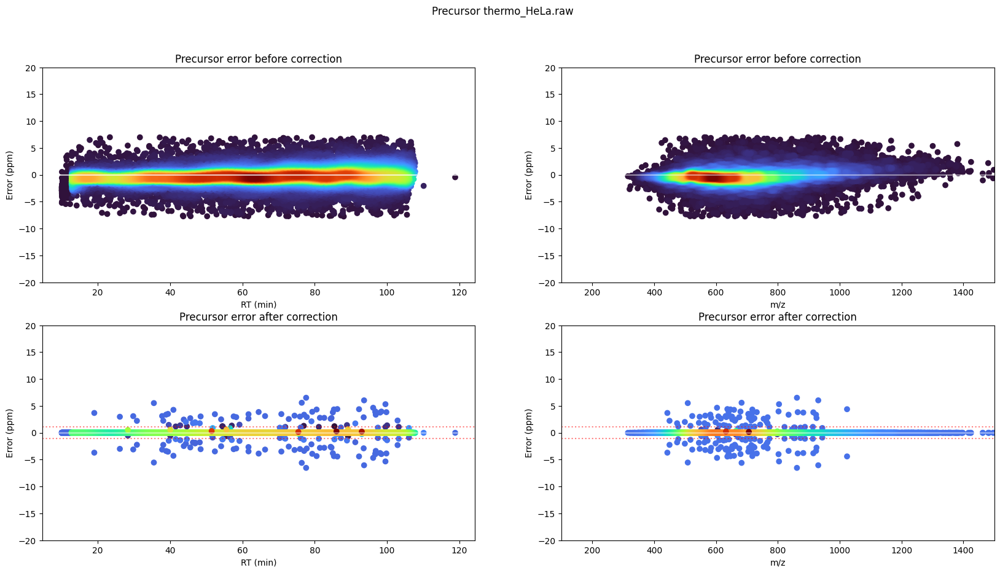

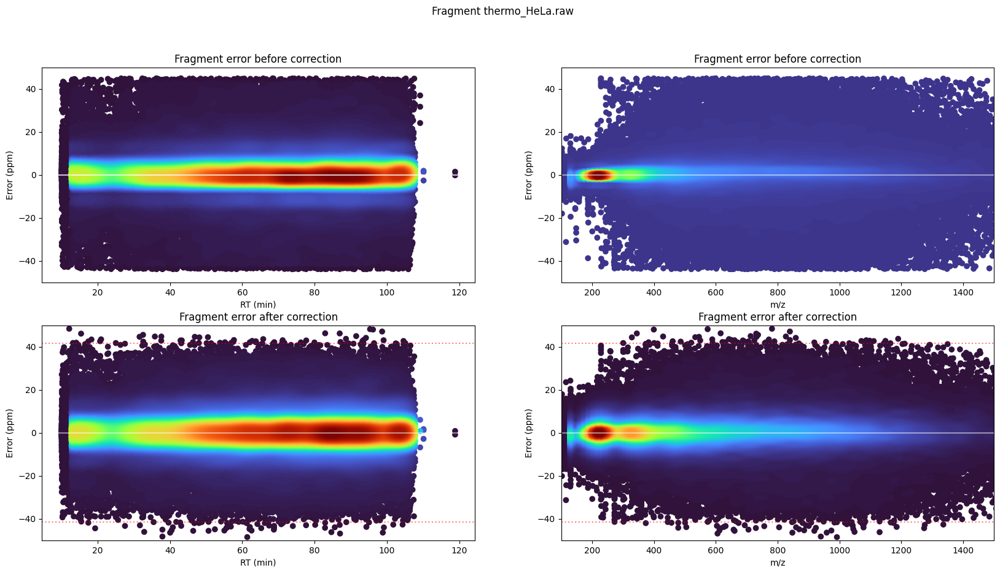

In [28]:
%run -i ../test_ci.py $tmp_folder thermo_hela_large_fasta

### Many modifications

2023-07-12 22:37:54> Creating dir F:\projects\alphapept\sandbox\temp/test_temp.
2023-07-12 22:37:55> No settings provided. Creating from default settings.
2023-07-12 22:37:55> Platform information:
2023-07-12 22:37:55> system     - Windows
2023-07-12 22:37:55> release    - 10
2023-07-12 22:37:55> version    - 10.0.19044
2023-07-12 22:37:55> machine    - AMD64
2023-07-12 22:37:55> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 22:37:55> cpu count  - 24
2023-07-12 22:37:55> ram memory - 112.2/127.7 Gb (available/total)
2023-07-12 22:37:55> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 22:37:55> Python information:
2023-07-12 22:37:55> SQLAlchemy                    - 1.4.39
2023-07-12 22:37:55> alphapept                     - 0.5.0
2023-07-12 22:37:55> alpharaw                      - 0.1.0
2023-07-12 22:37:55> alphatims                     - 1.0.7
2023-07-12 22:37:55> biopython                     - 1.79
2023-07-12 22:37:55> bumpver

2023-07-12 22:37:56> lfq_quantification - True
2023-07-12 22:37:56> match              - False
2023-07-12 22:37:56> recalibrate_data   - True
2023-07-12 22:37:56> search_data        - True
2023-07-12 22:37:56> 
2023-07-12 22:37:56> Checking if files exist.
2023-07-12 22:37:56> FASTA Files have a total size of 13.116 Mb
2023-07-12 22:37:56> Workflow has 11 steps
2023-07-12 22:37:56> ==== create_database ====
2023-07-12 22:37:56> Not saving Database.
2023-07-12 22:37:56> ==== import_raw_data ====


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 22:37:56> Processing 1 files for step raw_conversion
2023-07-12 22:37:56> File F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa has extension .raw - converting from Thermo.
2023-07-12 22:39:55> File conversion complete. Extracted 120,226 precursors.
2023-07-12 22:39:58> File conversion of file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw complete.


  0%|                                                                                                                                                                | 0/1 [02:02<?, ?it/s]

2023-07-12 22:39:58> ==== feature_finding ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 22:39:58> Processing 1 files for step find_features
2023-07-12 22:39:58> No *.hdf file with features found for F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.ms_data.hdf. Adding to feature finding list.
2023-07-12 22:39:58> Feature finding on F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw
2023-07-12 22:39:58> Hill extraction with centroid_tol 8 and max_gap 2
2023-07-12 22:40:03> Number of hills 1,105,353, len = 17.35
2023-07-12 22:40:03> Repeating hill extraction with centroid_tol 5.87
2023-07-12 22:40:07> Number of hills 1,227,331, len = 19.44
2023-07-12 22:40:08> After duplicate removal of hills 1,025,845
2023-07-12 22:40:16> After split hill_ptrs 1,207,373
2023-07-12 22:40:17> After filter hill_ptrs 1,188,406
2023-07-12 22:42:03> Extracting hill stats complete
2023-07-12 22:42:13> Found 184,383 pre isotope patterns.
2023-07-12 22:42:52> Extracted 198,500 isotope patterns.
2023-07-12 22:42:55> Report complete.
2023-07-12 22:42:55> Matching features 

  0%|                                                                                                                                                                | 0/1 [02:59<?, ?it/s]

2023-07-12 22:42:57> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 22:42:57> Starting first search.
2023-07-12 22:42:58> Number of FASTA entries: 20,611 - FASTA settings {'mods_fixed': ['cC'], 'mods_fixed_terminal': [], 'mods_variable': ['oxM', 'pS', 'pT', 'pY'], 'mods_variable_terminal': [], 'mods_fixed_terminal_prot': [], 'mods_variable_terminal_prot': ['a<^'], 'n_missed_cleavages': 2, 'pep_length_min': 7, 'pep_length_max': 27, 'isoforms_max': 1024, 'n_modifications_max': 3, 'pseudo_reverse': True, 'AL_swap': False, 'KR_swap': False, 'protease': 'trypsin', 'spectra_block': 100000, 'fasta_block': 1000, 'save_db': False, 'fasta_size_max': 100}
2023-07-12 22:42:58> Setting Process limit to 23
2023-07-12 22:42:58> AlphaPool was set to 23 processes. Setting max to 23.
2023-07-12 22:47:13> Block 1 of 21 complete - 4.76 % - created peptides 1,458,772 - total peptides 1,458,772 


  5%|██████▏                                                                                                                          | 0.047619047619047616/1 [04:15<1:25:06, 5361.80s/it]

2023-07-12 22:48:55> Block 2 of 21 complete - 9.52 % - created peptides 2,063,484 - total peptides 3,522,256 


 10%|████████████▌                                                                                                                       | 0.09523809523809523/1 [06:02<53:17, 3533.56s/it]

2023-07-12 22:49:03> Block 3 of 21 complete - 14.29 % - created peptides 2,103,204 - total peptides 5,625,460 


 14%|██████████████████▊                                                                                                                 | 0.14285714285714285/1 [06:15<29:14, 2046.76s/it]

2023-07-12 22:49:13> Block 4 of 21 complete - 19.05 % - created peptides 2,149,048 - total peptides 7,774,508 


 19%|█████████████████████████▏                                                                                                          | 0.19047619047619047/1 [06:25<17:48, 1319.39s/it]

2023-07-12 22:49:23> Block 5 of 21 complete - 23.81 % - created peptides 2,145,470 - total peptides 9,919,978 


 24%|███████████████████████████████▋                                                                                                     | 0.23809523809523808/1 [06:40<12:11, 959.95s/it]

2023-07-12 22:49:38> Block 6 of 21 complete - 28.57 % - created peptides 2,226,894 - total peptides 12,146,872 


 29%|██████████████████████████████████████▎                                                                                               | 0.2857142857142857/1 [06:56<08:50, 742.34s/it]

2023-07-12 22:49:53> Block 7 of 21 complete - 33.33 % - created peptides 2,306,322 - total peptides 14,453,194 


 33%|████████████████████████████████████████████▋                                                                                         | 0.3333333333333333/1 [07:03<06:08, 552.05s/it]

2023-07-12 22:50:01> Block 8 of 21 complete - 38.10 % - created peptides 2,357,600 - total peptides 16,810,794 


 38%|██████████████████████████████████████████████████▋                                                                                  | 0.38095238095238093/1 [07:10<04:22, 423.45s/it]

2023-07-12 22:50:08> Block 9 of 21 complete - 42.86 % - created peptides 2,390,692 - total peptides 19,201,486 


 43%|█████████████████████████████████████████████████████████                                                                            | 0.42857142857142855/1 [07:16<03:05, 324.88s/it]

2023-07-12 22:50:13> Block 10 of 21 complete - 47.62 % - created peptides 2,382,628 - total peptides 21,584,114 


 48%|███████████████████████████████████████████████████████████████▎                                                                     | 0.47619047619047616/1 [07:21<02:15, 258.57s/it]

2023-07-12 22:50:19> Block 11 of 21 complete - 52.38 % - created peptides 2,353,112 - total peptides 23,937,226 


 52%|██████████████████████████████████████████████████████████████████████▏                                                               | 0.5238095238095238/1 [07:28<01:47, 225.70s/it]

2023-07-12 22:50:26> Block 12 of 21 complete - 57.14 % - created peptides 2,401,622 - total peptides 26,338,848 


 57%|████████████████████████████████████████████████████████████████████████████▌                                                         | 0.5714285714285714/1 [07:33<01:22, 191.97s/it]

2023-07-12 22:50:31> Block 13 of 21 complete - 61.90 % - created peptides 2,388,432 - total peptides 28,727,280 


 62%|██████████████████████████████████████████████████████████████████████████████████▉                                                   | 0.6190476190476191/1 [07:41<01:08, 180.28s/it]

2023-07-12 22:50:39> Block 14 of 21 complete - 66.67 % - created peptides 2,426,392 - total peptides 31,153,672 


 67%|█████████████████████████████████████████████████████████████████████████████████████████▎                                            | 0.6666666666666666/1 [07:47<00:54, 162.45s/it]

2023-07-12 22:50:44> Block 15 of 21 complete - 71.43 % - created peptides 2,407,088 - total peptides 33,560,760 


 71%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 0.7142857142857143/1 [07:54<00:45, 158.30s/it]

2023-07-12 22:50:51> Block 16 of 21 complete - 76.19 % - created peptides 2,445,436 - total peptides 36,006,196 


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                | 0.7619047619047619/1 [08:01<00:37, 156.69s/it]

2023-07-12 22:50:59> Block 17 of 21 complete - 80.95 % - created peptides 2,470,086 - total peptides 38,476,282 


 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                         | 0.8095238095238095/1 [08:08<00:29, 156.24s/it]

2023-07-12 22:51:06> Block 18 of 21 complete - 85.71 % - created peptides 2,480,360 - total peptides 40,956,642 


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 0.8571428571428571/1 [08:14<00:20, 146.26s/it]

2023-07-12 22:51:12> Block 19 of 21 complete - 90.48 % - created peptides 2,486,372 - total peptides 43,443,014 


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 0.9047619047619048/1 [08:23<00:14, 156.21s/it]

2023-07-12 22:51:20> Block 20 of 21 complete - 95.24 % - created peptides 2,541,884 - total peptides 45,984,898 


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 0.9523809523809523/1 [08:29<00:07, 149.41s/it]

2023-07-12 22:51:27> Block 21 of 21 complete - 100.00 % - created peptides 2,551,806 - total peptides 48,536,704 


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [08:37<00:00, 153.96s/it]

2023-07-12 22:51:36> Saving as first_search
2023-07-12 22:52:38> Complete. Created peptides 48,536,704
2023-07-12 22:52:40> First search complete.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [09:42<00:00, 582.75s/it]

2023-07-12 22:52:40> ==== recalibrate_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 22:52:40> Processing 1 files for step calibrate_hdf
2023-07-12 22:52:40> Recalibrating file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw.
2023-07-12 22:52:42> Scoring using generic score
2023-07-12 22:52:43> 42,427 target (424 decoy) of 129,161 PSMs. FDR 0.009994 for a cutoff of 12.22 (set FDR was 0.01).
2023-07-12 22:52:43> Precursor mass calibration for file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw.
2023-07-12 22:52:46> Precursor calibration std 0.24, 0.00
2023-07-12 22:52:46> Saving precursor calibration
2023-07-12 22:52:51> Precursor calibration of file F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.ms_data.hdf complete.
2023-07-12 22:52:51> Starting fragment calibration.
2023-07-12 22:52:51> Calibrating fragments with neighbors
2023-07-12 22:52:53> Scoring using generic score
2023-07-12 22:52:55> 42,427 target (424 decoy) of 129,161 PSMs. FDR 0.009994 for a cutoff of 12.22 (set FDR was 0.01).
2023-07-12 22:52:56> Minimum hit

  0%|                                                                                                                                                                | 0/1 [00:57<?, ?it/s]

2023-07-12 22:53:38> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 22:53:38> Starting second search with DB.
2023-07-12 22:53:38> Starting second search.
2023-07-12 22:53:39> Number of FASTA entries: 20,611 - FASTA settings {'mods_fixed': ['cC'], 'mods_fixed_terminal': [], 'mods_variable': ['oxM', 'pS', 'pT', 'pY'], 'mods_variable_terminal': [], 'mods_fixed_terminal_prot': [], 'mods_variable_terminal_prot': ['a<^'], 'n_missed_cleavages': 2, 'pep_length_min': 7, 'pep_length_max': 27, 'isoforms_max': 1024, 'n_modifications_max': 3, 'pseudo_reverse': True, 'AL_swap': False, 'KR_swap': False, 'protease': 'trypsin', 'spectra_block': 100000, 'fasta_block': 1000, 'save_db': False, 'fasta_size_max': 100}
2023-07-12 22:53:39> Setting Process limit to 23
2023-07-12 22:53:39> AlphaPool was set to 23 processes. Setting max to 23.
2023-07-12 22:57:07> Block 1 of 21 complete - 4.76 % - created peptides 1,458,772 - total peptides 1,458,772 


  5%|██████▏                                                                                                                          | 0.047619047619047616/1 [03:29<1:09:48, 4397.97s/it]

2023-07-12 22:58:21> Block 2 of 21 complete - 9.52 % - created peptides 2,063,484 - total peptides 3,522,256 


 10%|████████████▌                                                                                                                       | 0.09523809523809523/1 [04:43<41:04, 2723.96s/it]

2023-07-12 22:58:28> Block 3 of 21 complete - 14.29 % - created peptides 2,103,204 - total peptides 5,625,460 


 14%|██████████████████▊                                                                                                                 | 0.14285714285714285/1 [04:50<22:08, 1550.27s/it]

2023-07-12 22:58:30> Block 4 of 21 complete - 19.05 % - created peptides 2,145,470 - total peptides 7,770,930 


 19%|█████████████████████████▎                                                                                                           | 0.19047619047619047/1 [04:52<12:55, 957.61s/it]

2023-07-12 22:58:33> Block 5 of 21 complete - 23.81 % - created peptides 2,149,048 - total peptides 9,919,978 


 24%|███████████████████████████████▋                                                                                                     | 0.23809523809523808/1 [04:56<08:06, 638.25s/it]

2023-07-12 22:58:40> Block 6 of 21 complete - 28.57 % - created peptides 2,226,894 - total peptides 12,146,872 


 29%|██████████████████████████████████████▎                                                                                               | 0.2857142857142857/1 [05:03<05:35, 470.32s/it]

2023-07-12 22:58:48> Block 7 of 21 complete - 33.33 % - created peptides 2,306,322 - total peptides 14,453,194 


 33%|████████████████████████████████████████████▋                                                                                         | 0.3333333333333333/1 [05:11<04:10, 375.61s/it]

2023-07-12 22:58:50> Block 8 of 21 complete - 38.10 % - created peptides 2,353,112 - total peptides 16,806,306 


 38%|██████████████████████████████████████████████████▋                                                                                  | 0.38095238095238093/1 [05:13<02:46, 269.08s/it]

2023-07-12 22:58:52> Block 9 of 21 complete - 42.86 % - created peptides 2,357,600 - total peptides 19,163,906 


 43%|█████████████████████████████████████████████████████████                                                                            | 0.42857142857142855/1 [05:15<01:51, 194.82s/it]

2023-07-12 22:58:53> Block 10 of 21 complete - 47.62 % - created peptides 2,390,692 - total peptides 21,554,598 


 48%|███████████████████████████████████████████████████████████████▎                                                                     | 0.47619047619047616/1 [05:17<01:17, 148.47s/it]

2023-07-12 22:58:56> Block 11 of 21 complete - 52.38 % - created peptides 2,388,432 - total peptides 23,943,030 


 52%|██████████████████████████████████████████████████████████████████████▏                                                               | 0.5238095238095238/1 [05:19<00:55, 115.57s/it]

2023-07-12 22:58:57> Block 12 of 21 complete - 57.14 % - created peptides 2,382,628 - total peptides 26,325,658 


 57%|█████████████████████████████████████████████████████████████████████████████▏                                                         | 0.5714285714285714/1 [05:21<00:40, 94.55s/it]

2023-07-12 22:59:00> Block 13 of 21 complete - 61.90 % - created peptides 2,445,436 - total peptides 28,771,094 


 62%|███████████████████████████████████████████████████████████████████████████████████▌                                                   | 0.6190476190476191/1 [05:23<00:30, 79.71s/it]

2023-07-12 22:59:02> Block 14 of 21 complete - 66.67 % - created peptides 2,407,088 - total peptides 31,178,182 


 67%|██████████████████████████████████████████████████████████████████████████████████████████                                             | 0.6666666666666666/1 [05:25<00:23, 69.13s/it]

2023-07-12 22:59:04> Block 15 of 21 complete - 71.43 % - created peptides 2,401,622 - total peptides 33,579,804 


 71%|████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 0.7142857142857143/1 [05:28<00:17, 62.69s/it]

2023-07-12 22:59:06> Block 16 of 21 complete - 76.19 % - created peptides 2,426,392 - total peptides 36,006,196 


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                | 0.7619047619047619/1 [05:29<00:12, 54.24s/it]

2023-07-12 22:59:08> Block 17 of 21 complete - 80.95 % - created peptides 2,470,086 - total peptides 38,476,282 


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                         | 0.8095238095238095/1 [05:31<00:09, 50.69s/it]

2023-07-12 22:59:10> Block 18 of 21 complete - 85.71 % - created peptides 2,486,372 - total peptides 40,962,654 


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 0.8571428571428571/1 [05:33<00:06, 48.78s/it]

2023-07-12 22:59:12> Block 19 of 21 complete - 90.48 % - created peptides 2,541,884 - total peptides 43,504,538 


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 0.9047619047619048/1 [05:36<00:04, 48.25s/it]

2023-07-12 22:59:14> Block 20 of 21 complete - 95.24 % - created peptides 2,480,360 - total peptides 45,984,898 


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 0.9523809523809523/1 [05:38<00:02, 48.17s/it]

2023-07-12 22:59:17> Block 21 of 21 complete - 100.00 % - created peptides 2,551,806 - total peptides 48,536,704 


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [05:40<00:00, 48.64s/it]

2023-07-12 22:59:19> Saving as second_search
2023-07-12 22:59:51> Complete. Created peptides 48,536,704
2023-07-12 22:59:51> Second search complete.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [06:13<00:00, 373.42s/it]

2023-07-12 22:59:51> ==== score ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 22:59:51> Processing 1 files for step score_hdf
2023-07-12 22:59:51> Calling score_hdf
2023-07-12 22:59:52> Found second search psms for scoring.
2023-07-12 22:59:59> 59,280 target (5,928 decoy) of 93,174 PSMs. FDR 0.100000 for a cutoff of 6.99 (set FDR was 0.1).
2023-07-12 23:00:00> Training & cross-validation on 20,411 targets and 20,411 decoys
2023-07-12 23:00:38> The best parameters selected by 5-fold cross-validation were {'clf__max_depth': 25, 'clf__max_leaf_nodes': 250}
2023-07-12 23:00:38> The train accuracy was 0.812
2023-07-12 23:00:38> Testing on 81,646 targets and 81,646 decoys
2023-07-12 23:00:40> The test accuracy was 0.772
2023-07-12 23:00:40> ML Top features
2023-07-12 23:00:40> 1	generic_score                  0.1772
2023-07-12 23:00:40> 2	hits_y                         0.1520
2023-07-12 23:00:40> 3	hits                           0.1237
2023-07-12 23:00:40> 4	temp_idx                       0.0741
2023-07-12 23:00:40> 5	x_tandem                       0.0690
2

C:\ProgramData\Miniconda3\envs\alphapept\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2023-07-12 23:00:44> 85,266 target (852 decoy) of 135,114 PSMs. FDR 0.009992 for a cutoff of 0.68 (set FDR was 0.01).
2023-07-12 23:00:44> Saving identifications to ms_data file.
2023-07-12 23:00:45> Saving identifications to ms_data file complete.
2023-07-12 23:00:50> Saving identifications to csv file complete.
2023-07-12 23:00:50> Filter df with custom score
2023-07-12 23:00:51> Global FDR on precursor
2023-07-12 23:00:51> 51,775 target (517 decoy) of 93,451 PSMs. FDR 0.009986 for a cutoff of 0.75 (set FDR was 0.01).
2023-07-12 23:00:51> Global FDR cutoff at 0.746.
2023-07-12 23:00:51> FDR on peptides complete. For 0.01 FDR found 52,677 targets and 517 decoys.
2023-07-12 23:00:51> Extracting fragment_ions
2023-07-12 23:01:02> Extracting fragment_ions complete.
2023-07-12 23:01:02> Exporting peptide_fdr on F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw.
2023-07-12 23:01:03> Scoring of files F:\projects\alphapept\sandbox\temp/test_temp\thermo_HeLa.raw complete.


  0%|                                                                                                                                                                | 0/1 [01:11<?, ?it/s]

2023-07-12 23:01:03> ==== isobaric_labeling ====
2023-07-12 23:01:03> ==== protein_grouping ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:01:06> Fasta dict with length 20,611, Pept dict with length 45,687
2023-07-12 23:01:06> Extracting protein groups.



  0%|                                                                                                                                                                | 0/1 [00:02<?, ?it/s]


2023-07-12 23:01:07> A total of 42,555 unique and 2,616 shared peptides.
2023-07-12 23:01:08> A total of 736 ambigious proteins
2023-07-12 23:01:08> A total of 494 unique and 22 shared peptides.
2023-07-12 23:01:08> A total of 22 ambigious proteins
2023-07-12 23:01:08> Global FDR on protein_group
2023-07-12 23:01:08> 5,810 target (58 decoy) of 6,938 PSMs. FDR 0.009983 for a cutoff of 0.95 (set FDR was 0.01).
2023-07-12 23:01:08> Global FDR cutoff at 0.950.
2023-07-12 23:01:08> FDR on proteins complete. For 0.01 FDR found 51,962 targets and 62 decoys. A total of 5,868 proteins found.
2023-07-12 23:01:09> Saving complete.
2023-07-12 23:01:09> Protein groups complete.


  0%|                                                                                                                                                                | 0/1 [00:02<?, ?it/s]

2023-07-12 23:01:09> ==== quantification ====
2023-07-12 23:01:09> Reading protein_fdr for quantification.


2023-07-12 23:01:09> Saving protein_groups after delayed normalization to combined_protein_fdr_dn
2023-07-12 23:01:09> Complete.
2023-07-12 23:01:09> Starting profile extraction.


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.63it/s]

2023-07-12 23:01:09> LFQ complete.
2023-07-12 23:01:09> Extracting protein_summary
2023-07-12 23:01:09> Saved protein_summary of length 5,868 saved to F:\projects\alphapept\sandbox\temp\test_temp\results_protein_summary.csv
2023-07-12 23:01:09> Updating protein_fdr.
2023-07-12 23:01:10> Exporting as csv.
2023-07-12 23:01:12> Saved df of length 52,024 saved to F:\projects\alphapept\sandbox\temp\test_temp\results


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.55s/it]

2023-07-12 23:01:12> ==== export ====


2023-07-12 23:01:16> Settings saved to F:\projects\alphapept\sandbox\temp\test_temp\results.yaml
2023-07-12 23:01:16> Analysis complete.


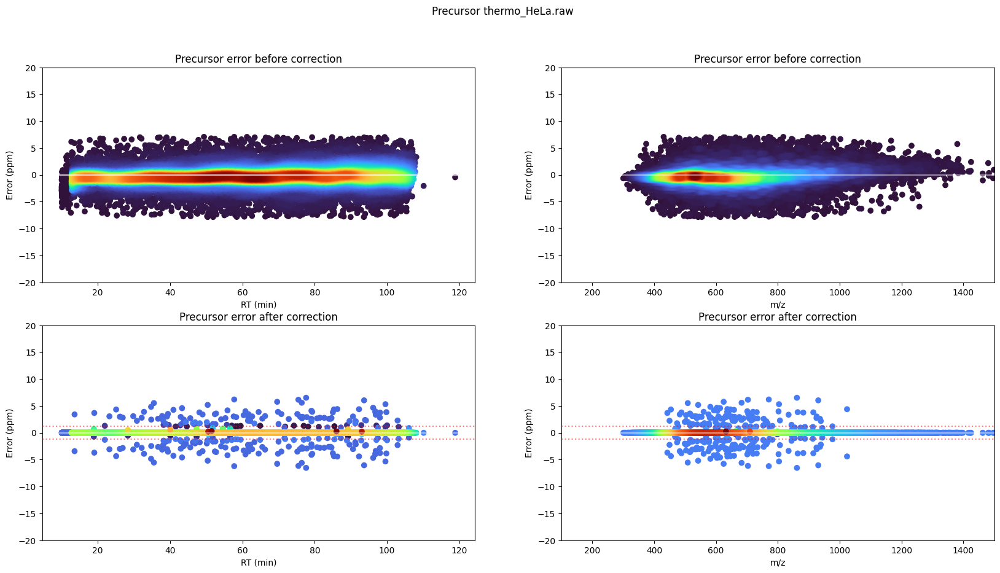

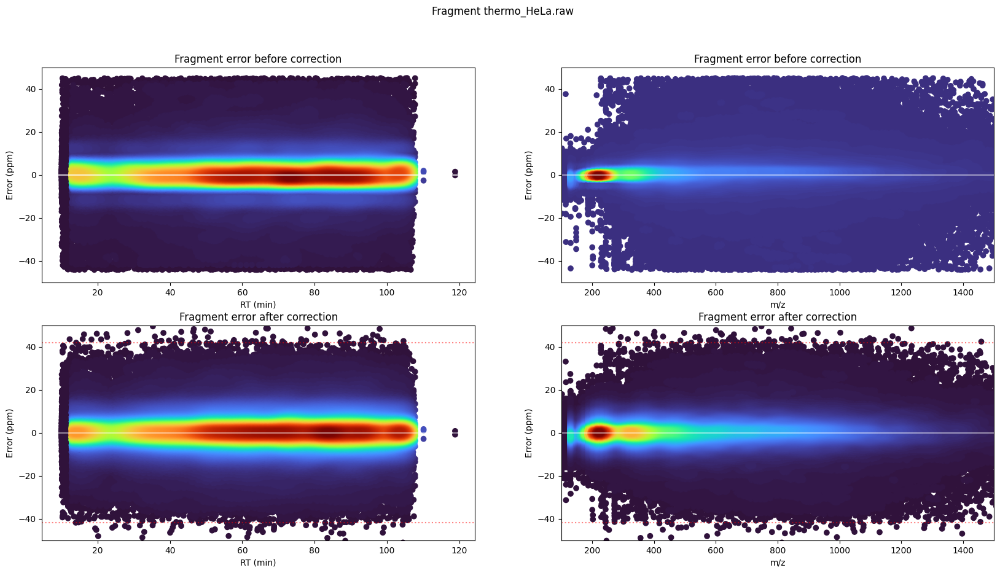

In [29]:
%run -i ../test_ci.py $tmp_folder thermo_hela_modifications

### Matching

In [30]:
%run -i ../test_ci.py $tmp_folder PXD015087_matching

2023-07-12 23:01:32> Creating dir F:\projects\alphapept\sandbox\temp/test_temp.
2023-07-12 23:01:35> No settings provided. Creating from default settings.
2023-07-12 23:01:35> Platform information:
2023-07-12 23:01:35> system     - Windows
2023-07-12 23:01:35> release    - 10
2023-07-12 23:01:35> version    - 10.0.19044
2023-07-12 23:01:35> machine    - AMD64
2023-07-12 23:01:35> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 23:01:35> cpu count  - 24
2023-07-12 23:01:35> ram memory - 109.9/127.7 Gb (available/total)
2023-07-12 23:01:35> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 23:01:36> Python information:
2023-07-12 23:01:36> SQLAlchemy                    - 1.4.39
2023-07-12 23:01:36> alphapept                     - 0.5.0
2023-07-12 23:01:36> alpharaw                      - 0.1.0
2023-07-12 23:01:36> alphatims                     - 1.0.7
2023-07-12 23:01:36> biopython                     - 1.79
2023-07-12 23:01:36> bumpver

2023-07-12 23:01:36> 
2023-07-12 23:01:36> Checking if files exist.
2023-07-12 23:01:36> FASTA Files have a total size of 13.116 Mb
2023-07-12 23:01:36> Workflow has 13 steps
2023-07-12 23:01:36> ==== create_database ====
2023-07-12 23:01:36> Database path F:\projects\alphapept\sandbox\temp\test_temp\database.hdf is not a file.
2023-07-12 23:01:36> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\human.fasta with size 12.97 Mb.
2023-07-12 23:01:36> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\contaminants.fasta with size 0.15 Mb.
2023-07-12 23:01:36> Creating a new database from FASTA.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:01:37> FASTA contains 20,611 entries.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:48<00:00, 26.58s/it]

2023-07-12 23:03:34> Digested 20,611 proteins and generated 5,139,336 spectra
2023-07-12 23:04:21> Database saved to F:\projects\alphapept\sandbox\temp\test_temp\database.hdf. Filesize of database is 1.97 GB


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [02:45<00:00, 165.43s/it]

2023-07-12 23:04:29> ==== import_raw_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:04:29> Processing 4 files for step raw_conversion
2023-07-12 23:04:29> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 23:05:30> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step raw_conversion succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [01:00<03:02, 243.07s/it]

2023-07-12 23:05:30> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step raw_conversion succeeded. 50.00 %
2023-07-12 23:05:30> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step raw_conversion succeeded. 75.00 %


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 0.75/1 [01:00<00:15, 63.26s/it]

2023-07-12 23:05:31> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step raw_conversion succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:01<00:00, 61.83s/it]

2023-07-12 23:05:31> ==== feature_finding ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:05:31> Processing 4 files for step find_features
2023-07-12 23:05:31> Setting Process limit to 14
2023-07-12 23:05:31> AlphaPool was set to 14 processes. Setting max to 14.
2023-07-12 23:09:45> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step find_features succeeded. 25.00 %


 25%|████████████████████████████████████▊                                                                                                              | 0.25/1 [04:14<12:43, 1017.73s/it]

2023-07-12 23:09:46> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step find_features succeeded. 50.00 %


 50%|██████████████████████████████████████████████████████████████████████████▌                                                                          | 0.5/1 [04:14<03:30, 420.03s/it]

2023-07-12 23:09:52> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step find_features succeeded. 75.00 %


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 0.75/1 [04:21<00:59, 239.95s/it]

2023-07-12 23:09:53> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step find_features succeeded. 100.00 %


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [04:21<00:00, 261.86s/it]

2023-07-12 23:09:53> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:09:53> Starting first search.
2023-07-12 23:09:53> Processing 4 files for step search_db
2023-07-12 23:09:53> Searching. Setting Process limit to 4.
2023-07-12 23:09:53> AlphaPool was set to 4 processes. Setting max to 4.
2023-07-12 23:10:34> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step search_db succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:41<02:03, 164.86s/it]

2023-07-12 23:10:34> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step search_db succeeded. 50.00 %


 50%|███████████████████████████████████████████████████████████████████████████                                                                           | 0.5/1 [00:41<00:34, 68.46s/it]

2023-07-12 23:10:34> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step search_db succeeded. 75.00 %
2023-07-12 23:10:34> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step search_db succeeded. 100.00 %
2023-07-12 23:10:49> First search complete.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:56<00:00, 56.31s/it]

2023-07-12 23:10:49> ==== recalibrate_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:10:49> Processing 4 files for step calibrate_hdf
2023-07-12 23:10:49> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 23:11:44> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step calibrate_hdf succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:55<02:45, 220.22s/it]

2023-07-12 23:11:44> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step calibrate_hdf succeeded. 50.00 %
2023-07-12 23:11:47> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step calibrate_hdf succeeded. 75.00 %


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 0.75/1 [00:57<00:15, 61.35s/it]

2023-07-12 23:11:47> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step calibrate_hdf succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:58<00:00, 58.02s/it]

2023-07-12 23:11:47> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:11:47> Starting second search with DB.
2023-07-12 23:11:47> Processing 4 files for step search_db
2023-07-12 23:11:47> Searching. Setting Process limit to 4.
2023-07-12 23:11:47> AlphaPool was set to 4 processes. Setting max to 4.
2023-07-12 23:12:14> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step search_db succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:26<01:19, 105.70s/it]

2023-07-12 23:12:14> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step search_db succeeded. 50.00 %
2023-07-12 23:12:14> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step search_db succeeded. 75.00 %
2023-07-12 23:12:14> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step search_db succeeded. 100.00 %
2023-07-12 23:12:27> Second search complete.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:40<00:00, 40.13s/it]


2023-07-12 23:12:28> ==== score ====


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:12:28> Processing 4 files for step score_hdf
2023-07-12 23:12:28> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 23:12:56> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step score_hdf succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:28<01:25, 113.83s/it]

2023-07-12 23:12:56> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step score_hdf succeeded. 50.00 %


 50%|███████████████████████████████████████████████████████████████████████████                                                                           | 0.5/1 [00:28<00:23, 47.31s/it]

2023-07-12 23:12:56> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step score_hdf succeeded. 75.00 %
2023-07-12 23:12:56> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step score_hdf succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:28<00:00, 28.74s/it]

2023-07-12 23:12:56> ==== align ====


2023-07-12 23:12:57> cache info: iteration 0 items 1 size 2009.6 kB
2023-07-12 23:12:57> cache info: iteration 0 items 2 size 4046.3 kB
2023-07-12 23:12:59> Total deviation before calibration {'mz': 2.0615087445111315e-06, 'rt': 0.17717085303029778}
2023-07-12 23:12:59> Mean deviation before calibration {'mz': 3.4358479075185526e-07, 'rt': 0.02952847550504963}
2023-07-12 23:12:59> Solving equation system with 60 jobs.
2023-07-12 23:12:59> Regression score is 0.9999423070561607
2023-07-12 23:12:59> Solving equation system complete.
2023-07-12 23:12:59> Applying offset
2023-07-12 23:12:59> Saving F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.ms_data.hdf - peptide_fdr.
2023-07-12 23:13:00> Saving F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.ms_data.hdf - feature_table.
2023-07-12 23:13:00> Saving F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.ms_data.hdf - peptide_fdr.
2023-07-12 23:13:00> Saving F:\projects\

  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:13:30> Fasta dict with length 20,611, Pept dict with length 5,139,342
2023-07-12 23:13:30> Extracting protein groups.



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]


2023-07-12 23:13:31> A total of 27,713 unique and 2,163 shared peptides.
2023-07-12 23:13:32> A total of 533 ambigious proteins
2023-07-12 23:13:32> A total of 478 unique and 24 shared peptides.
2023-07-12 23:13:32> A total of 23 ambigious proteins
2023-07-12 23:13:32> Global FDR on protein_group
2023-07-12 23:13:32> 3,643 target (36 decoy) of 4,502 PSMs. FDR 0.009882 for a cutoff of 0.66 (set FDR was 0.01).
2023-07-12 23:13:32> Global FDR cutoff at 0.660.
2023-07-12 23:13:33> FDR on proteins complete. For 0.01 FDR found 102,348 targets and 82 decoys. A total of 3,679 proteins found.
2023-07-12 23:13:34> Saving complete.
2023-07-12 23:13:34> Protein groups complete.


  0%|                                                                                                                                                                | 0/1 [00:03<?, ?it/s]

2023-07-12 23:13:34> ==== quantification ====
2023-07-12 23:13:34> Reading protein_fdr for quantification.


2023-07-12 23:13:34> Delayed Normalization.
2023-07-12 23:13:34> Setting minimum occurence to 4.0
2023-07-12 23:13:34> Delayed normalization with SLSQP on (1, 4, 18818)
2023-07-12 23:13:34> Saving protein_groups after delayed normalization to combined_protein_fdr_dn
2023-07-12 23:13:35> Complete.
2023-07-12 23:13:35> Starting profile extraction.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:13:35> Preparing protein table for parallel processing.


 19%|█████████████████████████▌                                                                                                            | 0.19092144604512096/1 [00:02<00:08,  9.97s/it]

2023-07-12 23:13:37> Starting protein extraction for 3679 proteins.
2023-07-12 23:13:37> AlphaPool was set to 24 processes. Setting max to 24.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 0.9982603968469692/1 [00:54<00:00, 47.54s/it]

2023-07-12 23:14:33> LFQ complete.
2023-07-12 23:14:33> Extracting protein_summary
2023-07-12 23:14:33> Saved protein_summary of length 3,679 saved to F:\projects\alphapept\sandbox\temp\test_temp\results_protein_summary.csv
2023-07-12 23:14:34> Updating protein_fdr.
2023-07-12 23:14:34> Exporting as csv.
2023-07-12 23:14:39> Saved df of length 102,430 saved to F:\projects\alphapept\sandbox\temp\test_temp\results


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:03<00:00, 63.90s/it]

2023-07-12 23:14:39> ==== export ====


2023-07-12 23:14:42> Settings saved to F:\projects\alphapept\sandbox\temp\test_temp\results.yaml
2023-07-12 23:14:42> Analysis complete.


### Matching & Fractions

In [31]:
%run -i ../test_ci.py $tmp_folder PXD015087_matching_fraction

2023-07-12 23:14:43> Creating dir F:\projects\alphapept\sandbox\temp/test_temp.
2023-07-12 23:14:45> No settings provided. Creating from default settings.
2023-07-12 23:14:45> Platform information:
2023-07-12 23:14:45> system     - Windows
2023-07-12 23:14:45> release    - 10
2023-07-12 23:14:45> version    - 10.0.19044
2023-07-12 23:14:45> machine    - AMD64
2023-07-12 23:14:45> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 23:14:45> cpu count  - 24
2023-07-12 23:14:45> ram memory - 114.0/127.7 Gb (available/total)
2023-07-12 23:14:45> processor  - Intel64 Family 6 Model 85 Stepping 4, GenuineIntel
2023-07-12 23:14:45> Python information:
2023-07-12 23:14:45> SQLAlchemy                    - 1.4.39
2023-07-12 23:14:45> alphapept                     - 0.5.0
2023-07-12 23:14:45> alpharaw                      - 0.1.0
2023-07-12 23:14:45> alphatims                     - 1.0.7
2023-07-12 23:14:45> biopython                     - 1.79
2023-07-12 23:14:45> bumpver

2023-07-12 23:14:45> Workflow has 13 steps
2023-07-12 23:14:45> ==== create_database ====
2023-07-12 23:14:45> Database path F:\projects\alphapept\sandbox\temp\test_temp\database.hdf is not a file.
2023-07-12 23:14:45> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\human.fasta with size 12.97 Mb.
2023-07-12 23:14:45> Found FASTA file F:\projects\alphapept\sandbox\temp/test_temp\contaminants.fasta with size 0.15 Mb.
2023-07-12 23:14:45> Creating a new database from FASTA.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:14:46> FASTA contains 20,611 entries.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:48<00:00, 28.56s/it]

2023-07-12 23:16:43> Digested 20,611 proteins and generated 5,139,336 spectra
2023-07-12 23:17:30> Database saved to F:\projects\alphapept\sandbox\temp\test_temp\database.hdf. Filesize of database is 1.97 GB


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [02:45<00:00, 165.22s/it]

2023-07-12 23:17:38> ==== import_raw_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:17:38> Processing 4 files for step raw_conversion
2023-07-12 23:17:38> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 23:18:39> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step raw_conversion succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [01:00<03:02, 243.31s/it]

2023-07-12 23:18:39> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step raw_conversion succeeded. 50.00 %


 50%|██████████████████████████████████████████████████████████████████████████▌                                                                          | 0.5/1 [01:01<00:50, 100.88s/it]

2023-07-12 23:18:39> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step raw_conversion succeeded. 75.00 %
2023-07-12 23:18:39> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step raw_conversion succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:01<00:00, 61.30s/it]

2023-07-12 23:18:40> ==== feature_finding ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:18:40> Processing 4 files for step find_features
2023-07-12 23:18:40> Setting Process limit to 14
2023-07-12 23:18:40> AlphaPool was set to 14 processes. Setting max to 14.
2023-07-12 23:23:00> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step find_features succeeded. 25.00 %


 25%|████████████████████████████████████▊                                                                                                              | 0.25/1 [04:20<13:01, 1041.60s/it]

2023-07-12 23:23:00> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step find_features succeeded. 50.00 %
2023-07-12 23:23:05> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step find_features succeeded. 75.00 %


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████                                     | 0.75/1 [04:25<01:09, 277.35s/it]

2023-07-12 23:23:06> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step find_features succeeded. 100.00 %


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [04:26<00:00, 266.62s/it]

2023-07-12 23:23:06> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:23:06> Starting first search.
2023-07-12 23:23:06> Processing 4 files for step search_db
2023-07-12 23:23:06> Searching. Setting Process limit to 4.
2023-07-12 23:23:06> AlphaPool was set to 4 processes. Setting max to 4.
2023-07-12 23:23:47> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step search_db succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:40<02:02, 163.75s/it]

2023-07-12 23:23:47> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step search_db succeeded. 50.00 %
2023-07-12 23:23:48> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step search_db succeeded. 75.00 %


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 0.75/1 [00:41<00:10, 43.05s/it]

2023-07-12 23:23:48> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step search_db succeeded. 100.00 %
2023-07-12 23:24:02> First search complete.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:55<00:00, 55.42s/it]

2023-07-12 23:24:02> ==== recalibrate_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:24:02> Processing 4 files for step calibrate_hdf
2023-07-12 23:24:02> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 23:24:57> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step calibrate_hdf succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:54<02:44, 219.21s/it]

2023-07-12 23:24:57> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step calibrate_hdf succeeded. 50.00 %
2023-07-12 23:25:00> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step calibrate_hdf succeeded. 75.00 %


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 0.75/1 [00:58<00:15, 62.21s/it]

2023-07-12 23:25:00> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step calibrate_hdf succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:58<00:00, 58.52s/it]

2023-07-12 23:25:00> ==== search_data ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:25:00> Starting second search with DB.
2023-07-12 23:25:00> Processing 4 files for step search_db
2023-07-12 23:25:00> Searching. Setting Process limit to 4.
2023-07-12 23:25:00> AlphaPool was set to 4 processes. Setting max to 4.
2023-07-12 23:25:26> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step search_db succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:25<01:17, 103.84s/it]

2023-07-12 23:25:26> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step search_db succeeded. 50.00 %
2023-07-12 23:25:26> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step search_db succeeded. 75.00 %
2023-07-12 23:25:26> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step search_db succeeded. 100.00 %
2023-07-12 23:25:40> Second search complete.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:39<00:00, 39.69s/it]

2023-07-12 23:25:40> ==== score ====



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:25:40> Processing 4 files for step score_hdf
2023-07-12 23:25:40> AlphaPool was set to 24 processes. Setting max to 24.
2023-07-12 23:26:09> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.raw for step score_hdf succeeded. 25.00 %


 25%|█████████████████████████████████████                                                                                                               | 0.25/1 [00:28<01:25, 113.88s/it]

2023-07-12 23:26:09> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.raw for step score_hdf succeeded. 50.00 %
2023-07-12 23:26:09> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R14.raw for step score_hdf succeeded. 75.00 %


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 0.75/1 [00:28<00:07, 29.75s/it]

2023-07-12 23:26:09> Processing of F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R19.raw for step score_hdf succeeded. 100.00 %


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [00:28<00:00, 28.71s/it]

2023-07-12 23:26:09> ==== align ====


2023-07-12 23:26:09> cache info: iteration 0 items 1 size 2009.6 kB
2023-07-12 23:26:09> cache info: iteration 0 items 2 size 4046.3 kB
2023-07-12 23:26:10> Total deviation before calibration {'mz': 2.0615087445111315e-06, 'rt': 0.17717085303029778}
2023-07-12 23:26:10> Mean deviation before calibration {'mz': 3.4358479075185526e-07, 'rt': 0.02952847550504963}
2023-07-12 23:26:10> Solving equation system with 60 jobs.
2023-07-12 23:26:10> Regression score is 0.9999423070561607
2023-07-12 23:26:10> Solving equation system complete.
2023-07-12 23:26:10> Applying offset
2023-07-12 23:26:10> Saving F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.ms_data.hdf - peptide_fdr.
2023-07-12 23:26:11> Saving F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R1.ms_data.hdf - feature_table.
2023-07-12 23:26:11> Saving F:\projects\alphapept\sandbox\temp/test_temp\Hela_P035210_BA1_S00_A00_R5.ms_data.hdf - peptide_fdr.
2023-07-12 23:26:11> Saving F:\projects\

  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:26:40> Fasta dict with length 20,611, Pept dict with length 5,139,342
2023-07-12 23:26:40> Extracting protein groups.



  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]


2023-07-12 23:26:41> A total of 27,713 unique and 2,163 shared peptides.
2023-07-12 23:26:42> A total of 533 ambigious proteins
2023-07-12 23:26:42> A total of 478 unique and 24 shared peptides.
2023-07-12 23:26:42> A total of 23 ambigious proteins
2023-07-12 23:26:43> Global FDR on protein_group
2023-07-12 23:26:43> 3,643 target (36 decoy) of 4,502 PSMs. FDR 0.009882 for a cutoff of 0.66 (set FDR was 0.01).
2023-07-12 23:26:43> Global FDR cutoff at 0.660.
2023-07-12 23:26:44> FDR on proteins complete. For 0.01 FDR found 102,348 targets and 82 decoys. A total of 3,679 proteins found.
2023-07-12 23:26:44> Saving complete.
2023-07-12 23:26:44> Protein groups complete.


  0%|                                                                                                                                                                | 0/1 [00:03<?, ?it/s]

2023-07-12 23:26:44> ==== quantification ====
2023-07-12 23:26:44> Reading protein_fdr for quantification.


2023-07-12 23:26:44> Delayed Normalization.
2023-07-12 23:26:44> Setting minimum occurence to 4.0
2023-07-12 23:26:45> Delayed normalization with SLSQP on (2, 2, 18818)
2023-07-12 23:26:45> Saving protein_groups after delayed normalization to combined_protein_fdr_dn
2023-07-12 23:26:45> Complete.
2023-07-12 23:26:45> Starting profile extraction.


  0%|                                                                                                                                                                | 0/1 [00:00<?, ?it/s]

2023-07-12 23:26:45> Preparing protein table for parallel processing.


 19%|█████████████████████████▎                                                                                                            | 0.18934493068768687/1 [00:01<00:04,  6.04s/it]

2023-07-12 23:26:47> Starting protein extraction for 3679 proteins.
2023-07-12 23:26:47> AlphaPool was set to 24 processes. Setting max to 24.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 0.9980429464528404/1 [00:53<00:00, 46.44s/it]

2023-07-12 23:27:43> LFQ complete.
2023-07-12 23:27:43> Extracting protein_summary
2023-07-12 23:27:43> Saved protein_summary of length 3,679 saved to F:\projects\alphapept\sandbox\temp\test_temp\results_protein_summary.csv
2023-07-12 23:27:43> Updating protein_fdr.
2023-07-12 23:27:43> Exporting as csv.
2023-07-12 23:27:48> Saved df of length 102,430 saved to F:\projects\alphapept\sandbox\temp\test_temp\results


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1.0/1 [01:02<00:00, 62.61s/it]

2023-07-12 23:27:48> ==== export ====


2023-07-12 23:27:51> Settings saved to F:\projects\alphapept\sandbox\temp\test_temp\results.yaml
2023-07-12 23:27:51> Analysis complete.
